In [12]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import sqlite3
import matplotlib.pyplot as plt
import ast
import math
import time
from datetime import datetime

In [13]:

#eval(readin_angle.loc[0].values[0])




# read in db flyProjects to get experimetns at 60°


In [27]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustProjects_19_12_09.db")
query2 = "SELECT  post0,exp,replicate, nStimuli  FROM projects;" #
readin_angle = pd.read_sql_query(query2,conn)

readin_angle['index'] = list(range(len(readin_angle.index)))



#readin_angle.head(10)

#['position','angle','distance']

dist_read = False
print('readin_anglekeys',readin_angle.keys())
#60 degree angle
angle60=(math.pi/180*60)
angle30=(math.pi/180*30)
angle45=(math.pi/180*45)
angle180=(math.pi)

a=True
#p= pd.DataFrame(readin_angle,l)#.T.to_dict()
for i in range(0,250):
    
    #(readin_angle[readin_angle['index'] == i])
    #250 diff conditions from which to pick available
    
    
    
    if (ast.literal_eval(readin_angle.loc[i].values[0])) != None:
        ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])
        
        if dist_read == False:
            dist = (ast.literal_eval(readin_angle.loc[i].values[0])['distance'])
            dist_read = True
        if readin_angle['exp'][i] <10: 
            #only experiments <10 are the exp with two post condition, >10 are 3 post cond
            #print(readin_angle['exp'][i])
            #if 
            if ang == angle30 and readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                angle_used = ang
                    #selects for 60° cond and without nstim==0 or ==4 (controls with one post cond)
                    #print(i,ang)
                    #readin_angle[i]
                    #del tab
                    #print(readin_angle[readin_angle['index'] == i])
                    #Liste2=Liste2.append(readin_angle[readin_angle['index'] == i])
                print(ast.literal_eval(readin_angle.loc[i].values[0])['position'])
                tab=(readin_angle[readin_angle['index'] == i])
                if a==False:
                    tab2=tab2.append(tab,ignore_index=True)
                if a==True:
                    #tab2 contains list of exp,repl,nstim at certain angle 
                    tab2=tab
                    a=False
                if readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                    #print(readin_angle['nStimuli'][i])
                    pass
  
                
#readin_angle
#ang

#print(tab2.count())
print('tab2keys',tab2.keys())
print(dist)
print(ang, angle_used)
tab2



('readin_anglekeys', Index([u'post0', u'exp', u'replicate', u'nStimuli', u'index'], dtype='object'))
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(-1.414213562373095, 1.4142135623730951)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.2246467991473532e-16, 2.0)
(1.4142135623730951, 1.414213

,post0,exp,replicate,nStimuli,index
0,"{'position': (-3.6739403974420594e-16, -2.0), ...",0,0,1,1
1,"{'position': (-3.6739403974420594e-16, -2.0), ...",0,1,2,7
2,"{'position': (-3.6739403974420594e-16, -2.0), ...",0,2,2,12
3,"{'position': (-3.6739403974420594e-16, -2.0), ...",0,3,1,16
4,"{'position': (-3.6739403974420594e-16, -2.0), ...",0,4,2,22
5,"{'position': (-2.0, 2.4492935982947064e-16), '...",1,0,1,26
6,"{'position': (-2.0, 2.4492935982947064e-16), '...",1,1,1,31
7,"{'position': (-2.0, 2.4492935982947064e-16), '...",1,2,1,36
8,"{'position': (-2.0, 2.4492935982947064e-16), '...",1,3,2,42
9,"{'position': (-2.0, 2.4492935982947064e-16), '...",1,4,1,46


# EXPERIMENT ID READIN

In [28]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustExperiments_19_12_09.db")

query = "SELECT exp, replicate, date,tStart, expId FROM experiments;"
readin_id = pd.read_sql_query(query,conn)
print(readin_id.keys())
readin_id=readin_id.assign(nStimuli = 5)
#posi=(ast.literal_eval(readin_angle.loc[0].values[0])['position'])
#posi=0
readin_id=readin_id.assign(position_post0_x = 1.0)
readin_id=readin_id.assign(position_post0_y = 1.0)

#*****************************dont read in as string, but as dict!!!!**********************************

#ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

for i in range(0,len(readin_id.index)):
    #iterate through 40 rows of readin_id
    
    #kombi exp+ replicate in tab2 abgleichen und nStimuli rausschreiben!)
    #print(tab2['exp'][i])
    #pass

    b=readin_id['exp'][i]
    c=readin_id['replicate'][i]
    e=readin_id['date'][i]
    #tstart=readin_id['tStart'][i]
 
    for d in range(0,50):
        #iterate through 50 rows of tab2
        if tab2['exp'][d]==b and tab2['replicate'][d]==c:
            #print(tab2['exp'][d], tab2['replicate'][d], tab2['nStimuli'][d]  )
            
            #print(tab2['nStimuli'][d])
            f=tab2['nStimuli'][d]
            #g=tab2['post0']
            g=(ast.literal_eval(tab2.loc[d].values[0])['position'])
            h=round(g[0], 2)
            k=round(g[1], 2)
            #print(g.keys())
            #print(h,k)
            readin_id['nStimuli'][i]=f
            
            
            
            readin_id['position_post0_x'][i]=h
            readin_id['position_post0_y'][i]=k
    
    
#readin_id = readin_id[readin_id['exp'] < 10]

#pick exp of a specific date:
#readin_id = readin_id[readin_id['date'] == '2019-12-19']
readin_id.reset_index(drop=True, inplace=True) 
#exper_date='2019-12-12'


   
    
    
#df4 = df[df['nStimuli'] == 4]
#df4.head()
        
            
'''for i in range(0,40):
    path = (directory + readin_id['expId'][i] + filename)
    #print(path)
    
    df = pd.read_csv(path)
    #extends list to experimentID column
    df=df.assign(id = (readin_id['expId'][i]))
    df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']
    
    if i == 0:
        df3=df
        df3.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']

    if i > 0:
        df3=df3.append(df, ignore_index=True)'''

            

readin_id

#40 expIDs available

Index([u'exp', u'replicate', u'date', u'tStart', u'expId'], dtype='object')


/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,exp,replicate,date,tStart,expId,nStimuli,position_post0_x,position_post0_y
0,1,1,2019-12-09,11:55,9168c081-46fe-4fca-9395-d393a473db78,1,-2.00,0.00
1,1,3,2019-12-09,13:10,06576742-737f-4d2f-96d4-4b443af5cde5,2,-2.00,0.00
2,0,1,2019-12-09,14:39,3e23afdc-8a71-496f-8156-20e07f839556,2,-0.00,-2.00
3,2,2,2019-12-11,10:50,c7f84a6e-7645-49a4-8580-dcd190cfdc26,1,1.41,1.41
4,0,2,2019-12-11,11:58,573ae5a4-af21-4bed-9485-11e0518ac8b5,2,-0.00,-2.00
5,1,2,2019-12-11,13:43,6c731cfe-e377-4a26-8be8-200688f1a913,1,-2.00,0.00
6,3,1,2019-12-11,17:07,65f2cf47-7e29-4c89-b3bf-a2c51aa45be5,1,-1.41,1.41
7,3,4,2019-12-12,09:46,eb509dc9-c50d-460f-be68-3ca644ce64c2,3,-1.41,1.41
8,4,3,2019-12-12,10:55,2dad897d-abbd-41ed-8551-a9e571c1db60,2,0.00,2.00
9,4,1,2019-12-12,11:22,cc676da9-948f-4e26-887c-675dbb8b1c1d,3,0.00,2.00


# csv

In [29]:
directory = '/home/bianca/Documents/github/locustVR/databases/data_collection/'
filename = '/results.csv'
counting=0
initialise = False
#for i in readin_id.index:
for i in range (0,(len(readin_id))):
#for i in range(0,1):
    #iterate through 20 leftover exp ids in readin_id that have 2 post cond, no control, only 60°
    path = (directory + readin_id['expId'][i] + filename)
    tstart = readin_id['tStart'][i]
    exper_date = readin_id['date'][i]
    print('tstart',tstart)  


    print(path)
    
     
    try:
        df = pd.read_csv(path)
        print(path)
    except:
        print('***************************csv in row %d doesnt exist**********************' %(i))
    
    #extends list to experimentID column
    df=df.assign(pos0x = (readin_id['position_post0_x'][i]))
    df=df.assign(pos0y = (readin_id['position_post0_y'][i]))
    #print(readin_id['expId'][i])
    df.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
    stim = readin_id['nStimuli'][i]
    #print stim
    #for j in range(0,len(df)):
    #    if df['nStimuli'][j]== stim:
    
    #select those with stimuli according to readin_in info those with the specific angle
    df=(df.loc[df['nStimuli'] == stim])  
    print(i)
    if initialise == False:
        df3=df
        df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
        initialise = True

    
    if i > 0:
        df3=df3.append(df, ignore_index=True)
        counting+=1
    print(counting, df.count)
    

    '''df3=df
    df3=df3.append(df, ignore_index=True)
    
    df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']'''

    
print('tstart', tstart)
df3 = df3.reset_index()
df3

('tstart', u'11:55')
/home/bianca/Documents/github/locustVR/databases/data_collection/9168c081-46fe-4fca-9395-d393a473db78/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/9168c081-46fe-4fca-9395-d393a473db78/results.csv
0
(0, <bound method DataFrame.count of               x         y    z  cntr           t  nStimuli  pos0x  pos0y
4556  -0.000664 -0.001959  0.0   0.0   90.000007       1.0   -2.0    0.0
4557  -0.000631 -0.001920  0.0   0.0   93.031970       1.0   -2.0    0.0
4558  -0.000539 -0.001798  0.0   0.0   93.063102       1.0   -2.0    0.0
4559  -0.000472 -0.001688  0.0   0.0   93.093310       1.0   -2.0    0.0
4560  -0.000413 -0.001588  0.0   0.0   93.124019       1.0   -2.0    0.0
4561  -0.000346 -0.001492  0.0   0.0   93.158834       1.0   -2.0    0.0
4562  -0.000319 -0.001434  0.0   0.0   93.188787       1.0   -2.0    0.0
4563  -0.000363 -0.001366  0.0   0.0   93.233697       1.0   -2.0    0.0
4564  -0.000474 -0.001254  0.0   0.0   93.280047       

/home/bianca/Documents/github/locustVR/databases/data_collection/c7f84a6e-7645-49a4-8580-dcd190cfdc26/results.csv
3
(3, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9341  -0.007868 -0.008176  0.0     1   300.000149         1   1.41   1.41
9342  -0.008178 -0.008546  0.0     1   303.063658         1   1.41   1.41
9343  -0.008528 -0.009072  0.0     1   303.111417         1   1.41   1.41
9344  -0.008650 -0.009297  0.0     1   303.139767         1   1.41   1.41
9345  -0.008846 -0.009673  0.0     1   303.168675         1   1.41   1.41
9346  -0.008966 -0.010021  0.0     1   303.199853         1   1.41   1.41
9347  -0.009033 -0.010254  0.0     1   303.225602         1   1.41   1.41
9348  -0.009106 -0.010602  0.0     1   303.254161         1   1.41   1.41
9349  -0.009146 -0.010920  0.0     1   303.280984         1   1.41   1.41
9350  -0.009140 -0.011198  0.0     1   303.312119         1   1.41   1.41
9351  -0.009085 -0.011471  0.0   

6
(6, <bound method DataFrame.count of                   x         y    z  cntr           t  nStimuli  pos0x  pos0y
6946   0.000000e+00  0.000000  0.0     0  228.006438         1  -1.41   1.41
6947  -2.440000e-05 -0.000015  0.0     0  228.039771         1  -1.41   1.41
6948  -3.010000e-05 -0.000024  0.0     0  228.067396         1  -1.41   1.41
6949  -3.297000e-05 -0.000029  0.0     0  228.094301         1  -1.41   1.41
6950  -3.628000e-05 -0.000034  0.0     0  228.126198         1  -1.41   1.41
6951  -2.639000e-05 -0.000037  0.0     0  228.171466         1  -1.41   1.41
6952  -8.950000e-06 -0.000024  0.0     0  228.204803         1  -1.41   1.41
6953   7.500000e-07  0.000004  0.0     0  228.239289         1  -1.41   1.41
6954   2.910000e-06  0.000031  0.0     0  228.271964         1  -1.41   1.41
6955  -2.273000e-05  0.000029  0.0     0  228.303810         1  -1.41   1.41
6956  -5.093000e-05  0.000024  0.0     0  228.333427         1  -1.41   1.41
6957  -8.069000e-05  0.000020  0.0   

10
(10, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
28416  0.003051 -0.007423  0.0     1   948.000259         2    0.0    2.0
28417  0.003040 -0.007434  0.0     1   951.028834         2    0.0    2.0
28418  0.002989 -0.007447  0.0     1   951.067207         2    0.0    2.0
28419  0.002954 -0.007442  0.0     1   951.097548         2    0.0    2.0
28420  0.002925 -0.007421  0.0     1   951.128827         2    0.0    2.0
28421  0.002908 -0.007408  0.0     1   951.155795         2    0.0    2.0
28422  0.002880 -0.007359  0.0     1   951.188225         2    0.0    2.0
28423  0.002852 -0.007314  0.0     1   951.223818         2    0.0    2.0
28424  0.002824 -0.007260  0.0     1   951.252485         2    0.0    2.0
28425  0.002801 -0.007203  0.0     1   951.288248         2    0.0    2.0
28426  0.002770 -0.007121  0.0     1   951.333371         2    0.0    2.0
28427  0.002751 -0.007034  0.0     1   951.373654         2    0.0    2

/home/bianca/Documents/github/locustVR/databases/data_collection/69011dfe-8ad1-435d-bbef-c2b35ebb6c0d/results.csv
15
(15, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
25672  0.000000  0.000000  0.0     0  1020.012216         2   -0.0   -2.0
25673  0.000961 -0.000309  0.0     0  1020.053857         2   -0.0   -2.0
25674  0.001700 -0.000501  0.0     0  1020.095136         2   -0.0   -2.0
25675  0.002200 -0.000614  0.0     0  1020.134534         2   -0.0   -2.0
25676  0.002655 -0.000827  0.0     0  1020.170355         2   -0.0   -2.0
25677  0.002969 -0.001032  0.0     0  1020.209344         2   -0.0   -2.0
25678  0.003135 -0.001240  0.0     0  1020.252093         2   -0.0   -2.0
25679  0.003052 -0.001563  0.0     0  1020.298364         2   -0.0   -2.0
25680  0.002959 -0.001721  0.0     0  1020.335969         2   -0.0   -2.0
25681  0.002787 -0.001901  0.0     0  1020.374263         2   -0.0   -2.0
25682  0.002677 -0.001977  0.0 

(18, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
13226 -0.026172  0.026191  0.0     1   510.000030         1    2.0   -0.0
13227 -0.026682  0.026656  0.0     1   513.046483         1    2.0   -0.0
13228 -0.027686  0.027553  0.0     1   513.082612         1    2.0   -0.0
13229 -0.028486  0.028261  0.0     1   513.117279         1    2.0   -0.0
13230 -0.029569  0.029213  0.0     1   513.151455         1    2.0   -0.0
13231 -0.030392  0.029911  0.0     1   513.189534         1    2.0   -0.0
13232 -0.032054  0.031266  0.0     1   513.244344         1    2.0   -0.0
13233 -0.033756  0.032588  0.0     1   513.312382         1    2.0   -0.0
13234 -0.034816  0.033448  0.0     1   513.349824         1    2.0   -0.0
13235 -0.036180  0.034626  0.0     1   513.396118         1    2.0   -0.0
13236 -0.036978  0.035383  0.0     1   513.433978         1    2.0   -0.0
13237 -0.038014  0.036430  0.0     1   513.465962         1    2.0   -0.0


21
(21, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
47487  0.000034  0.000083  0.0     0  1950.020833         3   -0.0   -2.0
47488  0.000153  0.000472  0.0     0  1950.056475         3   -0.0   -2.0
47489  0.000251  0.000953  0.0     0  1950.097354         3   -0.0   -2.0
47490  0.000313  0.001372  0.0     0  1950.135471         3   -0.0   -2.0
47491  0.000374  0.001947  0.0     0  1950.174796         3   -0.0   -2.0
47492  0.000415  0.002496  0.0     0  1950.210210         3   -0.0   -2.0
47493  0.000436  0.002876  0.0     0  1950.245286         3   -0.0   -2.0
47494  0.000456  0.003339  0.0     0  1950.280999         3   -0.0   -2.0
47495  0.000463  0.003687  0.0     0  1950.316816         3   -0.0   -2.0
47496  0.000442  0.004216  0.0     0  1950.358988         3   -0.0   -2.0
47497  0.000394  0.005072  0.0     0  1950.401249         3   -0.0   -2.0
47498  0.000279  0.006198  0.0     0  1950.454513         3   -0.0   -2

(24, <bound method DataFrame.count of Empty DataFrame
Columns: [x, y, z, cntr, t, nStimuli, pos0x, pos0y]
Index: []>)
('tstart', u'10:01')
/home/bianca/Documents/github/locustVR/databases/data_collection/9eb6bd1e-9072-4994-98cf-f0264ff5399d/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/9eb6bd1e-9072-4994-98cf-f0264ff5399d/results.csv
25
(25, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
13125 -0.003120 -0.034643  0.0     1   510.000063         1   1.41  -1.41
13126 -0.003356 -0.035970  0.0     1   513.058732         1   1.41  -1.41
13127 -0.003692 -0.037579  0.0     1   513.111577         1   1.41  -1.41
13128 -0.003947 -0.039198  0.0     1   513.160435         1   1.41  -1.41
13129 -0.004166 -0.040767  0.0     1   513.212811         1   1.41  -1.41
13130 -0.004292 -0.042214  0.0     1   513.259810         1   1.41  -1.41
13131 -0.004352 -0.043349  0.0     1   513.299364         1   1.41  -1.41


,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y
0,0,-0.000664,-0.001959,0.0,0.0,90.000007,1.0,-2.00,0.00
1,1,-0.000631,-0.001920,0.0,0.0,93.031970,1.0,-2.00,0.00
2,2,-0.000539,-0.001798,0.0,0.0,93.063102,1.0,-2.00,0.00
3,3,-0.000472,-0.001688,0.0,0.0,93.093310,1.0,-2.00,0.00
4,4,-0.000413,-0.001588,0.0,0.0,93.124019,1.0,-2.00,0.00
5,5,-0.000346,-0.001492,0.0,0.0,93.158834,1.0,-2.00,0.00
6,6,-0.000319,-0.001434,0.0,0.0,93.188787,1.0,-2.00,0.00
7,7,-0.000363,-0.001366,0.0,0.0,93.233697,1.0,-2.00,0.00
8,8,-0.000474,-0.001254,0.0,0.0,93.280047,1.0,-2.00,0.00
9,9,-0.000672,-0.001120,0.0,0.0,93.318229,1.0,-2.00,0.00



# rotate all x and y values at certain ang from experiments

In [30]:
print(angle_used*180/math.pi)

30.0


In [31]:
t0 = time.time()

#8 angles in matrices depending on starting position of post0

#change habp= half the angle between posts angle accord. to current investigation!!!:
#here for 60° angle half is 30° so pi/6
#habp = (math.pi)/6   #60
#habp = (math.pi)/12
habp = angle_used/2

#rotation angles; referring to post position:
# post1 immer ccc zu post0. also in kreisrichtung (pihalbe, pi..) drehrichtung ist hier richtig!!!
ang5_0 = 2  *math.pi - habp
ang33  = 1.75*math.pi - habp

ang0_5 = 1.5*math.pi - habp
angm33 = 1.25*math.pi - habp

angm5_0 = 1*math.pi   - habp
angm3m3 = 0.75*math.pi - habp

ang0_m5 = 0.5*math.pi - habp
ang3m3 = 0.25*math.pi - habp

def rotation(x,y, theta):
    #theta = 0
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    a,b=np.dot(R,[x,y])
    return a,b

rot=[]
dist_45 = round(((dist**2)/2)**0.5 , 2)   #square_root_2a_sq, distance at on x or y axis at 45 degree 


for l in range(len(df3)): #(): len(df3) 0,40000
    print(df3['x'][l])
    x=df3['x'][l]
    y=df3['y'][l]
    _nStimuli=df3['nStimuli'][l]
    _cntr =df3['cntr'][l]
    
    #t=df3['t'][l]
    #print(x,y)
    
    if df3['pos0x'][l]== dist and df3['pos0y'][l]== 0.00:
        theta = ang5_0
        
    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== dist_45:
        theta = ang33
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== dist:
        theta = ang0_5
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== dist_45:
        theta = angm33
        
    if df3['pos0x'][l]== -dist and df3['pos0y'][l]== 0.00:
        theta = angm5_0
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== -dist_45:
        theta = angm3m3
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== -dist:
        theta = ang0_m5
        

    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== -dist_45:
        theta = ang3m3
        
    
    #print(rotation(x,y,theta))
    rot.extend([rotation(x,y,theta),(_cntr,0), (_nStimuli,0)])
    #list rot contains all rotated values at 60° from all experiments!
    #x_rot,y_rot=    rotation(x,y,theta)  
print('length df3',len(df3))
print('length of rot',len(rot))
#rot[zeile][spalte]
rot

-0.00066423
-0.00063148
-0.00053938
-0.00047241
-0.00041328
-0.0003458
-0.00031854
-0.00036252
-0.00047398
-0.00067204
-0.00083492
-0.0009924
-0.00119484
-0.00134502
-0.00143428
-0.00147411
-0.00148286
-0.00146656
-0.00147564
-0.00149202
-0.00155234
-0.00153859
-0.00148823
-0.00140549
-0.00128944
-0.001238
-0.00125642
-0.00126842
-0.00132389
-0.00146516
-0.00158982
-0.00194201
-0.00224401
-0.00260018
-0.00297772
-0.00322755
-0.0037356
-0.00398056
-0.00432596
-0.00465037
-0.00491225
-0.0052012
-0.00551394
-0.00598724
-0.00637103
-0.00665485
-0.00724072
-0.00772295
-0.00820067
-0.00863136
-0.00904107
-0.00942477
-0.00972486
-0.01001763
-0.01031404
-0.01061368
-0.01096237
-0.01138187
-0.01176955
-0.01214798
-0.01270766
-0.01301452
-0.01347041
-0.01391537
-0.01436478
-0.01485348
-0.015328
-0.01576308
-0.01620019
-0.01662169
-0.01713382
-0.0175673
-0.01788924
-0.01822658
-0.01862823
-0.01906456
-0.01951932
-0.01997373
-0.02037676
-0.02088628
-0.02128579
-0.02174188
-0.02200641
-0.02220242
-

-0.34749995
-0.34826902
-0.34905261
-0.34983175
-0.35053488
-0.35127478
-0.35205627
-0.35310927
-0.35388682
-0.35466324
-0.35540229
-0.35610608
-0.35678488
-0.35745735
-0.35838208
-0.35884866
-0.36004073
-0.36105566
-0.36213242
-0.36322904
-0.36405253
-0.36488101
-0.36570801
-0.36657734
-0.36749212
-0.36844119
-0.36968368
-0.37155802
-0.37314143
-0.37441281
-0.37568235
-0.37658922
-0.37807236
-0.37924328
-0.38066663
-0.38235283
-0.38318143
-0.38402078
-0.38489143
-0.38578724
-0.38669733
-0.38760284
-0.38847808
-0.38932675
-0.39011968
-0.39086097
-0.39156719
-0.39220689
-0.39275912
-0.39324147
-0.39353319
-0.39394182
-0.39431765
-0.39452604
-0.39478471
-0.39499454
-0.39516444
-0.39535356
-0.39544727
-0.39562695
-0.39574811
-0.39582139
-0.39589259
-0.39593719
-0.39596183
-0.3959752
-0.39596963
-0.39593642
-0.3958868
-0.39585345
-0.39582059
-0.39578837
-0.39576593
-0.3957476
-0.39570738
-0.395677
-0.39561951
-0.39555864
-0.39549723
-0.3954348
-0.3953638
-0.39533215
-0.39530098
-0.39524171

-0.86442682
-0.86558797
-0.86640617
-0.86718062
-0.86792368
-0.86862463
-0.86927483
-0.86988543
-0.8706534
-0.87156755
-0.872107
-0.87283151
-0.87362707
-0.87462234
-0.87516403
-0.87568717
-0.87622616
-0.87679474
-0.87738989
-0.87779591
-0.87842467
-0.8791191
-0.87980741
-0.88050576
-0.8812327
-0.88171808
-0.88244667
-0.88313531
-0.88358331
-0.88425936
-0.88495144
-0.88566743
-0.88638213
-0.88710654
-0.88786266
-0.88862148
-0.88965104
-0.89017522
-0.89096236
-0.89173917
-0.89249325
-0.89323131
-0.89397035
-0.89469531
-0.89539315
-0.89606142
-0.89647849
-0.89724999
-0.89760225
-0.89809899
-0.89856737
-0.89899314
-0.89949789
-0.89979032
-0.90003527
-0.9002032
-0.90030447
-0.90033806
-0.90032372
-0.90027837
-0.90019416
-0.90013365
-0.90002954
-0.8998909
-0.89980014
-0.89973186
-0.89961928
-0.89954079
-0.89948127
-0.89943926
-0.89940986
-0.8994209
-0.89949054
-0.89970648
-0.90012262
-0.90055431
-0.90111159
-0.90181659
-0.90260899
-0.90348012
-0.9041865
-0.90495571
-0.90577272
-0.9069182
-0

-1.36455633
-1.36470781
-1.36490155
-1.36507868
-1.36525104
-1.36534143
-1.36539974
-1.36543199
-1.36542962
-1.36542354
-1.36542067
-1.36542643
-1.36550983
-1.36555532
-1.36556622
-1.36552378
-1.36549214
-1.36552747
-1.3656064
-1.36584089
-1.36610412
-1.36643407
-1.36688083
-1.36743411
-1.36835846
-1.36914913
-1.3705157
-1.37134597
-1.37216312
-1.37296908
-1.37379052
-1.37462945
-1.37548814
-1.37635846
-1.37730864
-1.37823465
-1.37920034
-1.38018164
-1.38083777
-1.38181649
-1.38279115
-1.38373112
-1.38463248
-1.38551576
-1.38634095
-1.38709138
-1.38777174
-1.38835854
-1.38883334
-1.38916817
-1.38940191
-1.38962874
-1.38974147
-1.3899257
-1.39016471
-1.39030873
-1.39057043
-1.39086095
-1.39116212
-1.39150559
-1.39182713
-1.392168
-1.39255562
-1.39291655
-1.39327312
-1.39341647
-1.39358954
-1.3937376
-1.39396344
-1.3940451
-1.3940644
-1.39406206
-1.39401017
-1.39390434
-1.39382318
-1.39381371
-1.39381156
-1.39380289
-1.39378681
-1.3938451
-1.39391147
-1.39405687
-1.39431445
-1.39448578
-

-1.70273833
-1.70311725
-1.70370653
-1.70433237
-1.70496502
-1.70558899
-1.70618189
-1.70676814
-1.70751413
-1.70809553
-1.70867041
-1.70923456
-1.70980121
-1.7104072
-1.71080909
-1.71143535
-1.71205828
-1.71266413
-1.71324703
-1.71380093
-1.7143378
-1.71488682
-1.71548615
-1.71609418
-1.71668475
-1.71725643
-1.71763573
-1.71823914
-1.71884927
-1.71947034
-1.72008748
-1.7206943
-1.72127229
-1.72185848
-1.72244285
-1.72301217
-1.72357849
-1.7241441
-1.72469546
-1.72524576
-1.7258092
-1.72637237
-1.72692345
-1.7274639
-1.72800843
-1.72837871
-1.72895173
-1.72957846
-1.73001927
-1.73070581
-1.73140755
-1.73212929
-1.7328384
-1.73353995
-1.73424138
-1.7349323
-1.73566546
-1.73615081
-1.73687306
-1.73760038
-1.73834339
-1.73907232
-1.73954346
-1.74023791
-1.74086992
-1.74147104
-1.74204127
-1.74259132
-1.74337232
-1.74397466
-1.74478987
-1.74541143
-1.74606503
-1.74671324
-1.74736704
-1.74779925
-1.74844829
-1.74912186
-1.75005664
-1.75149805
-1.75221888
-1.75298892
-1.75373656
-1.7544756
-

-0.37094033
-0.37187488
-0.37282741
-0.37410117
-0.37475476
-0.37574517
-0.37670878
-0.37765313
-0.37858461
-0.37954191
-0.38088563
-0.38234597
-0.38344897
-0.38451252
-0.38550106
-0.38642894
-0.38733861
-0.38821407
-0.38907518
-0.38993769
-0.39137689
-0.39225051
-0.39341845
-0.39457456
-0.39544579
-0.39663525
-0.39757243
-0.39857642
-0.39962557
-0.40066812
-0.40176274
-0.40288659
-0.40398904
-0.40507434
-0.40613737
-0.40724515
-0.40831827
-0.40981361
-0.41096313
-0.41252644
-0.41331616
-0.41450764
-0.41568208
-0.41682135
-0.41793238
-0.41944093
-0.42055482
-0.42164091
-0.42273486
-0.42425472
-0.42538111
-0.4264727
-0.42756198
-0.42899082
-0.42972883
-0.43122627
-0.43232174
-0.43341626
-0.43454587
-0.43570016
-0.43648287
-0.43763133
-0.43946315
-0.44127003
-0.44339633
-0.44410727
-0.44519928
-0.44631824
-0.44708358
-0.4482454
-0.44940122
-0.45058291
-0.45176184
-0.45294748
-0.4537559
-0.45534335
-0.45613524
-0.4573599
-0.45864239
-0.45950772
-0.46119275
-0.46280139
-0.46441725
-0.46563

-0.79704243
-0.79740736
-0.79773808
-0.79802676
-0.79834968
-0.79859083
-0.7989505
-0.79933442
-0.79975169
-0.80019153
-0.80065654
-0.8011462
-0.80168145
-0.80221278
-0.80275406
-0.803548
-0.8044134
-0.80508795
-0.80582718
-0.80661202
-0.80716019
-0.80798985
-0.80883251
-0.80971211
-0.81087707
-0.81177908
-0.81270843
-0.81364052
-0.8145476
-0.81609194
-0.81729619
-0.81814936
-0.81898583
-0.81979522
-0.82056393
-0.82105324
-0.82176073
-0.82222915
-0.82288605
-0.82351774
-0.82410976
-0.82487212
-0.82526743
-0.82588879
-0.82653228
-0.82719779
-0.82790325
-0.82863786
-0.82962893
-0.8303795
-0.83110419
-0.83206711
-0.83281591
-0.83403309
-0.83478016
-0.83552309
-0.83632672
-0.83718439
-0.83808561
-0.83895779
-0.83980325
-0.84061672
-0.84177382
-0.84292374
-0.84378335
-0.84462276
-0.84542807
-0.84595577
-0.84676411
-0.84760202
-0.84873434
-0.84959091
-0.85045073
-0.8513136
-0.85220896
-0.85280026
-0.85363149
-0.85445502
-0.85522986
-0.85596493
-0.85670008
-0.85723832
-0.8580854
-0.85866285
-

-1.5143802
-1.51505977
-1.51606317
-1.51690294
-1.51777509
-1.51834583
-1.51923061
-1.52012163
-1.52105487
-1.52203002
-1.52302736
-1.5243246
-1.52525629
-1.52652349
-1.52746076
-1.52837229
-1.52926573
-1.53012376
-1.53067148
-1.53189788
-1.53280436
-1.53345047
-1.53398258
-1.53443044
-1.53484433
-1.53519995
-1.53541532
-1.53570778
-1.53594795
-1.53617079
-1.53641489
-1.53668511
-1.53698204
-1.53732661
-1.53771666
-1.53814351
-1.53861154
-1.53912101
-1.5396864
-1.54029709
-1.54075245
-1.54143759
-1.54215467
-1.54297893
-1.54388048
-1.54483265
-1.54583147
-1.54681934
-1.54774692
-1.54862196
-1.54941416
-1.55013088
-1.55129384
-1.55173194
-1.55243934
-1.55315351
-1.55382282
-1.55443276
-1.5549862
-1.55538731
-1.55576308
-1.55606624
-1.55622688
-1.55622113
-1.55610114
-1.55602626
-1.5559624
-1.55611824
-1.55629989
-1.55632141
-1.55623852
-1.55608906
-1.55596665
-1.55597441
-1.55608849
-1.556159
-1.55608757
-1.55612409
-1.55612058
-1.55624882
-1.5564514
-1.5566669
-1.55697754
-1.5574046
-1

-0.30898364
-0.30957752
-0.31078714
-0.31140683
-0.31237688
-0.31373257
-0.31509955
-0.31714312
-0.31815906
-0.31882186
-0.3198064
-0.32077622
-0.32175824
-0.32278158
-0.32385409
-0.32496018
-0.32608932
-0.32721029
-0.32832145
-0.32940721
-0.33047148
-0.33188948
-0.3329816
-0.33372386
-0.33485897
-0.33639611
-0.33794091
-0.33906071
-0.34011104
-0.34110632
-0.34207755
-0.34305442
-0.34405843
-0.34547792
-0.34623068
-0.34731006
-0.34872116
-0.35046271
-0.35151699
-0.35290338
-0.35394818
-0.35502393
-0.3564561
-0.35750851
-0.35853075
-0.35985137
-0.36083722
-0.36178903
-0.36241167
-0.36335309
-0.36430011
-0.3652656
-0.36628508
-0.36734551
-0.36845671
-0.36958311
-0.37105117
-0.37253715
-0.37328242
-0.37438961
-0.37549041
-0.37698869
-0.37851113
-0.37967137
-0.38081127
-0.38193586
-0.3830257
-0.38375544
-0.384831
-0.38616691
-0.387592
-0.38829239
-0.38870583
-0.38921462
-0.3896012
-0.38984814
-0.39001344
-0.39000879
-0.38997791
-0.38995886
-0.38995727
-0.39002788
-0.3901656
-0.39033042
-0.

-0.98413694
-0.98475787
-0.98567021
-0.98659056
-0.98751913
-0.98847546
-0.98913455
-0.99012604
-0.99106959
-0.99199811
-0.99294663
-0.99391864
-0.99487996
-0.99612957
-0.99739035
-0.9986623
-1.00027426
-1.00127183
-1.00225699
-1.00324869
-1.00424458
-1.0052473
-1.0062838
-1.0069984
-1.00808545
-1.00917243
-1.01024825
-1.01133919
-1.01245854
-1.01320884
-1.01467856
-1.01540438
-1.01646698
-1.01749054
-1.01853531
-1.01959645
-1.02031957
-1.02182479
-1.02296175
-1.02408566
-1.02523571
-1.02600898
-1.02717776
-1.02830435
-1.03019692
-1.03136707
-1.03296609
-1.03456248
-1.03574586
-1.03690073
-1.0380569
-1.03923067
-1.04044335
-1.04167739
-1.04295381
-1.04381518
-1.04556582
-1.04686276
-1.04850324
-1.04929465
-1.05046208
-1.05197958
-1.05303658
-1.05406136
-1.05506669
-1.05603316
-1.05697168
-1.05760053
-1.05855731
-1.05951622
-1.06016971
-1.06119247
-1.06223237
-1.06328641
-1.06436877
-1.06548691
-1.06663101
-1.06779803
-1.06900271
-1.07023866
-1.07149618
-1.07233675
-1.07398922
-1.075227

0.00053963
0.0005001
0.00041971
0.00033373
0.00024182
0.00019511
0.000136
5.271e-05
-2.321e-05
-9.734e-05
-0.00015872
-0.00022141
-0.00028267
-0.00036661
-0.00042853
-0.00047149
-0.00051869
-0.00054291
-0.00055127
-0.00055376
-0.00055424
-0.00055324
-0.00057967
-0.00059997
-0.00061378
-0.00060709
-0.00059176
-0.00057365
-0.0005641
-0.00054697
-0.00048427
-0.00043087
-0.00039879
-0.00040333
-0.00050449
-0.00062158
-0.00079234
-0.00102808
-0.00136462
-0.00189078
-0.00252767
-0.00323807
-0.00396985
-0.00446249
-0.00521664
-0.00601814
-0.00688471
-0.0077393
-0.00857611
-0.00974824
-0.01067674
-0.01133718
-0.01234469
-0.01337304
-0.01440324
-0.01548334
-0.01690963
-0.01795979
-0.01901163
-0.01973451
-0.02084461
-0.02193389
-0.0230274
-0.02413562
-0.02603382
-0.02720665
-0.02835459
-0.02910657
-0.03025441
-0.03144877
-0.03304137
-0.03421874
-0.03577805
-0.03697841
-0.03855813
-0.03969635
-0.04081393
-0.04198253
-0.0431573
-0.044329
-0.04549428
-0.04664352
-0.04777588
-0.04888264
-0.04997627


-0.66039453
-0.66023583
-0.66012893
-0.66002409
-0.65995966
-0.65991453
-0.65988113
-0.65984317
-0.65979898
-0.65976323
-0.6597366
-0.65968597
-0.65966381
-0.65964498
-0.65964089
-0.65963775
-0.6596353
-0.65963341
-0.6596472
-0.659665
-0.65968507
-0.65970246
-0.6597107
-0.65971909
-0.65972202
-0.65972379
-0.65972491
-0.65973883
-0.65974895
-0.6597728
-0.65979004
-0.65980161
-0.65980972
-0.659833
-0.65984844
-0.65987342
-0.65989055
-0.65990248
-0.6599227
-0.65993506
-0.65994887
-0.65995862
-0.65995315
-0.65994041
-0.65992092
-0.65989313
-0.6598718
-0.65985608
-0.65983077
-0.65981154
-0.65981034
-0.65981247
-0.65981446
-0.65981506
-0.65981759
-0.65983248
-0.65984317
-0.65985043
-0.65984715
-0.65985097
-0.65987108
-0.65988544
-0.65991209
-0.65995917
-0.66002203
-0.66008098
-0.66011273
-0.6601554
-0.66019427
-0.66023758
-0.66029925
-0.66038608
-0.66047732
-0.66057179
-0.66064275
-0.66071431
-0.6607744
-0.66083386
-0.66088093
-0.66090244
-0.66089187
-0.66085137
-0.66082169
-0.66078372
-0.66

-1.45963731
-1.46129515
-1.46294788
-1.46419557
-1.46505645
-1.46675969
-1.46761141
-1.46888728
-1.47017295
-1.471441
-1.47270323
-1.47395066
-1.47519015
-1.47649782
-1.47786425
-1.47923191
-1.4801386
-1.48146931
-1.4827828
-1.48455378
-1.48621032
-1.48774014
-1.48889503
-1.49008426
-1.49127533
-1.49246698
-1.49367
-1.49488
-1.49608037
-1.49725524
-1.49802727
-1.49917766
-1.50034054
-1.50153324
-1.50275661
-1.50413595
-1.50582119
-1.50709308
-1.50837027
-1.50922195
-1.51084094
-1.51199894
-1.51312618
-1.51464112
-1.51579393
-1.51769089
-1.51878989
-1.51949293
-1.52052802
-1.52187354
-1.52251677
-1.52340723
-1.52419602
-1.52495768
-1.52565123
-1.52605841
-1.5265734
-1.52727969
-1.52763513
-1.5278552
-1.52817618
-1.52866558
-1.52910268
-1.52960159
-1.53019494
-1.53085936
-1.53166167
-1.53256558
-1.53349587
-1.53449957
-1.53547755
-1.53610095
-1.53726186
-1.53783099
-1.53867938
-1.53925373
-1.54007422
-1.54084385
-1.54160057
-1.54232061
-1.54299266
-1.54342898
-1.54407219
-1.54469921
-1.5

-0.07911737
-0.07916892
-0.07924836
-0.07934256
-0.07935197
-0.07938847
-0.07941051
-0.07940959
-0.07938381
-0.0794583
-0.07951877
-0.0796961
-0.07991927
-0.08002999
-0.08009095
-0.08017531
-0.08018723
-0.08013626
-0.08004711
-0.07992888
-0.07974251
-0.07959853
-0.07954213
-0.07960802
-0.07965527
-0.07975005
-0.07992305
-0.08005904
-0.08010479
-0.0801674
-0.08023457
-0.08023128
-0.08026764
-0.08030867
-0.08031152
-0.08038013
-0.08047692
-0.08062721
-0.08076437
-0.08091215
-0.08102139
-0.08122748
-0.08137487
-0.08136634
-0.08127961
-0.08113359
-0.08095837
-0.08076178
-0.08061993
-0.08041171
-0.08021885
-0.08001979
-0.07981422
-0.07962266
-0.079516
-0.07944897
-0.07936348
-0.07928081
-0.07920076
-0.07911571
-0.07902466
-0.0789718
-0.07904075
-0.07917496
-0.07929024
-0.07939737
-0.0795379
-0.07973496
-0.0798891
-0.08021698
-0.08043607
-0.08059404
-0.08063848
-0.08062352
-0.08055106
-0.08043468
-0.08030013
-0.08019536
-0.0800238
-0.0798558
-0.07974699
-0.079596
-0.07946468
-0.07937689
-0.0

-0.0928181
-0.09278121
-0.09311441
-0.09364497
-0.0942766
-0.09481491
-0.09526935
-0.09551218
-0.09574017
-0.09592621
-0.09616865
-0.09618317
-0.09621866
-0.09621057
-0.09611534
-0.09588185
-0.09580556
-0.09580229
-0.0955964
-0.0950913
-0.09456375
-0.09421162
-0.09397845
-0.09362684
-0.09320474
-0.09273067
-0.09240072
-0.09215869
-0.09211988
-0.09206789
-0.09202469
-0.09211215
-0.09236027
-0.09271201
-0.0931419
-0.09361507
-0.09426692
-0.09476923
-0.09517478
-0.09528395
-0.09514273
-0.09471653
-0.09438701
-0.09406011
-0.09367554
-0.09334128
-0.09303982
-0.09255339
-0.09221286
-0.09196529
-0.09173462
-0.09153007
-0.09147983
-0.09169166
-0.09174744
-0.09188162
-0.09198878
-0.09213313
-0.09226455
-0.09235735
-0.09277595
-0.09308362
-0.09331837
-0.09339907
-0.09360657
-0.09375903
-0.09372437
-0.09380241
-0.09388101
-0.09382817
-0.09367215
-0.09326671
-0.09282621
-0.09228275
-0.09166604
-0.091019
-0.09039515
-0.08982301
-0.08943441
-0.08917778
-0.08915204
-0.08937304
-0.08969383
-0.09009393

-0.02972032
-0.02971908
-0.0297184
-0.02971821
-0.0297142
-0.02967616
-0.02964287
-0.02961881
-0.02960502
-0.02960111
-0.02958995
-0.02954966
-0.02949948
-0.02943379
-0.02936136
-0.02931254
-0.02925674
-0.02918469
-0.02911898
-0.02904987
-0.02900765
-0.02893196
-0.02887734
-0.028808
-0.0287539
-0.02869564
-0.02861659
-0.02857006
-0.0285083
-0.02841064
-0.0283213
-0.02823677
-0.02817439
-0.02812857
-0.02812385
-0.02813169
-0.02815312
-0.02816642
-0.02821033
-0.02824095
-0.02829401
-0.02835124
-0.02838728
-0.02840559
-0.02844438
-0.02849433
-0.02855131
-0.02861849
-0.02866011
-0.02873567
-0.02883495
-0.02891026
-0.02897058
-0.02909343
-0.02918866
-0.0292632
-0.02941725
-0.02948135
-0.0295231
-0.02956071
-0.0295687
-0.02955356
-0.02954096
-0.02951169
-0.0294821
-0.0294437
-0.02937807
-0.02930842
-0.02921094
-0.02910808
-0.02901435
-0.02892575
-0.02884578
-0.02875091
-0.028662
-0.02857743
-0.02847908
-0.02841996
-0.02836377
-0.02830315
-0.02826573
-0.02821585
-0.0281506
-0.02810795
-0.0280

-0.09630918
-0.09632388
-0.09633371
-0.09632697
-0.09630452
-0.09627719
-0.09625299
-0.09623807
-0.09620239
-0.09615618
-0.09609102
-0.09602296
-0.09597645
-0.09592465
-0.09586707
-0.09580457
-0.09573838
-0.09567035
-0.09561547
-0.0955804
-0.09551461
-0.09542226
-0.09537163
-0.09532943
-0.09531985
-0.09529006
-0.09525872
-0.095223
-0.09518909
-0.09514452
-0.0950909
-0.09504117
-0.09500832
-0.09499906
-0.09499457
-0.09498858
-0.09498591
-0.09499598
-0.09500998
-0.09502919
-0.09507768
-0.09511259
-0.09513734
-0.09516456
-0.09517725
-0.09519937
-0.0952156
-0.09522688
-0.09526854
-0.09530945
-0.09538014
-0.09541354
-0.09546061
-0.0955036
-0.09563457
-0.09577105
-0.09593003
-0.09604266
-0.09614182
-0.09618543
-0.09619911
-0.09622889
-0.09625739
-0.09628918
-0.09631055
-0.09630519
-0.09629107
-0.09628393
-0.09627947
-0.09632184
-0.09637973
-0.09645779
-0.09658336
-0.09664186
-0.09666198
-0.09664701
-0.0966117
-0.09658493
-0.09653579
-0.09646442
-0.09641566
-0.09634217
-0.09626837
-0.09620451

-0.09519184
-0.09515681
-0.09511702
-0.09508619
-0.09504294
-0.09504413
-0.09509503
-0.09514561
-0.09516315
-0.09525876
-0.09532585
-0.09534591
-0.09534449
-0.09533269
-0.09530556
-0.09527704
-0.09525035
-0.09520277
-0.09514735
-0.09506594
-0.09502288
-0.09496924
-0.09491724
-0.09488558
-0.09486664
-0.09486762
-0.09486828
-0.09486929
-0.09488516
-0.0948938
-0.09490364
-0.09492377
-0.09504214
-0.09513684
-0.09519954
-0.0952548
-0.09529532
-0.09533989
-0.09536058
-0.09541083
-0.09543707
-0.09544443
-0.09543489
-0.09541711
-0.09538216
-0.09534373
-0.09532679
-0.09529857
-0.09527244
-0.09520703
-0.09517503
-0.09514438
-0.09512939
-0.09511861
-0.09512513
-0.09513132
-0.09513592
-0.09513925
-0.09514377
-0.0951677
-0.09519357
-0.09521121
-0.09522
-0.09523018
-0.09524746
-0.09530421
-0.0953614
-0.09539278
-0.0953978
-0.09537998
-0.09537079
-0.09536818
-0.09538446
-0.09541073
-0.09545174
-0.09547685
-0.09554304
-0.09566855
-0.09577413
-0.09595084
-0.09613153
-0.09624814
-0.09633361
-0.09641553


-0.09618981
-0.09628313
-0.09628847
-0.09624643
-0.09626156
-0.09622247
-0.09613055
-0.09601019
-0.09594852
-0.09588816
-0.09583776
-0.09588819
-0.09594847
-0.09595216
-0.09591629
-0.09583957
-0.09574213
-0.09562301
-0.09553013
-0.09545987
-0.09540244
-0.0953406
-0.09527516
-0.09519821
-0.09510092
-0.09502865
-0.09494615
-0.09490599
-0.09490129
-0.09497591
-0.09500967
-0.09502457
-0.09502532
-0.09502604
-0.09502651
-0.09502218
-0.0950307
-0.09506047
-0.0951072
-0.09515205
-0.09517398
-0.09517028
-0.09515921
-0.09514459
-0.09511224
-0.09509009
-0.09506599
-0.09504174
-0.09503205
-0.0951245
-0.09529485
-0.09540471
-0.0954834
-0.09546147
-0.09535249
-0.09529877
-0.0952355
-0.09517791
-0.0951254
-0.09509566
-0.09503567
-0.0950138
-0.09498875
-0.09497185
-0.09496142
-0.09496733
-0.09495695
-0.09495924
-0.09502195
-0.09505849
-0.09509333
-0.09510914
-0.09512181
-0.09514498
-0.09515324
-0.09516771
-0.09520107
-0.09519978
-0.09519806
-0.09518176
-0.09516092
-0.09510993
-0.09506037
-0.09503329


-0.09505218
-0.09502767
-0.09498819
-0.09492161
-0.09481529
-0.0947748
-0.09472116
-0.09466988
-0.09462492
-0.09457451
-0.09458933
-0.09460779
-0.09461258
-0.09460764
-0.09459414
-0.0945862
-0.094575
-0.09458188
-0.09458699
-0.09458697
-0.09456714
-0.09455578
-0.09458411
-0.09469058
-0.09478035
-0.09493014
-0.09499835
-0.09502025
-0.0950366
-0.09505102
-0.09504721
-0.09507463
-0.09509119
-0.09509392
-0.09510003
-0.09508813
-0.09505868
-0.09504045
-0.09497207
-0.09492411
-0.09488187
-0.09483956
-0.09478942
-0.09477662
-0.09476309
-0.09474025
-0.09479888
-0.09487636
-0.09493315
-0.09497412
-0.09500712
-0.09505068
-0.09506602
-0.09508308
-0.09510866
-0.09519106
-0.09527865
-0.09532665
-0.09536522
-0.09540108
-0.09542788
-0.09543592
-0.09543713
-0.09543831
-0.0954322
-0.09540693
-0.09538106
-0.09534169
-0.09530547
-0.0952768
-0.09526248
-0.09530253
-0.09532479
-0.09534072
-0.09537451
-0.09540806
-0.09543637
-0.09544757
-0.09544277
-0.09543271
-0.09540612
-0.09538214
-0.09536487
-0.09535227

-0.09512109
-0.09514002
-0.0951443
-0.09512825
-0.09509617
-0.09505305
-0.09500007
-0.09497641
-0.09493283
-0.09488773
-0.0948433
-0.09480362
-0.09479799
-0.09477905
-0.09477841
-0.09477793
-0.09488261
-0.0949981
-0.09513271
-0.09532525
-0.09560977
-0.09584217
-0.09609586
-0.09636982
-0.09664902
-0.09692508
-0.097285
-0.0975501
-0.09795973
-0.09827215
-0.098631
-0.09889209
-0.09911355
-0.09928954
-0.09941288
-0.09952061
-0.09955585
-0.09956605
-0.09957717
-0.09961998
-0.09970116
-0.0998533
-0.09999673
-0.10015931
-0.10043277
-0.10067413
-0.10096113
-0.10125727
-0.10157599
-0.10192586
-0.1022774
-0.10278244
-0.10320333
-0.10364335
-0.10407177
-0.10447721
-0.10473309
-0.10507544
-0.10539292
-0.10570994
-0.10591167
-0.10626644
-0.10672085
-0.10724273
-0.10773827
-0.10805024
-0.10863098
-0.10914999
-0.1095033
-0.10994223
-0.11025167
-0.11060544
-0.11090146
-0.11120412
-0.11144826
-0.11170948
-0.11199498
-0.11228421
-0.11257092
-0.1128684
-0.11317806
-0.11349035
-0.11378496
-0.1140799
-0.11

-0.18244511
-0.18235792
-0.18226679
-0.1821668
-0.18208385
-0.18202117
-0.18200516
-0.18198629
-0.18195688
-0.18199021
-0.18204859
-0.18207444
-0.18212466
-0.18223098
-0.18235781
-0.1825605
-0.18262503
-0.18274227
-0.18283212
-0.18290136
-0.18297192
-0.18300316
-0.183057
-0.18305748
-0.18302775
-0.18297
-0.18289755
-0.1828728
-0.18289898
-0.18291988
-0.1829042
-0.18286205
-0.18281071
-0.18273211
-0.18268984
-0.18260336
-0.18250081
-0.18239995
-0.18230144
-0.18214978
-0.18203372
-0.18186553
-0.18176618
-0.18167769
-0.18162567
-0.18162249
-0.18160463
-0.18157176
-0.18154343
-0.18149488
-0.18145302
-0.18140361
-0.18137941
-0.18133404
-0.18134257
-0.18145862
-0.18154292
-0.18160539
-0.18172413
-0.18188064
-0.18207767
-0.18237052
-0.18253813
-0.1827027
-0.182813
-0.18288868
-0.18292186
-0.18293606
-0.18294394
-0.18297695
-0.18298255
-0.18295405
-0.18290956
-0.18293703
-0.182959
-0.18293299
-0.18289456
-0.18289378
-0.18286601
-0.18283703
-0.18291201
-0.18307551
-0.18312541
-0.18314362
-0.183

-0.18288084
-0.18280419
-0.18266965
-0.18252067
-0.18236508
-0.18225041
-0.1821709
-0.18213704
-0.1820789
-0.18206515
-0.18209972
-0.1821786
-0.18221807
-0.18223171
-0.18228969
-0.18239916
-0.1824373
-0.18245025
-0.18246028
-0.18250987
-0.18252324
-0.18251038
-0.18246869
-0.18243685
-0.18248358
-0.18248601
-0.18247594
-0.18245752
-0.18243544
-0.18246144
-0.18249151
-0.18248983
-0.18246832
-0.18251605
-0.18252215
-0.18251847
-0.18258734
-0.18260747
-0.18260111
-0.18265362
-0.18272319
-0.18277383
-0.18278766
-0.1827697
-0.18272666
-0.18265514
-0.18259349
-0.1825048
-0.18242034
-0.18234111
-0.1823769
-0.18249018
-0.18255372
-0.18257036
-0.1826176
-0.18264328
-0.18267181
-0.18278453
-0.18280139
-0.18280054
-0.18282415
-0.18284384
-0.18283939
-0.18290212
-0.18291927
-0.18290188
-0.18284709
-0.1827332
-0.1826473
-0.1826167
-0.18257587
-0.18246194
-0.18240423
-0.18234952
-0.1822538
-0.1822473
-0.1822205
-0.18221876
-0.18225834
-0.18233481
-0.18245968
-0.18252098
-0.18255825
-0.18267277
-0.182

-0.04419624
-0.04476356
-0.04529757
-0.04579335
-0.04626558
-0.04676033
-0.04728868
-0.04802386
-0.04858367
-0.0491639
-0.0497283
-0.05059865
-0.05121922
-0.05166128
-0.0520743
-0.05247666
-0.0528626
-0.05323409
-0.05362205
-0.05404646
-0.05449813
-0.05494066
-0.05537678
-0.05579151
-0.05616441
-0.05652716
-0.0568696
-0.05723136
-0.05759293
-0.05794925
-0.05825833
-0.0584939
-0.05863397
-0.05884033
-0.05904303
-0.05923499
-0.05949097
-0.05969374
-0.05993875
-0.06020486
-0.0604892
-0.06066771
-0.06099103
-0.06112882
-0.06140211
-0.06155684
-0.06164427
-0.06176258
-0.06185636
-0.06193884
-0.06201652
-0.06207986
-0.06208634
-0.06204939
-0.06198499
-0.06190065
-0.06186409
-0.06179435
-0.06174764
-0.06170953
-0.06170502
-0.06172491
-0.06175729
-0.06179597
-0.06189836
-0.0620679
-0.0622979
-0.0625623
-0.06292577
-0.0632203
-0.06347176
-0.06369252
-0.06384731
-0.06409252
-0.06443279
-0.06468958
-0.06492813
-0.06513943
-0.06532889
-0.06554674
-0.06566247
-0.06574493
-0.06581111
-0.06586397
-0.

0.00446912
0.00462302
0.00474475
0.00504468
0.00545668
0.0056727
0.00587581
0.00608843
0.00616011
0.00617826
0.0061497
0.00624678
0.00624888
0.0061842
0.00612145
0.00600076
0.00604275
0.00615602
0.00639544
0.0066454
0.00712303
0.00766675
0.00800043
0.00825042
0.00845891
0.00873807
0.00891763
0.00905561
0.00903885
0.0089061
0.00871535
0.008484
0.00820525
0.0079188
0.00762146
0.00721861
0.00698126
0.00693704
0.00686729
0.00673377
0.00659536
0.00667708
0.00678967
0.00704264
0.00718075
0.00743831
0.00769319
0.00784499
0.00797347
0.00807113
0.00813645
0.00825388
0.0087264
0.00983947
0.01131973
0.01342165
0.01470342
0.01593794
0.01709044
0.01800617
0.01878731
0.01973059
0.02026491
0.02052049
0.02086571
0.02106888
0.02117447
0.02125953
0.02133936
0.02152504
0.02186839
0.02225602
0.02280816
0.02324994
0.02381951
0.02437187
0.02499149
0.02550209
0.02622183
0.02664388
0.02705394
0.0274772
0.02791384
0.02829915
0.02895405
0.02934903
0.02977656
0.0301102
0.03019187
0.03027163
0.03033497
0.03052201

-0.03511745
-0.03510318
-0.03509144
-0.03508244
-0.03508486
-0.03510102
-0.03511612
-0.0351386
-0.03516845
-0.03520665
-0.03526882
-0.03537272
-0.03539866
-0.03540215
-0.03541545
-0.0354119
-0.03542043
-0.03545309
-0.03548602
-0.03552373
-0.03554688
-0.03554307
-0.03552424
-0.03550425
-0.03546408
-0.03544218
-0.0354081
-0.03538648
-0.03538949
-0.03539679
-0.03542171
-0.03547275
-0.03550664
-0.03552205
-0.0355195
-0.03556086
-0.03559895
-0.03560695
-0.03566679
-0.03571208
-0.03573209
-0.03573475
-0.03575397
-0.03573385
-0.03571905
-0.03570143
-0.03567438
-0.0356449
-0.03560463
-0.03557415
-0.03555288
-0.03550938
-0.03546662
-0.03542897
-0.03543289
-0.03547284
-0.03549585
-0.03550754
-0.03551369
-0.03550935
-0.03549134
-0.03546957
-0.03544511
-0.03542034
-0.03542248
-0.03541457
-0.03540874
-0.0354016
-0.03541449
-0.0354234
-0.03542988
-0.03542199
-0.03540775
-0.0353792
-0.03536918
-0.03536361
-0.03535131
-0.03533262
-0.03531964
-0.03531799
-0.03536069
-0.03540593
-0.03543992
-0.03547115


-0.23415924
-0.23361682
-0.23321687
-0.23282793
-0.23253831
-0.23224004
-0.23202883
-0.2319125
-0.23180846
-0.23178668
-0.23177379
-0.23179241
-0.23169346
-0.23149178
-0.23116038
-0.2307832
-0.23042596
-0.23010185
-0.22994206
-0.22975348
-0.22961453
-0.22934235
-0.22899646
-0.22856626
-0.2282791
-0.22802281
-0.22789072
-0.22775838
-0.22749425
-0.227237
-0.22685152
-0.22634021
-0.22574812
-0.22509576
-0.22450942
-0.22399798
-0.22349176
-0.2229937
-0.22244777
-0.22187481
-0.22129259
-0.22062989
-0.22014051
-0.2196569
-0.21932576
-0.21881967
-0.21834636
-0.21801078
-0.21747031
-0.21690282
-0.21631178
-0.21550681
-0.21512773
-0.21456842
-0.21402833
-0.21349363
-0.21295242
-0.21241603
-0.21172063
-0.21104758
-0.21027128
-0.20946002
-0.20880675
-0.20831742
-0.20782833
-0.20735524
-0.20689921
-0.20644161
-0.20577743
-0.20543597
-0.20492761
-0.20441215
-0.20391378
-0.20342097
-0.20309436
-0.20244248
-0.20210414
-0.20156355
-0.2009973
-0.20041328
-0.1998335
-0.19925942
-0.19868537
-0.19829624
-

-0.17908717
-0.17907559
-0.17906732
-0.17906162
-0.17905637
-0.17905314
-0.17905158
-0.1790502
-0.17904955
-0.17903584
-0.17901712
-0.17899492
-0.17898422
-0.17897202
-0.17896105
-0.1789542
-0.17895097
-0.17894868
-0.17894713
-0.17894611
-0.17894543
-0.17894503
-0.1789448
-0.1789447
-0.17894469
-0.17894474
-0.17894232
-0.17892772
-0.17893023
-0.17893469
-0.17893788
-0.17894019
-0.17894193
-0.17894317
-0.17894412
-0.17894483
-0.17894537
-0.17893057
-0.17891977
-0.17891448
-0.17890689
-0.1789031
-0.17889983
-0.17889824
-0.17889718
-0.17889646
-0.17889266
-0.17888204
-0.17887042
-0.17886206
-0.17885637
-0.17885231
-0.17884821
-0.17883148
-0.17881933
-0.17882514
-0.17883814
-0.17885553
-0.17886407
-0.17888587
-0.17890475
-0.17891428
-0.17892789
-0.17893453
-0.17893943
-0.1789429
-0.17895143
-0.17895662
-0.17895473
-0.17895376
-0.17895866
-0.17897209
-0.17898156
-0.17898832
-0.1789931
-0.17899634
-0.17899869
-0.17901371
-0.1790262
-0.17903749
-0.17905888
-0.17907796
-0.17908728
-0.17909394


-0.17944782
-0.17943547
-0.17942647
-0.1794252
-0.1794348
-0.17943927
-0.17942925
-0.17942184
-0.17941287
-0.17939452
-0.17936859
-0.17933765
-0.17932006
-0.17933142
-0.17933695
-0.17934299
-0.17933913
-0.17933062
-0.17932092
-0.1793142
-0.17930695
-0.17930351
-0.1793018
-0.1792985
-0.17927865
-0.17926418
-0.17925241
-0.17923505
-0.17920739
-0.17918735
-0.17917366
-0.17916377
-0.17915676
-0.17915194
-0.17914762
-0.17913704
-0.17912695
-0.17911263
-0.17910541
-0.17912554
-0.17913963
-0.17914474
-0.17914004
-0.17911627
-0.1790932
-0.17908174
-0.17907671
-0.17909883
-0.17913581
-0.17915383
-0.17916702
-0.17917641
-0.17919054
-0.17921307
-0.17923453
-0.17926282
-0.17929747
-0.17931507
-0.17933341
-0.1793422
-0.17934529
-0.17934867
-0.17935109
-0.17936732
-0.17937983
-0.17938858
-0.17939292
-0.17941266
-0.17941813
-0.17941542
-0.17941342
-0.1794119
-0.17941113
-0.17940994
-0.17941681
-0.17942978
-0.17942177
-0.17940407
-0.17938963
-0.17938235
-0.17937404
-0.17936829
-0.17936533
-0.179361
-0

0.06737
0.0681081
0.06849107
0.06907543
0.06965272
0.07022261
0.0707955
0.07141829
0.07233184
0.07306483
0.07385115
0.07436734
0.07512316
0.07586498
0.0766373
0.07738888
0.078106
0.07878294
0.07942396
0.08002389
0.08057713
0.08111209
0.0814786
0.0820401
0.08262249
0.08320811
0.08395448
0.08448989
0.08518324
0.08570204
0.08622144
0.08670953
0.08722367
0.08774183
0.08826078
0.08875766
0.08921378
0.08967722
0.09011834
0.09057158
0.09104003
0.09165172
0.09208541
0.0924611
0.09279581
0.0930718
0.09336932
0.09353424
0.09365503
0.09371037
0.0937271
0.09373041
0.09371899
0.093703
0.09368304
0.09365981
0.0936205
0.09358444
0.09355111
0.09351997
0.09349042
0.09346251
0.09343534
0.09341145
0.09340154
0.09338835
0.09336707
0.09335084
0.0933668
0.09340658
0.09346986
0.09355586
0.09368156
0.09379068
0.09398022
0.09419961
0.09444791
0.09481283
0.09532934
0.09566286
0.09599274
0.09633932
0.09668623
0.09702584
0.0973468
0.09762753
0.09785057
0.09800386
0.09812682
0.09821762
0.09826943
0.09827336
0.0982

0.18974232
0.18973665
0.18972289
0.18969184
0.18967573
0.18966437
0.18965624
0.18965228
0.18964782
0.18964479
0.18964264
0.18964126
0.18964036
0.18963978
0.18963938
0.18963928
0.18963926
0.1896393
0.18963939
0.18963953
0.18963968
0.18963986
0.18964004
0.18964023
0.18965055
0.18966364
0.18966615
0.18965909
0.1896544
0.18965103
0.18964869
0.18964709
0.18964597
0.18964524
0.18964476
0.18964445
0.18964429
0.1896442
0.18964418
0.18964419
0.18964424
0.18964431
0.18964439
0.18964445
0.18964458
0.18964905
0.18965913
0.18967342
0.18968043
0.1896855
0.18968901
0.18969157
0.18969345
0.18969472
0.18969565
0.1896961
0.18969676
0.1896971
0.18969733
0.18969751
0.18969763
0.18969772
0.18969778
0.18969783
0.18969786
0.1896979
0.18969791
0.18969793
0.18969794
0.18969795
0.18969796
0.18969797
0.18969797
0.18968343
0.18967223
0.1896642
0.18966024
0.18965468
0.18965192
0.18964997
0.18964857
0.18966242
0.18967557
0.18968207
0.18968545
0.18968928
0.18969192
0.18969379
0.18969515
0.18969608
0.18969676
0.18971

0.16554362
0.165438
0.16533212
0.16523236
0.16515917
0.16504032
0.16491378
0.16473664
0.16457834
0.16447525
0.16438171
0.16432768
0.16426704
0.1642228
0.16417899
0.16414788
0.16412721
0.16410627
0.16409909
0.16411002
0.16412101
0.16412902
0.16413363
0.16413752
0.1641561
0.16421795
0.1642651
0.16432037
0.16438151
0.16444662
0.16451432
0.16456979
0.16456246
0.16455201
0.16454849
0.16454385
0.1645418
0.16454813
0.16456097
0.16456993
0.16457667
0.16458863
0.16460725
0.16465298
0.16470092
0.1647561
0.16480375
0.16485166
0.16489583
0.16491042
0.16491207
0.16490225
0.16489168
0.16488388
0.16486581
0.16484488
0.16481949
0.16477118
0.16473651
0.16469532
0.16462196
0.16456752
0.16449954
0.16442295
0.16430832
0.16422149
0.16414473
0.1640592
0.16398088
0.16395014
0.16395689
0.16400429
0.16409809
0.16420703
0.16436987
0.16446348
0.16461172
0.16475893
0.16489687
0.16501588
0.16511442
0.16519721
0.16528093
0.16538142
0.16546777
0.16553241
0.16556574
0.16557546
0.16556104
0.16552766
0.16547329
0.16540

0.00052004
0.00048448
0.00042595
0.00036546
0.00029993
0.0002656
0.00025457
0.00024639
0.00025438
0.00025401
0.00025686
0.00023258
0.00021459
0.00018624
0.00015873
4.039e-05
-9.78e-06
-8.696e-05
-0.00020282
-0.00029086
-0.00042101
-0.00053672
-0.00063911
-0.00071314
-0.00074353
-0.00074628
-0.00073156
-0.00073877
-0.00073494
-0.00074321
-0.00073931
-0.00074747
-0.00078246
-0.00079
-0.00079369
-0.00078675
-0.00075957
-0.00071966
-0.00069106
-0.00068962
-0.00072552
-0.00075755
-0.00075497
-0.00072366
-0.00067829
-0.00064568
-0.00056108
-0.00053457
-0.00049158
-0.00043301
-0.00039323
-0.00034931
-0.00032121
-0.00028099
-0.00027915
-0.00031894
-0.00038545
-0.00051517
-0.00056435
-0.00062017
-0.00074663
-0.0008536
-0.00092833
-0.00102413
-0.00107605
-0.00108344
-0.0011083
-0.00106776
-0.00106354
-0.00106704
-0.00103731
-0.0010015
-0.00092478
-0.00082021
-0.00073114
-0.00058727
-0.00047171
-0.00041822
-0.0003738
-0.00032129
-0.00027377
-0.0002103
-0.00017748
-0.00022261
-0.00026988
-0.000393

0.0354707
0.03544492
0.03542664
0.03541765
0.03540779
0.03539113
0.03537338
0.03536075
0.03535228
0.03534662
0.03534162
0.03533997
0.03533783
0.03533694
0.03533643
0.03534385
0.03535721
0.03536649
0.03537339
0.03539274
0.0354033
0.03541857
0.0354564
0.03549741
0.03554158
0.0355686
0.03557896
0.03558649
0.03559311
0.03559542
0.03559805
0.03559989
0.03560121
0.03560211
0.03560274
0.03560145
0.03559262
0.03559488
0.03559812
0.03559972
0.03560087
0.03560166
0.03560236
0.03560269
0.03560303
0.03560319
0.03558622
0.03557556
0.03556821
0.03556286
0.03555899
0.03555634
0.03555442
0.03555311
0.0355522
0.03555155
0.035551
0.03553861
0.03554164
0.03554366
0.03553006
0.03552003
0.0355
0.03548363
0.03547173
0.03545967
0.03542251
0.0353682
0.03530251
0.03522469
0.03514279
0.03503836
0.03494235
0.03488258
0.0347967
0.03471475
0.03460406
0.0345136
0.03442884
0.03434743
0.03426856
0.0341918
0.03412631
0.03406751
0.0340243
0.03399385
0.03397378
0.0339596
0.03396554
0.03398116
0.03403246
0.03408372
0.034

0.03490281
0.03490232
0.03490209
0.03490195
0.03490184
0.03490181
0.0349018
0.03490181
0.03491306
0.03492518
0.03493397
0.03494024
0.03494583
0.03494936
0.03495111
0.03495232
0.0349643
0.03497724
0.03498635
0.03499282
0.03499728
0.03500051
0.03500564
0.03502179
0.03503342
0.03505646
0.03507755
0.03508828
0.03509064
0.03508169
0.03507525
0.03507065
0.0350664
0.03506422
0.03506261
0.0350618
0.03506035
0.03505975
0.03505915
0.03505892
0.03505854
0.03505838
0.03505811
0.03505784
0.03505769
0.03505756
0.03505744
0.03505732
0.03505721
0.03504789
0.03503163
0.03502332
0.03501764
0.03501347
0.03501142
0.03500255
0.0349873
0.03497666
0.03496908
0.03495164
0.03493581
0.03492451
0.03491882
0.03491246
0.03490812
0.03490503
0.03490293
0.03490107
0.03490021
0.0348885
0.03487965
0.03486967
0.03486263
0.03485761
0.03485422
0.03484242
0.03482803
0.03481788
0.03481061
0.03480569
0.0348022
0.03479976
0.03479816
0.03479706
0.03479636
0.03479593
0.03479569
0.03479559
0.03479558
0.03479562
0.03479869
0.0348

0.03524617
0.03523607
0.03521664
0.03518996
0.03517643
0.03518165
0.03518622
0.03518953
0.03519182
0.03519349
0.03519468
0.03519669
0.0352122
0.03523394
0.03526905
0.0352949
0.03530774
0.03532248
0.03533257
0.0353419
0.03535979
0.03537852
0.03540203
0.03541464
0.03542866
0.03544127
0.03544751
0.03543847
0.0354299
0.03542362
0.03543722
0.03544213
0.03544917
0.03548445
0.03551211
0.0355653
0.03559643
0.03561906
0.03563418
0.03564504
0.03565261
0.03565922
0.03566231
0.03566434
0.03565272
0.03564183
0.03562366
0.03560561
0.03559258
0.03558065
0.03557451
0.03557019
0.03556701
0.03556523
0.0355786
0.03558827
0.03561491
0.03562744
0.03562276
0.03560194
0.03557391
0.03555269
0.03552358
0.03551137
0.0355093
0.03550778
0.03550673
0.03550572
0.0355052
0.0355047
0.03550451
0.03551417
0.03552947
0.03555277
0.03556962
0.03558432
0.03557739
0.03557119
0.03558458
0.03558399
0.03557326
0.03554593
0.0355099
0.03549182
0.03547899
0.03546343
0.03545371
0.03545187
0.03545057
0.03544293
0.03542881
0.0354264

0.00029418
0.00029381
0.00029356
0.00029339
0.00029332
0.00029324
0.00029319
0.00028668
0.00027285
0.00026334
0.00025658
0.00025336
0.00026165
0.00027081
0.00027751
0.0002808
0.00028459
0.00028799
0.00028967
0.00029123
0.00029178
0.00029241
0.00029286
0.00029318
0.00029335
0.00029354
0.00029368
0.00029377
0.00029385
0.00029391
0.00029395
0.00029398
0.00029401
0.00029403
0.00029405
0.00029407
0.00029409
0.0002941
0.00029411
0.00029412
0.00029413
0.00029414
0.00029414
0.00029415
0.00029416
0.00029417
0.00029418
0.00029419
0.0002942
0.0002942
0.00029615
0.00031104
0.00032182
0.00033132
0.00033466
0.00033849
0.00034111
0.000343
0.00034392
0.00034495
0.00034564
0.00034614
0.00034646
0.00034667
0.0003468
0.00034687
0.00034691
0.00034691
0.00034691
0.00034687
0.00034685
0.00034681
0.00034677
0.00034674
0.00035854
0.00037496
0.00039774
0.0004143
0.00042572
0.000434
0.00043957
0.00044354
0.00044634
0.00044768
0.00044912
0.00045013
0.00045078
0.00045136
0.00045155
0.00045159
0.00045157
0.0004515

0.03433879
0.03423441
0.03414147
0.03410781
0.03394313
0.03374322
0.03361095
0.03347153
0.03332313
0.03316096
0.03308034
0.03308084
0.03309741
0.03313293
0.03321774
0.03329104
0.03332011
0.03331521
0.03330859
0.03333714
0.03342771
0.03356311
0.03373725
0.03393374
0.03414138
0.03432206
0.03438438
0.03435686
0.03435364
0.03439045
0.03448643
0.03463883
0.03476144
0.03497196
0.03523639
0.03553637
0.03586395
0.03608845
0.03644705
0.03679896
0.03724368
0.03756058
0.0377575
0.03802866
0.03826366
0.03847394
0.03865029
0.03878771
0.03893211
0.03903896
0.0391993
0.03940671
0.03947995
0.03956091
0.03961575
0.03970227
0.03982234
0.0399177
0.04015214
0.04027809
0.04047348
0.04067395
0.0408561
0.04109659
0.04127999
0.04150492
0.04166358
0.04184651
0.04195088
0.04207301
0.04215527
0.04222143
0.04225328
0.04228446
0.04229064
0.04229232
0.04227027
0.04224286
0.04221482
0.04219843
0.04218449
0.04218746
0.0421963
0.04221199
0.04224872
0.04226689
0.04229969
0.0423427
0.04242685
0.04250363
0.04256661
0.042

0.04283689
0.04285052
0.04288349
0.04290463
0.04292005
0.04293062
0.04293821
0.04294902
0.04296698
0.04297914
0.04298801
0.04300718
0.04302297
0.04303742
0.04304643
0.04305072
0.04305377
0.04305577
0.04305714
0.04305776
0.04305842
0.04305879
0.04304915
0.04303379
0.04301039
0.04299319
0.04297411
0.04294851
0.04292741
0.04290368
0.04287471
0.04284457
0.04280407
0.04278523
0.04277159
0.04276232
0.04276452
0.04273402
0.04271377
0.04270384
0.04269898
0.0426956
0.042713
0.04270767
0.04268168
0.04264428
0.04262202
0.0426356
0.04265378
0.04268641
0.04272969
0.04270759
0.04270768
0.04272054
0.0427334
0.04275187
0.04278339
0.04281099
0.04286059
0.04293665
0.04301694
0.04306093
0.04308074
0.04309865
0.04311818
0.04313233
0.04314232
0.04314909
0.04315398
0.04316074
0.04317722
0.0431889
0.04319682
0.04320076
0.04320095
0.04317443
0.04316654
0.04314595
0.04308808
0.04304697
0.0430119
0.04297057
0.04295452
0.04286038
0.04279363
0.04274821
0.04272875
0.04271691
0.04272146
0.04274254
0.04275339
0.0427

0.16387937
0.16419011
0.16459215
0.1647892
0.16519551
0.16551788
0.16584875
0.16620616
0.16669925
0.16708404
0.16748048
0.1678778
0.16837389
0.16883146
0.16912789
0.16938968
0.16974392
0.1701249
0.17059286
0.17087013
0.17114772
0.17142569
0.17180574
0.17209917
0.17240139
0.17279096
0.17306601
0.17334332
0.17363304
0.17405704
0.17437636
0.17479135
0.17510198
0.17542163
0.17575035
0.17607022
0.17637736
0.17677064
0.17703771
0.17722285
0.17741535
0.17777156
0.17819667
0.17856185
0.17896599
0.1792824
0.1795886
0.17988694
0.18014838
0.1804807
0.18076387
0.18117236
0.18149305
0.18182268
0.18215847
0.1826125
0.18306209
0.18335791
0.18359281
0.18379919
0.18386989
0.18383178
0.18386382
0.18402864
0.18423438
0.18448471
0.18478611
0.18524082
0.18561097
0.1860081
0.18639551
0.18687739
0.18730022
0.18757167
0.18755936
0.18747468
0.18744103
0.18733749
0.18734748
0.18737506
0.18734399
0.18746676
0.1875468
0.18764121
0.18776649
0.18774405
0.18762122
0.18739053
0.18707214
0.18669867
0.18626882
0.185920

-0.01168582
-0.01213297
-0.01255966
-0.01297418
-0.01337831
-0.01380338
-0.01428053
-0.01496164
-0.01549426
-0.01583999
-0.0163646
-0.01688122
-0.01739106
-0.01789631
-0.01840268
-0.01893607
-0.01952769
-0.02013983
-0.02074142
-0.02133119
-0.02191238
-0.02229661
-0.02285264
-0.02340185
-0.0237819
-0.02437804
-0.02498828
-0.02559189
-0.02619286
-0.0267827
-0.02735166
-0.02788174
-0.02821465
-0.02870761
-0.02924791
-0.02963646
-0.03022765
-0.03084653
-0.03165003
-0.03224987
-0.0330322
-0.03378931
-0.03437335
-0.03478147
-0.03539891
-0.03601869
-0.03662886
-0.03722282
-0.03761015
-0.03815797
-0.0389999
-0.03952341
-0.04026436
-0.04103392
-0.04180114
-0.04219138
-0.04278414
-0.04336663
-0.04393001
-0.04471158
-0.04576604
-0.04640283
-0.04704845
-0.04748977
-0.04839619
-0.04883339
-0.04947879
-0.05012748
-0.05078963
-0.05150242
-0.05222269
-0.05289503
-0.05375928
-0.05458694
-0.05518663
-0.05556742
-0.05613032
-0.05666914
-0.05716404
-0.05759012
-0.05796165
-0.05826384
-0.05848783
-0.058647

-0.27144544
-0.27376282
-0.27598334
-0.27732148
-0.2786591
-0.28000006
-0.28135073
-0.28224874
-0.28355924
-0.2848451
-0.28652217
-0.28779625
-0.289083
-0.29035734
-0.29198349
-0.29277594
-0.29394572
-0.29505711
-0.29615017
-0.29725791
-0.29839868
-0.2995471
-0.30030867
-0.30143142
-0.30252302
-0.30324372
-0.30432184
-0.30542518
-0.3065425
-0.30767055
-0.30878632
-0.30953547
-0.31063981
-0.31172431
-0.31278916
-0.31386513
-0.31491804
-0.31659409
-0.3175636
-0.31851716
-0.31945254
-0.3204036
-0.32142841
-0.32212286
-0.32317362
-0.32462032
-0.325754
-0.32724163
-0.32836157
-0.32953318
-0.33067774
-0.33212832
-0.33314858
-0.33407462
-0.33519379
-0.33568556
-0.33651198
-0.33697853
-0.33733786
-0.33758794
-0.33784318
-0.33800751
-0.33823006
-0.33873205
-0.33921161
-0.33980568
-0.3407163
-0.34198781
-0.34311555
-0.34401952
-0.345019
-0.34648529
-0.3476827
-0.3489245
-0.35020158
-0.35149404
-0.35280503
-0.35418409
-0.3555907
-0.35697606
-0.35882137
-0.36019179
-0.36154994
-0.36292392
-0.36426

-0.87378252
-0.87412967
-0.87443254
-0.87469832
-0.87491703
-0.87508738
-0.87522514
-0.87533426
-0.87539777
-0.87547435
-0.87551213
-0.87552152
-0.87550871
-0.8754715
-0.87546472
-0.87550895
-0.87560712
-0.87575704
-0.87586673
-0.87597056
-0.87614806
-0.87636129
-0.87659934
-0.87685482
-0.87715928
-0.8775142
-0.87793509
-0.87839416
-0.87888511
-0.87937614
-0.87985258
-0.88015798
-0.88060555
-0.88107529
-0.8815677
-0.88205424
-0.88253879
-0.88303965
-0.88352859
-0.88384232
-0.88430505
-0.88481049
-0.88532076
-0.88581843
-0.88627485
-0.88671366
-0.88714644
-0.88743724
-0.88800977
-0.88829331
-0.88873643
-0.88918114
-0.88960402
-0.89003302
-0.89047915
-0.8909341
-0.89138992
-0.89188714
-0.89240561
-0.89292431
-0.89345466
-0.89398392
-0.89449043
-0.89483566
-0.8953959
-0.8960066
-0.89664196
-0.89727458
-0.89790431
-0.89832438
-0.89916389
-0.90003866
-0.90070889
-0.90133231
-0.90194765
-0.90256763
-0.90318551
-0.90377834
-0.90418336
-0.90481401
-0.90545346
-0.90605805
-0.90663317
-0.9072150

-0.9911603
-0.99113143
-0.99111162
-0.9911025
-0.99109705
-0.99112458
-0.99114941
-0.99119682
-0.99124188
-0.99127321
-0.99131298
-0.99134823
-0.99138361
-0.99142755
-0.99146168
-0.99151932
-0.99158138
-0.99161464
-0.99166763
-0.99170662
-0.99173501
-0.99174937
-0.99177017
-0.99178709
-0.99182272
-0.99186006
-0.99189387
-0.99193729
-0.99198917
-0.99201862
-0.99206115
-0.99208316
-0.99209834
-0.99211006
-0.99214151
-0.99217116
-0.99219171
-0.99222315
-0.99225857
-0.99229419
-0.99232021
-0.99232957
-0.99232235
-0.99231569
-0.99231237
-0.99229777
-0.99226465
-0.99222843
-0.99221751
-0.99219843
-0.99218629
-0.99218779
-0.99217864
-0.99217644
-0.99217698
-0.99218051
-0.99218169
-0.99216634
-0.99213811
-0.99213486
-0.99212562
-0.9921079
-0.99207675
-0.99204963
-0.99201692
-0.99199967
-0.99199456
-0.9919884
-0.99198133
-0.991985
-0.99200113
-0.99200218
-0.9919877
-0.99199976
-0.99199149
-0.99196528
-0.99194852
-0.99192949
-0.99191288
-0.99190493
-0.99189639
-0.99189372
-0.99191178
-0.99194527

-0.92034398
-0.92006445
-0.91986212
-0.91985373
-0.91990374
-0.91977156
-0.91928744
-0.91895505
-0.91833994
-0.91762094
-0.91697634
-0.91660916
-0.91645629
-0.9164377
-0.91648779
-0.91643374
-0.9161684
-0.91593212
-0.91549666
-0.91490584
-0.91421222
-0.91349893
-0.91299826
-0.91249765
-0.91193166
-0.91129437
-0.91060539
-0.90991145
-0.90923284
-0.90837806
-0.90807714
-0.9078787
-0.90798488
-0.9082565
-0.90861965
-0.90879502
-0.90882756
-0.90876432
-0.90857357
-0.9082774
-0.9080623
-0.90779613
-0.9076209
-0.9076665
-0.90769003
-0.90775731
-0.90793604
-0.90814542
-0.90824067
-0.90813216
-0.90795227
-0.9075627
-0.90719406
-0.90708943
-0.90699501
-0.90670711
-0.90646821
-0.90623011
-0.9055445
-0.90490174
-0.90419505
-0.90345673
-0.90270177
-0.9021934
-0.90143923
-0.90073058
-0.90032537
-0.90019645
-0.90017375
-0.90022733
-0.90032653
-0.90032406
-0.90036139
-0.90051578
-0.90073694
-0.90081542
-0.9009568
-0.90110779
-0.90123509
-0.90103687
-0.90054739
-0.89987764
-0.89905706
-0.89779461
-0.8

-0.49726069
-0.49575755
-0.49460116
-0.49344434
-0.49232169
-0.49122264
-0.49012872
-0.48904902
-0.4883602
-0.48732102
-0.48625614
-0.48517046
-0.48444352
-0.48339631
-0.48207308
-0.48073701
-0.47939679
-0.47775214
-0.47636233
-0.47532228
-0.47463987
-0.47361497
-0.47257662
-0.47152726
-0.47082845
-0.46977178
-0.46865235
-0.46750565
-0.46599211
-0.46485636
-0.46409069
-0.46296331
-0.46187009
-0.4611452
-0.46003614
-0.45892373
-0.45819097
-0.45710833
-0.45606862
-0.45503827
-0.45401717
-0.45301847
-0.45202524
-0.45098797
-0.45029825
-0.44925102
-0.44822669
-0.44722807
-0.44622879
-0.44559729
-0.44459429
-0.44350877
-0.44236801
-0.44121715
-0.4400387
-0.43882385
-0.43801163
-0.43682517
-0.43561841
-0.43438476
-0.43315149
-0.4315415
-0.43034957
-0.42915649
-0.42800847
-0.42726163
-0.42578446
-0.42503159
-0.42389212
-0.42277859
-0.42169868
-0.4206236
-0.41954992
-0.41884856
-0.41782164
-0.41676515
-0.4149586
-0.41312597
-0.41204381
-0.41093436
-0.40983941
-0.40875873
-0.40763933
-0.4068650

-0.31795619
-0.31835106
-0.31895987
-0.31957884
-0.32021086
-0.32084254
-0.32147031
-0.32187632
-0.32246449
-0.32337317
-0.32394039
-0.32451886
-0.32490317
-0.32547767
-0.32607087
-0.32667096
-0.32728414
-0.32789954
-0.32853131
-0.32916111
-0.32957333
-0.33018922
-0.33081743
-0.33147071
-0.33213918
-0.33283339
-0.33330126
-0.33399946
-0.33469024
-0.3354002
-0.33587375
-0.336576
-0.33725985
-0.33814118
-0.33875193
-0.33935369
-0.33996372
-0.34056207
-0.34115227
-0.34173122
-0.34211431
-0.34271255
-0.3434939
-0.34406405
-0.34461057
-0.34498417
-0.34555843
-0.34613037
-0.34669687
-0.34725989
-0.34783154
-0.34843243
-0.34882915
-0.34942701
-0.35002414
-0.35063493
-0.35105641
-0.35170675
-0.35238407
-0.35312164
-0.35361925
-0.35437315
-0.35513027
-0.35585291
-0.35656017
-0.35726882
-0.35775343
-0.35849668
-0.35926808
-0.36032947
-0.3608827
-0.3616902
-0.36301477
-0.36379057
-0.36460509
-0.36515563
-0.36600591
-0.36686437
-0.367434
-0.36854472
-0.36936815
-0.37017306
-0.37071978
-0.37154332


-0.509392
-0.50941434
-0.50945402
-0.50949597
-0.50955437
-0.50957868
-0.50958323
-0.50958622
-0.50960703
-0.50964102
-0.50966997
-0.5097463
-0.50981854
-0.50988111
-0.50994221
-0.50998557
-0.51000346
-0.5100093
-0.50998657
-0.50997263
-0.50994258
-0.50991822
-0.50989924
-0.50990026
-0.50990065
-0.50990007
-0.50989927
-0.50989764
-0.50989567
-0.50986755
-0.50984129
-0.50980605
-0.50974217
-0.50965547
-0.50957677
-0.50944746
-0.5092867
-0.50917703
-0.50905691
-0.50892771
-0.50879353
-0.50867105
-0.50856294
-0.50840316
-0.50830594
-0.50825107
-0.50821088
-0.50814181
-0.50800319
-0.50787261
-0.50771203
-0.5075431
-0.5073429
-0.5071449
-0.50688789
-0.50670787
-0.50654397
-0.50636166
-0.50622552
-0.50608822
-0.50596747
-0.50585994
-0.50574838
-0.50563401
-0.50553231
-0.50542539
-0.5052974
-0.50521048
-0.50512835
-0.505037
-0.50492043
-0.50485858
-0.50483075
-0.50479183
-0.5047613
-0.50474017
-0.50471252
-0.50469783
-0.5046378
-0.50458179
-0.50453338
-0.50449753
-0.50445206
-0.50442237
-0.50

-0.52431759
-0.52422136
-0.52414949
-0.52400521
-0.52388967
-0.52376629
-0.52364124
-0.52356609
-0.52346425
-0.52335801
-0.52328062
-0.52315617
-0.52301798
-0.52285897
-0.52269608
-0.52252956
-0.52235558
-0.52219797
-0.52210802
-0.52197564
-0.52182548
-0.52167719
-0.52151798
-0.52129871
-0.5211359
-0.52104251
-0.52096548
-0.52089735
-0.52078907
-0.52064968
-0.52055283
-0.52041013
-0.52028169
-0.52014977
-0.51999593
-0.519884
-0.51970402
-0.51951512
-0.51933772
-0.51916083
-0.51904491
-0.51884907
-0.51872788
-0.51861986
-0.51850361
-0.51838067
-0.51825779
-0.51814969
-0.51805741
-0.51798503
-0.51790205
-0.51780083
-0.51773083
-0.51763571
-0.51754824
-0.51745602
-0.51733058
-0.51719541
-0.51710435
-0.51696696
-0.51681756
-0.51668106
-0.51654411
-0.51640765
-0.51628435
-0.51616558
-0.51606021
-0.51594644
-0.51582524
-0.51574121
-0.5156114
-0.51547867
-0.51538921
-0.5152654
-0.51513971
-0.51496688
-0.51483367
-0.51471063
-0.51459052
-0.51445642
-0.51435779
-0.51419896
-0.51404313
-0.513891

-0.41329255
-0.41272456
-0.41241321
-0.41211826
-0.41182103
-0.41150603
-0.41104548
-0.41057836
-0.41020893
-0.40995954
-0.40959236
-0.40923121
-0.40876917
-0.40811874
-0.40778366
-0.40743474
-0.40719091
-0.40672371
-0.40643042
-0.40602138
-0.40570179
-0.4054841
-0.40516953
-0.4047406
-0.40435768
-0.40400924
-0.40365985
-0.40330234
-0.40281545
-0.40244745
-0.402195
-0.4018251
-0.40146991
-0.40113891
-0.40093057
-0.40066131
-0.40037997
-0.40006338
-0.39973523
-0.3994005
-0.39918672
-0.39871542
-0.39833056
-0.3979201
-0.39750775
-0.39710825
-0.3967247
-0.39636542
-0.39593654
-0.39562084
-0.3952893
-0.39493346
-0.39457723
-0.39422339
-0.39398134
-0.39361813
-0.39337882
-0.39293418
-0.3927228
-0.39241606
-0.39210638
-0.39180648
-0.39150082
-0.39120367
-0.39086091
-0.39066606
-0.39040449
-0.39023054
-0.39010172
-0.39005146
-0.39011313
-0.39023317
-0.3905006
-0.39069507
-0.39103965
-0.39148565
-0.39188331
-0.39227922
-0.39245333
-0.39246696
-0.39232575
-0.39200799
-0.39156917
-0.39084328
-0.

-0.35383298
-0.35391356
-0.35406288
-0.35433258
-0.35468291
-0.3550801
-0.355401
-0.35572615
-0.35585332
-0.35591099
-0.35596088
-0.35592634
-0.35585115
-0.35562839
-0.35530434
-0.35494643
-0.35470817
-0.35440074
-0.35436253
-0.35425701
-0.35410035
-0.35398064
-0.35392364
-0.35389429
-0.35387795
-0.35381098
-0.35368222
-0.35351852
-0.35336883
-0.3532302
-0.35307152
-0.35319348
-0.35345452
-0.35389465
-0.35418634
-0.35431631
-0.35435886
-0.35447195
-0.3545146
-0.35450827
-0.3545492
-0.35450047
-0.35450158
-0.35463114
-0.35470413
-0.35492741
-0.35512003
-0.35538114
-0.35555731
-0.35575584
-0.35583549
-0.35570624
-0.35572253
-0.35579036
-0.35573606
-0.35576133
-0.35582828
-0.35614993
-0.35648729
-0.35662318
-0.35670007
-0.35666305
-0.35642222
-0.35617828
-0.35586434
-0.35551241
-0.35515518
-0.35491343
-0.35460934
-0.35444033
-0.35432728
-0.35416147
-0.35394712
-0.35379517
-0.35386636
-0.35411609
-0.35431162
-0.35450984
-0.35457268
-0.35451575
-0.35440929
-0.35419901
-0.3538671
-0.35357057

-0.50536809
-0.50580208
-0.50625375
-0.50674715
-0.50709346
-0.5076103
-0.50811277
-0.50861277
-0.50911494
-0.50960274
-0.51007041
-0.51068031
-0.51131405
-0.51194791
-0.51259079
-0.51291003
-0.51338366
-0.5138408
-0.51428947
-0.51475081
-0.51523521
-0.51558092
-0.51611024
-0.51646776
-0.51700286
-0.51752456
-0.51804001
-0.51856817
-0.51908981
-0.51943479
-0.51997409
-0.52055819
-0.52117019
-0.52175796
-0.52233731
-0.52271863
-0.52326864
-0.52395967
-0.52444976
-0.52493838
-0.52543099
-0.52593143
-0.52644239
-0.52711598
-0.52744757
-0.52793997
-0.52841723
-0.5287369
-0.52921741
-0.52987904
-0.53060708
-0.53133127
-0.53186683
-0.53222759
-0.53278621
-0.53334639
-0.53390761
-0.53449043
-0.53510709
-0.53593497
-0.53653791
-0.53713093
-0.53772415
-0.53829355
-0.53885727
-0.53944174
-0.54028486
-0.54071415
-0.54155002
-0.541955
-0.54254808
-0.54310996
-0.54362911
-0.54414282
-0.54468361
-0.54522865
-0.54594582
-0.54647416
-0.54698703
-0.54749133
-0.54798898
-0.54849415
-0.54904534
-0.549614

-0.47063581
-0.4702322
-0.46946778
-0.46899184
-0.46852059
-0.46805777
-0.46761202
-0.46721854
-0.46689255
-0.46649294
-0.46614512
-0.46605343
-0.46596346
-0.46605178
-0.46627561
-0.46656971
-0.46693901
-0.46738722
-0.46785897
-0.46800978
-0.46803434
-0.46801205
-0.46802019
-0.46807302
-0.46835709
-0.46865547
-0.46885286
-0.46890742
-0.468939
-0.46882294
-0.46868766
-0.46841963
-0.46807894
-0.46768054
-0.46726114
-0.46687204
-0.46652321
-0.46620542
-0.46585688
-0.46580186
-0.46595173
-0.46616144
-0.46639561
-0.46672118
-0.46692996
-0.46718945
-0.46756519
-0.4678807
-0.46824351
-0.46833961
-0.468526
-0.46873285
-0.46884965
-0.46903075
-0.46931973
-0.46938052
-0.46932201
-0.46917388
-0.46910914
-0.46890238
-0.46876311
-0.46842605
-0.46798807
-0.4678004
-0.4678116
-0.4678118
-0.46766407
-0.46738406
-0.46709427
-0.46706754
-0.46703252
-0.46699729
-0.46695983
-0.46702193
-0.4671084
-0.46728619
-0.467584
-0.46784214
-0.46802294
-0.46822203
-0.46851473
-0.4687213
-0.46902803
-0.46929038
-0.46

-0.47282987
-0.47280411
-0.47276702
-0.47274814
-0.47273037
-0.47271381
-0.47268694
-0.47265403
-0.47264232
-0.47262922
-0.47262
-0.47261365
-0.47261746
-0.47270884
-0.47281276
-0.47287904
-0.47291947
-0.47294751
-0.4729577
-0.47295943
-0.47295325
-0.47292832
-0.47289207
-0.47286562
-0.47285234
-0.47287267
-0.47287826
-0.47286954
-0.47286528
-0.47285542
-0.47281919
-0.47280844
-0.47280695
-0.47280527
-0.47280411
-0.47280307
-0.47280258
-0.47291268
-0.47306086
-0.47316083
-0.47320691
-0.47321444
-0.47319685
-0.47317439
-0.47314619
-0.47310986
-0.47307614
-0.47303142
-0.47297793
-0.47293882
-0.47287627
-0.47281096
-0.47276192
-0.4727177
-0.47266516
-0.47259913
-0.47253279
-0.47248404
-0.4724371
-0.47239115
-0.47235715
-0.47234524
-0.47233769
-0.4723191
-0.47231651
-0.47233367
-0.47234747
-0.47235762
-0.47236493
-0.47237044
-0.47240098
-0.47244044
-0.47245514
-0.4724659
-0.47247542
-0.47249004
-0.47250626
-0.47251825
-0.47255459
-0.47258477
-0.47259931
-0.47261904
-0.47264497
-0.47269316


-0.47293518
-0.47294221
-0.47294733
-0.47295086
-0.47295344
-0.47295528
-0.47295696
-0.47295779
-0.47294946
-0.47293896
-0.47293945
-0.47293011
-0.47292558
-0.47292044
-0.47291787
-0.47291505
-0.47290203
-0.47288485
-0.47287614
-0.47287183
-0.47286579
-0.47286201
-0.47286017
-0.47286027
-0.47287824
-0.47288722
-0.4729019
-0.47291432
-0.4729162
-0.47291487
-0.47291339
-0.47292549
-0.47293204
-0.47292566
-0.47292101
-0.47291778
-0.47290809
-0.47289757
-0.47289642
-0.47292042
-0.47293652
-0.47294208
-0.47296543
-0.47299765
-0.47300459
-0.47300811
-0.4730105
-0.47301221
-0.47301339
-0.47301396
-0.47301456
-0.47301497
-0.47301523
-0.47301538
-0.47301546
-0.47301549
-0.47301548
-0.47301545
-0.47299548
-0.47297419
-0.47294023
-0.47290091
-0.472858
-0.47282678
-0.47280897
-0.47280791
-0.47282011
-0.47283735
-0.47285273
-0.47287031
-0.4728985
-0.47294013
-0.47299046
-0.47302582
-0.47303254
-0.47304405
-0.47306832
-0.47308495
-0.47309696
-0.47310284
-0.47312185
-0.47313803
-0.47314975
-0.4731578

-0.57514312
-0.57519515
-0.57523986
-0.57526137
-0.57523988
-0.57516893
-0.57509447
-0.57501832
-0.57494656
-0.57489261
-0.57483371
-0.57474867
-0.57468098
-0.57456745
-0.57444218
-0.57430922
-0.57415828
-0.5739897
-0.57383481
-0.57370353
-0.57358115
-0.5734509
-0.5732964
-0.57312322
-0.57292227
-0.57268681
-0.5725016
-0.57219289
-0.57185386
-0.57149747
-0.57112979
-0.57089547
-0.57058018
-0.57030408
-0.57004556
-0.56980861
-0.56956702
-0.56933227
-0.56917898
-0.5688651
-0.56861113
-0.56835412
-0.56809746
-0.56784457
-0.56759252
-0.56733725
-0.56708446
-0.56679517
-0.56644022
-0.56605489
-0.5657741
-0.56534085
-0.56490262
-0.5643144
-0.56390122
-0.5635423
-0.56324679
-0.56300752
-0.5628769
-0.56267724
-0.56257694
-0.56251901
-0.56245811
-0.56243459
-0.56244653
-0.56243958
-0.56241733
-0.56239491
-0.56235101
-0.56228122
-0.5621812
-0.56205561
-0.5618963
-0.56170526
-0.56139751
-0.56089927
-0.56051845
-0.5597849
-0.55889191
-0.55853143
-0.55785259
-0.5573778
-0.55693303
-0.55650142
-0.55

-0.52179213
-0.52181061
-0.52181954
-0.52181593
-0.52181184
-0.52179725
-0.52178339
-0.52177323
-0.52176611
-0.52176253
-0.52175858
-0.5217557
-0.52175373
-0.52175233
-0.52175134
-0.52175051
-0.52172779
-0.52171606
-0.52171038
-0.52170622
-0.52170334
-0.52169465
-0.5216841
-0.52167187
-0.5216634
-0.52165755
-0.52165336
-0.52165135
-0.52163452
-0.52162542
-0.52160781
-0.52159345
-0.52157697
-0.52156552
-0.52155536
-0.52155044
-0.52154615
-0.52154464
-0.52153477
-0.5215203
-0.52151057
-0.52150353
-0.52149872
-0.52149541
-0.5214931
-0.52149125
-0.52149006
-0.52148973
-0.52148958
-0.52148956
-0.5214896
-0.5214822
-0.52146884
-0.5214598
-0.52146264
-0.52147095
-0.5214702
-0.52146365
-0.52145437
-0.52144985
-0.52144587
-0.52144349
-0.5214424
-0.5214417
-0.52144129
-0.52143538
-0.52142127
-0.52141113
-0.52140417
-0.52139917
-0.52139498
-0.5213929
-0.52139158
-0.5213907
-0.52139019
-0.52138989
-0.52138978
-0.52138972
-0.52138976
-0.52138985
-0.52138999
-0.52138253
-0.52136918
-0.52136018
-0.52

-0.52105708
-0.52105692
-0.52106482
-0.5210753
-0.52106964
-0.52106561
-0.52106272
-0.52106123
-0.52105946
-0.52104332
-0.5210312
-0.52102256
-0.52102262
-0.52103204
-0.52103868
-0.521042
-0.5210456
-0.52104882
-0.52105083
-0.52105176
-0.5210524
-0.52105268
-0.52105297
-0.52105315
-0.52105323
-0.52105325
-0.52105324
-0.52105321
-0.52105314
-0.52105307
-0.52105298
-0.52103823
-0.52102401
-0.52101901
-0.52101951
-0.52102928
-0.52103621
-0.52103326
-0.52102331
-0.52101632
-0.52100193
-0.52098569
-0.52097429
-0.52096839
-0.52096182
-0.52097145
-0.52097949
-0.52098674
-0.52098932
-0.52099225
-0.52099434
-0.52099582
-0.52099657
-0.52099743
-0.52099803
-0.52099845
-0.52099875
-0.52099896
-0.52099911
-0.52099921
-0.52099928
-0.52099933
-0.52099936
-0.52099083
-0.52097702
-0.52095275
-0.52093507
-0.52092658
-0.52091691
-0.52091017
-0.52090531
-0.5209472
-0.52097844
-0.52100064
-0.52101602
-0.52102723
-0.52103504
-0.52103288
-0.52102463
-0.52104833
-0.52105598
-0.52105556
-0.52105506
-0.52104864

-0.57657009
-0.57677952
-0.57708807
-0.57738551
-0.57765947
-0.57791526
-0.57816505
-0.57833781
-0.57859096
-0.57883516
-0.57909014
-0.57938363
-0.57973234
-0.5801146
-0.58067106
-0.5809529
-0.58137685
-0.5817983
-0.58219352
-0.58257155
-0.58281874
-0.58317074
-0.58352486
-0.58386373
-0.5841844
-0.58439932
-0.58473714
-0.58516337
-0.58565469
-0.58634529
-0.58691062
-0.58749015
-0.5878827
-0.58842679
-0.58876868
-0.58924373
-0.58984473
-0.59080152
-0.59152999
-0.59227435
-0.5930279
-0.59354532
-0.59448004
-0.59510367
-0.59568595
-0.59623654
-0.59655425
-0.59700622
-0.59751396
-0.59795499
-0.59821125
-0.59856693
-0.59892222
-0.59932008
-0.59980711
-0.60033766
-0.60090621
-0.60155203
-0.60216587
-0.60277176
-0.6033873
-0.60401089
-0.60464035
-0.60521631
-0.60579061
-0.6065589
-0.60729053
-0.60800477
-0.60848891
-0.60898605
-0.60948737
-0.60996475
-0.61027205
-0.61077593
-0.61132563
-0.61191297
-0.61257691
-0.61329303
-0.61449447
-0.61545009
-0.61641572
-0.61739565
-0.61882686
-0.61967404


-0.60041645
-0.60004149
-0.59962147
-0.59889485
-0.5982508
-0.59780171
-0.59710264
-0.59636164
-0.59534719
-0.5939832
-0.59311804
-0.59171862
-0.59064369
-0.5898329
-0.58931787
-0.58856541
-0.58785128
-0.58739374
-0.58670387
-0.58602046
-0.58531363
-0.58411805
-0.58362377
-0.5828749
-0.58214603
-0.58143057
-0.58070928
-0.57998987
-0.57927653
-0.57856602
-0.57766885
-0.57721626
-0.57647764
-0.57573096
-0.57494225
-0.57418784
-0.57343185
-0.5729212
-0.57215072
-0.57140031
-0.57069463
-0.57003432
-0.5693965
-0.56872188
-0.56810202
-0.56768209
-0.56704369
-0.56639133
-0.56574708
-0.56514481
-0.56458796
-0.56404361
-0.56351154
-0.5629725
-0.56228009
-0.5618059
-0.56121428
-0.56093271
-0.5605335
-0.56016744
-0.55979248
-0.55941041
-0.55915167
-0.5587796
-0.55853757
-0.55798231
-0.55757257
-0.55735708
-0.55723617
-0.55713366
-0.55701745
-0.5569275
-0.55677909
-0.55659012
-0.55634854
-0.55608856
-0.55581646
-0.55551495
-0.55528514
-0.55488341
-0.55444786
-0.55399763
-0.55353747
-0.55306923
-0.

0.08867285
0.0889084
0.08950515
0.0900965
0.09080935
0.09167779
0.09267134
0.09375652
0.09494997
0.09619539
0.09705237
0.09835233
0.09968051
0.1010042
0.10234031
0.1036638
0.10455774
0.10588326
0.10758265
0.10885355
0.11009554
0.11244323
0.1135819
0.11549861
0.11625966
0.11736442
0.11885455
0.11999653
0.1211008
0.12217342
0.1228892
0.12435434
0.12549418
0.12663577
0.12777077
0.12895423
0.12974962
0.13096287
0.13221252
0.13346593
0.13476328
0.13565625
0.13702622
0.13841202
0.13977136
0.14118557
0.1426098
0.14397265
0.14528882
0.14654008
0.14733243
0.14888044
0.15003719
0.15120415
0.15234203
0.15342929
0.15449649
0.15551129
0.15648374
0.15741611
0.1580189
0.15892623
0.15983734
0.16079186
0.16173146
0.16233203
0.16321239
0.16399108
0.16446248
0.16508889
0.16575157
0.16613582
0.16634394
0.16654497
0.16667141
0.16672658
0.1667176
0.16670268
0.16667187
0.16658947
0.16649945
0.16641974
0.1663346
0.16623777
0.16611346
0.16600517
0.16583347
0.16566284
0.16549617
0.16536941
0.16528016
0.16519818

0.25254905
0.2525242
0.25249308
0.25247152
0.2524664
0.25246808
0.25246739
0.25245722
0.25244063
0.25242791
0.25244219
0.25246458
0.25249699
0.25252062
0.25252284
0.25252316
0.25253531
0.25254383
0.25255728
0.25258678
0.25262238
0.25266522
0.25271088
0.25276259
0.25280066
0.25284013
0.2528808
0.2529312
0.25296824
0.25302849
0.25307077
0.2531268
0.25318235
0.25324271
0.25330647
0.25335357
0.25337902
0.25338995
0.25339083
0.25337138
0.25335814
0.25332932
0.25330014
0.25327928
0.25325499
0.25324124
0.25324338
0.25324422
0.25324456
0.25325265
0.25327986
0.25331489
0.25333274
0.25336218
0.2533891
0.25340061
0.25341145
0.25342279
0.25343954
0.25345945
0.25348693
0.25350694
0.25351668
0.25352609
0.25351862
0.25352343
0.25351213
0.25346504
0.2534117
0.25337467
0.25334756
0.25332875
0.2533164
0.25328349
0.25325157
0.2532428
0.25323965
0.25322151
0.25319269
0.25317321
0.25314254
0.25312068
0.25310538
0.25309428
0.25307595
0.2530736
0.25305925
0.25304646
0.25303722
0.25303393
0.25304393
0.2530512

-0.19256131
-0.19288739
-0.19325277
-0.1935065
-0.19390152
-0.19430059
-0.19468332
-0.19506527
-0.195292
-0.19560306
-0.19596762
-0.19615067
-0.19661021
-0.19689226
-0.19715064
-0.19738951
-0.19760859
-0.1978008
-0.19797102
-0.19812719
-0.19827222
-0.19848399
-0.19860348
-0.19870831
-0.19878994
-0.19883294
-0.19889367
-0.19895133
-0.19899912
-0.19905188
-0.19908934
-0.19916268
-0.19921882
-0.19930943
-0.19936772
-0.19942243
-0.19948593
-0.19956023
-0.19967279
-0.19974771
-0.19978492
-0.19984766
-0.19988869
-0.19990614
-0.19992418
-0.19994536
-0.19995647
-0.19996326
-0.19998398
-0.20000443
-0.2000534
-0.20008979
-0.20012177
-0.20016017
-0.20019202
-0.20022076
-0.20027625
-0.20035791
-0.20040919
-0.20050585
-0.20057856
-0.20061782
-0.20061833
-0.20061526
-0.20061021
-0.20059041
-0.20057139
-0.20054282
-0.20051674
-0.20048083
-0.20049636
-0.2005493
-0.20061484
-0.20068033
-0.20078495
-0.20089806
-0.20102585
-0.20110787
-0.20115986
-0.20130431
-0.20143655
-0.20156724
-0.20164733
-0.2017654

-0.19529702
-0.1953493
-0.19542249
-0.19546004
-0.19546049
-0.19543618
-0.19539747
-0.19534001
-0.19528805
-0.19520534
-0.19509844
-0.1949776
-0.19485938
-0.19478128
-0.19469734
-0.19461323
-0.19451442
-0.19441933
-0.19434216
-0.19427995
-0.19423317
-0.19418617
-0.19412933
-0.19407702
-0.19404258
-0.19401835
-0.1939794
-0.19394825
-0.19391255
-0.1938537
-0.1937698
-0.19369932
-0.19366255
-0.19361016
-0.19354171
-0.19349417
-0.19343837
-0.19339846
-0.19338888
-0.1934174
-0.19346479
-0.19351602
-0.19354294
-0.19355145
-0.19354537
-0.19350329
-0.19345178
-0.19341273
-0.19336329
-0.19331455
-0.19325782
-0.19321953
-0.19317862
-0.19314255
-0.1930959
-0.19302872
-0.1929952
-0.19297288
-0.19295968
-0.19295931
-0.19295858
-0.19295762
-0.19295689
-0.1929557
-0.19295088
-0.1929433
-0.1929336
-0.19293943
-0.1929412
-0.19294211
-0.19294241
-0.19294216
-0.192951
-0.19296323
-0.19297809
-0.1929975
-0.19300668
-0.19300956
-0.19301868
-0.19302301
-0.19302757
-0.19302224
-0.19300098
-0.19297484
-0.1929

-0.14599645
-0.14598878
-0.14600882
-0.14602575
-0.14602727
-0.1460243
-0.14602248
-0.14602149
-0.14601059
-0.14599248
-0.14598611
-0.145982
-0.14599453
-0.14600107
-0.14600002
-0.14599483
-0.14598913
-0.14598498
-0.1459902
-0.14600226
-0.14599553
-0.14599085
-0.1459747
-0.14596118
-0.14594903
-0.14590976
-0.14583988
-0.14578371
-0.14577881
-0.14580775
-0.14583152
-0.14585188
-0.14587497
-0.14590362
-0.1459276
-0.145945
-0.14595751
-0.14595993
-0.14594199
-0.1459397
-0.14593617
-0.14591376
-0.14588337
-0.14585818
-0.14586071
-0.14585305
-0.14582531
-0.14578539
-0.14577213
-0.14577714
-0.14580167
-0.14581534
-0.14581967
-0.14586398
-0.14593929
-0.14599926
-0.14604172
-0.14607662
-0.14610022
-0.14611733
-0.14611994
-0.1460909
-0.14605561
-0.14600739
-0.1459688
-0.1459106
-0.1458471
-0.14560858
-0.14540854
-0.14519319
-0.14497956
-0.14474782
-0.14455316
-0.14413637
-0.1439367
-0.14364894
-0.14338005
-0.14321041
-0.14301579
-0.14284341
-0.14268506
-0.14262348
-0.14254711
-0.14249656
-0.142

-0.2213848
-0.22116026
-0.22100385
-0.22077242
-0.2205575
-0.22035722
-0.22024457
-0.22009332
-0.22011025
-0.22014081
-0.22019824
-0.2202155
-0.22016428
-0.22012455
-0.22007418
-0.2199926
-0.21992673
-0.21992434
-0.21994513
-0.21998435
-0.22005475
-0.22007694
-0.22009046
-0.2201472
-0.22015862
-0.22020699
-0.22022335
-0.22028792
-0.2203477
-0.22045957
-0.22054431
-0.22054453
-0.22051276
-0.22051838
-0.22055265
-0.22059462
-0.22066647
-0.22075913
-0.22081187
-0.22081045
-0.22081934
-0.22086188
-0.22095075
-0.22104333
-0.22106894
-0.22107497
-0.22112824
-0.2211517
-0.2211521
-0.22113962
-0.22112412
-0.22112703
-0.22108541
-0.22101308
-0.22095264
-0.22084862
-0.22077361
-0.22072141
-0.22068294
-0.22068667
-0.22072502
-0.22072842
-0.22075013
-0.2207851
-0.22081176
-0.22081394
-0.22080635
-0.22080752
-0.22077889
-0.22071315
-0.22062474
-0.22052397
-0.22046683
-0.22041533
-0.22031183
-0.22024342
-0.22019146
-0.22019135
-0.2202303
-0.22031621
-0.22031943
-0.22035259
-0.22036737
-0.2203677
-0.

-0.04163267
-0.04092289
-0.04003594
-0.03903264
-0.03832751
-0.03790994
-0.03759586
-0.0374199
-0.03712281
-0.03692197
-0.03670164
-0.03639836
-0.03604361
-0.03568147
-0.03530907
-0.03494245
-0.03461019
-0.03431176
-0.03413205
-0.03389529
-0.03368701
-0.03351578
-0.03336757
-0.03328206
-0.03322497
-0.03321608
-0.03321903
-0.03323955
-0.03326486
-0.03328381
-0.03327398
-0.03320747
-0.03301704
-0.03275029
-0.03240785
-0.03184307
-0.03139345
-0.03092137
-0.03042704
-0.03009999
-0.0295976
-0.02912661
-0.02867382
-0.02838321
-0.02775347
-0.02739296
-0.0267731
-0.02609125
-0.0254047
-0.02473843
-0.02410865
-0.02352396
-0.02297788
-0.0224553
-0.02179685
-0.02111263
-0.02041619
-0.01991146
-0.01942689
-0.01894964
-0.01847638
-0.0178564
-0.01721162
-0.01654683
-0.01576531
-0.01530194
-0.0148127
-0.01444403
-0.0138265
-0.01338145
-0.01245805
-0.01172536
-0.01095091
-0.01041513
-0.00960961
-0.00879435
-0.00795061
-0.00705081
-0.00613272
-0.00488802
-0.00425876
-0.00333483
-0.00239852
-0.00144521


0.29146836
0.29140641
0.29135741
0.29134099
0.29130146
0.29122425
0.29115479
0.29106464
0.29093272
0.29083884
0.29075841
0.2906787
0.2905948
0.29055594
0.29051152
0.29047417
0.29042706
0.29037382
0.29035015
0.2903749
0.29042112
0.29045174
0.29054266
0.29065885
0.29074158
0.2908001
0.29085532
0.29086131
0.29085629
0.29085055
0.29082758
0.29081839
0.2908087
0.29081459
0.29082474
0.29083148
0.29087517
0.29091325
0.29096332
0.29102268
0.29110796
0.29117523
0.29126727
0.291308
0.29135226
0.29136374
0.29138212
0.29136091
0.29135795
0.2913816
0.2914047
0.2914055
0.29138759
0.29134898
0.29130822
0.29126471
0.29125017
0.29122903
0.2912215
0.29122431
0.29121515
0.29119943
0.2911554
0.29111032
0.29110338
0.29110757
0.29111698
0.29112352
0.2911283
0.2911316
0.29114267
0.29114427
0.29115377
0.29118346
0.29121709
0.29124199
0.29126209
0.2912572
0.29125373
0.29125123
0.29123666
0.29118562
0.29114591
0.29111133
0.29107995
0.29104363
0.29101971
0.29100697
0.29100692
0.290984
0.29096732
0.29098183
0.290

0.17495013
0.17493634
0.17497505
0.17502112
0.17510464
0.17519298
0.17526262
0.17537117
0.17544551
0.1755217
0.17553085
0.17551599
0.17550856
0.17551238
0.17549043
0.17545493
0.17542142
0.17535606
0.17532649
0.17530226
0.17529812
0.17533369
0.17538274
0.17544231
0.1755156
0.17559035
0.17564889
0.17569706
0.17573663
0.17574753
0.17576763
0.17579823
0.17583122
0.17586112
0.17591473
0.17593087
0.17594684
0.17597126
0.17600181
0.17603311
0.17606919
0.17609689
0.17610041
0.17606155
0.17600314
0.17596767
0.17592852
0.17587148
0.17583149
0.17575581
0.17568641
0.17562655
0.17557127
0.17556074
0.17555661
0.17556354
0.17559106
0.17565003
0.17572861
0.17583015
0.17594521
0.17607158
0.17617946
0.17622472
0.17625149
0.17627191
0.17628695
0.17630185
0.17630996
0.17631013
0.17627807
0.17625725
0.17622296
0.17620439
0.17615986
0.17608291
0.17598376
0.17587573
0.17578796
0.17571867
0.17567366
0.17560492
0.17553583
0.1754178
0.17528144
0.17511007
0.17493584
0.17476218
0.17463852
0.17443811
0.17425332
0.

-0.00273645
-0.00267763
-0.0025732
-0.00243752
-0.0022354
-0.0021209
-0.00193702
-0.00157144
-0.00129477
-0.00103292
-0.00089087
-0.00077221
-0.0006514
-0.00058151
-0.00052188
-0.00050267
-0.0004965
-0.00049482
-0.00049422
-0.00049448
-0.00050409
-0.00051821
-0.00052878
-0.00054633
-0.0005647
-0.00059648
-0.00064263
-0.00067225
-0.00071746
-0.00077965
-0.00082889
-0.00086193
-0.00089257
-0.00091201
-0.00092541
-0.00094071
-0.00096309
-0.00100687
-0.00103762
-0.00105842
-0.00108616
-0.00110825
-0.00112857
-0.00113893
-0.00114631
-0.00115147
-0.00115531
-0.00118163
-0.00119513
-0.0012018
-0.00120667
-0.00121014
-0.00121261
-0.00121442
-0.00123034
-0.00124241
-0.00124842
-0.00125537
-0.00126012
-0.00126255
-0.00127962
-0.00128903
-0.00129948
-0.00130705
-0.00131231
-0.00131603
-0.00131868
-0.00132046
-0.00132173
-0.00135759
-0.00137248
-0.00138952
-0.00140511
-0.00142789
-0.00145709
-0.00147985
-0.00150054
-0.00150777
-0.00151973
-0.00154076
-0.00155454
-0.00156413
-0.00156884
-0.00157396

-0.33085277
-0.33175588
-0.33234062
-0.33319455
-0.33397823
-0.33465369
-0.33505464
-0.33556741
-0.33609709
-0.33632823
-0.33654522
-0.3366786
-0.33672916
-0.33671002
-0.33667821
-0.33660028
-0.33653566
-0.3364197
-0.33628325
-0.33614129
-0.33600258
-0.33592098
-0.33578111
-0.33563794
-0.33545971
-0.33537479
-0.33525024
-0.33516978
-0.3350603
-0.3349821
-0.33492945
-0.33491089
-0.33490051
-0.33491496
-0.33495381
-0.33498671
-0.33500869
-0.33502743
-0.33505695
-0.33510357
-0.3351481
-0.33526969
-0.33538472
-0.33554744
-0.33563672
-0.33575859
-0.33585972
-0.33593883
-0.33599025
-0.33604183
-0.33611341
-0.33618656
-0.33626432
-0.33630759
-0.33638281
-0.33641589
-0.33643313
-0.33643901
-0.33644108
-0.33642743
-0.33640625
-0.33640111
-0.33639303
-0.33637776
-0.33635331
-0.33633186
-0.33630193
-0.33625664
-0.33621997
-0.33618134
-0.33614667
-0.33611419
-0.33609584
-0.33607981
-0.33609683
-0.33613709
-0.33619408
-0.33625284
-0.33635343
-0.33642857
-0.33646625
-0.33649835
-0.3365285
-0.3365640

-0.33870269
-0.33868226
-0.33866667
-0.33865196
-0.33864607
-0.33867339
-0.33870156
-0.33875589
-0.33880342
-0.33882467
-0.33882676
-0.33882156
-0.33882463
-0.3388373
-0.33885563
-0.33886922
-0.33887152
-0.33884996
-0.33882757
-0.33879313
-0.33878159
-0.33878881
-0.33882291
-0.33884065
-0.33885592
-0.33885959
-0.33886141
-0.33888303
-0.3389098
-0.33891541
-0.33891696
-0.33892895
-0.3389479
-0.3389418
-0.33893568
-0.33894253
-0.33896646
-0.33900433
-0.33903174
-0.33904522
-0.33905501
-0.33906151
-0.33905706
-0.33904724
-0.3390423
-0.33903673
-0.3390228
-0.3390046
-0.33897229
-0.33891706
-0.33882948
-0.33876118
-0.33871458
-0.33864396
-0.33858268
-0.33853736
-0.33850571
-0.33846089
-0.33843919
-0.338414
-0.3383905
-0.33838079
-0.33838331
-0.33838525
-0.33839337
-0.33842008
-0.3384357
-0.33845731
-0.33847979
-0.33852363
-0.33857526
-0.33861419
-0.33863376
-0.33862584
-0.3386148
-0.33858521
-0.33856548
-0.33857107
-0.33857853
-0.33858766
-0.33861452
-0.33867108
-0.33871271
-0.33875329
-0.3

-0.18293227
-0.18296829
-0.18298883
-0.18302417
-0.18306174
-0.18308047
-0.18307708
-0.18307756
-0.18308422
-0.18309108
-0.18308847
-0.18312028
-0.18314922
-0.18320151
-0.18326215
-0.18332184
-0.18336691
-0.18339593
-0.18339871
-0.18338255
-0.18337006
-0.18337326
-0.18338564
-0.1834074
-0.18342445
-0.18344306
-0.18345801
-0.18344745
-0.18341949
-0.18339227
-0.18335988
-0.18332802
-0.18330027
-0.18328623
-0.18325779
-0.183239
-0.18320084
-0.18316863
-0.18314084
-0.18310145
-0.18306266
-0.18304364
-0.18302511
-0.18300348
-0.18298977
-0.18298079
-0.18296962
-0.1829404
-0.18290857
-0.18284217
-0.1828298
-0.18283585
-0.18285021
-0.18288134
-0.18293632
-0.18296738
-0.18298612
-0.18298837
-0.18299063
-0.18299287
-0.18299509
-0.18299797
-0.18300078
-0.18300283
-0.18300417
-0.18300614
-0.18300805
-0.18299811
-0.18298807
-0.1829812
-0.18297685
-0.18297426
-0.18296356
-0.18293679
-0.18291158
-0.18289966
-0.18289133
-0.18288611
-0.18288368
-0.18288134
-0.18288023
-0.18289494
-0.18290607
-0.1829244

-0.25402639
-0.25403015
-0.25406956
-0.25409891
-0.25415067
-0.25423103
-0.2543203
-0.25436707
-0.2544476
-0.25452096
-0.254594
-0.2546481
-0.2546896
-0.25470357
-0.25470795
-0.2547015
-0.2546967
-0.25468526
-0.25466932
-0.25463887
-0.25459728
-0.25456107
-0.25452436
-0.25449719
-0.25446519
-0.25444902
-0.25442159
-0.25439555
-0.254362
-0.25434075
-0.25432829
-0.25433371
-0.25433819
-0.25432357
-0.25430812
-0.25429071
-0.25427877
-0.25427068
-0.25426705
-0.25424879
-0.25422613
-0.25419136
-0.25415842
-0.25411495
-0.25406287
-0.25401387
-0.25397716
-0.25391762
-0.25385488
-0.25378928
-0.25372194
-0.25365347
-0.25358888
-0.25355233
-0.25349327
-0.25343064
-0.25334305
-0.25329442
-0.25325082
-0.25322996
-0.25320434
-0.2531832
-0.25317265
-0.25315395
-0.25313294
-0.25311544
-0.25310737
-0.25310235
-0.25309879
-0.25309766
-0.25309746
-0.2530978
-0.25309858
-0.25310133
-0.25311287
-0.25313112
-0.25316475
-0.25320877
-0.25324892
-0.25328692
-0.25331697
-0.25335067
-0.25338781
-0.25341656
-0.2

-0.04116611
-0.04112418
-0.04109865
-0.04109223
-0.04108809
-0.04109655
-0.04112007
-0.04114574
-0.04117798
-0.04119436
-0.04123579
-0.04130319
-0.04132146
-0.04132681
-0.0413306
-0.04133235
-0.04133303
-0.04135462
-0.04139088
-0.04136317
-0.04133732
-0.04127984
-0.04122799
-0.04113263
-0.04106027
-0.04094265
-0.04083062
-0.04075062
-0.04058028
-0.04044602
-0.04031946
-0.04019165
-0.04007272
-0.03996349
-0.03989259
-0.03982132
-0.03974991
-0.0396784
-0.03963064
-0.03957031
-0.03954423
-0.03952645
-0.03951433
-0.03950864
-0.03951254
-0.03952811
-0.03951818
-0.03950113
-0.03949987
-0.03949016
-0.03949822
-0.03951474
-0.03952674
-0.03953835
-0.03953971
-0.03951493
-0.03948247
-0.03946448
-0.03946319
-0.0394645
-0.03947935
-0.03949061
-0.03950104
-0.03950831
-0.03952049
-0.03955217
-0.03957445
-0.03959846
-0.0396599
-0.03971992
-0.0397712
-0.0398096
-0.03984938
-0.0398982
-0.03996963
-0.04004287
-0.04009327
-0.04013035
-0.04019799
-0.04025038
-0.0402881
-0.04030932
-0.04031252
-0.04031605


0.02846848
0.02900571
0.02976689
0.03051011
0.03148685
0.03222214
0.03296909
0.03372254
0.03446174
0.03518653
0.035864
0.03629606
0.03692266
0.03753594
0.03817137
0.03883773
0.03953798
0.04024965
0.04095923
0.0414285
0.04211405
0.04278479
0.04366553
0.0443395
0.04503575
0.04574374
0.04645141
0.04715188
0.04786219
0.04898199
0.04985813
0.05029535
0.05096765
0.05167829
0.05241141
0.0531568
0.05365891
0.05466862
0.05517989
0.05598476
0.05681484
0.05796026
0.05856523
0.05950098
0.0604291
0.06137319
0.06233295
0.06329992
0.06427576
0.06526779
0.06592392
0.06686911
0.06777676
0.06867266
0.0695728
0.07017394
0.07106781
0.0719868
0.07294716
0.07391527
0.0748717
0.07578495
0.07668849
0.07789374
0.07876107
0.07959736
0.08044486
0.08133244
0.08224648
0.08314819
0.08404606
0.08494755
0.08585001
0.08673023
0.08756755
0.08838391
0.09008401
0.09100064
0.09192133
0.09280239
0.09361248
0.09435467
0.09503156
0.0956275
0.09616896
0.09665011
0.09728799
0.09775301
0.09822927
0.0987561
0.09927415
0.09983181

0.28193175
0.28193359
0.28193485
0.28193565
0.28193631
0.28193656
0.2819367
0.28192641
0.28191752
0.28192043
0.28192357
0.28192701
0.28193009
0.28193115
0.28193231
0.2819331
0.28193837
0.28197088
0.28205307
0.28216347
0.28228496
0.28241663
0.28253213
0.28264324
0.28268807
0.28277984
0.28285761
0.28295521
0.28306721
0.28319818
0.28334573
0.2835247
0.28372684
0.28394067
0.28417924
0.28434545
0.28460398
0.28477218
0.28511305
0.28535949
0.28562453
0.28591669
0.28626608
0.28664911
0.28705094
0.2874366
0.28779569
0.28800283
0.28828845
0.28855313
0.28880296
0.28901681
0.28913997
0.28932123
0.28949785
0.2896859
0.28992941
0.29021296
0.29055873
0.29092488
0.29117757
0.29157423
0.2921612
0.29267598
0.29322597
0.29399328
0.2947441
0.29533265
0.29595856
0.29660071
0.29728201
0.29799825
0.29870694
0.29943816
0.30019373
0.30099339
0.30179566
0.30279225
0.30328815
0.3039849
0.30460546
0.30518977
0.30579089
0.30641542
0.30724641
0.30783331
0.30841537
0.30899104
0.30957071
0.31016354
0.31076683
0.31116

0.29999176
0.29931707
0.29856543
0.29776844
0.29698669
0.29618928
0.29538192
0.29459254
0.29380434
0.29327665
0.29222072
0.29170102
0.29068924
0.28984981
0.28895602
0.28804211
0.28711575
0.28616342
0.28521884
0.28429701
0.28338424
0.28249935
0.28161306
0.2803762
0.27940581
0.27844539
0.27779851
0.27682411
0.27585311
0.27492705
0.27401345
0.27311018
0.27188159
0.27092306
0.26993669
0.26893763
0.26797741
0.26707037
0.26617854
0.2650477
0.26403199
0.26333677
0.26249403
0.26206745
0.26142057
0.26072102
0.25998001
0.25900102
0.2582967
0.25759663
0.2571228
0.2564248
0.25598129
0.25529822
0.25463404
0.2539347
0.25295021
0.25184012
0.25096372
0.25038088
0.24952561
0.24869021
0.24783341
0.24696672
0.24617425
0.2454398
0.24483318
0.24430332
0.24343725
0.24291792
0.24216895
0.24140173
0.24102533
0.24029761
0.23973666
0.23910143
0.2386566
0.23798422
0.23728472
0.23656034
0.23578365
0.23492334
0.23403135
0.23314612
0.23225517
0.2316487
0.23072173
0.22976282
0.22878499
0.22776993
0.22671407
0.225614

0.2088098
0.20884341
0.20885991
0.20886601
0.20886015
0.20884854
0.20881922
0.20881294
0.20880584
0.20884208
0.20884287
0.20883497
0.20880791
0.20878198
0.20873345
0.20867835
0.20861726
0.20855306
0.20848744
0.20845261
0.20842335
0.20846728
0.20850185
0.20851937
0.20853982
0.20859694
0.20864157
0.20869852
0.20875296
0.20881478
0.20884266
0.20884026
0.2088515
0.20887784
0.20891399
0.20897425
0.20900469
0.20900756
0.20900944
0.20900252
0.20897663
0.20890304
0.20882827
0.20876621
0.20870111
0.2086628
0.20864661
0.20861985
0.20862562
0.2086186
0.20861785
0.20864006
0.2086874
0.20875931
0.20879185
0.20885322
0.20888343
0.20889873
0.20888971
0.20885975
0.2088178
0.20878448
0.20872879
0.20866768
0.20862818
0.20861277
0.20858524
0.20854502
0.20853118
0.20854261
0.208567
0.20860513
0.20863777
0.208686
0.20872167
0.20877116
0.2087876
0.20879269
0.20878975
0.20876764
0.20877983
0.20877405
0.20876936
0.20875873
0.20873103
0.20868988
0.20862125
0.20858238
0.20854408
0.20849804
0.20846355
0.20845059

0.20346529
0.20238772
0.20133129
0.20027405
0.19956867
0.19815749
0.19673878
0.19564932
0.19453928
0.19346559
0.19245423
0.19181458
0.19091276
0.19001545
0.18913243
0.18856065
0.18769659
0.18616451
0.18484703
0.18384725
0.18287679
0.18191837
0.18097128
0.18000972
0.17938452
0.17847305
0.17756684
0.17630568
0.17565104
0.17466179
0.17370602
0.17246177
0.17152685
0.17062115
0.16974875
0.16890933
0.16778449
0.16686063
0.16591244
0.164963
0.16434952
0.16345664
0.16262239
0.1618602
0.16117715
0.16049027
0.16004344
0.15939692
0.15880096
0.15822655
0.15759468
0.15691018
0.15622467
0.15557118
0.15496411
0.15441165
0.15386113
0.15350176
0.15297612
0.15247673
0.15198788
0.15152551
0.15108618
0.15060235
0.15040228
0.15014287
0.14988092
0.14964658
0.14944439
0.14931872
0.14916432
0.14905439
0.14900415
0.14903968
0.14906787
0.14908435
0.14906802
0.14902532
0.14895635
0.14889158
0.14884084
0.14878387
0.14876893
0.14876388
0.1488051
0.1488571
0.14889474
0.14887098
0.14882671
0.14880166
0.1487729
0.148

0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146

0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146

0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146
0.13999146

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.00018013
-0.0

-0.17436477
-0.17514514
-0.17599326
-0.17671295
-0.17726765
-0.17771808
-0.17799271
-0.1783895
-0.17876619
-0.1790736
-0.17943844
-0.17984431
-0.18020235
-0.18059171
-0.18115542
-0.18163602
-0.1823492
-0.18282564
-0.18345844
-0.18419405
-0.18508537
-0.18589042
-0.18640589
-0.18690472
-0.18741754
-0.18789752
-0.1883396
-0.18888655
-0.18934202
-0.18982856
-0.19032271
-0.19081732
-0.19132138
-0.1921172
-0.1927069
-0.19332416
-0.19381901
-0.19417041
-0.19474779
-0.19536169
-0.19597961
-0.19660227
-0.19723794
-0.19788788
-0.19830176
-0.19908413
-0.1996109
-0.20010748
-0.20059044
-0.20106849
-0.20138715
-0.20185918
-0.20232445
-0.20282107
-0.2031753
-0.20392191
-0.20430437
-0.20486334
-0.20559158
-0.20613368
-0.20704365
-0.20797647
-0.20853964
-0.20911556
-0.2095006
-0.21008336
-0.21063247
-0.21117765
-0.21194045
-0.21254496
-0.21316293
-0.2137743
-0.21439245
-0.21479679
-0.21538597
-0.21595091
-0.21651245
-0.21707613
-0.21746238
-0.2180669
-0.21869106
-0.21931339
-0.21992689
-0.22054778
-0.

-0.4864981
-0.48713985
-0.48772444
-0.48840745
-0.48887298
-0.48927975
-0.48973616
-0.49036316
-0.49062889
-0.49084718
-0.49101479
-0.49114267
-0.49122955
-0.49128763
-0.49134468
-0.4913992
-0.4914279
-0.49143467
-0.49142979
-0.49141004
-0.49139235
-0.49140421
-0.49141872
-0.49143517
-0.49148986
-0.49161003
-0.49172184
-0.49192005
-0.4921453
-0.49239346
-0.49267755
-0.49293046
-0.49308218
-0.4932797
-0.49343782
-0.49356921
-0.49372794
-0.49385955
-0.49402216
-0.49415607
-0.49428279
-0.4943924
-0.49450543
-0.49467709
-0.49485857
-0.49500837
-0.49515453
-0.49531278
-0.49542509
-0.49559088
-0.49578843
-0.49606422
-0.49638522
-0.49674787
-0.49715445
-0.49758064
-0.49807595
-0.49859553
-0.49912105
-0.49963933
-0.50010894
-0.500538
-0.50097699
-0.50138236
-0.50183678
-0.50216611
-0.50264149
-0.50311364
-0.50337215
-0.5038383
-0.5040023
-0.50426747
-0.50446189
-0.50458806
-0.50462128
-0.50458026
-0.50442438
-0.50433629
-0.50425086
-0.5041414
-0.50401094
-0.50391523
-0.50370826
-0.50357899
-0.

-0.616406
-0.61651106
-0.6165065
-0.61647504
-0.6163515
-0.61623487
-0.61615326
-0.6160469
-0.61594846
-0.61587083
-0.61586303
-0.61585644
-0.61586509
-0.61587129
-0.61584354
-0.61575885
-0.61561377
-0.61547646
-0.61528109
-0.61513235
-0.61507375
-0.61510635
-0.61519899
-0.61539065
-0.6157396
-0.61591983
-0.61620708
-0.61652354
-0.61682502
-0.61702509
-0.6175246
-0.61789649
-0.61830415
-0.61873925
-0.61908604
-0.61948942
-0.61991021
-0.62035493
-0.62080897
-0.62111674
-0.62157579
-0.62204579
-0.62235516
-0.62280512
-0.62324582
-0.62362833
-0.62394475
-0.62413358
-0.62436115
-0.62451368
-0.62462938
-0.62466396
-0.62461413
-0.62457593
-0.62451729
-0.62447143
-0.62443312
-0.62440611
-0.62438827
-0.62436414
-0.62432461
-0.62430205
-0.62427187
-0.62425979
-0.62426739
-0.62429786
-0.62441685
-0.62457219
-0.62480968
-0.62510244
-0.62531632
-0.62567788
-0.62605677
-0.62632023
-0.62671876
-0.62714167
-0.62759542
-0.62809234
-0.62865017
-0.62922994
-0.6299982
-0.63055486
-0.63091681
-0.63141482


-0.83819247
-0.83836811
-0.8385871
-0.83881542
-0.83919118
-0.83961488
-0.84007848
-0.84055597
-0.84086688
-0.84129899
-0.84156371
-0.84193701
-0.84229796
-0.84258959
-0.8428194
-0.84299879
-0.84315211
-0.84332472
-0.84356582
-0.8438814
-0.84423332
-0.84462922
-0.84505512
-0.84546382
-0.84583965
-0.84620137
-0.84655603
-0.84688093
-0.84716731
-0.8474124
-0.84765074
-0.84783874
-0.84816227
-0.84853196
-0.8488985
-0.84928629
-0.84967508
-0.85004179
-0.85036525
-0.85065645
-0.85092458
-0.85126939
-0.85149603
-0.8517172
-0.85196263
-0.85235666
-0.85301538
-0.853464
-0.85394445
-0.85443024
-0.85490597
-0.85536049
-0.85578624
-0.8561729
-0.85640052
-0.85671258
-0.85701628
-0.85734039
-0.85759346
-0.85801442
-0.85844454
-0.85891906
-0.85938904
-0.85969763
-0.86015272
-0.86060677
-0.86089779
-0.86133051
-0.86192786
-0.86239083
-0.86304282
-0.86358753
-0.86417165
-0.86477451
-0.86536389
-0.86574079
-0.86628006
-0.86693899
-0.86737595
-0.86776519
-0.86814118
-0.86851028
-0.86891717
-0.86938763
-

-0.99475194
-0.9948197
-0.99484266
-0.99483237
-0.99480015
-0.99476221
-0.99469132
-0.99459777
-0.9944799
-0.99432653
-0.99405437
-0.99378967
-0.99359335
-0.9931555
-0.9927874
-0.9923908
-0.99197526
-0.99158358
-0.99126856
-0.99105098
-0.99091212
-0.99084405
-0.99084645
-0.99093206
-0.99099273
-0.99108126
-0.99115874
-0.99123124
-0.99130926
-0.99134103
-0.99132975
-0.991271
-0.99114829
-0.9909677
-0.99076767
-0.99048297
-0.9902849
-0.9899856
-0.98971547
-0.9894165
-0.98878503
-0.98833671
-0.98767112
-0.98714332
-0.98659428
-0.98603401
-0.98545703
-0.98487078
-0.98409833
-0.98355326
-0.98306627
-0.98262828
-0.98222533
-0.98196958
-0.98167222
-0.98142098
-0.98116711
-0.98090587
-0.98063076
-0.98033693
-0.9800051
-0.97961087
-0.97912594
-0.97858596
-0.97799054
-0.97736809
-0.97673947
-0.97610608
-0.97547822
-0.97485056
-0.97443038
-0.97357747
-0.97316561
-0.97239593
-0.97204045
-0.97152279
-0.97099326
-0.97063784
-0.97009841
-0.96932876
-0.96871127
-0.96806704
-0.96763865
-0.96678313
-0.9

-0.95483249
-0.9548613
-0.95488866
-0.95489843
-0.95490951
-0.95491794
-0.95492428
-0.95493045
-0.95493928
-0.95495604
-0.95497072
-0.95499397
-0.95501154
-0.95502794
-0.95505121
-0.95506777
-0.95507956
-0.95508831
-0.95509266
-0.95509775
-0.95510883
-0.95512517
-0.95512137
-0.95511871
-0.9551303
-0.95513777
-0.95514608
-0.95515225
-0.95515792
-0.95516091
-0.95516366
-0.95517533
-0.95518133
-0.95519397
-0.95521727
-0.95524419
-0.95531564
-0.95541669
-0.95549241
-0.95565121
-0.95579171
-0.95588647
-0.95607784
-0.95622228
-0.95633992
-0.95654426
-0.9567593
-0.95696739
-0.95718255
-0.95740142
-0.9576135
-0.95782113
-0.95801106
-0.95818723
-0.9583614
-0.95853568
-0.95870029
-0.95880645
-0.95896171
-0.95908688
-0.95919181
-0.95929679
-0.95940007
-0.95947429
-0.95959327
-0.95971872
-0.95984918
-0.95998361
-0.96012004
-0.96025783
-0.96034457
-0.96047051
-0.96055708
-0.96073496
-0.96087054
-0.9609929
-0.96110282
-0.96114863
-0.96120847
-0.96127064
-0.96133433
-0.96137806
-0.96143062
-0.9614790

-0.93774033
-0.93759809
-0.93729477
-0.93716326
-0.93697847
-0.93677371
-0.93658271
-0.93643991
-0.93630279
-0.93616388
-0.93602713
-0.93590945
-0.93580657
-0.93571475
-0.93562976
-0.93553904
-0.93546663
-0.93541933
-0.93535989
-0.93530605
-0.93526087
-0.93520979
-0.93513312
-0.93504885
-0.93498801
-0.9349667
-0.93496119
-0.93497044
-0.93498431
-0.93499578
-0.93499339
-0.93495521
-0.93491806
-0.93488188
-0.93486934
-0.93486158
-0.9349044
-0.93495121
-0.93499513
-0.93501888
-0.93506093
-0.93507678
-0.93508441
-0.93510204
-0.93512609
-0.93516983
-0.93522401
-0.93536039
-0.93544817
-0.93559581
-0.93573671
-0.93593027
-0.93607727
-0.93627287
-0.93642021
-0.93655972
-0.93669383
-0.9368279
-0.93695459
-0.9371325
-0.93729597
-0.9374127
-0.93753855
-0.93766255
-0.93778504
-0.93791495
-0.93804958
-0.93820375
-0.93837015
-0.93859885
-0.93881839
-0.93897666
-0.93913669
-0.93921703
-0.93925276
-0.93925812
-0.93924106
-0.93915968
-0.93909681
-0.9390125
-0.93887173
-0.93875187
-0.93863999
-0.9385322

-1.00291087
-1.00287058
-1.00282259
-1.0028283
-1.00283515
-1.00288105
-1.00301087
-1.00306599
-1.00315606
-1.00326743
-1.00334148
-1.0033924
-1.00343432
-1.00345267
-1.0034949
-1.00352767
-1.00357883
-1.00361351
-1.00358772
-1.00352329
-1.0034547
-1.00337607
-1.00327768
-1.00323637
-1.00315642
-1.00313219
-1.00307684
-1.00294678
-1.00290392
-1.00287143
-1.00286915
-1.0028909
-1.00291678
-1.00292943
-1.00296762
-1.00303941
-1.00315237
-1.00325221
-1.00339241
-1.00349496
-1.00352868
-1.00350427
-1.00347362
-1.00344048
-1.00343221
-1.0034333
-1.00346624
-1.00347618
-1.00344299
-1.00338834
-1.00332748
-1.00326168
-1.00322288
-1.00319035
-1.0032479
-1.00328041
-1.00332035
-1.00335283
-1.00334431
-1.00327756
-1.00322364
-1.00314364
-1.00305378
-1.00297945
-1.00287091
-1.00283118
-1.0028065
-1.00280019
-1.00283247
-1.00291898
-1.00300372
-1.00310936
-1.00322329
-1.00334241
-1.00342683
-1.00353421
-1.0036404
-1.00371097
-1.00376636
-1.00386356
-1.00392116
-1.00395514
-1.00399519
-1.00398281
-

-1.0312472
-1.03122828
-1.03122159
-1.03120841
-1.03119313
-1.03118009
-1.03117264
-1.03115561
-1.03114229
-1.03113077
-1.03112547
-1.03112214
-1.03111942
-1.03110358
-1.03109245
-1.0310851
-1.03108017
-1.03106479
-1.0310371
-1.03101065
-1.0309945
-1.0309867
-1.03098045
-1.03097491
-1.0309515
-1.03090396
-1.03086779
-1.03080362
-1.03074734
-1.03068628
-1.03062204
-1.03057207
-1.03052993
-1.03047951
-1.03042225
-1.03036068
-1.03031101
-1.03028319
-1.03027194
-1.03027676
-1.03028355
-1.03030189
-1.03032415
-1.03037207
-1.03041456
-1.03044526
-1.03046686
-1.03048287
-1.03049988
-1.03052431
-1.03056143
-1.03060873
-1.03070696
-1.03079233
-1.0308946
-1.03101479
-1.03116424
-1.0313325
-1.03149966
-1.03165944
-1.03181859
-1.03198596
-1.03231597
-1.03257508
-1.03281033
-1.03298693
-1.03315258
-1.03322018
-1.03329608
-1.03335743
-1.03340625
-1.03350791
-1.03362582
-1.03374321
-1.03381334
-1.03391108
-1.03400487
-1.03410251
-1.03419214
-1.03427575
-1.03435563
-1.03443254
-1.03456363
-1.03466185


-0.03715062
-0.03768443
-0.03832802
-0.03880014
-0.03932108
-0.03986365
-0.0408443
-0.04179044
-0.04265196
-0.04346149
-0.04390819
-0.04429446
-0.04477005
-0.04511895
-0.04535633
-0.04569759
-0.046154
-0.04637984
-0.04670878
-0.04732889
-0.04775759
-0.04840082
-0.04890437
-0.04939267
-0.0498927
-0.05040359
-0.0509222
-0.0514279
-0.0517637
-0.05225602
-0.05276254
-0.05326462
-0.05373885
-0.0542931
-0.0547139
-0.05515047
-0.05545551
-0.05594119
-0.05647139
-0.05700266
-0.0575197
-0.05813747
-0.05856306
-0.05900168
-0.05931523
-0.0597858
-0.06025991
-0.06058856
-0.06122659
-0.06172406
-0.06208433
-0.0626361
-0.06317464
-0.06369147
-0.0641785
-0.06463191
-0.06508663
-0.06553026
-0.06609857
-0.06637414
-0.06678387
-0.06717481
-0.06764904
-0.06786214
-0.06815276
-0.06846905
-0.06865348
-0.06875295
-0.06888205
-0.0689126
-0.06895502
-0.06894768
-0.06889661
-0.06885524
-0.06878451
-0.06870667
-0.06861717
-0.06851653
-0.06841779
-0.06832032
-0.06826039
-0.06822063
-0.06819593
-0.06819492
-0.068

-0.17734869
-0.17765562
-0.17815582
-0.17883511
-0.17965922
-0.18016477
-0.18066494
-0.18098623
-0.1814555
-0.18192449
-0.18238234
-0.18299241
-0.1834327
-0.18382732
-0.18415929
-0.18451614
-0.18476399
-0.18494593
-0.18521231
-0.18545904
-0.18569359
-0.18593676
-0.1862018
-0.18637344
-0.18660589
-0.18689721
-0.18711971
-0.18728218
-0.18741868
-0.18758025
-0.18767552
-0.18772048
-0.18775699
-0.18778292
-0.18777866
-0.18776374
-0.18776801
-0.18777915
-0.18780637
-0.18785665
-0.18793311
-0.18807458
-0.188261
-0.1884681
-0.18866149
-0.18879549
-0.18892114
-0.1890151
-0.18911027
-0.18915238
-0.18917954
-0.18918234
-0.18917617
-0.18916906
-0.18916073
-0.18915279
-0.18915804
-0.1891686
-0.18916221
-0.18912879
-0.18908222
-0.188996
-0.1888872
-0.18877855
-0.18864506
-0.18855132
-0.18844645
-0.18836545
-0.18832108
-0.18825116
-0.1881785
-0.18808008
-0.18800092
-0.18796117
-0.18798924
-0.18804597
-0.18811739
-0.1881967
-0.18829309
-0.18843488
-0.188543
-0.18866196
-0.18877142
-0.18885972
-0.1889

-0.4515134
-0.45169185
-0.4517977
-0.45193961
-0.45203163
-0.45206095
-0.45202652
-0.45196742
-0.45190209
-0.45180942
-0.45173715
-0.45165052
-0.45163206
-0.45166913
-0.4517063
-0.45175856
-0.45189542
-0.45203778
-0.45212445
-0.45223751
-0.452363
-0.45246951
-0.452585
-0.45272012
-0.45286617
-0.45298894
-0.45310618
-0.45324042
-0.45336558
-0.45346394
-0.45353035
-0.45357854
-0.45364415
-0.45367677
-0.45369082
-0.45367712
-0.45363293
-0.45361483
-0.45357834
-0.45352714
-0.45346707
-0.45341646
-0.45337822
-0.45332336
-0.45325363
-0.4532122
-0.45318202
-0.45314185
-0.45310263
-0.45305995
-0.45302552
-0.45300294
-0.45295766
-0.45291467
-0.45286369
-0.45281477
-0.45278333
-0.45278799
-0.45282923
-0.45296304
-0.45312016
-0.45335429
-0.45355205
-0.45388583
-0.45423584
-0.45475472
-0.4553107
-0.45568725
-0.45604656
-0.45652699
-0.45688458
-0.45725778
-0.45764841
-0.45803096
-0.45839258
-0.45873008
-0.459042
-0.45933732
-0.4596089
-0.45978697
-0.46012719
-0.46036765
-0.46059843
-0.46081522
-0.4

-0.76652152
-0.76649985
-0.76648564
-0.76648564
-0.76649054
-0.7665016
-0.766494
-0.76646699
-0.76643656
-0.7663958
-0.76635804
-0.76632902
-0.76628226
-0.76625021
-0.76622584
-0.76619666
-0.76615029
-0.76611935
-0.76608134
-0.76605767
-0.76608659
-0.76621087
-0.7663539
-0.76653702
-0.76679125
-0.76699171
-0.76734574
-0.76774134
-0.76818577
-0.76864935
-0.76911391
-0.76958937
-0.77007349
-0.77054678
-0.7710091
-0.77146344
-0.77208731
-0.77295763
-0.77391075
-0.77492047
-0.77533807
-0.77617669
-0.77680661
-0.77742476
-0.77803599
-0.77862308
-0.77920965
-0.77981287
-0.78026341
-0.78130052
-0.78243926
-0.78334414
-0.78490209
-0.7858443
-0.78677588
-0.78770161
-0.78830549
-0.78918809
-0.79005152
-0.79123497
-0.79216539
-0.79280546
-0.79409784
-0.79475003
-0.79572921
-0.7970093
-0.79763149
-0.79853497
-0.7994027
-0.80022384
-0.80099157
-0.80170738
-0.80243278
-0.80324472
-0.80413601
-0.80507663
-0.80603784
-0.80699163
-0.80793659
-0.80887149
-0.80979534
-0.81068719
-0.81180732
-0.81291507
-

-0.94855789
-0.94872159
-0.94888765
-0.94908827
-0.94927631
-0.94947902
-0.94957492
-0.94977698
-0.94987983
-0.95003026
-0.95017773
-0.95030903
-0.95039482
-0.95048668
-0.95055124
-0.95059629
-0.9505902
-0.95054654
-0.95048723
-0.95043106
-0.9503889
-0.95037723
-0.95038332
-0.95041637
-0.95051583
-0.95067017
-0.95087285
-0.95109061
-0.95124349
-0.9514942
-0.95178221
-0.95207822
-0.95237158
-0.95265015
-0.95296157
-0.95327358
-0.95356237
-0.95383688
-0.95407028
-0.9542739
-0.9544154
-0.95463291
-0.95490401
-0.95513223
-0.95530486
-0.95558553
-0.9558674
-0.95615136
-0.95654805
-0.95682068
-0.95707606
-0.95738246
-0.9575623
-0.95770399
-0.95782418
-0.95792599
-0.9579775
-0.95805092
-0.95810294
-0.95821797
-0.95831559
-0.9583872
-0.95849005
-0.95859969
-0.95874341
-0.95885659
-0.95897606
-0.95905909
-0.95922084
-0.95935475
-0.95946691
-0.95964148
-0.95979565
-0.95992808
-0.96002528
-0.96017436
-0.96034053
-0.96050263
-0.96065817
-0.9608344
-0.96105992
-0.96132056
-0.96151547
-0.96183762
-0

-1.06512171
-1.06531849
-1.06551738
-1.06570842
-1.06582572
-1.06597429
-1.06605936
-1.06616207
-1.06624565
-1.06630355
-1.06633621
-1.06639548
-1.066476
-1.06656918
-1.06673105
-1.06680538
-1.06693037
-1.06711752
-1.06726988
-1.06742203
-1.06754456
-1.06777391
-1.06803905
-1.06841901
-1.06872383
-1.06900639
-1.06926856
-1.06952925
-1.06969814
-1.07004778
-1.07031784
-1.0705916
-1.07086827
-1.07114715
-1.07144669
-1.07182913
-1.0721079
-1.07240738
-1.07272289
-1.07293008
-1.07325314
-1.07357631
-1.07387544
-1.07415174
-1.07450389
-1.07474868
-1.07498383
-1.07528437
-1.07551425
-1.0757433
-1.07608013
-1.07643076
-1.0767094
-1.07699117
-1.07725907
-1.07755883
-1.07788962
-1.07824401
-1.07865279
-1.07911438
-1.07960654
-1.08025474
-1.08073209
-1.08105124
-1.08151614
-1.08211947
-1.08254468
-1.08279731
-1.08315095
-1.08347592
-1.08375314
-1.08402298
-1.08419348
-1.0844348
-1.08466577
-1.08488597
-1.08507303
-1.0852647
-1.08544242
-1.08569325
-1.08587244
-1.08595313
-1.08606761
-1.08616577


-1.23441079
-1.2343786
-1.23431963
-1.23424679
-1.23418621
-1.23412258
-1.23407883
-1.23401147
-1.23397429
-1.23402897
-1.23408385
-1.23412428
-1.23415335
-1.23416823
-1.23418899
-1.23421988
-1.23429
-1.23439785
-1.23458119
-1.23466078
-1.23472823
-1.23481121
-1.23489199
-1.23498455
-1.23507711
-1.2351327
-1.23516638
-1.23517409
-1.23515774
-1.23516947
-1.23519614
-1.23524877
-1.23529009
-1.23530166
-1.23529512
-1.23525435
-1.23527435
-1.23531417
-1.23531153
-1.23528199
-1.23530254
-1.23540065
-1.23543981
-1.23553016
-1.23557691
-1.23558864
-1.23578815
-1.23612597
-1.23648097
-1.23666448
-1.23682606
-1.23704395
-1.23709991
-1.23699104
-1.2368198
-1.23660523
-1.23636822
-1.23606412
-1.23572699
-1.23554977
-1.23519554
-1.23503385
-1.23485907
-1.23468489
-1.23454119
-1.23446087
-1.23448485
-1.23444004
-1.2343915
-1.23433587
-1.23431426
-1.23439469
-1.23447299
-1.23457427
-1.23466537
-1.23477933
-1.23480441
-1.23479825
-1.23483262
-1.23486717
-1.23486163
-1.23482372
-1.23477626
-1.23470669

-1.19897087
-1.19840789
-1.19785732
-1.19734295
-1.19683932
-1.19636841
-1.19607855
-1.19567547
-1.19530937
-1.19497282
-1.19464408
-1.19430466
-1.19390926
-1.19347885
-1.1930128
-1.19255956
-1.19226466
-1.19183859
-1.19133666
-1.19111361
-1.19081135
-1.19049097
-1.19035504
-1.19012613
-1.18995292
-1.18982418
-1.18961383
-1.18938802
-1.18912578
-1.18882088
-1.18850618
-1.18829173
-1.18799544
-1.18774893
-1.1875381
-1.18738527
-1.18730149
-1.18718863
-1.18715343
-1.18714686
-1.18714538
-1.18716536
-1.18720348
-1.1872376
-1.1872712
-1.18732123
-1.18738336
-1.18743599
-1.18747446
-1.1875366
-1.18759417
-1.18765316
-1.18771232
-1.18779649
-1.1878741
-1.18791606
-1.18796818
-1.1880275
-1.18807824
-1.18811079
-1.18812936
-1.18814756
-1.18815481
-1.18816048
-1.18814826
-1.18809877
-1.18799948
-1.18783316
-1.18774054
-1.1876465
-1.18753961
-1.18742406
-1.18730263
-1.18714243
-1.18705507
-1.18698899
-1.18688203
-1.18681808
-1.18677725
-1.18672825
-1.18667164
-1.18664222
-1.18662582
-1.1865943
-

-1.31831748
-1.31877466
-1.31926116
-1.31976784
-1.32049378
-1.32106657
-1.32166227
-1.32246174
-1.32325805
-1.32406786
-1.32488944
-1.32547537
-1.32605268
-1.32663996
-1.32730562
-1.32804117
-1.32881813
-1.32962929
-1.33045018
-1.33151814
-1.33251313
-1.33319162
-1.33385147
-1.3347333
-1.33539271
-1.3360465
-1.33671492
-1.33740327
-1.33816986
-1.33931531
-1.3399174
-1.3410978
-1.34195383
-1.34302532
-1.34376559
-1.34445692
-1.34511784
-1.34595284
-1.34654152
-1.3470768
-1.34757197
-1.34804005
-1.34848909
-1.34893355
-1.3493654
-1.34983919
-1.35031776
-1.35075932
-1.3511553
-1.35138318
-1.35174845
-1.35189837
-1.35209258
-1.35226558
-1.35249233
-1.35278298
-1.35295628
-1.35324455
-1.35355153
-1.35383752
-1.35408418
-1.35423561
-1.35445773
-1.35468965
-1.35491706
-1.35513826
-1.35536122
-1.35548529
-1.35566586
-1.3558363
-1.3560235
-1.35622158
-1.35642916
-1.35667304
-1.35696385
-1.35727931
-1.35759108
-1.35788277
-1.35827755
-1.35873481
-1.35912756
-1.35951123
-1.35973831
-1.3600411
-1

-0.02629177
-0.02641567
-0.02648522
-0.02649801
-0.02652612
-0.02650601
-0.0264674
-0.02641718
-0.02628915
-0.02611893
-0.02583426
-0.02552549
-0.02531539
-0.02483166
-0.0244589
-0.02404804
-0.02365496
-0.02333477
-0.02301644
-0.02274365
-0.02247811
-0.02221279
-0.02209344
-0.02196763
-0.02188266
-0.02179862
-0.02176107
-0.02177249
-0.0218157
-0.02191027
-0.02204533
-0.0221623
-0.02217758
-0.02217145
-0.02210151
-0.02197074
-0.02192889
-0.02179024
-0.02161988
-0.02150482
-0.02140349
-0.02126028
-0.0210765
-0.02090893
-0.02074765
-0.02049646
-0.02019446
-0.01997384
-0.01968898
-0.01944013
-0.01906954
-0.01871345
-0.01836655
-0.01801266
-0.01769606
-0.01739576
-0.01710086
-0.01678761
-0.0164313
-0.01604406
-0.01562148
-0.01484831
-0.01410435
-0.01360026
-0.01327451
-0.01306471
-0.01276847
-0.012557
-0.01241925
-0.01235656
-0.01231638
-0.01229025
-0.01229119
-0.01234451
-0.01236832
-0.01237516
-0.01238286
-0.01241199
-0.01243644
-0.01241678
-0.01238387
-0.01228377
-0.01219835
-0.01208474


0.02849967
0.02846617
0.02844543
0.02845365
0.0284893
0.02851365
0.02854921
0.0285952
0.02864978
0.02867241
0.02870418
0.02880331
0.02884028
0.02874937
0.02867129
0.02858339
0.02847286
0.02838564
0.02828807
0.02823642
0.02820237
0.0282082
0.02824406
0.02826609
0.02827603
0.02822208
0.02815243
0.02806828
0.02796355
0.02785984
0.02781445
0.02780936
0.02783578
0.02785481
0.02789598
0.0279592
0.02802302
0.02806719
0.02813515
0.02820805
0.02820654
0.02818337
0.02818712
0.02818547
0.02815619
0.02812616
0.02812078
0.02812855
0.02813682
0.02818456
0.02820807
0.02819354
0.02818065
0.02809117
0.02795757
0.02794458
0.02796628
0.02802305
0.02816054
0.02821673
0.02819966
0.02819462
0.02816151
0.02815471
0.02817506
0.02820355
0.02822615
0.02826924
0.02830352
0.02836036
0.02841215
0.02846222
0.02852203
0.02851116
0.02850304
0.0285185
0.02854984
0.02857941
0.02862076
0.02859941
0.02851502
0.0284252
0.02837028
0.02827432
0.02816153
0.02806537
0.02802906
0.02801101
0.0279322
0.0278672
0.02786733
0.02791

0.04302567
0.0435852
0.04413408
0.0448379
0.04537064
0.04591141
0.04645804
0.04716494
0.04767851
0.04815639
0.04874994
0.04934663
0.04960788
0.04980627
0.04993271
0.04999969
0.0500412
0.05004865
0.05002351
0.04998911
0.04997572
0.04997709
0.04992483
0.04989005
0.04989508
0.04994281
0.05006676
0.0501958
0.05029042
0.05037491
0.05047062
0.05055447
0.05058965
0.05059687
0.05059795
0.05060242
0.05061036
0.05063919
0.05068289
0.05075104
0.05081887
0.05084707
0.05082002
0.05071937
0.05063398
0.05054789
0.05041499
0.05038024
0.05035817
0.05034977
0.05035653
0.05037952
0.05041356
0.05047205
0.05051348
0.05048847
0.05044442
0.05020068
0.04986221
0.0496776
0.0495594
0.0493471
0.04921425
0.04910695
0.04901669
0.04895059
0.04891557
0.04889838
0.04890495
0.04893129
0.04891736
0.04888658
0.04888274
0.0488921
0.04890735
0.04892329
0.04893322
0.04891772
0.04881828
0.04872961
0.04862459
0.04848095
0.04831872
0.04810997
0.04787662
0.0476368
0.04738415
0.04712802
0.04689521
0.04668927
0.04643999
0.046173

0.01798081
0.01803899
0.01808974
0.01814684
0.01820913
0.01825484
0.01828068
0.0183063
0.01833317
0.01837556
0.01842862
0.01851667
0.01855815
0.01859695
0.01862922
0.01863541
0.01864204
0.01864664
0.01866095
0.01864738
0.01863449
0.01862788
0.01862937
0.01864993
0.01866634
0.01867457
0.0186838
0.01868998
0.01869506
0.018713
0.01873664
0.01875735
0.01877212
0.01878254
0.01879139
0.0187956
0.0187991
0.01880062
0.01880151
0.01881148
0.01882421
0.01884392
0.01888159
0.01891519
0.01892748
0.0189364
0.01892904
0.01892167
0.01890478
0.01889348
0.01885827
0.01883721
0.0188088
0.01878918
0.01877499
0.01875051
0.01873195
0.01870061
0.0186966
0.01869362
0.01869146
0.01868991
0.01867357
0.01866175
0.01865339
0.01864749
0.01864316
0.01864011
0.01862911
0.01861467
0.01860522
0.01857608
0.01854578
0.01853615
0.01851003
0.0184316
0.01830557
0.01805977
0.01779296
0.01762625
0.01754195
0.01747403
0.01744869
0.0174302
0.01741761
0.01740372
0.01739449
0.01737738
0.01731406
0.01726935
0.01720103
0.01710261

0.00111596
0.00113153
0.00116216
0.00120442
0.00125316
0.00128831
0.00132484
0.00133137
0.00131705
0.00131739
0.00131738
0.00131364
0.00130684
0.00130939
0.00129755
0.00127067
0.0012517
0.00123076
0.00120776
0.00117085
0.00106787
0.0009104
0.00082788
0.00076807
0.00072414
0.00070855
0.00071484
0.00072919
0.00075919
0.000782
0.00081841
0.00085
0.00088057
0.00091521
0.00090304
0.00083935
0.00079281
0.00076691
0.00077599
0.0007796
0.00078423
0.00080093
0.00081307
0.00081763
0.00081457
0.00083015
0.00084969
0.00087691
0.00091205
0.00093383
0.00099091
0.00102391
0.00105093
0.00108355
0.00110673
0.00112259
0.00112587
0.00112255
0.00110581
0.00107657
0.00105493
0.00099895
0.00096898
0.00093138
0.00089936
0.00089624
0.00090342
0.00090595
0.00090343
0.00090162
0.00090207
0.00091606
0.00091566
0.00091401
0.0009325
0.00097524
0.00098904
0.00100744
0.00101541
0.00101215
0.00100975
0.00102298
0.0010243
0.00101676
0.00101407
0.00102116
0.00099354
0.00091659
0.00085806
0.00085339
0.00086156
0.0008561

0.00074972
0.00077314
0.00078641
0.00081546
0.00082935
0.00085939
0.00090218
0.00093437
0.00096435
0.0009553
0.00095304
0.00095254
0.00097224
0.00099668
0.00103109
0.00108766
0.00107885
0.00102598
0.000963
0.0009347
0.00091927
0.00086436
0.00080997
0.00078999
0.00075205
0.00072466
0.0007111
0.00071544
0.00072727
0.00075609
0.00079474
0.00083185
0.00088029
0.00096279
0.00101462
0.00102873
0.00106734
0.00109283
0.00110443
0.00112591
0.00116153
0.00118053
0.00117245
0.00116834
0.00117407
0.00115224
0.00114591
0.00113342
0.00110953
0.00108588
0.00107077
0.00099794
0.00092174
0.00089255
0.00087429
0.00085766
0.0008574
0.0008649
0.00087152
0.00087112
0.00086493
0.00087722
0.00089479
0.00091759
0.00092147
0.00094155
0.00097061
0.00098542
0.00101177
0.00105001
0.00107862
0.00111073
0.00111036
0.00112985
0.0011523
0.00116932
0.00116272
0.00115803
0.0011466
0.0011302
0.00108907
0.00105906
0.00104883
0.00102611
0.00103478
0.00104173
0.00104339
0.00105006
0.00103567
0.00102549
0.00103843
0.0010654

-0.00013108
-0.0001583
-0.00017502
-0.00018035
-0.00019134
-0.00021063
-0.00021856
-0.00020704
-0.00019829
-0.00018195
-0.00020541
-0.00021311
-0.0002329
-0.00024772
-0.00025845
-0.00026377
-0.00026175
-0.00027201
-0.00028293
-0.00031971
-0.000355
-0.00037046
-0.00039509
-0.00040886
-0.00041816
-0.00042288
-0.00041537
-0.0004095
-0.00039674
-0.00037796
-0.00036494
-0.00035555
-0.00034873
-0.00034262
-0.00034045
-0.00035488
-0.00037333
-0.00037666
-0.0003894
-0.00039081
-0.0003888
-0.0004033
-0.00041342
-0.00043348
-0.00043445
-0.0004244
-0.00040978
-0.00040233
-0.00040296
-0.00043699
-0.00044145
-0.00043123
-0.00041527
-0.00041452
-0.00045747
-0.00046666
-0.00047301
-0.00047097
-0.00044946
-0.00042559
-0.00038059
-0.00034187
-0.00033356
-0.00036835
-0.00037196
-0.00035963
-0.00032904
-0.00029712
-0.00027517
-0.00025944
-0.00024816
-0.0002404
-0.00022484
-0.00019457
-0.00017854
-0.00021043
-0.00023166
-0.00023642
-0.00022016
-0.00020974
-0.00020796
-0.00022484
-0.00023311
-0.00024922
-0

0.00015015
0.00017674
0.00021631
0.00022051
0.00022575
0.00023059
0.00024209
0.00027023
0.00031094
0.00038027
0.00039537
0.00040255
0.00041995
0.00045467
0.00049911
0.00054027
0.0005817
0.0006117
0.00063644
0.0006792
0.00072054
0.00075569
0.00075984
0.00075448
0.00071517
0.00064347
0.00052307
0.00043567
0.00039201
0.00038032
0.00038081
0.00040117
0.00042368
0.00046081
0.00050276
0.00048599
0.00045872
0.00044597
0.0004371
0.00042091
0.00041973
0.00044121
0.00046447
0.00048545
0.00049554
0.00051003
0.00052924
0.00054583
0.00054575
0.00050521
0.00047931
0.00044144
0.00039173
0.00036098
0.0003071
0.00024623
0.00014442
9.926e-05
7.769e-05
6.383e-05
2.646e-05
-1.354e-05
-2.714e-05
-3.691e-05
-4.157e-05
-4.056e-05
-1.156e-05
1.434e-05
3.238e-05
5.275e-05
7.145e-05
7.814e-05
8.584e-05
9.345e-05
0.00011211
9.303e-05
6.762e-05
3.809e-05
1.571e-05
3.108e-05
7.59e-05
0.00011581
0.00015696
0.00024228
0.00030956
0.00035477
0.00040176
0.00042316
0.00042418
0.00042508
0.00044541
0.00047096
0.00047561


0.00065241
0.0006202
0.00058496
0.00057258
0.00056369
0.00055944
0.00054094
0.00051885
0.00049499
0.00049398
0.00050248
0.00053054
0.00057203
0.00061137
0.00063893
0.00065278
0.00068545
0.00070689
0.00072268
0.00073376
0.00074163
0.00073539
0.00072723
0.00073037
0.00072602
0.00072219
0.00071796
0.00070546
0.00064781
0.00061975
0.00060902
0.00061073
0.00062382
0.00063225
0.00062148
0.00062784
0.00063304
0.0006245
0.00062658
0.00064644
0.00066491
0.00066981
0.00066612
0.00064672
0.00061316
0.00060912
0.00060779
0.00060666
0.00060614
0.00060889
0.00062338
0.00062206
0.00062953
0.00062715
0.00064485
0.00066975
0.00068235
0.00069107
0.00069829
0.00072321
0.00073538
0.00074427
0.00076656
0.00079691
0.00081887
0.00082957
0.00084154
0.00084756
0.00085612
0.00086136
0.00086386
0.0008651
0.00086642
0.00086732
0.00087259
0.00088866
0.00088304
0.00087897
0.00089143
0.00090972
0.00094001
0.00094722
0.00095727
0.00095805
0.00094712
0.00093919
0.00093362
0.00091944
0.00090406
0.00089306
0.00088503
0.

-0.22082552
-0.2218379
-0.2225196
-0.22353406
-0.2245697
-0.22562871
-0.22672006
-0.22780483
-0.22888207
-0.22955455
-0.23055138
-0.23155831
-0.23254316
-0.23352432
-0.2348772
-0.23628018
-0.23778264
-0.23899329
-0.24011776
-0.24160102
-0.24301713
-0.24406601
-0.2451133
-0.24616279
-0.2475546
-0.24864477
-0.24973029
-0.25080548
-0.25186422
-0.25321041
-0.2542029
-0.2552018
-0.25590011
-0.25726624
-0.25793509
-0.259297
-0.26064948
-0.26198599
-0.26302401
-0.26443837
-0.26552942
-0.26658541
-0.26763897
-0.26867027
-0.27005921
-0.27109328
-0.27247449
-0.27421356
-0.27528079
-0.27672388
-0.27782064
-0.27892706
-0.28037337
-0.28145115
-0.28291712
-0.28401883
-0.28549512
-0.28660725
-0.28806562
-0.28910496
-0.29010673
-0.29109468
-0.29210331
-0.29313639
-0.29413101
-0.29514006
-0.29613877
-0.2971207
-0.2980926
-0.29909096
-0.30015787
-0.30169585
-0.30286443
-0.30405717
-0.30518309
-0.30659367
-0.30790251
-0.30922707
-0.31025937
-0.31133087
-0.31277672
-0.31457066
-0.31561108
-0.31660684
-0.3

-1.19006333
-1.19116267
-1.19225376
-1.19365447
-1.19468989
-1.19609831
-1.19720826
-1.19875034
-1.19992398
-1.20111297
-1.20216318
-1.20284393
-1.20385336
-1.20485468
-1.20589071
-1.20692107
-1.20799351
-1.20907947
-1.21018378
-1.21127938
-1.21235846
-1.21348451
-1.21462848
-1.21577654
-1.21691886
-1.21808303
-1.21927325
-1.22045412
-1.22167246
-1.2229062
-1.22417522
-1.22545706
-1.22715155
-1.22840668
-1.2300651
-1.23130758
-1.23252927
-1.23377254
-1.23507992
-1.23639357
-1.2380991
-1.23893537
-1.24103951
-1.24317607
-1.24484327
-1.24684745
-1.24840869
-1.24963299
-1.25091716
-1.25221987
-1.25347381
-1.25467042
-1.25584181
-1.25697117
-1.25770531
-1.2591953
-1.26031511
-1.26143105
-1.26256562
-1.26403287
-1.26474011
-1.26580093
-1.26685323
-1.26754703
-1.26858199
-1.26963854
-1.2706992
-1.27173247
-1.27276601
-1.27381204
-1.27490974
-1.27607149
-1.27688361
-1.27808284
-1.27927293
-1.28044997
-1.28160531
-1.28273254
-1.28388235
-1.28507217
-1.28624865
-1.28741791
-1.2893434
-1.2908628

0.1778642
0.17847888
0.17929939
0.18033532
0.181341
0.18196198
0.18262232
0.18329004
0.18396567
0.18465284
0.18535162
0.18604821
0.1867449
0.18745056
0.18817364
0.18890773
0.18994191
0.19046036
0.19124404
0.19200959
0.19306127
0.19386638
0.19468147
0.19550659
0.19633484
0.19712567
0.19764446
0.19841996
0.19919179
0.2002212
0.2012455
0.20202159
0.20281404
0.20360886
0.20441322
0.20548212
0.20626323
0.20704663
0.20833732
0.20907118
0.20979284
0.21075192
0.21146965
0.21216404
0.21285666
0.21340161
0.2139289
0.21446935
0.21522782
0.21562898
0.21625324
0.2168981
0.21755586
0.21822581
0.21890003
0.21978466
0.22044311
0.22091115
0.22181129
0.22249269
0.22317737
0.22386342
0.22453653
0.22521328
0.22589484
0.22656783
0.22724859
0.22792543
0.22837933
0.22905622
0.22970528
0.23035705
0.23100123
0.23162841
0.232248
0.23266326
0.23329757
0.23392683
0.23457415
0.2352143
0.2356244
0.23622298
0.23699785
0.23756666
0.23812902
0.23868889
0.23924372
0.23979525
0.24034235
0.24085541
0.24134251
0.24182855


0.4147022
0.41470333
0.41470414
0.41470468
0.41470506
0.41470525
0.41470544
0.41471981
0.41473108
0.41473917
0.41474464
0.41474857
0.41475125
0.41475316
0.41475483
0.41475563
0.414756
0.41477046
0.41478204
0.41479042
0.41479132
0.41478119
0.414776
0.41478296
0.4147906
0.41479752
0.4148019
0.41480397
0.414805
0.4148165
0.41482961
0.41483893
0.41484563
0.41485024
0.41485511
0.41485692
0.41485806
0.41486998
0.41488256
0.41489158
0.41489798
0.4149009
0.41488916
0.41488041
0.41487262
0.41486859
0.41486661
0.41486368
0.41486214
0.41485518
0.4148406
0.41483442
0.4148415
0.41484653
0.41485097
0.4148525
0.4148542
0.41485571
0.41485644
0.41486741
0.41488018
0.41488922
0.41488133
0.41488124
0.41489005
0.41488291
0.41487568
0.41487039
0.41486572
0.41486328
0.414855
0.414829
0.41480648
0.41479012
0.41477848
0.41477052
0.41475495
0.41473851
0.41472678
0.41470633
0.41468878
0.41467602
0.41466511
0.41464385
0.41462835
0.41462358
0.4146279
0.41463298
0.4146366
0.41463926
0.41464118
0.41463499
0.4146226

0.04223662
0.04274056
0.04321266
0.04365368
0.04402791
0.0443805
0.04473333
0.04496472
0.04529275
0.04564131
0.04603393
0.04665158
0.04747096
0.04798721
0.04851211
0.04903675
0.04958868
0.05016405
0.05092861
0.05151026
0.05211347
0.0529292
0.05333277
0.05391354
0.05441943
0.05490706
0.0553734
0.05585627
0.05636658
0.05685515
0.05735984
0.05790448
0.0583027
0.05913325
0.05974884
0.06051864
0.06110401
0.06172025
0.06214723
0.06280124
0.06369126
0.06434966
0.06497076
0.0655325
0.06623206
0.06694713
0.06734249
0.06755223
0.06772354
0.0678749
0.0680049
0.06809931
0.06815521
0.0681981
0.06820324
0.06814958
0.06806884
0.06800368
0.06797271
0.06793619
0.06791043
0.06790471
0.06798733
0.06815366
0.06839014
0.06866666
0.06899271
0.06923027
0.06963711
0.07010009
0.07063142
0.07120389
0.07199576
0.07257304
0.0731377
0.07351488
0.07407985
0.07463636
0.07516362
0.07566106
0.07616431
0.07668614
0.0772197
0.07776181
0.07847757
0.07912067
0.07952535
0.07984423
0.08009794
0.08041159
0.08046291
0.0805064

-0.0415429
-0.0418611
-0.04215025
-0.04240674
-0.04266013
-0.04292126
-0.0432494
-0.0434607
-0.04366576
-0.04380264
-0.04401908
-0.04434712
-0.04460445
-0.04487139
-0.045162
-0.04546811
-0.04578132
-0.04597745
-0.04628344
-0.04662309
-0.04699038
-0.0473547
-0.04769823
-0.04805514
-0.0484107
-0.04899423
-0.04940437
-0.04969123
-0.04997643
-0.0502786
-0.05055782
-0.05080984
-0.05106809
-0.05124268
-0.05168067
-0.05192566
-0.0521776
-0.05243633
-0.05270402
-0.05298068
-0.05324832
-0.05350418
-0.05375677
-0.05399672
-0.05424037
-0.05464239
-0.05490653
-0.05518747
-0.05546783
-0.05576202
-0.05606101
-0.05634783
-0.05662905
-0.05693054
-0.05738884
-0.0577569
-0.05811761
-0.05845455
-0.05879135
-0.05913168
-0.05948719
-0.05984437
-0.06033547
-0.06059171
-0.06101242
-0.0614296
-0.0618971
-0.06213147
-0.0624871
-0.06281929
-0.06318333
-0.06356975
-0.06397635
-0.06438837
-0.06465991
-0.06509603
-0.065545
-0.06598561
-0.06642067
-0.06686847
-0.06732931
-0.06793767
-0.06823731
-0.06869702
-0.06914

-0.70913748
-0.7101285
-0.7121333
-0.7131673
-0.71422381
-0.71527738
-0.71667665
-0.71771735
-0.71872853
-0.72002465
-0.72099144
-0.72198431
-0.72335943
-0.7244119
-0.72544806
-0.72682883
-0.72787
-0.72894399
-0.73005304
-0.73117884
-0.73231034
-0.73381138
-0.73491049
-0.73600514
-0.73749277
-0.73936101
-0.74045365
-0.74185834
-0.74318517
-0.74415322
-0.74540194
-0.7462842
-0.7471738
-0.74805914
-0.74893515
-0.75011069
-0.7510007
-0.75187489
-0.75304379
-0.75394535
-0.75519356
-0.75614464
-0.75710001
-0.75803482
-0.75923941
-0.7604331
-0.76135319
-0.76229467
-0.76322742
-0.7644506
-0.76536423
-0.76654485
-0.76743789
-0.76865052
-0.76957693
-0.77051708
-0.77176944
-0.77270101
-0.77361322
-0.77483205
-0.77575078
-0.7766624
-0.77787074
-0.77877237
-0.77968993
-0.78092411
-0.78183899
-0.78274984
-0.78368524
-0.78531224
-0.78664822
-0.78766573
-0.78867593
-0.79001468
-0.7913954
-0.79287237
-0.79402919
-0.79560431
-0.79677849
-0.79793402
-0.799459
-0.80060453
-0.80214077
-0.80329801
-0.80445

-1.90736288
-1.90844265
-1.90951944
-1.91058031
-1.91198774
-1.91342153
-1.9151948
-1.91628102
-1.91772761
-1.91929028
-1.92085895
-1.92242059
-1.92357241
-1.9250605
-1.92654372
-1.92801009
-1.92933997
-1.93029176
-1.93155954
-1.93253709
-1.93387976
-1.93565366
-1.93710415
-1.93895201
-1.94042228
-1.94145819
-1.94285518
-1.94426521
-1.94565608
-1.94739596
-1.94842879
-1.94974944
-1.95101048
-1.95230676
-1.95328668
-1.95459381
-1.95614949
-1.95733943
-1.95820919
-1.95938944
-1.96056576
-1.96144237
-1.96264495
-1.96388273
-1.96483076
-1.96578478
-1.96709853
-1.96811303
-1.96945864
-1.97046595
-1.97175085
-1.97271001
-1.97364272
-1.97486288
-1.97579739
-1.97714616
-1.97817672
-1.97916893
-1.98048124
-1.98147365
-1.98277048
-1.98379109
-1.98484424
-1.98626375
-1.98729032
-1.98828683
-1.9895494
-1.99048056
-1.99140864
-1.99266503
-1.99360371
-1.9945711
-1.99554916
-1.99710766
-1.99867271
-1.99992803
-2.00086459
-2.00211137
-2.00304725
-2.00399391
-2.00495584
-2.00595573
-2.00732395
-2.00833

-2.46196649
-2.46191033
-2.46186766
-2.4618408
-2.46180468
-2.46177384
-2.46173624
-2.46169177
-2.46163292
-2.46159993
-2.46157504
-2.46154265
-2.46152151
-2.46150944
-2.46150401
-2.46150263
-2.46150069
-2.4614821
-2.46144833
-2.46133168
-2.46119897
-2.46100216
-2.46073652
-2.46033372
-2.4598864
-2.45938454
-2.45909987
-2.45880985
-2.45838727
-2.45815526
-2.45780616
-2.45746011
-2.45711087
-2.45677109
-2.45643011
-2.45608402
-2.45574973
-2.45542555
-2.45489463
-2.45460316
-2.45432403
-2.45406368
-2.4538209
-2.45356961
-2.45340005
-2.45313238
-2.4528338
-2.45237786
-2.45198503
-2.45156301
-2.4512785
-2.45084717
-2.45040649
-2.44995642
-2.44950371
-2.4492005
-2.44875308
-2.44830954
-2.44785155
-2.44737187
-2.44689739
-2.44640672
-2.44590939
-2.44543212
-2.44497021
-2.44466919
-2.44421078
-2.44376102
-2.4433296
-2.44292397
-2.44253493
-2.44214343
-2.44159635
-2.44102696
-2.44059112
-2.43998754
-2.43934359
-2.43851899
-2.43784968
-2.43716691
-2.43650142
-2.43585791
-2.43540674
-2.43496644


0.19276734
0.19397237
0.19465903
0.19533809
0.19601074
0.19669214
0.19737604
0.19808601
0.19883643
0.19959146
0.20036873
0.20112469
0.20188259
0.20262327
0.20336922
0.2041301
0.20490287
0.20563847
0.20637033
0.20709128
0.20780629
0.208553
0.20931409
0.210077
0.21083971
0.21134239
0.21208152
0.21280374
0.21350832
0.21421333
0.21491182
0.21562858
0.21611804
0.21712382
0.21785606
0.21857164
0.21976065
0.2205139
0.2212808
0.22208066
0.22287816
0.22364438
0.22437496
0.22508983
0.22605478
0.22682047
0.22760013
0.22838929
0.22917114
0.22994894
0.23072848
0.23153553
0.23267266
0.23355274
0.23446013
0.2356582
0.23652789
0.23736734
0.23818507
0.23896477
0.23969264
0.24016876
0.24085829
0.24152496
0.24216106
0.24279152
0.24341668
0.24383571
0.24449845
0.24519985
0.24594398
0.24671467
0.24751274
0.24828771
0.24904117
0.24977947
0.25054399
0.25132708
0.25214733
0.25298296
0.25381801
0.25465431
0.25547848
0.2560272
0.25683615
0.25789273
0.25867613
0.25919975
0.26026387
0.26128351
0.2622439
0.2631692

-0.09133707
-0.09137296
-0.09146343
-0.09148766
-0.09150363
-0.09150305
-0.09148931
-0.09146854
-0.09144794
-0.09142747
-0.09140734
-0.09138747
-0.09136406
-0.09133061
-0.09130172
-0.0912765
-0.09125109
-0.09122425
-0.09122298
-0.0912312
-0.09124567
-0.09127455
-0.09132156
-0.09139393
-0.09148464
-0.09155226
-0.09170025
-0.09181899
-0.09194247
-0.09206972
-0.09219886
-0.09231297
-0.09241947
-0.0925214
-0.09261083
-0.09269275
-0.09276765
-0.09280372
-0.09283884
-0.09284618
-0.09283351
-0.09282132
-0.09280983
-0.09279275
-0.09275947
-0.09272546
-0.09269847
-0.09268375
-0.09264195
-0.09260421
-0.09257125
-0.09253247
-0.09250239
-0.09247904
-0.09246065
-0.09244552
-0.09243703
-0.09242581
-0.09242266
-0.09242775
-0.09247706
-0.09253825
-0.09261025
-0.09270131
-0.09279355
-0.09290749
-0.09305045
-0.09321591
-0.09340367
-0.09353819
-0.09374427
-0.09395253
-0.09408596
-0.09433861
-0.09453089
-0.09471395
-0.09485812
-0.09496095
-0.09500973
-0.09506113
-0.09507585
-0.09507009
-0.09505358
-0.0950

-0.35092676
-0.35155603
-0.35215188
-0.35294315
-0.35351323
-0.35388581
-0.35461055
-0.35511294
-0.35577047
-0.35609424
-0.35657453
-0.35704919
-0.35754628
-0.35802358
-0.35848138
-0.35912501
-0.35961102
-0.36011097
-0.36062704
-0.36111411
-0.36161996
-0.36211866
-0.36245777
-0.36296487
-0.36348946
-0.36398926
-0.36446367
-0.36493864
-0.36542672
-0.36574323
-0.36625363
-0.36677548
-0.36728759
-0.36778382
-0.36833401
-0.36888888
-0.36941425
-0.36992627
-0.37028047
-0.37080363
-0.37133451
-0.37188479
-0.37241727
-0.37277453
-0.37349249
-0.37382576
-0.37431082
-0.37477619
-0.37525531
-0.37576395
-0.37629001
-0.37683578
-0.37720054
-0.37778388
-0.37887433
-0.37932496
-0.38000759
-0.38068472
-0.3813656
-0.38228343
-0.38296765
-0.38343301
-0.38414177
-0.38484582
-0.38552375
-0.38619418
-0.38687065
-0.38751831
-0.38816838
-0.38884901
-0.38951526
-0.38994038
-0.39056395
-0.39120648
-0.39186623
-0.39255163
-0.3930103
-0.39395885
-0.39444058
-0.39540842
-0.39610484
-0.39678515
-0.39742995
-0.398

-0.58792946
-0.58715992
-0.58661277
-0.58620817
-0.58585503
-0.58546892
-0.58524431
-0.58518884
-0.5851283
-0.58499329
-0.58486308
-0.58469676
-0.58454652
-0.58432317
-0.58401346
-0.58363324
-0.58316667
-0.5826311
-0.58224358
-0.58161086
-0.58098496
-0.58034486
-0.57946594
-0.57881352
-0.57797487
-0.57696636
-0.57639545
-0.57567039
-0.5751436
-0.5746467
-0.57432782
-0.57386411
-0.57309843
-0.57281149
-0.57224307
-0.57182024
-0.57141104
-0.57090161
-0.57051231
-0.57017705
-0.56981163
-0.569547
-0.56913779
-0.5687912
-0.56841691
-0.56799481
-0.56733546
-0.56655405
-0.56565556
-0.56464358
-0.56399845
-0.5633505
-0.56271574
-0.56211915
-0.56155458
-0.56087151
-0.56028794
-0.55977178
-0.55942626
-0.55920831
-0.55887622
-0.55853442
-0.5581682
-0.5577646
-0.55730996
-0.55700157
-0.55652584
-0.55603812
-0.55554587
-0.55504283
-0.55451611
-0.55396373
-0.55338004
-0.55276241
-0.55190017
-0.55123375
-0.5503144
-0.54964777
-0.54899697
-0.54835243
-0.54769958
-0.54725424
-0.54659006
-0.54590244
-0.

0.30803566
0.30854646
0.30896507
0.30932243
0.3095002
0.30973847
0.30989877
0.31001326
0.31015951
0.31036591
0.3106403
0.31102005
0.31132564
0.31210935
0.31255451
0.31326785
0.31403619
0.3148553
0.31570167
0.31658204
0.31752862
0.31846277
0.31936533
0.32029084
0.32124174
0.32250277
0.32384159
0.324895
0.32601924
0.32715736
0.32790936
0.32897113
0.3299798
0.33156051
0.33236884
0.33329056
0.33395466
0.33501841
0.33646206
0.33735246
0.33811772
0.33870145
0.33901269
0.33959714
0.34017694
0.34097945
0.3419915
0.34318731
0.34451526
0.34636643
0.34783964
0.34936282
0.35085905
0.35228184
0.35365313
0.35500614
0.35622153
0.35736119
0.35849807
0.35965228
0.36082033
0.36158147
0.36270534
0.36385626
0.36503345
0.36620891
0.36744098
0.36869505
0.36994142
0.3707567
0.37197561
0.373133
0.37427643
0.37545824
0.37667386
0.37871287
0.37995038
0.38079165
0.38208602
0.38342882
0.38481258
0.38616959
0.38745722
0.38866665
0.38983995
0.3910059
0.39212521
0.39287776
0.39403663
0.39520258
0.39635082
0.39747646

0.55241199
0.55189824
0.55084467
0.55008529
0.54932858
0.54862529
0.54794025
0.54721984
0.54647223
0.54567418
0.54484427
0.54350941
0.54279148
0.54210898
0.54144907
0.5405642
0.53987099
0.53914414
0.53841775
0.53771254
0.53676118
0.53603852
0.53507568
0.53434831
0.53360689
0.53286625
0.53165659
0.53072281
0.5297903
0.52905155
0.52829793
0.52753715
0.52678971
0.52605841
0.52533529
0.52462172
0.52390096
0.5234128
0.52268536
0.52196839
0.52128109
0.52058189
0.51988256
0.51919575
0.51803443
0.51705532
0.51630937
0.51557814
0.51489131
0.51422336
0.5133357
0.51267072
0.51195759
0.51122368
0.51046121
0.50994877
0.50890505
0.50814143
0.50737626
0.50661188
0.50556232
0.50475101
0.50391416
0.50306785
0.50221356
0.50137288
0.50052248
0.49971441
0.49891396
0.49785913
0.49706316
0.49628158
0.49554807
0.4948678
0.49420451
0.49354031
0.49288505
0.49221012
0.49126095
0.49051214
0.4900179
0.48906046
0.48836155
0.48766831
0.48694419
0.4861858
0.48515726
0.48438766
0.48363104
0.48289093
0.48215476
0.4812

-0.60297327
-0.60397793
-0.60514456
-0.60563424
-0.6062719
-0.60709839
-0.6075672
-0.60789254
-0.60813656
-0.60857879
-0.60915438
-0.60986544
-0.61069125
-0.61161824
-0.61264033
-0.61339783
-0.61458793
-0.61582825
-0.6170916
-0.61833427
-0.61957403
-0.62082078
-0.62211632
-0.62347627
-0.6249125
-0.626303
-0.62769838
-0.62906091
-0.63043516
-0.63181799
-0.63371517
-0.63468707
-0.63613322
-0.63754796
-0.63891255
-0.64065543
-0.64191643
-0.64314311
-0.64433727
-0.64550763
-0.64701594
-0.64884237
-0.65063765
-0.65217071
-0.65412958
-0.65563835
-0.65635486
-0.65737764
-0.65831293
-0.65885487
-0.65961699
-0.66021045
-0.66066424
-0.6610187
-0.66125148
-0.66139037
-0.66143921
-0.66144763
-0.66145629
-0.66151968
-0.66168455
-0.66203059
-0.66272099
-0.66364103
-0.66441509
-0.66526247
-0.66618713
-0.66717027
-0.66816619
-0.66957095
-0.67068282
-0.67179069
-0.6728607
-0.67387115
-0.67483909
-0.67576768
-0.67665329
-0.67754571
-0.67877111
-0.67972864
-0.68038996
-0.68140239
-0.68275428
-0.68377783


0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.72082569
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383
0.23512383

-0.0509162
-0.05125112
-0.0515524
-0.05184046
-0.05218468
-0.052564
-0.05298712
-0.05329759
-0.05362176
-0.05396689
-0.0543396
-0.05459287
-0.05499257
-0.05544212
-0.05607827
-0.05671884
-0.05722291
-0.05774914
-0.05830024
-0.05890136
-0.05980202
-0.06048612
-0.06120305
-0.06191558
-0.06289752
-0.06339408
-0.06415178
-0.06515333
-0.06564871
-0.06664817
-0.0673814
-0.06812817
-0.06886483
-0.06983296
-0.07055262
-0.07126028
-0.07201336
-0.07281387
-0.07358137
-0.07430618
-0.07501783
-0.07570725
-0.07636772
-0.07703529
-0.07803027
-0.07934003
-0.08038441
-0.08117109
-0.08229616
-0.08306906
-0.08358408
-0.08462837
-0.08544915
-0.08625548
-0.08733196
-0.08815957
-0.08958363
-0.09088475
-0.09198011
-0.09302627
-0.09405947
-0.09508241
-0.09607275
-0.09708808
-0.09808989
-0.09975894
-0.10074145
-0.10172921
-0.10272485
-0.10370985
-0.10469552
-0.10568962
-0.10705506
-0.10809727
-0.10949342
-0.11056569
-0.11162992
-0.11269867
-0.1138194
-0.11500321
-0.1162293
-0.11828531
-0.11995029
-0.12161015


0.05976805
0.0603055
0.06100468
0.06134148
0.06180601
0.06237918
0.06279717
0.06319562
0.06372613
0.06410993
0.06446464
0.06487135
0.0652122
0.0654479
0.06567729
0.06591973
0.06617125
0.06643677
0.06682691
0.0671304
0.06742616
0.06772195
0.06802251
0.06841593
0.06860893
0.06899437
0.06930233
0.06974151
0.07018631
0.07048341
0.07074628
0.07089694
0.07108816
0.07137144
0.07158477
0.07178627
0.07199893
0.07211553
0.07224298
0.07230252
0.07228601
0.07222419
0.07217627
0.0721376
0.07207264
0.07200051
0.07189799
0.07179098
0.0716926
0.07163974
0.07159855
0.07155342
0.07151035
0.07145641
0.07136287
0.07126593
0.07113038
0.07090915
0.07072294
0.07044873
0.07022597
0.07000871
0.06975792
0.06949371
0.06922348
0.06897471
0.06866186
0.06841814
0.06817109
0.0677861
0.06758275
0.06743609
0.06714253
0.06686753
0.06667012
0.06646793
0.06626079
0.06600731
0.06581557
0.06554867
0.06528271
0.06501696
0.06467242
0.06453209
0.0642896
0.06397228
0.06370695
0.06334847
0.0629945
0.06250096
0.06215788
0.061719

-0.0973671
-0.09817059
-0.09897071
-0.09978318
-0.10062776
-0.10146856
-0.10257114
-0.10373563
-0.10458614
-0.10542871
-0.1062607
-0.10710411
-0.10796429
-0.1088519
-0.10973338
-0.11092452
-0.11210998
-0.11268274
-0.11353417
-0.11467161
-0.11555194
-0.11671035
-0.11786749
-0.11875023
-0.11962274
-0.12049047
-0.12138644
-0.12233874
-0.12329797
-0.12424859
-0.12549784
-0.12641963
-0.12731993
-0.12821354
-0.12910633
-0.13028904
-0.13117761
-0.13188421
-0.13275571
-0.13361621
-0.13444446
-0.13548182
-0.13623167
-0.13724822
-0.13829193
-0.13934889
-0.14072228
-0.14182628
-0.1426421
-0.1437056
-0.1444984
-0.14526885
-0.14600893
-0.1469435
-0.14760487
-0.14821935
-0.14876102
-0.14922212
-0.14959136
-0.14985018
-0.15003704
-0.15014145
-0.15019103
-0.15015024
-0.15008674
-0.14997897
-0.14980672
-0.14966398
-0.14955382
-0.14946805
-0.14941487
-0.1493969
-0.14940372
-0.1494586
-0.1495247
-0.14958446
-0.14965825
-0.14974414
-0.14980692
-0.14991961
-0.15003743
-0.15019562
-0.15032321
-0.15045509
-0

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.29910069
-0.2

0.00695464
0.00721767
0.00751818
0.0079661
0.00835398
0.00877649
0.00916433
0.00965887
0.01000687
0.01039085
0.01067913
0.01099479
0.01133177
0.01168789
0.01204765
0.01241816
0.01280284
0.01318922
0.0135754
0.01397194
0.01437843
0.01475915
0.01512569
0.0154785
0.01580701
0.01612214
0.01643463
0.01664842
0.01697827
0.01730291
0.0175968
0.01787334
0.01812179
0.01833095
0.01870159
0.01904981
0.01936281
0.01967704
0.01999094
0.02030234
0.02062911
0.0209822
0.02136045
0.02193158
0.02235977
0.02275671
0.02300985
0.02339573
0.0239097
0.02427821
0.02467176
0.02507811
0.02547707
0.0257406
0.02611415
0.02644037
0.02674686
0.02704143
0.02743122
0.02772488
0.02801344
0.02837592
0.02864643
0.02891834
0.02920475
0.02940354
0.02982623
0.03015509
0.03048407
0.03081881
0.03104412
0.03139593
0.03175491
0.03213881
0.03252846
0.03291067
0.03330626
0.03370783
0.03409371
0.03459809
0.03498713
0.03538089
0.03562499
0.03606012
0.03634507
0.03658673
0.03672031
0.03687154
0.0369256
0.03700585
0.03709325
0.03720

-0.01305861
-0.0136702
-0.01408993
-0.01449158
-0.01487029
-0.01523589
-0.01559814
-0.01594079
-0.01629388
-0.01666764
-0.0169354
-0.01745074
-0.01783235
-0.01824405
-0.01882902
-0.01927631
-0.01958909
-0.02022719
-0.02071221
-0.02118082
-0.0216553
-0.02230502
-0.0227823
-0.02325086
-0.02373657
-0.02406211
-0.02453716
-0.02498005
-0.02540895
-0.02584376
-0.02629181
-0.02673011
-0.02715541
-0.02759491
-0.02805286
-0.02852609
-0.02899056
-0.02942199
-0.02984912
-0.03027317
-0.03069544
-0.03112709
-0.03157365
-0.03214784
-0.03255593
-0.03293697
-0.03333549
-0.03384698
-0.0342224
-0.03462932
-0.03508127
-0.03554616
-0.03600544
-0.03645611
-0.03691825
-0.03737601
-0.03785446
-0.03856883
-0.03911415
-0.03964349
-0.04017596
-0.04071268
-0.04124432
-0.04177087
-0.04252147
-0.04309603
-0.0436464
-0.04417512
-0.04471303
-0.04525407
-0.04577931
-0.04632996
-0.04672108
-0.04733168
-0.04813211
-0.04888419
-0.0494424
-0.05000052
-0.05053032
-0.05105787
-0.05158951
-0.05213573
-0.05298879
-0.05348257

-0.82822662
-0.82926902
-0.83027831
-0.83156502
-0.83254968
-0.83356602
-0.8349042
-0.83591215
-0.83697685
-0.83841761
-0.83989125
-0.84099122
-0.84247614
-0.8435686
-0.8446525
-0.84574411
-0.84723518
-0.84834884
-0.84984352
-0.85136385
-0.8528581
-0.85467016
-0.85654045
-0.85766164
-0.85875236
-0.86017136
-0.86120774
-0.86254676
-0.86353759
-0.86453361
-0.86586123
-0.86683435
-0.86778952
-0.86875029
-0.86978329
-0.8710981
-0.87204394
-0.87296848
-0.87389147
-0.87517628
-0.87649937
-0.87748726
-0.87848411
-0.87946968
-0.88074677
-0.88168071
-0.88259696
-0.88383387
-0.88478662
-0.88603293
-0.88697403
-0.88793503
-0.88890572
-0.88988777
-0.89088294
-0.8922245
-0.89322501
-0.894223
-0.8952024
-0.89618474
-0.89719774
-0.89851706
-0.89949827
-0.90083838
-0.9018581
-0.9028802
-0.90424908
-0.90527626
-0.90628624
-0.90729517
-0.90864377
-0.91037445
-0.91176531
-0.91275507
-0.91404819
-0.91499524
-0.91561824
-0.91687122
-0.91784125
-0.91881665
-0.92009203
-0.92105719
-0.92202498
-0.92328953
-0.

-1.14689468
-1.14688155
-1.14690189
-1.14693128
-1.14698611
-1.14710925
-1.14727224
-1.14745932
-1.14760338
-1.14782468
-1.14810023
-1.14831303
-1.14852683
-1.14874266
-1.14895483
-1.14914919
-1.14936091
-1.14958917
-1.1498149
-1.15004265
-1.15027002
-1.15047481
-1.15066918
-1.15082969
-1.15096207
-1.15107671
-1.15117863
-1.15126531
-1.15134519
-1.15143905
-1.15154001
-1.15161394
-1.15169569
-1.15180943
-1.15193354
-1.15207415
-1.15224805
-1.15247359
-1.15266042
-1.15284637
-1.15303761
-1.15322419
-1.15348578
-1.15367588
-1.15386157
-1.15401548
-1.15415858
-1.15430098
-1.15447183
-1.1545796
-1.15467473
-1.15474846
-1.15483142
-1.15488002
-1.15495155
-1.15502177
-1.15509107
-1.15515962
-1.15522793
-1.15528872
-1.15535423
-1.1554396
-1.15552022
-1.15558565
-1.15566895
-1.15576755
-1.15590985
-1.15600637
-1.15610748
-1.15619081
-1.15627944
-1.15634542
-1.15646483
-1.15654684
-1.1566343
-1.15670805
-1.15677831
-1.15684775
-1.15688402
-1.15694027
-1.15699973
-1.15703655
-1.15706164
-1.15711

-1.03221116
-1.03221749
-1.03217305
-1.0321896
-1.03226013
-1.0323116
-1.03236862
-1.03241955
-1.03238851
-1.0323108
-1.03230509
-1.0323443
-1.03237962
-1.03236892
-1.03238062
-1.03235595
-1.0322773
-1.03226717
-1.03234442
-1.03241707
-1.03257457
-1.03278561
-1.03299769
-1.03319845
-1.03339307
-1.03351567
-1.0335753
-1.03355373
-1.03357291
-1.03352166
-1.03327147
-1.03278959
-1.03219956
-1.03172622
-1.03129348
-1.03087343
-1.03044516
-1.02996018
-1.02942872
-1.02868967
-1.02796554
-1.02746381
-1.026787
-1.02634102
-1.02625557
-1.02631617
-1.02648774
-1.02652747
-1.02623704
-1.02583296
-1.02509534
-1.02466375
-1.02393767
-1.02312946
-1.02227199
-1.0213768
-1.02048709
-1.01960533
-1.018769
-1.0179923
-1.017262
-1.01632364
-1.01541529
-1.01469006
-1.01379403
-1.01293092
-1.01231168
-1.01169483
-1.01107563
-1.0104321
-1.00975748
-1.00885286
-1.00818368
-1.0077432
-1.00684587
-1.00618897
-1.00553606
-1.00486356
-1.00416006
-1.00300481
-1.00232758
-1.00142488
-1.00077265
-1.00010549
-0.99938

0.10443394
0.10445147
0.1044716
0.10450562
0.10459659
0.104698
0.10478386
0.10497729
0.10514295
0.10532319
0.10555352
0.10566322
0.10582111
0.10599698
0.1060726
0.10617164
0.10624309
0.10630604
0.10636397
0.10639576
0.10642927
0.106465
0.10649186
0.10651902
0.10655044
0.10657144
0.10658793
0.10662569
0.10664767
0.10666262
0.10667782
0.10670837
0.10676723
0.10683387
0.10692453
0.10702977
0.10710705
0.10724269
0.10738385
0.10752529
0.10767065
0.10785582
0.10797825
0.10809785
0.10822112
0.10834675
0.10844561
0.10866908
0.10879539
0.10908681
0.10932946
0.10959752
0.10988047
0.11017563
0.11045686
0.11073717
0.11100902
0.11125886
0.11157486
0.11180133
0.11195639
0.11218427
0.11237741
0.11260953
0.11276599
0.11293786
0.11305297
0.11317488
0.11330201
0.1134414
0.11361565
0.11380331
0.11399888
0.11422053
0.11446817
0.11473557
0.11502131
0.11531714
0.11568786
0.11604929
0.11632429
0.1165782
0.1168101
0.11713304
0.11738872
0.11762872
0.11784134
0.11803521
0.11824494
0.1185451
0.11879943
0.1190786

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476

0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
0.16846476
-0.00116718
-0.00289462
-0.00444175
-0.00612854
-0.00709146
-0.00785792
-0.00848357
-0.00917942
-0.00972964
-0.01040103
-0.01107731
-0.01218963
-0.01323437
-0.01488289
-0.0162

0.12995744
0.12737026
0.12478126
0.1232215
0.12164098
0.11997
0.1183801
0.11681658
0.11531656
0.11387353
0.11199023
0.1106284
0.10933445
0.10812224
0.10693272
0.10578941
0.10467096
0.10352053
0.10234075
0.10112888
0.09985293
0.09810037
0.09720692
0.09582026
0.0943606
0.09180313
0.08963166
0.08792691
0.08617451
0.08442162
0.08266013
0.08089287
0.07896128
0.0772224
0.07499044
0.07284581
0.07074754
0.06873438
0.06725779
0.06583484
0.06444457
0.06306795
0.06171189
0.06035447
0.05851266
0.05715224
0.05582218
0.05449046
0.05313143
0.05220721
0.05082397
0.04894806
0.04749757
0.0455103
0.04399682
0.04249791
0.04101663
0.03957779
0.03813619
0.03666933
0.03475932
0.03337722
0.03203641
0.03069347
0.02889047
0.02710348
0.02440955
0.02304995
0.02165009
0.02019244
0.01873321
0.01727092
0.0158348
0.0144375
0.01303795
0.01115466
0.00974438
0.00832161
0.00685858
0.0051902
0.00361306
0.00093051
-0.00180086
-0.00453044
-0.00616167
-0.00832583
-0.00991563
-0.01148842
-0.01358574
-0.01569082
-0.01726006
-0

2.61289833
2.61267697
2.61251042
2.61225016
2.61195561
2.61166103
2.61137466
2.61106562
2.61062782
2.61016019
2.60979862
2.60942842
2.60890419
2.60836017
2.6080186
2.60753228
2.60702298
2.60649723
2.60576321
2.60519103
2.60455133
2.60386594
2.60294206
2.60222548
2.60105633
2.60032113
2.59957973
2.59883365
2.59833391
2.59757625
2.59655073
2.59574575
2.59492889
2.59410278
2.59297942
2.59181975
2.59124579
2.59013216
2.58928817
2.58815507
2.58726627
2.58604738
2.58512784
2.58392683
2.58333574
2.58212068
2.58087473
2.57996401
2.5790565
2.57753622
2.57628367
2.57503112
2.57378343
2.57254998
2.57164269
2.57043321
2.56950744
2.5682415
2.56726453
2.56624843
2.56524043
2.56424891
2.56288129
2.56156003
2.56087891
2.55987216
2.55849805
2.55746902
2.55645642
2.55547217
2.55384226
2.55254104
2.55156137
2.55059642
2.54964475
2.54869262
2.54776396
2.54686029
2.54572855
2.54492102
2.54438235
2.54332267
2.54255855
2.54181475
2.54108909
2.54036071
2.53961301
2.53886137
2.5380959
2.53732814
2.53657716
2.5

1.87332491
1.87510827
1.87680912
1.8784401
1.87996632
1.88146838
1.88352178
1.88507482
1.8866699
1.88880242
1.89033491
1.89195945
1.89364404
1.89530545
1.89694931
1.89851181
1.90007107
1.90221369
1.90332847
1.90560724
1.90730814
1.90902405
1.91071937
1.91239839
1.91405138
1.91569046
1.91730668
1.91884753
1.92079824
1.92225023
1.92370835
1.92520997
1.9266761
1.92851976
1.93034948
1.93181441
1.93330696
1.93483306
1.93634553
1.93787957
1.93946335
1.94107467
1.94265622
1.94416877
1.94563767
1.9478197
1.94958485
1.95141212
1.95328002
1.95509541
1.95687722
1.95861866
1.96083301
1.96238471
1.96388591
1.9647955
1.96612017
1.96746285
1.96881741
1.97020935
1.97159725
1.97295334
1.97431648
1.9761919
1.97812903
1.98008949
1.9815032
1.98297817
1.98498952
1.98697986
1.98795165
1.98981425
1.99117147
1.99261123
1.99468507
1.99574694
1.99726423
1.99864248
2.00012635
2.00176394
2.00350343
2.00593386
2.00885709
2.01116899
2.01288829
2.01508401
2.01661709
2.01803924
2.01938954
2.02117449
2.02249926
2.0238

1.15018671
1.15118929
1.15228017
1.15345807
1.15500332
1.15616512
1.15734142
1.15857374
1.15981261
1.1610582
1.1627152
1.16398332
1.16577732
1.1671634
1.16808515
1.16947967
1.17185493
1.17337793
1.17493739
1.17648901
1.17798554
1.17948171
1.18152461
1.18309495
1.18471957
1.1874013
1.19015543
1.19307029
1.19539083
1.19758025
1.19866445
1.20079687
1.20234777
1.20383628
1.205294
1.20675885
1.20832072
1.21055735
1.2128594
1.21520068
1.21697573
1.21937062
1.22057224
1.22353317
1.2258864
1.22770772
1.22956083
1.23146311
1.23338262
1.23597774
1.23871258
1.24157948
1.24380706
1.24606691
1.24834914
1.25064188
1.25294528
1.2552121
1.25749248
1.25971632
1.26192166
1.26414881
1.26637055
1.26916486
1.27051616
1.27250778
1.27444037
1.27635738
1.27830825
1.28018863
1.28201694
1.28451224
1.28640293
1.28967255
1.29231954
1.29424943
1.29615498
1.29742267
1.29936366
1.30132657
1.30330819
1.30600744
1.30807732
1.31018078
1.31233408
1.31451532
1.31668721
1.31885716
1.32106647
1.32336411
1.326533
1.32896325

1.26666621
1.26582679
1.26538624
1.26445508
1.26373344
1.26322773
1.26245333
1.26134866
1.26045344
1.25950122
1.25850644
1.25740883
1.25631007
1.25518096
1.25353557
1.25225932
1.25096589
1.24963093
1.24782039
1.24642891
1.24496173
1.24346604
1.24196335
1.24044659
1.2384479
1.23694821
1.23488628
1.23331552
1.23174108
1.23015432
1.22910785
1.22753541
1.22593557
1.22370809
1.22256046
1.22022002
1.21845358
1.2166621
1.21479448
1.21291189
1.21101095
1.20912406
1.20727915
1.20492082
1.2032154
1.2015099
1.19977108
1.19803423
1.19631574
1.19444758
1.19278966
1.19115411
1.18947451
1.1871965
1.18546804
1.18317888
1.18148342
1.17975284
1.17734606
1.17550352
1.17427877
1.17245938
1.17066911
1.16887414
1.1670389
1.16520847
1.16342045
1.16163168
1.15988905
1.15820398
1.15648898
1.15476551
1.15304952
1.15071351
1.14843556
1.14675041
1.14505676
1.14330997
1.14152281
1.13971585
1.13786382
1.13593097
1.13418183
1.13179933
1.12998101
1.12816715
1.12639645
1.1246918
1.12304708
1.12138423
1.11967013
1.1179

0.69588648
0.69750861
0.69914817
0.7012341
0.70330844
0.70436176
0.70599106
0.707601
0.70972162
0.7113245
0.71298944
0.71532192
0.71712815
0.71899507
0.72156708
0.72356706
0.7263583
0.72848285
0.7305614
0.73263658
0.73468664
0.73676197
0.73815413
0.74020039
0.7421635
0.74406149
0.7459249
0.74842876
0.75032557
0.75275743
0.75450793
0.75616504
0.75783168
0.75950094
0.76113661
0.76271543
0.76471545
0.76616159
0.76769053
0.77045104
0.7721248
0.77424551
0.77626621
0.77777363
0.77930686
0.78087282
0.78297318
0.78446528
0.78585586
0.7871076
0.78854493
0.78993346
0.79071974
0.79108009
0.79135314
0.79152922
0.79168903
0.79192977
0.79214797
0.79268129
0.79426615
0.79555518
0.79651555
0.79863791
0.80042615
0.80230414
0.80484538
0.80679854
0.80867207
0.8104709
0.81216473
0.81374656
0.81568156
0.81700214
0.81818908
0.81933355
0.82044934
0.82153505
0.82292424
0.82391389
0.82490286
0.82592656
0.82697809
0.82834639
0.82932408
0.83059443
0.83223707
0.83323553
0.83421673
0.83576515
0.83723939
0.83837914

-0.62598734
-0.62707383
-0.62808641
-0.62909418
-0.62974642
-0.63106879
-0.63208414
-0.63347126
-0.634568
-0.63571977
-0.63695983
-0.63928193
-0.64079357
-0.6423403
-0.64448246
-0.6461024
-0.64774943
-0.64940008
-0.65156497
-0.65359117
-0.65500158
-0.65629633
-0.65752371
-0.65911262
-0.66029174
-0.66139614
-0.66244628
-0.66377506
-0.66501152
-0.66591762
-0.66714002
-0.66776437
-0.6687127
-0.66964668
-0.67086462
-0.67173099
-0.67255019
-0.67327377
-0.67390142
-0.67446567
-0.67488665
-0.67520199
-0.67555961
-0.67567162
-0.67573539
-0.67571015
-0.67557708
-0.67533176
-0.67503564
-0.67480793
-0.67458639
-0.67429715
-0.67403779
-0.67389969
-0.67378444
-0.67368975
-0.67361751
-0.67360197
-0.67372151
-0.67414108
-0.67460266
-0.6751506
-0.67574538
-0.67640312
-0.67716975
-0.67804404
-0.67900421
-0.68035119
-0.68133524
-0.68230284
-0.68323866
-0.68413918
-0.68503221
-0.68593004
-0.68684084
-0.68772262
-0.68859922
-0.68946391
-0.69032025
-0.6914581
-0.69232356
-0.69319307
-0.69409919
-0.69472249

-0.56426971
-0.56649435
-0.56867758
-0.57137422
-0.57295574
-0.57504466
-0.57659591
-0.57811197
-0.57963746
-0.58114906
-0.58264532
-0.58463987
-0.58660604
-0.58809373
-0.59010745
-0.59161291
-0.59311786
-0.59509906
-0.596588
-0.59810022
-0.59959373
-0.60107623
-0.60255096
-0.60398493
-0.60542236
-0.60690533
-0.60840742
-0.60991562
-0.61143099
-0.61345099
-0.61497637
-0.61655586
-0.61923703
-0.62083553
-0.62239442
-0.62390794
-0.62643151
-0.62798793
-0.62955888
-0.63114681
-0.63275065
-0.63436999
-0.63656851
-0.637679
-0.63990298
-0.64101366
-0.64266
-0.64485695
-0.64653181
-0.64823754
-0.64998164
-0.65174073
-0.65348189
-0.6552613
-0.65705322
-0.65887127
-0.66068018
-0.66245727
-0.66482285
-0.66665466
-0.66851343
-0.67039375
-0.67225112
-0.67406067
-0.67586177
-0.67767956
-0.67950186
-0.68131153
-0.68310142
-0.68483859
-0.68655871
-0.68830098
-0.69062461
-0.693444
-0.69617349
-0.69784122
-0.69951884
-0.7012223
-0.7035099
-0.70524614
-0.70699851
-0.70880714
-0.71067342
-0.71256762
-0.7

-0.0003561
-0.00035988
-0.00035223
-0.0003454
-0.00035234
-0.00033523
-0.00031347
-0.00030231
-0.00030821
-0.00031838
-0.00031701
-0.00031592
-0.00029755
-0.00029845
-0.00030731
-0.00033361
-0.00037482
-0.00039402
-0.00043163
-0.00044421
-0.00045389
-0.00045719
-0.00046074
-0.00046322
-0.00046527
-0.0004662
-0.00046672
-0.00047586
-0.00049192
-0.00049997
-0.00050689
-0.00052439
-0.00053796
-0.00054772
-0.00055603
-0.00057764
-0.00061404
-0.0006368
-0.00066974
-0.00068644
-0.00069803
-0.00071819
-0.00073559
-0.00074812
-0.00075908
-0.0007762
-0.00079164
-0.0008054
-0.00080463
-0.00079572
-0.00078948
-0.00078479
-0.00077933
-0.00075538
-0.00072233
-0.00069659
-0.00067204
-0.00065459
-0.00062818
-0.00062319
-0.00061959
-0.00061703
-0.0006265
-0.00066863
-0.00069348
-0.00070003
-0.00070471
-0.00070787
-0.0007101
-0.00069609
-0.00067507
-0.00067102
-0.00067423
-0.00067345
-0.00066998
-0.0006675
-0.00067247
-0.00070168
-0.0007252
-0.00073706
-0.00074531
-0.0007513
-0.0007706
-0.00078462
-0.0

0.00017677
0.00018187
0.0001922
0.00021166
0.00022121
0.00021259
0.00021695
0.00021945
0.00022287
0.0002244
0.00022562
0.0002343
0.00024798
0.00025162
0.00024413
0.00022492
0.00020969
0.00019853
0.00019082
0.00018366
0.00019504
0.00020934
0.00020792
0.00017762
0.00015952
0.00014689
0.00012278
0.00010544
9.267e-05
9.897e-05
8.851e-05
8.387e-05
9.304e-05
7.57e-05
5.603e-05
4.246e-05
2.999e-05
2.387e-05
2.773e-05
4.045e-05
6.215e-05
7.749e-05
8.862e-05
9.837e-05
9.957e-05
8.855e-05
8.006e-05
5.452e-05
1.823e-05
5e-08
-1.381e-05
-5.525e-05
-6.375e-05
-4.52e-05
-2.514e-05
-2.214e-05
-1.458e-05
-7.54e-06
-2.41e-06
1.1e-06
4.36e-06
6.01e-06
7.37e-06
2.344e-05
3.836e-05
3.791e-05
2.998e-05
4.213e-05
6.236e-05
7.802e-05
0.00010127
0.00012647
0.00015053
0.00016117
0.00018488
0.00021171
0.00023043
0.00025996
0.0002797
0.0002978
0.00030665
0.00031281
0.00031121
0.00028968
0.00026391
0.00025093
0.00024185
0.0002376
0.0002476
0.00026814
0.00028929
0.00030236
0.00030883
0.00031332
0.00031648
0.000318

0.02821877
0.02597588
0.02377911
0.02215566
0.0205687
0.01899484
0.01739361
0.01525995
0.01307724
0.01087901
0.00873496
0.00703004
0.004748
0.00304593
0.00136262
-0.00031561
-0.00251805
-0.00424367
-0.00541868
-0.00779595
-0.00953979
-0.01116053
-0.01263433
-0.01395018
-0.01538139
-0.01619479
-0.01683013
-0.01728632
-0.01761794
-0.0178481
-0.01798401
-0.01804217
-0.01815498
-0.01839757
-0.01880469
-0.01936824
-0.02032947
-0.02118168
-0.02249547
-0.02364537
-0.02493662
-0.02632563
-0.053547
-0.05530064
-0.05772698
-0.06078966
-0.06376603
-0.06670435
-0.06839688
-0.07003815
-0.07163511
-0.07374831
-0.07536991
-0.07704719
-0.07872475
-0.07981582
-0.08146645
-0.0830883
-0.08474295
-0.08645552
-0.08820489
-0.08994079
-0.09224473
-0.09404209
-0.09711021
-0.10016959
-0.10307934
-0.10538271
-0.10711479
-0.10941696
-0.11109424
-0.11276991
-0.1150182
-0.11671424
-0.11837509
-0.11997229
-0.12152874
-0.12354991
-0.12505416
-0.12654453
-0.12803556
-0.12952773
-0.13156978
-0.13316589
-0.13477578
-0.

-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.3

-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.3

-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.3

-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.30832791
-0.3

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.02383883
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.00432529
-0.0

0.24215068
0.24316154
0.24413839
0.24511804
0.24608463
0.24675111
0.24760166
0.24826112
0.24916872
0.25008839
0.25143343
0.25277768
0.25411976
0.25549532
0.25653349
0.25760653
0.25841472
0.25948875
0.26051367
0.26126883
0.26196915
0.26282966
0.26389271
0.26478956
0.26551468
0.26722746
0.26847389
0.26943002
0.27008802
0.27092985
0.2715963
0.27232527
0.27304478
0.27404851
0.27505597
0.27604697
0.27675501
0.27756069
0.27821547
0.27868506
0.27938844
0.27990866
0.2803377
0.28091904
0.28154838
0.28208773
0.28272711
0.28358333
0.28474551
0.28571117
0.28711297
0.28855309
0.29005951
0.29129778
0.29226525
0.29361603
0.29486593
0.29597092
0.29685034
0.29804217
0.29894836
0.30012641
0.30125568
0.30192714
0.30258513
0.3032516
0.30385574
0.30430377
0.30492204
0.30569839
0.30642718
0.30724955
0.30842405
0.30938833
0.31075753
0.31180763
0.31282615
0.31404237
0.31513427
0.31589986
0.31680186
0.31758055
0.3182233
0.31875576
0.31905745
0.31936829
0.31957
0.31988443
0.32096018
0.32188271
0.32270571
0.3235

0.68393996
0.68373361
0.68353137
0.68334491
0.68301052
0.68275765
0.68225457
0.68165752
0.68131392
0.68078245
0.68019213
0.6796529
0.67921714
0.67918609
0.67939563
0.67998296
0.68056189
0.68093486
0.6810695
0.68099242
0.68074791
0.68047477
0.68047517
0.68070264
0.68080202
0.68079783
0.68084565
0.68104513
0.68137716
0.68206897
0.68267862
0.68357423
0.68420973
0.68490882
0.68545391
0.685615
0.68559108
0.685411
0.6852095
0.68489756
0.68480357
0.68477987
0.68479494
0.68483839
0.68487856
0.6849115
0.68492454
0.68515975
0.68547582
0.68571144
0.68595694
0.68612691
0.6863783
0.68667047
0.68691834
0.68719521
0.68739964
0.68757209
0.68769713
0.68785303
0.68793141
0.68807411
0.68801773
0.68787792
0.68770335
0.68765724
0.68774783
0.68796481
0.68824575
0.68875377
0.68935099
0.69011295
0.69095709
0.69166184
0.69226546
0.69279639
0.69309543
0.69350791
0.69379461
0.69412366
0.69443314
0.6947598
0.69509809
0.69538236
0.69579224
0.69623913
0.69659078
0.69710528
0.69761022
0.69797141
0.69841665
0.6988613

0.7272702
0.72754179
0.72781619
0.72809478
0.72837206
0.7286437
0.72888925
0.72912779
0.72934888
0.72949852
0.72971445
0.72990452
0.73018295
0.73039431
0.73068359
0.73090653
0.73113238
0.73144584
0.73178208
0.73204545
0.73237853
0.73261535
0.73293049
0.7331599
0.73348555
0.73379304
0.73402793
0.73425929
0.7345621
0.73482297
0.73500616
0.73525527
0.7354978
0.73571714
0.73590645
0.73612127
0.73634198
0.73656637
0.73683891
0.73711151
0.73732918
0.73750963
0.73775658
0.73801697
0.73841492
0.73885545
0.73920513
0.73957771
0.74006445
0.74042822
0.74078544
0.74127663
0.74165342
0.74212895
0.74246486
0.74289163
0.74319994
0.74358519
0.74393736
0.74423112
0.74494109
0.74579298
0.74653221
0.74697237
0.74760009
0.74842277
0.74905943
0.74963103
0.74998022
0.75040611
0.75068521
0.75105376
0.75129307
0.75158266
0.75177421
0.75189327
0.75195622
0.75192224
0.75183623
0.75171997
0.75165305
0.75160055
0.75154872
0.75147266
0.75130172
0.75116686
0.75108694
0.75096802
0.75078113
0.75063837
0.7505554
0.750

1.55867991
1.55882823
1.55906569
1.55924555
1.5594785
1.55958582
1.55969309
1.55977109
1.55989819
1.56001665
1.56019528
1.56033312
1.56047142
1.56056315
1.56061278
1.5606501
1.5606998
1.56076206
1.56087087
1.56094059
1.56097966
1.56093283
1.56078032
1.56062051
1.56049064
1.56033442
1.56018382
1.56003622
1.5598244
1.55963173
1.55941159
1.55916925
1.55898657
1.55873882
1.55850811
1.55834191
1.55815138
1.55801083
1.5578401
1.55768883
1.55759003
1.55745226
1.55732587
1.55724239
1.55717121
1.55714174
1.55713329
1.55713834
1.55714684
1.55712207
1.55708881
1.55705554
1.55699306
1.55692904
1.55688672
1.556849
1.55682442
1.55682263
1.55682725
1.55682954
1.55683142
1.55683224
1.55683291
1.55684563
1.55686082
1.55686082
1.55684305
1.55679988
1.55667509
1.55657605
1.5564079
1.55621771
1.55596933
1.55565124
1.55542835
1.55532142
1.55526126
1.55517597
1.55509137
1.55503722
1.55494806
1.55476185
1.55450956
1.55424146
1.55394177
1.55369378
1.55344849
1.55310038
1.55280896
1.55240973
1.55193531
1.55155

1.25305182
1.25317923
1.25334037
1.25349119
1.25372598
1.25413028
1.25456223
1.25498745
1.25535323
1.25589475
1.25646699
1.25703453
1.25746757
1.25807215
1.25852559
1.25908056
1.25961129
1.26013934
1.26071805
1.2613172
1.26189892
1.26235659
1.26297559
1.2634054
1.26414027
1.2647992
1.26548519
1.26617172
1.26673409
1.26740285
1.26789116
1.26855381
1.26924795
1.26975836
1.27046417
1.27118822
1.27192163
1.2726441
1.2733449
1.27386861
1.27458196
1.27530565
1.27586227
1.2766202
1.27734014
1.27801535
1.27852897
1.27932065
1.28017185
1.28068557
1.28152643
1.28202527
1.28249923
1.28307989
1.28364734
1.28421652
1.28477509
1.2853299
1.28587581
1.28640482
1.28688567
1.28740262
1.28766612
1.28799548
1.28829935
1.28858238
1.2887684
1.28903918
1.28916011
1.28927568
1.28934373
1.28937422
1.28937212
1.28934227
1.2892955
1.28925809
1.28922079
1.28917921
1.28914019
1.28910953
1.28910842
1.28916839
1.28931037
1.28947666
1.28968352
1.29003083
1.2904571
1.29082328
1.29150614
1.29213939
1.2926464
1.29345147

1.87180939
1.87163255
1.87147862
1.87121036
1.87090521
1.87076178
1.8704719
1.87009313
1.86977583
1.86935602
1.86888587
1.86850839
1.86799708
1.86761042
1.86706476
1.86664159
1.86604896
1.86560116
1.86495903
1.86427604
1.86312013
1.86183093
1.86050377
1.85929688
1.85833461
1.85733169
1.85630838
1.85528642
1.85453516
1.85350941
1.85245475
1.85140444
1.85065836
1.8497109
1.84901328
1.84786579
1.84720477
1.84637655
1.84579574
1.84503507
1.84446939
1.8439024
1.84316786
1.8426303
1.84154749
1.84078159
1.83991715
1.83924098
1.83834312
1.83743323
1.83671147
1.83570032
1.83467792
1.83297045
1.83204972
1.83056129
1.82898333
1.82741275
1.82616572
1.82520225
1.82382688
1.82279639
1.8214479
1.82017278
1.81891023
1.81795685
1.81671085
1.81572497
1.81437792
1.81300029
1.8118968
1.81043743
1.80823267
1.80714566
1.80572036
1.80425169
1.80205481
1.80057459
1.79946714
1.79801102
1.79686962
1.79490051
1.79300558
1.79124854
1.78991765
1.7885677
1.78751761
1.78645749
1.78505584
1.78404267
1.78274148
1.7815

0.9903
0.99030987
0.99035654
0.99042961
0.99051199
0.99058604
0.99068247
0.99075408
0.99084103
0.9909064
0.99101617
0.99106708
0.99109148
0.99109658
0.99108349
0.9910505
0.99098509
0.99092093
0.99083938
0.99074437
0.99063029
0.99048826
0.99035302
0.99015289
0.98999271
0.98976429
0.98961674
0.98942831
0.98928212
0.98909374
0.98894336
0.98875184
0.98857862
0.98846742
0.98837446
0.98815514
0.98791771
0.98764471
0.98742723
0.98700794
0.98656315
0.98621973
0.98570069
0.98510796
0.98455147
0.98390642
0.98294816
0.98218055
0.98113146
0.98005791
0.97903238
0.97827966
0.97715123
0.97625067
0.97506381
0.97417012
0.97300919
0.97215396
0.97102814
0.96993114
0.9690975
0.96821372
0.96696444
0.96566153
0.96469359
0.96343481
0.96223214
0.9613724
0.96029409
0.95931534
0.95869188
0.95800324
0.95752234
0.95728723
0.95714575
0.95704375
0.95700185
0.95699194
0.95704046
0.9571016
0.95722004
0.95738613
0.95756802
0.95777781
0.95797635
0.95809011
0.95816372
0.95823801
0.95826589
0.95822988
0.95819792
0.958162

0.41747339
0.41892296
0.42039647
0.42186734
0.42298628
0.42447496
0.42589526
0.42695519
0.42834037
0.42965746
0.43135495
0.43350752
0.43496327
0.43624529
0.43757504
0.43855325
0.43954322
0.44091723
0.44231969
0.4436738
0.44498014
0.44591016
0.44710926
0.44831453
0.44926742
0.45027933
0.45163792
0.45297198
0.45421015
0.45541319
0.45632779
0.45757852
0.45878836
0.45965145
0.46079345
0.46194224
0.46282244
0.46402765
0.4653149
0.46663688
0.46763497
0.46863179
0.46996334
0.47162975
0.47336228
0.47474913
0.47643778
0.47838538
0.47996534
0.48124588
0.48221698
0.48348046
0.4847451
0.48568689
0.48662749
0.48823
0.48917409
0.49041341
0.49132303
0.49251334
0.49338575
0.49453937
0.49542369
0.49658779
0.49773574
0.49884988
0.50019271
0.50096874
0.50203571
0.50312058
0.50393748
0.50504129
0.50614672
0.50709382
0.50818274
0.50925529
0.51083075
0.51253184
0.51340605
0.514215
0.51497881
0.51571285
0.51640693
0.51708984
0.51759676
0.51826823
0.51896245
0.51962951
0.52030651
0.52063474
0.52147726
0.52226

0.30871198
0.30924734
0.30965263
0.31023242
0.31089264
0.31142299
0.31205737
0.31257256
0.31329151
0.3138561
0.31458828
0.31513027
0.31590031
0.31649643
0.31731707
0.31794507
0.31877566
0.31958214
0.32034386
0.32107087
0.32153357
0.32242138
0.32290786
0.32357502
0.32428941
0.32506572
0.32591673
0.32658077
0.32749716
0.32842287
0.32908551
0.32993709
0.33073902
0.33150029
0.33203334
0.33269577
0.33349341
0.3343007
0.33534136
0.3364534
0.33700999
0.33771244
0.3382198
0.33891734
0.3396694
0.34027124
0.34110983
0.34173946
0.34235056
0.3431008
0.3436446
0.34438971
0.34515743
0.34596513
0.34657849
0.34735535
0.34808688
0.34879621
0.34930541
0.34995902
0.35058372
0.35121447
0.35183614
0.35227537
0.35283397
0.3532627
0.35384306
0.35445035
0.35511348
0.35580565
0.35647973
0.35697985
0.35773238
0.35811319
0.35860902
0.35908572
0.35963073
0.36033351
0.3611101
0.36184764
0.3624717
0.36323807
0.36391891
0.36472125
0.36577073
0.3671514
0.36814651
0.36912375
0.36984658
0.37079053
0.37165139
0.37247516

0.84177184
0.84131234
0.84095192
0.84045301
0.84005895
0.83954906
0.83917784
0.83867863
0.83817319
0.83779247
0.83727047
0.83678544
0.83618366
0.83566604
0.83518267
0.83449218
0.8339081
0.8335152
0.83295584
0.83255713
0.83203091
0.83152746
0.8310435
0.83070715
0.83028716
0.82995907
0.82964983
0.82928433
0.82901652
0.82866639
0.82829732
0.82801779
0.82755412
0.82726349
0.82684331
0.82639038
0.82606777
0.82574746
0.82530827
0.82484142
0.82448909
0.82387493
0.82351265
0.82306143
0.82261482
0.82218944
0.82177524
0.82151107
0.82117102
0.8209208
0.82060241
0.82027299
0.81988771
0.81948773
0.81918882
0.81890179
0.81861931
0.81839468
0.81805457
0.81769298
0.81724827
0.81700143
0.81665926
0.81637609
0.81608559
0.81570402
0.81540979
0.81500186
0.81458972
0.81421673
0.81386631
0.81351711
0.81309624
0.81274641
0.81240524
0.81214648
0.8118175
0.8115144
0.81112048
0.81082732
0.81060481
0.8103033
0.81002211
0.80981771
0.80954609
0.80918739
0.80881991
0.80852808
0.80813499
0.80771252
0.80738552
0.8069

1.22044924
1.22151955
1.22234373
1.22321241
1.22502049
1.22598361
1.22731179
1.22864093
1.22959419
1.23115363
1.23302202
1.23489
1.2368024
1.23879458
1.2397661
1.24136299
1.24266839
1.24401148
1.24505386
1.24652334
1.24800931
1.24944685
1.25048482
1.25180394
1.25311473
1.25412893
1.25550933
1.25690712
1.25798815
1.25943981
1.26096404
1.2624074
1.26348881
1.26494369
1.26641237
1.26752093
1.26897479
1.2700435
1.27138847
1.27231414
1.27351814
1.27563283
1.27685226
1.27815988
1.27949255
1.28082262
1.28221203
1.28367627
1.28518883
1.28707471
1.28817942
1.28962415
1.29068012
1.29205198
1.29308151
1.29517007
1.29655325
1.29794038
1.29899346
1.30003212
1.3013469
1.30267518
1.3040458
1.30540368
1.30641145
1.30743705
1.30882113
1.31018852
1.3115635
1.31297059
1.31437661
1.3154186
1.31645638
1.31784002
1.31918908
1.32015001
1.32137947
1.32262615
1.3235748
1.32483095
1.32580478
1.32713577
1.3281498
1.32916323
1.33049896
1.33150732
1.33319156
1.33451508
1.3355054
1.33648905
1.33777637
1.33872966
1.

0.05015571
0.0507703
0.05120743
0.05190285
0.0524038
0.0527028
0.05294453
0.05319779
0.05334502
0.05360549
0.05393498
0.05409566
0.05422588
0.05437951
0.05451381
0.05458009
0.05461807
0.05466003
0.05467697
0.05469192
0.05473748
0.05478965
0.05481593
0.05487086
0.05491071
0.05496785
0.05501306
0.05501577
0.05503288
0.05504168
0.05503545
0.05500116
0.05494566
0.05487088
0.0547211
0.05452529
0.05431166
0.05397152
0.05371746
0.05359778
0.05351045
0.05348958
0.053495
0.05346185
0.05348044
0.05358062
0.05372202
0.05399037
0.05424915
0.05478406
0.05512599
0.05559125
0.05607318
0.05642558
0.05686386
0.05731301
0.05765713
0.0580813
0.05848824
0.05892112
0.0594845
0.05984282
0.06032031
0.06073268
0.06103472
0.06145896
0.06191123
0.06237318
0.0628341
0.06323932
0.06353192
0.06382333
0.06421164
0.06449328
0.06488817
0.06522544
0.06570162
0.06615672
0.06652465
0.06691811
0.06748746
0.06792475
0.06853349
0.06899007
0.06953947
0.07004232
0.07040574
0.07088456
0.07125093
0.07173116
0.07212185
0.072525

1.04913308
1.05087274
1.05216488
1.05340157
1.05461566
1.05580251
1.05697666
1.05813835
1.05902678
1.06021247
1.06141638
1.06238942
1.06338643
1.06473104
1.06604643
1.06701381
1.06829686
1.06959636
1.07059195
1.07193295
1.07398359
1.07535481
1.07673194
1.07811004
1.07914193
1.08053329
1.08190399
1.08287701
1.0841726
1.08511654
1.08635369
1.0872914
1.08857583
1.08985277
1.09083012
1.09179316
1.09308094
1.09435012
1.09565257
1.09699716
1.09835648
1.09967098
1.10091213
1.10211965
1.10304033
1.10429213
1.10555914
1.10655802
1.10782868
1.10902319
1.10988163
1.11098959
1.11200617
1.1127273
1.11351247
1.11455926
1.11564518
1.11706893
1.11816561
1.11925875
1.12035605
1.12117981
1.1225903
1.12348583
1.12474429
1.12564783
1.12688941
1.12810971
1.12901868
1.13051953
1.13146314
1.1327809
1.13477431
1.13608658
1.13737884
1.13864671
1.13958389
1.14085333
1.14181768
1.14306596
1.14398346
1.14515027
1.14624053
1.14729972
1.14837634
1.14949782
1.15038948
1.15162293
1.15317788
1.15413787
1.15540954
1.15

0.26449527
0.26597012
0.26812152
0.26976363
0.27072002
0.27201656
0.27300635
0.27432033
0.2753111
0.27660034
0.27785394
0.27910377
0.28008832
0.28148763
0.28329479
0.28474498
0.28581787
0.28716887
0.28813122
0.28944526
0.29078068
0.29213708
0.29350611
0.29452352
0.29584868
0.29711436
0.29805338
0.29931756
0.30057147
0.30150468
0.30273305
0.30392703
0.30530705
0.30613571
0.30732507
0.30859072
0.30993745
0.31097897
0.31234563
0.3136452
0.31499452
0.31602289
0.31740833
0.31842311
0.31977988
0.3207989
0.32210322
0.32331577
0.32421915
0.32513892
0.3264241
0.32742036
0.32844104
0.32980956
0.33114557
0.33250631
0.33356596
0.33465593
0.33613794
0.33765133
0.33915768
0.34061559
0.34203605
0.34311821
0.34457365
0.3464469
0.34794558
0.34938928
0.35080175
0.35188016
0.35296852
0.35441454
0.35550151
0.3569279
0.35835706
0.35974389
0.36150676
0.36335132
0.36485202
0.36600864
0.36715631
0.3686743
0.37019686
0.3713467
0.37284468
0.37397243
0.37545615
0.37693833
0.37804796
0.37910388
0.38050736
0.38192

1.08704741
1.08750169
1.08796319
1.08861156
1.0890921
1.089533
1.08988421
1.09024566
1.09051912
1.09082914
1.0912174
1.09158714
1.09213018
1.09257252
1.09295529
1.09356014
1.09424659
1.09498954
1.09592069
1.09659605
1.09717741
1.0975665
1.09795216
1.09854843
1.09882766
1.09905039
1.09916638
1.09929076
1.0993931
1.09952212
1.09968883
1.09990225
1.10017278
1.10041076
1.10074685
1.1010463
1.10126199
1.10162896
1.1019484
1.10228383
1.10271157
1.10307114
1.10328945
1.1034602
1.10362544
1.10375021
1.10391724
1.1041036
1.10432617
1.10444473
1.10452072
1.10458265
1.10462028
1.10470485
1.10479869
1.10490473
1.10505896
1.10517729
1.10525561
1.10536778
1.10550545
1.10563297
1.10584183
1.10609296
1.10630497
1.10646126
1.10661597
1.10674597
1.10688883
1.10699509
1.10710891
1.1072253
1.10731839
1.1073576
1.1074214
1.10749204
1.10762136
1.10769479
1.1077868
1.10783244
1.10789016
1.107841
1.10770538
1.10750224
1.10730597
1.10709613
1.10692283
1.10682114
1.10672888
1.10669364
1.10669217
1.10661866
1.10

1.03195352
1.03130796
1.030368
1.02943717
1.02845253
1.0277263
1.02675766
1.02605696
1.02518328
1.02453498
1.02360382
1.02287238
1.02188667
1.02089321
1.02013366
1.01915713
1.01846384
1.01780123
1.01698782
1.01608803
1.01541849
1.01482971
1.01442466
1.01391718
1.01355445
1.0130858
1.01258804
1.01217752
1.01157595
1.01111803
1.01050502
1.01002262
1.00942137
1.00898446
1.00841247
1.00798944
1.00741656
1.0069632
1.00632384
1.0055258
1.00490302
1.00429432
1.00340733
1.00284328
1.002422
1.00189573
1.0013821
1.00102063
1.00053981
1.00019659
0.99976831
0.99935135
0.9987967
0.99830452
0.99764662
0.99711186
0.9966943
0.9959562
0.9953464
0.99490809
0.99436739
0.99394327
0.9932599
0.99273714
0.99209086
0.99153101
0.99083361
0.99038826
0.98982909
0.98930559
0.98881056
0.988441
0.98795387
0.98751878
0.98709321
0.9867443
0.98645072
0.98609769
0.98582337
0.98547483
0.98514385
0.98482822
0.98461453
0.98435255
0.98400519
0.98375509
0.98361496
0.98343539
0.98327746
0.98316295
0.98305516
0.98290871
0.982

0.13320122
0.13425886
0.13550357
0.13681548
0.1378847
0.13940674
0.14093514
0.14206193
0.14346313
0.14444813
0.14602081
0.14779591
0.14919405
0.15112339
0.1526468
0.15476075
0.15689472
0.15849623
0.16057431
0.16258113
0.16401938
0.16586897
0.16720944
0.16897404
0.17017201
0.17172104
0.17284236
0.17422678
0.17558048
0.17666313
0.17908512
0.18040012
0.18181466
0.18375348
0.18618748
0.18766742
0.18964723
0.19107225
0.19301273
0.19494271
0.19627756
0.19803843
0.19938725
0.20114359
0.20283333
0.20488621
0.20614461
0.20778953
0.20905906
0.21077202
0.21204065
0.21377378
0.21554909
0.21767007
0.21943115
0.22080024
0.22262689
0.22449527
0.22639617
0.22825377
0.22961381
0.2318407
0.23309373
0.2347165
0.23626558
0.23739298
0.23845034
0.23972071
0.24086242
0.24167252
0.24278374
0.24395333
0.24486207
0.24647307
0.24851213
0.25037711
0.25159078
0.25331218
0.255167
0.25763413
0.25909952
0.26053826
0.26240578
0.26417955
0.26581874
0.2668845
0.26812238
0.26909046
0.26961392
0.26999875
0.2703441
0.27059

-0.01294785
-0.01327916
-0.01371832
-0.01415155
-0.01446533
-0.0149384
-0.01537426
-0.01604576
-0.01681488
-0.01738822
-0.01817665
-0.01895407
-0.01955449
-0.02042961
-0.02140824
-0.02222828
-0.02326786
-0.02408074
-0.02492738
-0.02603879
-0.02684257
-0.02794922
-0.02876103
-0.02984443
-0.03092723
-0.03172885
-0.03251415
-0.03327388
-0.03429667
-0.03534315
-0.03655531
-0.03749719
-0.03843238
-0.03905742
-0.03977862
-0.04028825
-0.04093688
-0.04146381
-0.04187025
-0.04212503
-0.04231535
-0.04239694
-0.04241368
-0.0423906
-0.04231365
-0.04224656
-0.04218576
-0.04215179
-0.04223523
-0.04242848
-0.04267318
-0.04289591
-0.0432064
-0.04373877
-0.04418453
-0.04480968
-0.04552956
-0.04610952
-0.04686964
-0.04741843
-0.04793047
-0.04863302
-0.04918388
-0.04974776
-0.05047924
-0.05104266
-0.05175014
-0.05241836
-0.05309904
-0.05393535
-0.05439823
-0.05495135
-0.05535825
-0.05589542
-0.05645711
-0.05691403
-0.05752143
-0.05804751
-0.05876278
-0.05941759
-0.06019835
-0.06107611
-0.06161874
-0.0620

1.05298548
1.05348104
1.0538739
1.05446766
1.05493129
1.05573602
1.05639698
1.05690126
1.05754139
1.0580194
1.05864494
1.05924071
1.05979346
1.06034038
1.06075148
1.0613008
1.06184053
1.06220992
1.06281079
1.06328104
1.06382997
1.06413584
1.06454333
1.06497055
1.06538832
1.06570933
1.0661443
1.06663552
1.06709401
1.06743653
1.06810301
1.06853919
1.068882
1.06935668
1.0697081
1.07016457
1.07064681
1.07115655
1.0716498
1.07215241
1.07267158
1.07318643
1.0739218
1.07437429
1.07466902
1.07503662
1.07537024
1.07567233
1.07607029
1.07632881
1.0767905
1.07715859
1.07751557
1.07785153
1.07808677
1.07840417
1.07859265
1.07886935
1.07905636
1.0793051
1.07953808
1.07970836
1.08004541
1.08024872
1.08050603
1.08067819
1.08091608
1.08115771
1.08143611
1.0816591
1.08193185
1.08219514
1.08247612
1.08276576
1.08290718
1.08305205
1.08322356
1.08333997
1.08344272
1.08350981
1.08360625
1.08369448
1.08380253
1.08390695
1.08401167
1.08409966
1.08419319
1.08428164
1.08435265
1.08439041
1.08441815
1.08439714


0.06068181
0.06006372
0.0595792
0.05895703
0.05848855
0.0578274
0.05727569
0.05654772
0.05583507
0.05516388
0.0541687
0.05350902
0.05300042
0.05248337
0.05182264
0.05135463
0.05075364
0.05029316
0.04969034
0.04894147
0.04850627
0.04798695
0.04755734
0.04722053
0.04688602
0.04659135
0.0463738
0.0462631
0.04614951
0.04602958
0.0459073
0.04577907
0.04555891
0.04537768
0.04515063
0.04483346
0.04441995
0.0440483
0.04376301
0.04306817
0.04230815
0.04174576
0.04111417
0.0406079
0.03969199
0.03909191
0.03833108
0.03780778
0.03715263
0.03666892
0.03595888
0.03514056
0.03445042
0.03371136
0.03271998
0.03197733
0.03100088
0.02983834
0.02849723
0.02718796
0.02622631
0.02519049
0.02438874
0.0230589
0.02198546
0.02089516
0.02008549
0.01899213
0.01814238
0.01697854
0.01582205
0.01493989
0.01398094
0.01281981
0.01163222
0.01047488
0.00966372
0.0085966
0.00778732
0.00698811
0.00590238
0.00478737
0.00363056
0.0023909
0.00145035
0.0005358
-0.00070948
-0.00205867
-0.00346094
-0.00452191
-0.00608748
-0.007

0.05615125
0.05627299
0.05620789
0.05613536
0.05593073
0.05569181
0.05540907
0.0548453
0.05410794
0.05350202
0.05321211
0.05296
0.0528108
0.05283301
0.05282942
0.05297956
0.05328056
0.05371866
0.05451906
0.05530779
0.05615904
0.05740787
0.05844745
0.05981856
0.06087353
0.06233024
0.06334371
0.06445577
0.06513993
0.06588135
0.06691945
0.06789766
0.06941368
0.07075539
0.07328036
0.0754793
0.07716832
0.07988188
0.08143053
0.08324833
0.08481978
0.08679538
0.08766052
0.08895027
0.09052187
0.09186048
0.09329425
0.09484986
0.09607168
0.09768257
0.0989227
0.10064615
0.1019684
0.10374786
0.10565677
0.10766063
0.10900699
0.11084103
0.11260553
0.11426751
0.11549019
0.11721082
0.11885482
0.1208842
0.12378099
0.12576593
0.12695874
0.12855289
0.13049951
0.13251102
0.13452598
0.13667054
0.13841389
0.14009074
0.14134114
0.14294219
0.14485445
0.14641115
0.14757637
0.14955515
0.15116261
0.15241807
0.15404341
0.15606139
0.15723616
0.15876294
0.16025303
0.16138944
0.16289933
0.16398344
0.16530759
0.166496

-0.2001911
-0.20042854
-0.20083056
-0.20119575
-0.20152788
-0.20176734
-0.20212858
-0.20248533
-0.20272133
-0.20300043
-0.20322613
-0.20364269
-0.20390001
-0.20424642
-0.2046304
-0.20492098
-0.20526736
-0.20551991
-0.20585363
-0.20622179
-0.206425
-0.20665837
-0.20689688
-0.20706653
-0.20726323
-0.20740464
-0.20758059
-0.20778579
-0.20800321
-0.2081833
-0.20842766
-0.20865671
-0.208953
-0.20921728
-0.20947453
-0.20966195
-0.20990126
-0.21006665
-0.21014391
-0.21021409
-0.21028071
-0.21031582
-0.21040818
-0.21050651
-0.21060326
-0.21070478
-0.21078983
-0.21090597
-0.21101288
-0.21110161
-0.21121772
-0.21125347
-0.2112862
-0.21128491
-0.21128029
-0.21130869
-0.2113375
-0.21135184
-0.21136548
-0.21139009
-0.21139974
-0.2113986
-0.21137993
-0.21128059
-0.21117368
-0.21103914
-0.21093861
-0.21080437
-0.21053806
-0.21019335
-0.2100012
-0.20972149
-0.20949775
-0.20916896
-0.20881731
-0.20848647
-0.20804034
-0.2075932
-0.20725107
-0.20699614
-0.20660629
-0.20617981
-0.2057249
-0.2053888
-0.204

0.73267726
0.73467786
0.73665193
0.73860276
0.74053845
0.74195459
0.74383407
0.74521609
0.74703019
0.74836247
0.75012162
0.75144838
0.7527867
0.75411226
0.75617212
0.75753978
0.75935592
0.76119301
0.76254276
0.76432894
0.7656701
0.7669942
0.76882027
0.77020895
0.7720551
0.7734417
0.77487926
0.77676992
0.77868365
0.78065265
0.78362707
0.7860603
0.78797359
0.789819
0.79117906
0.79296012
0.79423906
0.79631147
0.79755325
0.79927784
0.80062386
0.80242111
0.80369091
0.80489332
0.80645105
0.80839982
0.8095642
0.81114075
0.81235993
0.8140223
0.81526589
0.81690723
0.81818982
0.81989103
0.82117597
0.82249964
0.82428876
0.82557199
0.82674379
0.82811322
0.82905528
0.83017246
0.83096049
0.83192493
0.83258202
0.83315059
0.83380165
0.83424041
0.83474907
0.83528876
0.83563721
0.8359598
0.83616273
0.83624817
0.83631008
0.83630986
0.83625889
0.8361742
0.83612549
0.83605028
0.83602246
0.83605859
0.83615051
0.83634624
0.83656706
0.83702269
0.83757679
0.83853307
0.83939219
0.841074
0.8422217
0.84378116
0.8

1.54520144
1.54510277
1.54500111
1.54495307
1.54490729
1.54484506
1.54474577
1.5445906
1.5444852
1.54448531
1.54461377
1.54476672
1.5449741
1.5453069
1.54559657
1.54603689
1.54654067
1.54696391
1.54757405
1.54823325
1.54873845
1.54944341
1.54995868
1.55061723
1.55112842
1.5518001
1.55229381
1.55293937
1.55345508
1.55415082
1.554671
1.55521495
1.55577305
1.55663973
1.5573695
1.55777763
1.55816305
1.55861244
1.55893151
1.55935051
1.55974369
1.56008788
1.5603278
1.56057571
1.56087027
1.56120894
1.56147064
1.56167505
1.56179873
1.56186882
1.56203755
1.56218287
1.56243443
1.56277303
1.56298618
1.5630679
1.56322046
1.56332867
1.56347219
1.56360755
1.56369553
1.56376754
1.56382275
1.5638319
1.56383946
1.56386961
1.56391244
1.56393399
1.56391514
1.56389205
1.56380836
1.5637113
1.5636801
1.5636615
1.56365916
1.56365925
1.56373004
1.56389607
1.5640642
1.56432185
1.56470686
1.56534331
1.56590131
1.56628182
1.5665477
1.56688436
1.5672105
1.5675952
1.56777042
1.56793924
1.56806423
1.56827766
1.5684

1.78628347
1.78581499
1.78562724
1.78548149
1.78542291
1.78542563
1.78545627
1.78552139
1.78561625
1.78570065
1.78582442
1.78590388
1.78600486
1.78607066
1.7860215
1.78594421
1.78580555
1.78566557
1.78548341
1.78534057
1.78519747
1.7850575
1.78489771
1.78469168
1.78448777
1.7839302
1.78361332
1.78299208
1.78244607
1.78188918
1.78112563
1.78067741
1.78010688
1.77961282
1.77925218
1.7787484
1.77822499
1.77785776
1.77724373
1.77693082
1.77670901
1.77650501
1.77638158
1.77624657
1.77616233
1.77603283
1.77592362
1.77577233
1.7756903
1.77559702
1.77546389
1.7753423
1.7752345
1.77517338
1.77511722
1.77507829
1.77502974
1.77488619
1.77470942
1.77449919
1.77412906
1.77363602
1.77306946
1.7724735
1.77203814
1.77144068
1.77090094
1.77049832
1.76993241
1.76951712
1.76898171
1.76863253
1.76817024
1.76786622
1.7675731
1.76741038
1.76727183
1.76725179
1.76725213
1.7672409
1.76721264
1.76721931
1.76725173
1.76727901
1.76732275
1.76736338
1.76743439
1.76748355
1.76753353
1.76757233
1.76762486
1.7676845

-0.04110766
-0.04079408
-0.04057659
-0.04030025
-0.04009569
-0.03982855
-0.03962673
-0.03931486
-0.03897004
-0.03861816
-0.0383351
-0.03795412
-0.03757108
-0.0372115
-0.03695188
-0.03660927
-0.03629348
-0.03604874
-0.03580342
-0.03548966
-0.03526165
-0.03495178
-0.0345613
-0.03420895
-0.03391726
-0.03351875
-0.03312989
-0.03276101
-0.03241827
-0.03217597
-0.0318643
-0.03154582
-0.03120142
-0.03092447
-0.03053573
-0.03015059
-0.0297205
-0.0292987
-0.02896544
-0.02848919
-0.02812841
-0.02776341
-0.02726113
-0.02688868
-0.02651287
-0.02600181
-0.02559506
-0.02504326
-0.02448255
-0.0239206
-0.0235172
-0.023128
-0.02264276
-0.02216403
-0.02180739
-0.02148362
-0.02110242
-0.02079927
-0.02062993
-0.02049371
-0.02047066
-0.02051583
-0.02065701
-0.02079936
-0.02095238
-0.02118348
-0.02134532
-0.02140836
-0.02141776
-0.02137233
-0.02123177
-0.0210685
-0.02079379
-0.02048801
-0.01998574
-0.0195466
-0.01873957
-0.01801959
-0.01726884
-0.01649557
-0.01573696
-0.0151989
-0.01436821
-0.01387899
-0.01

0.81156999
0.81304387
0.81447037
0.81584113
0.8168258
0.81813828
0.81946987
0.82051543
0.8216227
0.82358944
0.82481043
0.82645394
0.82766766
0.82924798
0.83043728
0.83210564
0.83475176
0.83692853
0.8381521
0.83969561
0.8408482
0.84238933
0.84393723
0.8450646
0.84658522
0.84809294
0.84920927
0.85078079
0.85203857
0.85376576
0.85562518
0.85737958
0.86001162
0.86139113
0.86284345
0.86473363
0.86662497
0.8679983
0.86938786
0.87117052
0.87249595
0.87423351
0.87589605
0.87756103
0.87920384
0.88040975
0.88207295
0.88355225
0.88490618
0.88672221
0.88850579
0.88983227
0.89154772
0.89325827
0.89497525
0.89661527
0.8978307
0.89909352
0.9007658
0.90241071
0.90369556
0.90548672
0.90721955
0.90852151
0.91028671
0.91198064
0.91325637
0.91499956
0.91631631
0.91793277
0.91991221
0.92151931
0.92318442
0.9248359
0.92604193
0.92816549
0.92947432
0.93124356
0.93254403
0.93424351
0.93593114
0.93761321
0.93873689
0.94005062
0.9408712
0.94181218
0.94242088
0.94297597
0.94356821
0.94393406
0.94434582
0.9446778

1.05311495
1.05304769
1.05294372
1.05280539
1.05268267
1.05257487
1.05249189
1.0523899
1.05227551
1.05216426
1.05204426
1.05190897
1.05179799
1.05164811
1.05151738
1.05133524
1.05121571
1.05108252
1.05101427
1.05097619
1.05089764
1.05076139
1.05068635
1.05057852
1.05050623
1.05041376
1.05034432
1.05031952
1.05027278
1.05021047
1.05015623
1.05011359
1.05008617
1.05006222
1.05004721
1.05003323
1.05000772
1.04994907
1.04984176
1.04964324
1.04941572
1.04905792
1.04879078
1.04840791
1.04800478
1.04772884
1.04737276
1.04699478
1.04660911
1.04621869
1.04586742
1.04564521
1.04547047
1.04527976
1.04514293
1.04495523
1.04477571
1.04466123
1.04450298
1.04435417
1.04423369
1.04408255
1.04382457
1.04338691
1.04308252
1.04288164
1.04271761
1.04261477
1.04249415
1.04239909
1.04231518
1.04225926
1.04222881
1.04223065
1.0422365
1.04224552
1.04224073
1.04220773
1.04211049
1.04198854
1.0417966
1.04151312
1.04117195
1.0407996
1.04053074
1.04024811
1.0398889
1.03953312
1.0391889
1.03882566
1.03864784
1.038

1.20037434
1.20039044
1.20042217
1.20046059
1.20048466
1.20049687
1.20052017
1.20054205
1.20055606
1.20056484
1.20055554
1.2005472
1.20052197
1.20052124
1.20055429
1.2005645
1.20057033
1.20056211
1.20052585
1.20046202
1.20037341
1.20022984
1.20006642
1.19993582
1.19978569
1.19949052
1.19923545
1.19888426
1.19866831
1.19853041
1.19837452
1.19825348
1.19819541
1.19814299
1.19811799
1.19810114
1.19811558
1.19816317
1.19822375
1.19832764
1.1984154
1.19860157
1.19877019
1.19884742
1.19892008
1.19895611
1.19898952
1.19901108
1.19902197
1.19903212
1.19903745
1.19904252
1.19904529
1.19904395
1.19902244
1.19892851
1.19882084
1.19860544
1.19830888
1.1980369
1.19758417
1.19715796
1.19653631
1.19586331
1.19530821
1.19449548
1.19342009
1.19209109
1.19092021
1.18986064
1.18874789
1.18792072
1.18680577
1.18597038
1.18485483
1.18401752
1.18289445
1.18201683
1.18086841
1.17977995
1.17899936
1.17795021
1.17715962
1.17635495
1.17527022
1.17444522
1.17334973
1.17225533
1.17144896
1.1704241
1.16941945
1.16

1.16710104
1.16756845
1.16795929
1.16827529
1.16865617
1.16919021
1.16959819
1.17019778
1.17105427
1.17178655
1.17259871
1.17345131
1.17407152
1.17486469
1.17562612
1.17631598
1.17698953
1.17748457
1.17813201
1.17860513
1.17922795
1.17967559
1.18025295
1.18070876
1.18134814
1.18199251
1.18263268
1.18311081
1.18372083
1.18417753
1.18477176
1.18534249
1.18574474
1.18627052
1.18675013
1.18721797
1.18759831
1.18815003
1.18857774
1.1893332
1.18996172
1.19067743
1.1912186
1.19175271
1.19226509
1.1927372
1.19304982
1.19349466
1.19385517
1.19430988
1.19468809
1.19535449
1.19577512
1.19630798
1.19668794
1.19721609
1.19765228
1.19841024
1.19888332
1.19937202
1.19999017
1.20042955
1.20102554
1.20149307
1.20241175
1.20313276
1.20352647
1.20400244
1.20442135
1.20472556
1.2051059
1.20534087
1.20561325
1.20579253
1.20601366
1.20626481
1.2064919
1.20664642
1.20678335
1.20691247
1.20699146
1.20706123
1.20711833
1.20713681
1.20712361
1.20709759
1.20707807
1.20704046
1.20699329
1.20696878
1.20692777
1.20

1.04809372
1.04902222
1.04998021
1.05094755
1.05146092
1.05191309
1.0526716
1.05336044
1.05422771
1.05493763
1.05605292
1.057504
1.05870966
1.05995695
1.06082907
1.06178777
1.06274432
1.06381314
1.06459826
1.06552927
1.06644375
1.06705882
1.06788901
1.06855492
1.0695042
1.07022341
1.07126557
1.07202506
1.07297657
1.07361627
1.07439765
1.07520408
1.0758167
1.07658916
1.07731734
1.07847799
1.07938409
1.08014088
1.08075359
1.08136842
1.08219506
1.08303826
1.08388273
1.08474075
1.08540054
1.08629776
1.08695859
1.08778081
1.08857582
1.08917602
1.08995297
1.09052509
1.09131164
1.09211509
1.0929071
1.09370466
1.09430762
1.09506801
1.09561853
1.0963743
1.0971758
1.09777394
1.09877747
1.09973978
1.1006783
1.10162896
1.10239792
1.10297038
1.10375868
1.10434115
1.10525363
1.10620043
1.10697135
1.10754912
1.10830882
1.1090316
1.10954186
1.11013398
1.11047059
1.11080611
1.11096257
1.11108977
1.111121
1.11104792
1.11092531
1.1108293
1.11077701
1.11078767
1.11079553
1.11082237
1.11095996
1.11112589
1

-0.31063849
-0.31172634
-0.31312701
-0.31412487
-0.31542209
-0.31636025
-0.31757557
-0.31849473
-0.3197288
-0.32066009
-0.32188766
-0.32280668
-0.32405503
-0.3250099
-0.32597398
-0.32720409
-0.32805657
-0.32917467
-0.32997918
-0.33098419
-0.33186456
-0.33243562
-0.33303863
-0.33348503
-0.33371746
-0.33386524
-0.3339585
-0.33393613
-0.33383102
-0.33368425
-0.33350258
-0.33340664
-0.33335676
-0.33329249
-0.33323396
-0.33316747
-0.33314192
-0.33314258
-0.33315596
-0.33317653
-0.33320111
-0.33323495
-0.33326613
-0.33329319
-0.33334395
-0.33339302
-0.33344496
-0.33347917
-0.3335274
-0.33355838
-0.3335717
-0.3335811
-0.33361131
-0.33363162
-0.33363444
-0.33365464
-0.33366772
-0.33368043
-0.33375429
-0.3338196
-0.33386252
-0.33389562
-0.33392782
-0.33400909
-0.33418793
-0.33451142
-0.33515046
-0.33577393
-0.33648964
-0.33709979
-0.33831379
-0.33934052
-0.3403879
-0.34119422
-0.3423382
-0.34353297
-0.34445616
-0.34602093
-0.34770661
-0.34911417
-0.3501521
-0.35156443
-0.3526092
-0.35396475
-0.

-1.41303388
-1.41432657
-1.41559198
-1.41685333
-1.41843959
-1.42002411
-1.42162656
-1.42300877
-1.42443852
-1.42632949
-1.42746987
-1.42931991
-1.43040967
-1.43191507
-1.43384507
-1.4350248
-1.43667473
-1.43832307
-1.43954613
-1.44117027
-1.44282498
-1.44487856
-1.44609132
-1.44769641
-1.44928383
-1.45082727
-1.45239371
-1.45360374
-1.45520804
-1.45684694
-1.45938376
-1.46183948
-1.46380317
-1.46533825
-1.46678416
-1.46786948
-1.46897628
-1.47006402
-1.47150642
-1.47261838
-1.47411408
-1.47559638
-1.47673555
-1.47832367
-1.47955063
-1.48078015
-1.48280624
-1.48441743
-1.48600774
-1.48758036
-1.48876814
-1.49030446
-1.49138908
-1.49269491
-1.49416681
-1.49527903
-1.49602771
-1.49692715
-1.49768859
-1.49818979
-1.49871899
-1.49905339
-1.49934838
-1.49952224
-1.49969867
-1.49984575
-1.49999873
-1.50009731
-1.50026432
-1.50039295
-1.50054004
-1.50075037
-1.50086872
-1.50100854
-1.50119067
-1.50151709
-1.50179098
-1.50217094
-1.50277385
-1.50327805
-1.5037877
-1.5043475
-1.5047793
-1.50533

-1.37633624
-1.37782102
-1.37892534
-1.38034503
-1.38170203
-1.38271171
-1.38412077
-1.38519907
-1.38665948
-1.38823128
-1.39061402
-1.392575
-1.39377843
-1.39499629
-1.39663634
-1.39787971
-1.39915593
-1.40083853
-1.40245554
-1.40444263
-1.40644011
-1.40765818
-1.40929247
-1.410521
-1.41216415
-1.41382756
-1.41590365
-1.41714544
-1.4187496
-1.4199608
-1.42158414
-1.42319068
-1.42473253
-1.42623767
-1.42773067
-1.42963055
-1.43116179
-1.43234383
-1.43393991
-1.43507544
-1.4365517
-1.43758446
-1.43886908
-1.43999936
-1.4411159
-1.44167387
-1.44201936
-1.44214558
-1.44216085
-1.44207995
-1.4418973
-1.44177594
-1.44168368
-1.44171955
-1.44195846
-1.44224491
-1.44289255
-1.44344869
-1.44435077
-1.44538801
-1.4462087
-1.44742279
-1.44880329
-1.4502841
-1.45180663
-1.45335519
-1.4548934
-1.45638108
-1.45846009
-1.45989922
-1.46170782
-1.46353928
-1.46467133
-1.46617857
-1.46766697
-1.46877204
-1.47027105
-1.47178749
-1.47340546
-1.47459665
-1.47580292
-1.47736904
-1.4789464
-1.48054358
-1.48

-0.52513678
-0.52680174
-0.52867439
-0.52993987
-0.53162123
-0.53369651
-0.53496555
-0.53665951
-0.53838035
-0.54002853
-0.54122413
-0.54276386
-0.54392227
-0.54521554
-0.54683261
-0.5480893
-0.54975911
-0.55140076
-0.55298739
-0.55456752
-0.55578059
-0.55734659
-0.55890799
-0.56042628
-0.56153954
-0.56301013
-0.56419331
-0.56582375
-0.56745629
-0.56951598
-0.57114108
-0.57232518
-0.57391663
-0.57512655
-0.57674938
-0.57796925
-0.57917159
-0.58071284
-0.58183873
-0.58337577
-0.58459231
-0.58708237
-0.58871552
-0.58990112
-0.59144372
-0.59334055
-0.59452486
-0.59613696
-0.59778197
-0.59903161
-0.60029261
-0.6019213
-0.60313562
-0.60481366
-0.60606596
-0.60770959
-0.60893572
-0.61014805
-0.61176577
-0.61327873
-0.61479175
-0.61633423
-0.61787451
-0.61900521
-0.62052324
-0.62239737
-0.62428405
-0.6258564
-0.62744665
-0.62863684
-0.62986563
-0.63149467
-0.63273397
-0.63398501
-0.63570697
-0.63741283
-0.63906282
-0.64030478
-0.6419473
-0.64314177
-0.64472772
-0.64591538
-0.64744468
-0.64851

-1.57292607
-1.57305856
-1.57313187
-1.57312765
-1.57304818
-1.5729311
-1.5727172
-1.57248445
-1.57213192
-1.57188391
-1.57160273
-1.57134961
-1.57119673
-1.57110116
-1.57100062
-1.57094319
-1.57092179
-1.57090751
-1.57091596
-1.57092571
-1.57094039
-1.57098222
-1.57102385
-1.57107741
-1.57114298
-1.57119529
-1.57123657
-1.57127397
-1.57134366
-1.57146273
-1.57163947
-1.57178777
-1.5720081
-1.57226784
-1.57247033
-1.57273491
-1.57298892
-1.57319057
-1.5734564
-1.57363997
-1.57385936
-1.57400121
-1.5740817
-1.57408824
-1.57402312
-1.57400705
-1.5739926
-1.57400527
-1.57402159
-1.57412314
-1.57427305
-1.57444238
-1.57467715
-1.57489505
-1.57530749
-1.57582378
-1.57628392
-1.57706364
-1.57822745
-1.57925247
-1.58002718
-1.58105846
-1.58211841
-1.58318887
-1.58437709
-1.58538013
-1.58680473
-1.5878967
-1.58939588
-1.59098196
-1.59217013
-1.59377355
-1.59543483
-1.59669832
-1.59840244
-1.60064182
-1.60249572
-1.60479415
-1.60668193
-1.60810153
-1.60997226
-1.61140791
-1.61283657
-1.61472448

-1.36862113
-1.36983791
-1.37144246
-1.37381045
-1.37498837
-1.37617519
-1.37772372
-1.378881
-1.38044281
-1.38160089
-1.38311781
-1.38458933
-1.38605394
-1.38713934
-1.3885313
-1.3898841
-1.39117696
-1.39212994
-1.39337438
-1.39457919
-1.39543312
-1.39685175
-1.39767314
-1.39870464
-1.39943299
-1.40028594
-1.40105105
-1.40183699
-1.40242681
-1.4032366
-1.40441807
-1.40582632
-1.40733821
-1.40921909
-1.41083407
-1.41208692
-1.41308636
-1.41449179
-1.41592771
-1.41698587
-1.41870012
-1.42009797
-1.421465
-1.42363043
-1.4251422
-1.42666766
-1.42818642
-1.42930908
-1.43040989
-1.43185153
-1.434476
-1.43638037
-1.43781281
-1.43919762
-1.44022063
-1.44152286
-1.44251976
-1.44392736
-1.44535482
-1.4467767
-1.4482396
-1.44949729
-1.45058534
-1.45204738
-1.45317477
-1.45470641
-1.45583016
-1.45733229
-1.4584535
-1.45992981
-1.46102548
-1.46252442
-1.46410222
-1.46566138
-1.46711557
-1.46847392
-1.46945261
-1.47065576
-1.47144369
-1.47212894
-1.47289666
-1.47354223
-1.47398639
-1.47441779
-1.47

-1.95762639
-1.95872305
-1.96014392
-1.96155916
-1.96297129
-1.96402983
-1.96546389
-1.96689662
-1.96859095
-1.969865
-1.97075361
-1.97183108
-1.97274384
-1.97348081
-1.97391183
-1.97437389
-1.97458478
-1.97464492
-1.97465391
-1.97459396
-1.97449819
-1.97434286
-1.97420488
-1.97426518
-1.97451369
-1.97483801
-1.97525093
-1.97601442
-1.97674301
-1.97786968
-1.97880107
-1.98018259
-1.98213935
-1.98377244
-1.98499539
-1.98667733
-1.9883607
-1.99004202
-1.99132514
-1.99309827
-1.99445565
-1.99625749
-1.99808699
-1.9994641
-2.00130466
-2.00269162
-2.00454074
-2.00658891
-2.00794205
-2.00976117
-2.01205067
-2.01387125
-2.01524949
-2.01661467
-2.01841983
-2.02022889
-2.02157674
-2.02289254
-2.02463356
-2.02636661
-2.02809622
-2.02980199
-2.03143264
-2.03301354
-2.03413648
-2.03559414
-2.03705829
-2.03846573
-2.03946896
-2.04074456
-2.04161531
-2.04272882
-2.0437528
-2.04448415
-2.04535932
-2.04597769
-2.04653623
-2.04695896
-2.04715209
-2.04720534
-2.04718495
-2.04726898
-2.04719027
-2.047005

-2.22445534
-2.22438286
-2.22430661
-2.22422502
-2.22414493
-2.22407203
-2.22404182
-2.2240499
-2.22415438
-2.22448085
-2.22483868
-2.22530351
-2.22571536
-2.22629371
-2.2269066
-2.22739142
-2.22810686
-2.22866165
-2.22933026
-2.2298909
-2.23026177
-2.23069409
-2.23096464
-2.23129384
-2.23151394
-2.23171811
-2.23204923
-2.23236931
-2.2325627
-2.23282375
-2.23302205
-2.23328843
-2.2335482
-2.23374606
-2.23386348
-2.23400271
-2.23408339
-2.23415748
-2.23419193
-2.23419108
-2.23417067
-2.23413037
-2.23411051
-2.23409421
-2.23405907
-2.23401333
-2.23400319
-2.23398899
-2.23394367
-2.23390546
-2.23384027
-2.23374848
-2.2337077
-2.23367008
-2.23361892
-2.2335685
-2.23351627
-2.23347218
-2.23345774
-2.23347207
-2.23347036
-2.23334977
-2.2332789
-2.2333806
-2.23358658
-2.23385812
-2.23418998
-2.23445976
-2.23485683
-2.23527025
-2.23567439
-2.23605929
-2.23631916
-2.23655371
-2.23684499
-2.2370297
-2.23722958
-2.23735029
-2.23745676
-2.23750551
-2.23754663
-2.23756391
-2.23757619
-2.23757976
-2

-3.20112545
-3.20111567
-3.20115833
-3.20111657
-3.20099043
-3.20086414
-3.2006557
-3.20040482
-3.19992628
-3.19943145
-3.1990481
-3.19854221
-3.19804127
-3.19755691
-3.19722719
-3.19688691
-3.19670253
-3.19653826
-3.19646613
-3.19643318
-3.1964438
-3.19648749
-3.19658665
-3.19666367
-3.19676762
-3.19684635
-3.1969254
-3.19706911
-3.19724145
-3.19729288
-3.19727963
-3.19722484
-3.19713134
-3.19689625
-3.19659829
-3.1963017
-3.19577979
-3.19531949
-3.19481398
-3.19405075
-3.19341704
-3.19245511
-3.19146729
-3.19069409
-3.18966092
-3.18891043
-3.18795021
-3.18724313
-3.18630565
-3.18559292
-3.18492292
-3.18406909
-3.18318746
-3.18200467
-3.18079671
-3.18009056
-3.17913106
-3.17839505
-3.17744321
-3.17657191
-3.17582934
-3.17537131
-3.17489015
-3.17461497
-3.1743795
-3.17430736
-3.17429401
-3.1743437
-3.17446002
-3.17461584
-3.17473136
-3.17489602
-3.17503423
-3.17520766
-3.17536232
-3.17547104
-3.17556006
-3.17566532
-3.17571576
-3.1757482
-3.17570216
-3.175581
-3.1753884
-3.17517607
-3.

-1.8218359
-1.821149
-1.82072683
-1.82016204
-1.81964215
-1.8191722
-1.81871876
-1.818359
-1.8178826
-1.81756599
-1.81716886
-1.81686078
-1.81647811
-1.8161997
-1.81580398
-1.81548882
-1.8150246
-1.8146425
-1.81406863
-1.81344245
-1.81296505
-1.81233351
-1.8119239
-1.81148111
-1.81121625
-1.81093124
-1.81071919
-1.81045909
-1.8103068
-1.81018218
-1.81011536
-1.8100784
-1.81005394
-1.81005851
-1.81012296
-1.81018344
-1.81027845
-1.81038502
-1.81051034
-1.81060944
-1.81073881
-1.81083374
-1.81097395
-1.81114357
-1.81125624
-1.8113398
-1.81142471
-1.81151978
-1.81157127
-1.81160907
-1.81161838
-1.81164105
-1.81166863
-1.81169782
-1.81175811
-1.81183721
-1.81189161
-1.81199476
-1.81210514
-1.81225135
-1.81237143
-1.81251798
-1.81266638
-1.81279944
-1.81291177
-1.81295268
-1.81297297
-1.81296406
-1.81292128
-1.81285564
-1.81275868
-1.81268707
-1.81259225
-1.81252151
-1.81241489
-1.81230638
-1.81221345
-1.81216759
-1.81211651
-1.81208692
-1.81206154
-1.81204962
-1.81204166
-1.81203882
-1.812

-0.7367597
-0.73839382
-0.73958985
-0.74077148
-0.74196666
-0.74361839
-0.74526443
-0.74690624
-0.74853853
-0.74986943
-0.7518165
-0.75421803
-0.75547654
-0.75721544
-0.75898307
-0.76032346
-0.76214937
-0.7635284
-0.76535271
-0.76726884
-0.76876251
-0.77071317
-0.77214139
-0.77399666
-0.77575723
-0.77740883
-0.77898281
-0.78013048
-0.78166116
-0.78281148
-0.78443869
-0.78613791
-0.78747397
-0.7897048
-0.79152023
-0.79289255
-0.79424895
-0.79606085
-0.7978376
-0.7996212
-0.80094045
-0.80268867
-0.80441878
-0.80611228
-0.80737585
-0.80905223
-0.81033806
-0.8116516
-0.81340649
-0.8147564
-0.81658672
-0.81840715
-0.819755
-0.82163175
-0.82362005
-0.82596298
-0.82784769
-0.82924549
-0.83113686
-0.83304997
-0.83447462
-0.83637125
-0.8377677
-0.8395565
-0.84131931
-0.84304889
-0.84431954
-0.84554072
-0.84707577
-0.84816695
-0.84920452
-0.85051613
-0.85168994
-0.85248697
-0.85353973
-0.8546081
-0.85541128
-0.85645706
-0.8571835
-0.85809818
-0.85878956
-0.85971433
-0.86061042
-0.86130652
-0.862

-1.33629097
-1.3363882
-1.3364904
-1.33654895
-1.33658815
-1.33661687
-1.33660964
-1.33658887
-1.33655992
-1.33646461
-1.33629769
-1.33605758
-1.33578274
-1.33528918
-1.33472376
-1.33422775
-1.33363555
-1.33270414
-1.33169814
-1.33069538
-1.32941031
-1.32861788
-1.32758938
-1.32663267
-1.32546535
-1.32451957
-1.32381552
-1.32313364
-1.32222118
-1.32151774
-1.32031725
-1.31959722
-1.31868729
-1.31743655
-1.31635256
-1.3152593
-1.31389581
-1.31239144
-1.31152987
-1.31079409
-1.31030867
-1.30992486
-1.30952922
-1.3092671
-1.30891786
-1.30855908
-1.30830042
-1.30787332
-1.30752702
-1.30716271
-1.30674823
-1.30624124
-1.30550771
-1.30491633
-1.30453957
-1.30389305
-1.30346095
-1.30286161
-1.30237066
-1.30192365
-1.30133318
-1.30070211
-1.30027095
-1.2995911
-1.29870814
-1.29779297
-1.29715283
-1.29624696
-1.29558252
-1.2948643
-1.29438403
-1.29403373
-1.29375109
-1.29337858
-1.29316712
-1.29275638
-1.29230004
-1.29190013
-1.29122421
-1.29065263
-1.28992966
-1.28945599
-1.28864266
-1.2882454

-0.22444264
-0.22567776
-0.22720218
-0.228193
-0.22917459
-0.23013781
-0.23135285
-0.23234853
-0.23309536
-0.23434973
-0.23557067
-0.23632218
-0.23759567
-0.23838454
-0.23942392
-0.24042216
-0.24138093
-0.24234442
-0.24332263
-0.24465108
-0.24545558
-0.24680504
-0.24789017
-0.24899144
-0.25006118
-0.25151906
-0.25270123
-0.25386427
-0.25527953
-0.25638679
-0.25778614
-0.25921134
-0.26027137
-0.26128506
-0.26225102
-0.26321912
-0.2644876
-0.26558718
-0.2670323
-0.26816903
-0.26929361
-0.27103943
-0.27284528
-0.27407406
-0.27548275
-0.27644323
-0.27719857
-0.27780444
-0.27804512
-0.27813264
-0.27811121
-0.2780286
-0.27792433
-0.27779371
-0.2775705
-0.27738123
-0.27720891
-0.27705777
-0.27696136
-0.27693307
-0.27693724
-0.27697155
-0.27702135
-0.27708842
-0.27715477
-0.27722116
-0.27728792
-0.27737224
-0.27744209
-0.27762376
-0.27782604
-0.27803231
-0.27835614
-0.27877142
-0.27931031
-0.27999226
-0.28077985
-0.28167962
-0.28240965
-0.28343885
-0.28450119
-0.28558149
-0.28669758
-0.2881632

-1.57719664
-1.57740882
-1.57761341
-1.57790906
-1.57789542
-1.57780957
-1.5772989
-1.57694554
-1.57668691
-1.5766229
-1.57680792
-1.57718335
-1.57772031
-1.57817392
-1.57866893
-1.57906361
-1.57949688
-1.57997078
-1.57989187
-1.57930689
-1.57837913
-1.57724972
-1.57601583
-1.57516873
-1.57488901
-1.57483498
-1.57496583
-1.57520995
-1.57557395
-1.57584964
-1.5762227
-1.57650717
-1.57695508
-1.57738735
-1.57780474
-1.57845921
-1.57891503
-1.57968361
-1.58035886
-1.58088528
-1.58137649
-1.58166934
-1.58158588
-1.58142222
-1.58138822
-1.58141999
-1.58162298
-1.58210609
-1.58226846
-1.58220329
-1.58181885
-1.58132821
-1.58123927
-1.58129888
-1.58152941
-1.58185755
-1.58213138
-1.58257045
-1.58274377
-1.58281721
-1.58291029
-1.58297687
-1.5830699
-1.58293785
-1.58263484
-1.58225201
-1.58179551
-1.58121283
-1.58054169
-1.5800928
-1.57962433
-1.57930357
-1.5790468
-1.5788353
-1.57863222
-1.57845821
-1.57830411
-1.57805731
-1.57796765
-1.57790529
-1.57787298
-1.57781746
-1.57774825
-1.57773636

-0.88918862
-0.88844777
-0.88720674
-0.88621833
-0.88524404
-0.88431505
-0.88346769
-0.88267459
-0.8820953
-0.88132764
-0.88049242
-0.87951588
-0.8787813
-0.87807279
-0.87735667
-0.87661751
-0.87570102
-0.87480976
-0.8741653
-0.87346216
-0.87279337
-0.87234613
-0.87171151
-0.87088286
-0.87029547
-0.8697712
-0.8693103
-0.8688868
-0.86845886
-0.86780382
-0.86736374
-0.86694875
-0.86653397
-0.86608477
-0.86559843
-0.86507511
-0.86454959
-0.86405051
-0.86345099
-0.86295291
-0.86243535
-0.86191456
-0.86144161
-0.86112782
-0.86065381
-0.86029603
-0.86011181
-0.85983427
-0.85967446
-0.85967288
-0.85964721
-0.85951347
-0.85911364
-0.85877777
-0.85835872
-0.85792261
-0.85736441
-0.85693227
-0.85658611
-0.85612213
-0.85567935
-0.85530824
-0.85503335
-0.85485445
-0.85459033
-0.85443597
-0.85422582
-0.85404329
-0.85394938
-0.85393783
-0.85396881
-0.85399584
-0.85401269
-0.85400892
-0.85401263
-0.85403294
-0.8540679
-0.85408909
-0.85409534
-0.85411918
-0.85417177
-0.85423912
-0.85427843
-0.85429257

0.43263156
0.43385951
0.43483925
0.43618657
0.43756009
0.43907696
0.44009196
0.44137966
0.44230141
0.44355052
0.44451443
0.44577338
0.44667049
0.44750853
0.44833517
0.44938391
0.45036469
0.45112369
0.45254623
0.45375867
0.4550055
0.4559808
0.45697838
0.45824174
0.45965438
0.46077511
0.46168152
0.4629255
0.46421692
0.46516669
0.46645346
0.4677024
0.46853094
0.46953467
0.47059311
0.47170442
0.47256283
0.47370939
0.47489834
0.47576244
0.47688713
0.47779775
0.47912855
0.48052301
0.48159579
0.48302955
0.48412765
0.48553773
0.48698753
0.48812877
0.48968524
0.49082736
0.49233472
0.4934292
0.49480738
0.49579555
0.49717347
0.49861804
0.50044996
0.50226839
0.50331881
0.50428648
0.50552494
0.50648355
0.50778085
0.50907624
0.51038539
0.51138256
0.51237167
0.51329745
0.51447453
0.51540555
0.51670285
0.5187576
0.52055833
0.52159732
0.52292755
0.52397612
0.52507325
0.52657902
0.52806988
0.52951424
0.53057643
0.53192521
0.53329836
0.53438846
0.535904
0.53704497
0.53856876
0.54010671
0.54117755
0.54248

1.63686523
1.63760686
1.63835642
1.63892406
1.63971002
1.64028911
1.64100743
1.64150254
1.64210113
1.64267877
1.64314254
1.64380348
1.64435961
1.64511996
1.64591913
1.64686562
1.64786255
1.64849315
1.64898377
1.6496403
1.65032453
1.65084467
1.65172103
1.65221803
1.65280209
1.65322175
1.65379351
1.65460304
1.65528779
1.65581923
1.65651259
1.65701525
1.65748689
1.65793731
1.65845775
1.65879163
1.6591577
1.65939569
1.65951247
1.6596182
1.65964066
1.65963996
1.65961658
1.65956149
1.65949479
1.659448
1.65937832
1.65930643
1.65924955
1.6592184
1.65921121
1.65923096
1.6593277
1.65953062
1.65974394
1.66015903
1.6605668
1.66108746
1.66162723
1.66203442
1.6627874
1.66314817
1.66366725
1.66421537
1.66467108
1.66526919
1.66572671
1.66631541
1.66673947
1.6672758
1.66782308
1.66829098
1.66900449
0.01708645
0.01708645
0.01789221
0.01864313
0.01940514
0.02000415
0.02081882
0.02140934
0.02218017
0.02297636
0.02356857
0.02418093
0.02521225
0.02603391
0.02684261
0.02762847
0.02865145
0.02941822
0.0300569

1.03031684
1.03179175
1.03335916
1.0348774
1.03594991
1.03800605
1.03966931
1.04064049
1.04199823
1.043352
1.04455705
1.04577825
1.04708058
1.04880076
1.05051666
1.05265203
1.05361211
1.05447385
1.05558204
1.05642099
1.05755079
1.05864252
1.05942473
1.06012821
1.06094106
1.06164495
1.06212906
1.06285562
1.06326502
1.0638059
1.06421081
1.0647613
1.06535112
1.06596616
1.06656358
1.06711131
1.06788044
1.06887578
1.06949743
1.07008542
1.07095589
1.07170675
1.07252123
1.07367816
1.07454986
1.07577098
1.07739536
1.07832858
1.07958063
1.08056457
1.08193051
1.08296055
1.08430805
1.085605
1.08692271
1.08808362
1.08938207
1.09062952
1.09167147
1.0933083
1.09446845
1.09537782
1.0965488
1.09767452
1.09879703
1.10001836
1.10096774
1.10216731
1.10321673
1.10406395
1.10522283
1.10633408
1.10715542
1.10833044
1.10930805
1.11066088
1.11198183
1.1129563
1.11432898
1.11535487
1.11687337
1.11806031
1.11897693
1.11989301
1.12090608
1.12180196
1.12254685
1.12306287
1.12328561
1.12337287
1.12331604
1.1231659

0.79099
0.7923326
0.79334268
0.79470361
0.7957342
0.79711236
0.79809134
0.79904229
0.80036052
0.80211995
0.8031871
0.80462299
0.80597108
0.80722986
0.8082304
0.80963054
0.81105176
0.81278631
0.81411852
0.8153547
0.81663606
0.81764088
0.81967504
0.82103621
0.82267997
0.82391436
0.8251063
0.8259776
0.82678796
0.82782022
0.82853994
0.82921107
0.83003352
0.8306645
0.8316312
0.83245054
0.83359234
0.83446687
0.83562568
0.83678721
0.83764258
0.83906262
0.84026609
0.84114735
0.84231461
0.84315337
0.84423892
0.84505644
0.84585553
0.84691184
0.84806392
0.84933569
0.85030682
0.85154408
0.85252532
0.85368964
0.8545022
0.85545325
0.85602193
0.85662857
0.85694657
0.85724804
0.857402
0.85742964
0.85739321
0.85734023
0.85724797
0.85717245
0.8570573
0.85692679
0.85678672
0.85663773
0.85642229
0.85631872
0.85625203
0.85634222
0.85675549
0.85730355
0.85781637
0.85853722
0.85909708
0.85969124
0.86070248
0.86149168
0.86224439
0.86291131
0.86394992
0.86516306
0.86639804
0.86728276
0.8684575
0.86931669
0.870

0.74825449
0.74968101
0.75070731
0.75162788
0.75284082
0.75379935
0.75508783
0.75633139
0.75720006
0.75828687
0.75930459
0.76004862
0.76110909
0.76193815
0.76278064
0.76390054
0.7647284
0.76575603
0.7667243
0.76752696
0.7683998
0.76966956
0.77063422
0.77185972
0.77272154
0.77376493
0.77472681
0.77545552
0.77622723
0.77752546
0.77887277
0.78022409
0.78128734
0.78233344
0.78315659
0.78428268
0.78519769
0.78636446
0.78746758
0.78850508
0.78928448
0.79044706
0.79170992
0.79268426
0.79395798
0.79520218
0.79605645
0.79709165
0.79785079
0.79896225
0.79985537
0.80075574
0.80166081
0.80285969
0.80374117
0.80487042
0.80605957
0.80729676
0.80854178
0.8094788
0.81043346
0.81160697
0.81274793
0.81366241
0.81558872
0.81683164
0.81776422
0.81896679
0.82064497
0.82152458
0.82272671
0.82364545
0.82482871
0.82572236
0.82684912
0.82825115
0.82947683
0.83073847
0.83168257
0.83264134
0.83391033
0.83512241
0.83633422
0.83732541
0.83940061
0.84106723
0.84240523
0.8436684
0.84450821
0.84558798
0.84667873
0.84

0.56652029
0.56653743
0.56657875
0.56667769
0.56679417
0.56699248
0.56723954
0.56747345
0.5679552
0.56839962
0.5688672
0.56926614
0.56992232
0.57066829
0.57125751
0.57223619
0.57316822
0.57370625
0.57434768
0.57481224
0.57545849
0.57596818
0.57664913
0.57738285
0.57793687
0.57867774
0.57938862
0.57992135
0.58061618
0.58119949
0.58205947
0.58296551
0.58365742
0.58461992
0.58531212
0.58617977
0.58679998
0.58768261
0.58860951
0.58960664
0.59061138
0.59192305
0.59291447
0.59366268
0.59476818
0.59563843
0.59680594
0.59829397
0.59941429
0.60047582
0.6018382
0.60355533
0.60465688
0.60572978
0.60650413
0.60723929
0.60818641
0.60919447
0.61000002
0.61107731
0.61191623
0.61308323
0.61395608
0.61505048
0.6159092
0.61708966
0.61827826
0.61914673
0.6202837
0.62116646
0.62229706
0.62310414
0.62392361
0.6250648
0.62623732
0.62713877
0.62891784
0.63002697
0.63090598
0.63183165
0.63368471
0.63498813
0.63627189
0.637181
0.63833112
0.63922599
0.64047333
0.64144124
0.64273839
0.6443482
0.64524654
0.646392

0.49304974
0.49444587
0.49580536
0.49679505
0.49773997
0.49890394
0.49966936
0.50068309
0.50115101
0.50162607
0.50194121
0.50213997
0.50222423
0.50224168
0.50219023
0.50208962
0.5019644
0.50186098
0.50169791
0.50158704
0.50142995
0.501358
0.50137671
0.50157392
0.50184108
0.50220526
0.50264151
0.50332483
0.50390829
0.50478213
0.50571158
0.50647457
0.50728205
0.5083555
0.50943986
0.5102274
0.51122063
0.51213481
0.51300232
0.51398809
0.51502669
0.51631614
0.51742858
0.51826065
0.51932542
0.52014273
0.5210939
0.52233861
0.52358136
0.52478215
0.52593271
0.52672018
0.52746338
0.52853845
0.52970925
0.53090622
0.53209205
0.5332507
0.53404488
0.53477943
0.53579833
0.53683566
0.53765127
0.53849315
0.53963776
0.54045976
0.54175237
0.54246865
0.54340858
0.5441518
0.54522431
0.54610802
0.54731685
0.54823569
0.54913321
0.55001496
0.55159805
0.5525682
0.55390028
0.55492606
0.55629059
0.55727895
0.55862836
0.55963071
0.56153821
0.56305042
0.56412266
0.56491999
0.5660823
0.56701522
0.56828604
0.5696119

0.02417064
0.02421555
0.02424239
0.02423504
0.02419993
0.024158
0.02410135
0.0240002
0.02393841
0.02386462
0.02380781
0.02377153
0.02372405
0.02366783
0.02361042
0.02355558
0.02352123
0.02350422
0.0234921
0.02349855
0.02350412
0.02350742
0.02350962
0.02352296
0.0235384
0.02354791
0.02355261
0.02355655
0.02355257
0.02353637
0.02352509
0.02349922
0.02344456
0.02337017
0.02326778
0.0231572
0.0229945
0.02281958
0.02268338
0.022517
0.02240052
0.02225692
0.0221301
0.02204252
0.02195991
0.0218402
0.02173074
0.02156189
0.0214524
0.02134677
0.02129086
0.02124178
0.02119318
0.02115179
0.02113
0.02112539
0.0211288
0.02114333
0.02117569
0.02123318
0.02127477
0.0213562
0.02142662
0.02148629
0.02158285
0.02168446
0.02172731
0.02177781
0.02185574
0.02194269
0.02203539
0.02212022
0.02222918
0.02233404
0.02244031
0.02246305
0.02249605
0.02254706
0.02264431
0.0227206
0.02285126
0.02296576
0.02316187
0.02340056
0.02362553
0.02398778
0.02445637
0.02490783
0.02543397
0.02639398
0.02742485
0.028255
0.029073

0.04347084
0.04418593
0.04537903
0.04614855
0.04728988
0.04820151
0.04913673
0.0503945
0.05161298
0.05243887
0.05343923
0.05420775
0.05489078
0.05559371
0.05627095
0.05699245
0.0582609
0.05951871
0.06051531
0.06127371
0.06230867
0.06336587
0.06420167
0.06505153
0.06568708
0.0664987
0.06716426
0.06811896
0.06885824
0.07012677
0.07094429
0.07169499
0.07261253
0.0740588
0.07542273
0.07656128
0.07743186
0.07827478
0.07936029
0.08020836
0.08139455
0.0825959
0.0838045
0.08469433
0.08581648
0.08689116
0.08804578
0.0889039
0.09004989
0.09119252
0.09204179
0.0931307
0.09443277
0.09551652
0.09632975
0.09741329
0.09845487
0.09987236
0.10102858
0.102271
0.10302279
0.10376217
0.10477343
0.10579942
0.10654277
0.10760149
0.10847922
0.10965467
0.1105551
0.11175741
0.11287617
0.11417606
0.1152416
0.11609371
0.11728326
0.11848836
0.11940986
0.12056962
0.1213504
0.12212796
0.12315294
0.12392443
0.1249331
0.12570978
0.12669879
0.12735885
0.12826112
0.12898527
0.13000013
0.13075764
0.13175309
0.13294471
0.

1.06385479
1.06524998
1.06623325
1.06748363
1.06924987
1.07022634
1.07162046
1.07330061
1.07522478
1.07640647
1.077249
1.07841658
1.07938954
1.08078443
1.08218805
1.08358328
1.08457781
1.08552399
1.08678263
1.08812828
1.08915282
1.0904849
1.09209303
1.09333271
1.09419162
1.09535138
1.0966193
1.0976309
1.09865185
1.09997309
1.10128916
1.10252146
1.10336075
1.10443221
1.10526527
1.10637938
1.1079135
1.10929219
1.10992313
1.11072495
1.11126518
1.11195813
1.11252717
1.1132912
1.114143
1.11488975
1.11540825
1.11591193
1.11639759
1.11692876
1.11725916
1.11753338
1.11782296
1.11803889
1.11819453
1.11828782
1.1184249
1.11863561
1.11887076
1.11927121
1.1197203
1.12004244
1.12044143
1.12080405
1.1210089
1.12125752
1.12145292
1.12158529
1.1217784
1.12191157
1.12210584
1.1223591
1.12257582
1.12295719
1.12329264
1.12371844
1.12401864
1.12429079
1.12460698
1.12482101
1.12514155
1.12557636
1.12617924
1.12651691
1.12690733
1.12765509
1.12837863
1.12951797
1.13069931
1.13159758
1.1324273
1.13346952
1.1

0.6845655
0.68604671
0.68687818
0.68778497
0.68910485
0.6904181
0.69168008
0.69344121
0.6949827
0.69575527
0.69687616
0.6981063
0.69939879
0.70073638
0.7017025
0.7032262
0.70454353
0.70595928
0.7075224
0.7086575
0.71018591
0.71126805
0.71258419
0.71383084
0.71483372
0.71628282
0.71776419
0.71886738
0.71995702
0.72130025
0.72224008
0.72320341
0.72420581
0.72559904
0.72703802
0.72808688
0.72944065
0.73101834
0.73198359
0.73335471
0.7348331
0.73595461
0.73706517
0.73815632
0.73955359
0.74058157
0.74203825
0.74317585
0.7447424
0.74592372
0.74742899
0.74849386
0.74951675
0.75088876
0.75237532
0.75389111
0.75534743
0.75675217
0.75773454
0.75897057
0.76028053
0.7613573
0.76281107
0.76386399
0.76525783
0.76658091
0.76783492
0.76906755
0.77038232
0.77174097
0.77350293
0.7749414
0.77596769
0.77763079
0.7790796
0.78022762
0.78179602
0.78294114
0.7844059
0.78544979
0.78686963
0.78803429
0.78966814
0.790873
0.79242527
0.79356794
0.79494133
0.79660512
0.79765815
0.799167
0.80032495
0.80188247
0.8033

0.97987597
0.9788519
0.97802185
0.97688547
0.97603496
0.97488809
0.97375231
0.97264811
0.97183436
0.97071099
0.9698419
0.96870809
0.96757952
0.96648547
0.96547718
0.96450295
0.96351808
0.96273675
0.96167728
0.96089762
0.95987632
0.95887034
0.95814026
0.9571468
0.9561051
0.95526227
0.9541205
0.95329315
0.95218992
0.95112876
0.95033634
0.94933468
0.94854371
0.94742719
0.9457252
0.94485946
0.94374419
0.94272225
0.94165365
0.94025456
0.93859295
0.93776769
0.93670526
0.93592716
0.93512619
0.93400863
0.93290119
0.93206752
0.93127279
0.93024337
0.92926812
0.92853953
0.92753179
0.92676877
0.92577088
0.92477613
0.92407547
0.92337629
0.92239114
0.92137677
0.92062851
0.91967306
0.91897826
0.91792122
0.91712744
0.91631717
0.91570717
0.91492615
0.91417287
0.91363616
0.91294719
0.91223479
0.91151766
0.91094627
0.91035964
0.90950953
0.90876915
0.90785447
0.90717034
0.90666765
0.90595851
0.90526018
0.90423519
0.90340426
0.90276471
0.90229773
0.90164684
0.90096731
0.90047217
0.89982466
0.89934218
0.898

1.64200794
1.64286863
1.64425293
1.64503824
1.64602066
1.64698746
1.64774694
1.64880694
1.6506342
1.65168757
1.65243015
1.65340181
0.02093449
0.02093449
0.02164912
0.02221777
0.02280195
0.02362723
0.02426823
0.0250707
0.02567773
0.02614349
0.02635092
0.02638992
0.02630447
0.02621193
0.02635969
0.02650306
0.02693103
0.02739432
0.02794409
0.02904048
0.02981458
0.0309743
0.03189865
0.03311716
0.03425052
0.03526187
0.03594996
0.03669003
0.03709971
0.03754859
0.03814334
0.03850898
0.0387791
0.03917333
0.03970901
0.04023028
0.04109598
0.0421222
0.04322174
0.04405958
0.04520855
0.04601226
0.04698216
0.04808013
0.0488688
0.04956894
0.05004501
0.0504685
0.05103629
0.05143518
0.05189325
0.05224932
0.05269846
0.05303808
0.05356181
0.05413347
0.0546006
0.05509705
0.05584076
0.05695506
0.0579166
0.05868425
0.05967565
0.06063924
0.06172659
0.06247618
0.06302295
0.06384133
0.06448258
0.06581799
0.06728861
0.06848323
0.06920502
0.07031836
0.07160231
0.07299708
0.07445777
0.07554517
0.07694064
0.078010

1.02030031
1.02023397
1.02035902
1.02044492
1.02050949
1.02056181
1.02064016
1.02077702
1.02088028
1.02101
1.02115873
1.02144645
1.02158967
1.02188579
1.02208218
1.02222259
1.02227173
1.02231861
1.0223349
1.02226086
1.02216931
1.02203944
1.02195539
1.02188893
1.02178089
1.0216774
1.02159066
1.0214115
1.02123225
1.02107209
1.0209527
1.02086215
1.02079433
1.0206908
1.02058433
1.02048284
1.02040801
1.02036185
1.02036329
1.02040687
1.02053644
1.02065707
1.02082773
1.02091993
1.02108132
1.0212762
1.02149634
1.02177327
1.02225921
1.02271393
1.02287946
1.02296016
1.02297055
1.02292327
1.02289218
1.02293963
1.02317013
1.02342503
1.02372538
1.02399255
1.02423492
1.02432698
1.02431419
1.02426745
1.02410496
1.02398262
1.02390539
1.02385925
1.02388102
1.02387547
1.02392679
1.02416474
1.0243799
1.02481214
1.02525098
1.02599089
1.02683425
1.02762525
1.02815337
1.02901346
1.02980653
1.03075247
1.03168657
1.03236622
1.03367752
1.03452291
1.03568886
1.03688164
1.03853046
1.03985463
1.04078347
1.0417391

-0.00013082
-0.00050914
-0.00122961
-0.00190137
-0.00295293
-0.00416476
-0.00511903
-0.00681042
-0.0079278
-0.00949332
-0.01071219
-0.01240251
-0.01370614
-0.01552221
-0.01692262
-0.01881313
-0.02028514
-0.02180421
-0.02388574
-0.02605649
-0.02773004
-0.02998184
-0.03227462
-0.03400043
-0.0362726
-0.0379779
-0.0396459
-0.0418227
-0.04346547
-0.04510854
-0.04732287
-0.04961194
-0.05192232
-0.05363239
-0.05588767
-0.05755455
-0.05985716
-0.06160029
-0.06391044
-0.06679598
-0.06956639
-0.07179511
-0.07403549
-0.0762119
-0.07782949
-0.0794214
-0.08097476
-0.08300513
-0.08501207
-0.08693815
-0.08884829
-0.09071615
-0.09211958
-0.09407321
-0.09555643
-0.09754235
-0.09902391
-0.10101443
-0.10366488
-0.10586271
-0.10807056
-0.11026723
-0.11249841
-0.11423047
-0.11653355
-0.1182369
-0.12107335
-0.12274828
-0.12494523
-0.12713567
-0.12873632
-0.13079319
-0.13230517
-0.1342542
-0.13621183
-0.13765788
-0.13953723
-0.14091013
-0.14266707
-0.14395047
-0.14566877
-0.14736453
-0.14903364
-0.15065062
-

0.05002171
0.0514337
0.05254985
0.05408059
0.05520383
0.05717913
0.059231
0.06168867
0.06341077
0.065142
0.06643582
0.06774771
0.06956457
0.07139451
0.0728312
0.0743292
0.07631692
0.07780637
0.0798128
0.08128315
0.08323986
0.08469263
0.08617057
0.08813427
0.09015663
0.092184
0.09371068
0.09575505
0.09729024
0.0993027
0.10081418
0.10234976
0.10439569
0.10593558
0.10801353
0.11005041
0.11161433
0.11368539
0.1152256
0.11781289
0.11936515
0.12140084
0.12292468
0.1249535
0.12647223
0.12847285
0.13044579
0.13236594
0.13530333
0.13824995
0.14026433
0.14174823
0.14322056
0.14523935
0.14724877
0.14922059
0.15069356
0.15263862
0.15454727
0.1559466
0.15736205
0.1592398
0.16065004
0.16252336
0.16436349
0.1662232
0.16853068
0.16989233
0.1717726
0.17409088
0.1759657
0.17792722
0.17990754
0.18141641
0.18344844
0.18496235
0.18702378
0.18858036
0.19117296
0.19329684
0.19487576
0.19702109
0.19864213
0.20024626
0.20238764
0.20397335
0.20551748
0.20752921
0.20952072
0.21100906
0.21351135
0.21553533
0.2175

0.11142067
0.11135364
0.11129358
0.11124601
0.11121504
0.11118555
0.11114419
0.11110634
0.11108882
0.11107198
0.11105121
0.11105096
0.11107092
0.1110863
0.11110131
0.11109624
0.11108989
0.11111651
0.11114738
0.11114638
0.1111469
0.11116651
0.11120183
0.11124388
0.11126584
0.11129562
0.11131358
0.11133295
0.11136104
0.11137083
0.11137236
0.1113461
0.1113376
0.11135126
0.11136703
0.11138729
0.11140529
0.11143916
0.1114665
0.11146202
0.11145079
0.1114494
0.11140662
0.11138235
0.11137407
0.11136602
0.11136108
0.11134479
0.11133325
0.1113435
0.11136229
0.11131578
0.11127392
0.11124795
0.11122798
0.11120015
0.11118291
0.11117464
0.11116755
0.11116426
0.11117116
0.11121662
0.11123871
0.11127445
0.11130339
0.11132938
0.11136519
0.11135693
0.11134782
0.1113268
0.11126093
0.11119921
0.11116785
0.1111669
0.11115373
0.11113961
0.11113107
0.11114969
0.11118194
0.11119447
0.11120569
0.11121336
0.11123806
0.11129418
0.11131035
0.11131888
0.11132322
0.11132712
0.11133069
0.11135173
0.11134704
0.111345

0.38502025
0.38680016
0.388534
0.39065713
0.39245352
0.39366909
0.39474983
0.39582096
0.39641788
0.39700449
0.39729638
0.39752433
0.39760585
0.39759642
0.39754595
0.39742112
0.39731273
0.39729281
0.39735479
0.39753733
0.39777224
0.39816
0.39847342
0.39887862
0.39924554
0.39947677
0.39972119
0.39995033
0.40005838
0.40011117
0.40026205
0.40044296
0.40067065
0.40102198
0.401442
0.40198932
0.40270807
0.40359372
0.40459814
0.40545743
0.40675311
0.40781035
0.40932918
0.41095063
0.41268252
0.41498781
0.41641218
0.418354
0.41985441
0.42131492
0.42322801
0.42467051
0.42608398
0.42747739
0.42937221
0.43126062
0.43267187
0.43461367
0.43605385
0.43851286
0.44156643
0.44360765
0.44513324
0.44702473
0.44852359
0.4516754
0.45331006
0.45556475
0.45732282
0.46039677
0.46291465
0.46541632
0.46786851
0.47032634
0.47281491
0.47467085
0.47714491
0.47958915
0.48145624
0.48397146
0.48585105
0.48832693
0.49016816
0.49262353
0.4944771
0.49696847
0.49946169
0.50192543
0.50380815
0.50570938
0.50824252
0.510139
0

0.67480148
0.67479303
0.67474747
0.67469885
0.67463974
0.67458157
0.67446931
0.67434633
0.67421247
0.67398203
0.6738088
0.67353832
0.67317811
0.67296485
0.6726821
0.67241166
0.6722134
0.67196218
0.67173744
0.67155924
0.67146928
0.67137836
0.67131998
0.67128527
0.67127396
0.67126742
0.67124622
0.67120484
0.67118373
0.67119564
0.6712379
0.67126497
0.67133743
0.67148117
0.67158732
0.67166742
0.67177593
0.67187116
0.67197748
0.67205345
0.67218248
0.67231719
0.67239361
0.67244812
0.67246691
0.67248107
0.67249971
0.67251459
0.67249768
0.67247266
0.67246118
0.67246027
0.67248182
0.67253537
0.67259043
0.6726624
0.67273368
0.67285313
0.67293978
0.67306299
0.67319054
0.67338813
0.67356102
0.67381289
0.67401745
0.67427454
0.67447631
0.67467734
0.67493679
0.67511979
0.67532928
0.67548114
0.67568976
0.67586665
0.67604886
0.67626963
0.67641728
0.67663994
0.67689423
0.67711388
0.67739298
0.6776572
0.67792837
0.67814934
0.67849788
0.67885725
0.67915385
0.67961217
0.67999549
0.68053552
0.68097681
0.681

1.66258698
1.6617345
1.66059124
1.65971048
1.65850666
1.65761267
1.65638664
1.65546414
1.65425602
1.65335669
1.65219403
1.65139907
1.65017407
1.64946216
1.64871532
1.64782057
1.64714144
1.6464316
1.64545294
1.64470134
1.64365313
1.64288491
1.64183024
1.64102054
1.64021697
1.63915141
1.63813601
1.63735008
1.63628834
1.63519501
1.63407943
1.6332178
1.6323665
1.63127716
1.63046748
1.62940967
1.62860699
1.62732574
1.6266137
1.6257237
1.62494884
1.62399039
1.62305943
1.6220127
1.62148598
1.62095283
1.61995
1.61926012
1.61855503
1.61755705
1.61676801
1.61563991
1.6147569
1.61352706
1.61256088
1.61120524
1.61013635
1.60869403
1.60763941
1.60624573
1.60522458
1.60356313
1.6026853
1.60188948
1.60116823
1.60052214
1.59979441
1.59930977
1.59863334
1.59810131
1.59755822
1.5967985
1.59618986
1.59530313
1.59432382
1.59357972
1.59279536
1.59168445
1.59083274
1.58966971
1.58852424
1.58742746
1.58658826
-0.02004195
-0.0204099
-0.02096896
-0.02168781
-0.02220665
-0.02288474
-0.02335703
-0.02395237
-0.02

-1.19559003
-1.19586832
-1.19610045
-1.19638043
-1.1966331
-1.19679738
-1.19697392
-1.19707772
-1.19718835
-1.19729681
-1.1974143
-1.19748822
-1.19750142
-1.19748599
-1.1974293
-1.19737502
-1.19732058
-1.19723455
-1.19718062
-1.19713564
-1.19705786
-1.1969901
-1.19693841
-1.19688185
-1.19683301
-1.19679679
-1.19671839
-1.19657743
-1.19638828
-1.19614275
-1.19580267
-1.19539124
-1.19493456
-1.19445472
-1.19395322
-1.19343957
-1.1929422
-1.19244504
-1.19207189
-1.19158656
-1.19102173
-1.1901446
-1.18950501
-1.18878923
-1.18822266
-1.18720759
-1.18636294
-1.18547156
-1.18452918
-1.18354875
-1.18255526
-1.18158168
-1.18066277
-1.17998015
-1.17915924
-1.17832384
-1.17769433
-1.17660103
-1.17539313
-1.17409392
-1.17297229
-1.17180607
-1.17094063
-1.16979609
-1.16861272
-1.16770983
-1.16647555
-1.1648687
-1.16388419
-1.16211602
-1.16058096
-1.15859063
-1.15702598
-1.1558835
-1.15400074
-1.15285771
-1.15138482
-1.14998254
-1.14828304
-1.14694239
-1.14559873
-1.14458932
-1.14289929
-1.14124243


-0.33235483
-0.33224236
-0.33217974
-0.33213138
-0.33210525
-0.33211998
-0.33215091
-0.33222176
-0.33227306
-0.33233935
-0.33242332
-0.33250539
-0.33264091
-0.33275366
-0.33292408
-0.33319575
-0.33331195
-0.33339864
-0.33348572
-0.33361089
-0.33368298
-0.33376984
-0.3338345
-0.33388704
-0.33390971
-0.33390929
-0.33390668
-0.33390733
-0.33389748
-0.33388697
-0.33386459
-0.33387029
-0.33387743
-0.33391574
-0.33398458
-0.33403919
-0.33409079
-0.33421042
-0.33434467
-0.33450544
-0.33477327
-0.33501726
-0.33536692
-0.33573324
-0.33611106
-0.33659079
-0.33715633
-0.33742787
-0.3377734
-0.338016
-0.33832487
-0.33853043
-0.33869988
-0.33888221
-0.33903506
-0.33917877
-0.33928505
-0.33934522
-0.33937081
-0.33940852
-0.33945424
-0.33949602
-0.33954139
-0.33956796
-0.33956421
-0.33955863
-0.33957386
-0.33964515
-0.33972054
-0.33983554
-0.34005259
-0.34029853
-0.34057686
-0.34079125
-0.34104225
-0.34120423
-0.34136527
-0.34143394
-0.34149618
-0.34153853
-0.3415614
-0.34155237
-0.34149599
-0.341415

-0.5116442
-0.51165138
-0.51171822
-0.51183038
-0.51193433
-0.51208982
-0.51221467
-0.51239794
-0.51254664
-0.51275276
-0.51301232
-0.51326226
-0.5134535
-0.51361066
-0.51371193
-0.51383226
-0.51391522
-0.51399365
-0.51409367
-0.51417799
-0.51423841
-0.51425854
-0.51426746
-0.51423726
-0.51419387
-0.51416489
-0.51412503
-0.51406116
-0.51400322
-0.51393954
-0.51382439
-0.51372798
-0.51362903
-0.51355387
-0.51345314
-0.51335202
-0.51325064
-0.51317445
-0.51309846
-0.5129896
-0.51288786
-0.51276015
-0.51267136
-0.51257288
-0.51251088
-0.51249154
-0.51248175
-0.51247271
-0.51247077
-0.51248201
-0.51249195
-0.51252077
-0.51256955
-0.51265206
-0.51274006
-0.51281114
-0.51287428
-0.51298476
-0.51314331
-0.51333741
-0.51357355
-0.51380842
-0.51403707
-0.51435542
-0.51457773
-0.5148883
-0.51513741
-0.51546437
-0.51567856
-0.51591589
-0.51608986
-0.5163087
-0.51645505
-0.51657248
-0.5166989
-0.51686846
-0.51713177
-0.51738142
-0.51773888
-0.51807559
-0.51834657
-0.51874855
-0.51931195
-0.5198176

-0.36897412
-0.37040717
-0.37145288
-0.37288256
-0.37474318
-0.3763207
-0.37869795
-0.38027325
-0.38185374
-0.3834469
-0.38500073
-0.38648339
-0.38865066
-0.3900684
-0.39146821
-0.3928019
-0.39413631
-0.39648608
-0.0236858
-0.02418459
-0.02506922
-0.02560403
-0.02628991
-0.02695253
-0.02762797
-0.02812167
-0.02880905
-0.02948232
-0.02993
-0.03051409
-0.03108387
-0.03150777
-0.0320914
-0.03251514
-0.03293224
-0.03350719
-0.03415476
-0.03465278
-0.03533995
-0.03600025
-0.03648732
-0.03713007
-0.0375958
-0.03836785
-0.03910244
-0.03953106
-0.04010453
-0.04050483
-0.04102832
-0.04152699
-0.04201119
-0.04252793
-0.04307986
-0.04347274
-0.04394264
-0.0444368
-0.04483662
-0.0452128
-0.04571156
-0.04620126
-0.04685442
-0.04731031
-0.04770804
-0.04796959
-0.04825999
-0.0486838
-0.048958
-0.04933304
-0.04958263
-0.04989585
-0.05004083
-0.05014252
-0.05037695
-0.05064573
-0.05096052
-0.05120211
-0.05159948
-0.05199137
-0.05235437
-0.05256974
-0.05277393
-0.05295469
-0.05316564
-0.05334386
-0.0535

-0.00501294
-0.00486505
-0.00473219
-0.0045667
-0.0043883
-0.00410493
-0.00388485
-0.0036529
-0.00328668
-0.00300598
-0.00256747
-0.00220246
-0.00171779
-0.00123393
-0.00089008
-0.00043894
-2.824e-05
0.00020537
0.00045512
0.00059943
0.00089851
0.00115223
0.00163321
0.00262062
0.00374594
0.00481916
0.00596287
0.00686136
0.00778309
0.00903476
0.01030824
0.0112378
0.01242672
0.01324986
0.01436832
0.01522765
0.01641816
0.01762835
0.01884168
0.0197629
0.02135515
0.02336841
0.02503998
0.02638877
0.02776315
0.02913647
0.03059687
0.0321189
0.03407894
0.03535127
0.03711984
0.03854228
0.0409869
0.04291536
0.04436476
0.04625294
0.04766568
0.05008636
0.05200487
0.05343187
0.05541225
0.05746321
0.05959162
0.06116916
0.06326694
0.06540738
0.06816087
0.0699028
0.07335761
0.07576726
0.07830537
0.08096076
0.08361972
0.08558403
0.08816084
0.0907177
0.09322597
0.09560489
0.09782311
0.09991619
0.10145165
0.10348066
0.10553713
0.10752908
0.10896592
0.11090058
0.11292112
0.11447994
0.11605682
0.11812625
0.1

1.18445907
1.18604891
1.188679
1.19023625
1.19178015
1.19377835
1.19569436
1.19759487
1.19952525
1.20099219
1.20298337
1.20448095
1.20595162
1.207921
1.20936903
1.21125874
1.21269674
1.21463361
1.21603179
1.21783941
1.2197177
1.22111208
1.22298967
1.22439662
1.22623281
1.22759172
1.22943251
1.23083387
1.23223007
1.23401001
1.23524404
1.23670244
1.23791259
1.23867825
1.23955137
1.24022013
1.24075049
1.24109923
1.24123908
1.2412065
1.24106293
1.24065836
1.24014803
1.23984166
1.23951046
1.23911336
1.23872873
1.23847934
1.23829482
1.23824813
1.23830728
1.23841569
1.23857641
1.23864166
1.23871057
1.2388402
1.2389544
1.23909808
1.23931672
1.23954432
1.2397106
1.23995634
1.24014122
1.24032467
1.24058651
1.24079939
1.24105549
1.24124826
1.24152888
1.24170974
1.24188559
1.24195363
1.2419304
1.24192714
1.24198634
1.24210958
1.24223162
1.24232233
1.2424042
1.24250094
1.24258621
1.24277087
1.24294941
1.24306063
1.24306737
1.24304289
1.24299803
1.2428408
1.242718
1.24252682
1.24239345
1.24226372
1.

0.38185452
0.38324838
0.38473457
0.38647802
0.38791188
0.38993438
0.39204779
0.39410456
0.39561772
0.39718624
0.39932131
0.40084797
0.40344942
0.40592834
0.40842577
0.4099532
0.41211643
0.41438844
0.4161046
0.41822913
0.42031193
0.42240426
0.4239955
0.42558202
0.42764245
0.42958204
0.43174779
0.43297338
0.43473634
0.43613156
0.43804992
0.44012839
0.44179477
0.44410304
0.44644606
0.4481804
0.45070919
0.45240214
0.45471629
0.45645043
0.45873935
0.46060347
0.46304484
0.4648298
0.46656858
0.46940458
0.47246769
0.47508538
0.47693455
0.47823446
0.47984526
0.481256
0.48245014
0.48325275
0.48416463
0.484705
0.48527302
0.48559043
0.48588228
0.48600194
0.48604925
0.48603438
0.48598514
0.48592363
0.48590448
0.48596605
0.48607313
0.48626843
0.48644164
0.48670961
0.48696735
0.48722068
0.48740138
0.48772579
0.48801352
0.48852731
0.48920663
0.48982631
0.49078992
0.49196379
0.4931023
0.49465483
0.49620803
0.4977388
0.49949146
0.50124508
0.50263253
0.50401101
0.50580858
0.5076843
0.50881194
0.51032645


1.40066515
1.40068127
1.40069011
1.40069451
1.40069606
1.40069582
1.40069497
1.40068062
1.40065289
1.40058098
1.40052586
1.40046549
1.40042623
1.40040065
1.40038381
1.40037519
1.40036675
1.4003622
1.40037028
1.40038176
1.40038852
1.40040928
1.40042458
1.40043191
1.40043679
1.4004408
1.40046218
1.40045667
1.40045607
1.40047519
1.40048863
1.40052627
1.40054752
1.40058501
1.40061631
1.40064775
1.40067738
1.40070479
1.40071795
1.40073176
1.4007364
1.40074023
1.40074178
1.40074282
1.40074299
1.4007426
1.40074213
1.40074133
1.40074067
1.40073998
1.40073928
1.40073833
1.40075201
1.40077398
1.40079854
1.40081615
1.40083206
1.40084449
1.40086145
1.40087158
1.4008936
1.40090737
1.40091909
1.40093703
1.40095666
1.40097034
1.40099678
1.40100954
1.40102081
1.40102764
1.4010308
1.40103281
1.40103427
1.40103484
1.40103486
1.40104655
1.40106116
1.40107194
1.40107669
1.40107878
1.40108046
1.40108123
1.4010814
1.40108131
1.40108098
1.40108063
1.40107996
1.40107951
1.40107906
1.40107845
1.40108815
1.4011

-0.65549855
-0.65553086
-0.6556055
-0.65570743
-0.65579262
-0.65587716
-0.65592625
-0.65596648
-0.65600805
-0.65609275
-0.65623605
-0.65637764
-0.65655236
-0.65682849
-0.65720809
-0.65765334
-0.65822421
-0.6585378
-0.65910128
-0.65940148
-0.65963448
-0.65980341
-0.66001104
-0.66009752
-0.6601158
-0.66006809
-0.65999862
-0.65988726
-0.6597982
-0.65967514
-0.6595918
-0.65953489
-0.65953608
-0.65954538
-0.65968266
-0.65993227
-0.66016369
-0.66030233
-0.66044287
-0.66053948
-0.66062354
-0.66066321
-0.66070901
-0.66073031
-0.66073518
-0.66073259
-0.66072368
-0.66071086
-0.66067
-0.66064891
-0.66061917
-0.66061932
-0.66063466
-0.6606379
-0.66061694
-0.66060275
-0.66058532
-0.66057974
-0.6605815
-0.66057919
-0.66057686
-0.6605879
-0.66060956
-0.66063158
-0.66064638
-0.66066189
-0.66067792
-0.66068907
-0.66069384
-0.66078267
-0.66084594
-0.66089877
-0.66092254
-0.66098354
-0.66107839
-0.66116945
-0.66120565
-0.66123243
-0.6613438
-0.66138844
-0.6613843
-0.66132225
-0.66130079
-0.66125751
-0.66

3.729e-05
4.162e-05
4.376e-05
4.555e-05
4.657e-05
4.714e-05
4.736e-05
5.063e-05
7.239e-05
8.627e-05
9.304e-05
9.582e-05
9.726e-05
9.772e-05
9.804e-05
9.813e-05
9.81e-05
9.798e-05
9.318e-05
7.506e-05
6.342e-05
5.612e-05
4.218e-05
5.99e-06
-1.944e-05
-4.737e-05
-7.247e-05
-8.841e-05
-9.843e-05
-0.00010822
-0.00013806
-0.00016425
-0.00018891
-0.00020273
-0.00020905
-0.00021298
-0.00021529
-0.00021379
-0.00019571
-0.00016726
-0.00014651
-0.00013619
-0.0001268
-0.00012205
-0.00011869
-0.00011553
-0.00011359
-0.00012208
-0.0001374
-0.00016994
-0.00018703
-0.00019796
-0.00020481
-0.00020901
-0.00021106
-0.00021282
-0.00021383
-0.00021428
-0.00021455
-0.00021472
-0.00021474
-0.0002147
-0.00021459
-0.00021449
-0.00019851
-0.000178
-0.00015202
-0.00013553
-0.000125
-0.0001183
-0.00010707
-8.346e-05
-4.33e-05
-2.759e-05
-1.586e-05
-9.38e-06
-6.35e-06
-4.42e-06
-3.66e-06
-3.05e-06
-2.74e-06
-2.65e-06
2.19e-06
1.986e-05
3.303e-05
3.921e-05
4.223e-05
4.531e-05
4.668e-05
4.727e-05
4.774e-05
4.795e-05

0.14634587
0.14635142
0.14635639
0.14635965
0.14636861
0.14638376
0.14642709
0.14644013
0.14645177
0.1464574
0.14646264
0.14646518
0.14648862
0.14651853
0.1465357
0.14655109
0.14656076
0.14655257
0.14654161
0.14653615
0.14653115
0.14652862
0.14652628
0.14652505
0.14652392
0.14652315
0.14652272
0.1465223
0.14652199
0.14652179
0.14652158
0.14652141
0.14652126
0.14652116
0.14652103
0.14652091
0.1465208
0.14652073
0.14652063
0.14652055
0.14652046
0.1465204
0.14652033
0.14652025
0.14652019
0.14652011
0.14652005
0.14651996
0.14651991
0.14651984
0.1464979
0.14648413
0.14647892
0.14650082
0.1465273
0.14654092
0.14654331
0.14653465
0.14652798
0.14652551
0.1465325
0.14655036
0.14656009
0.14656556
0.14656902
0.14657024
0.14657251
0.14658776
0.14660638
0.14659716
0.14658206
0.14656325
0.1465465
0.14653816
0.14656104
0.14659354
0.1466176
0.14663911
0.14665003
0.14665945
0.14666651
0.14668585
0.14666927
0.1466557
0.1466436
0.14665275
0.14667468
0.14669842
0.14670966
0.14671526
0.14672015
0.14672258


0.09779067
0.0978303
0.09788534
0.09794818
0.09808095
0.09828128
0.098529
0.09866316
0.09867602
0.09860635
0.0985967
0.09864409
0.0987233
0.09881137
0.09889731
0.0989697
0.09902774
0.09907168
0.09901941
0.09900167
0.09900273
0.09890691
0.09875941
0.09857299
0.09841314
0.0982045
0.09803531
0.09789523
0.09782233
0.0977974
0.09784657
0.09790815
0.09797994
0.09819873
0.0984388
0.0986154
0.09879856
0.09887268
0.09887216
0.09883487
0.09884807
0.09882304
0.0987847
0.0986816
0.09853505
0.09836289
0.09813389
0.09795719
0.0978527
0.09782104
0.09785955
0.09790289
0.09800668
0.09815051
0.09832851
0.09852712
0.09872972
0.09881284
0.09880332
0.09871132
0.09865445
0.09857732
0.09849089
0.09836314
0.09830688
0.09828126
0.09830498
0.09829042
0.09831958
0.09829752
0.09820598
0.09810872
0.09801081
0.09800903
0.09802163
0.09806104
0.09814649
0.09822804
0.09828889
0.09838247
0.09852085
0.09855239
0.09856619
0.09846695
0.09839916
0.09828174
0.09820824
0.09813698
0.09809572
0.09808804
0.09804192
0.09798218
0

0.34698582
0.346956
0.34693644
0.34690165
0.34686566
0.34684362
0.34681865
0.34678533
0.34677059
0.34677692
0.3468086
0.3468494
0.3468702
0.34687896
0.34688004
0.34685769
0.34684086
0.34679321
0.34676145
0.34671131
0.34666685
0.34656309
0.34647204
0.34641332
0.34635517
0.34632021
0.34627194
0.34623918
0.34621564
0.34618002
0.34615319
0.34611678
0.34609287
0.34605606
0.34604422
0.34603542
0.34598401
0.34594621
0.34590097
0.34582703
0.34577387
0.34572563
0.34569386
0.34567705
0.34566144
0.34564361
0.34562377
0.34561912
0.34566067
0.34572618
0.34578995
0.34584032
0.34588157
0.34592049
0.34594822
0.34600475
0.34604504
0.34609841
0.34614993
0.34618965
0.34623496
0.34625497
0.34625144
0.34624403
0.34623977
0.34623517
0.34623234
0.34624912
0.34628167
0.34631789
0.34636583
0.34640896
0.34642982
0.34644769
0.34645839
0.34646539
0.34649236
0.34652371
0.34655778
0.34657824
0.34659927
0.34660811
0.34661305
0.3466152
0.34661643
0.34661659
0.34661621
0.34661535
0.34661452
0.34661262
0.34662684
0.346

0.15047596
0.15033122
0.15014785
0.1499574
0.14980236
0.14955461
0.14928613
0.14908584
0.14882655
0.1485842
0.14826255
0.14807739
0.14796408
0.14791005
0.1478979
0.14791954
0.14797276
0.14802501
0.14803782
0.14804406
0.14804222
0.14804282
0.14805878
0.1480967
0.1481419
0.14816179
0.14819397
0.14824849
0.14831228
0.14846162
0.14858002
0.14862357
0.14866662
0.14867289
0.14871224
0.14880934
0.14889917
0.14903214
0.14912382
0.1492308
0.14927277
0.14925085
0.14914243
0.14907046
0.14897778
0.1489021
0.14885476
0.14880066
0.1486893
0.14853955
0.14841849
0.14826415
0.14809042
0.14789643
0.1477776
0.1476789
0.14763103
0.1475972
0.14751898
0.14748201
0.14749262
0.14750429
0.14753411
0.14759585
0.1476753
0.14774911
0.14777506
0.14774118
0.14776232
0.1478482
0.14788935
0.14791615
0.14790359
0.1479362
0.148004
0.14812777
0.14828001
0.14839811
0.14851331
0.1485826
0.14866071
0.1486788
0.14865943
0.14858314
0.14851748
0.14846267
0.14839749
0.14836599
0.14831279
0.1482256
0.14816997
0.14808764
0.14802

0.19911266
0.19912397
0.19913937
0.19917005
0.19914999
0.19912492
0.19906997
0.19904912
0.19904849
0.1990483
0.19904832
0.19898659
0.19886957
0.1987791
0.19873728
0.19868824
0.19861293
0.19852162
0.19843177
0.19841078
0.19842626
0.19847344
0.19856035
0.19866039
0.1987296
0.19881177
0.19891177
0.19887941
0.1987877
0.19872905
0.19872568
0.19876473
0.19882433
0.19884493
0.1988106
0.19881763
0.19883959
0.19887385
0.19891171
0.19892983
0.19890741
0.19889957
0.1989214
0.19895119
0.19900714
0.19906179
0.19911415
0.19918888
0.19923833
0.19928272
0.19935428
0.19939391
0.19945459
0.19949209
0.19949005
0.19944432
0.19941155
0.19940097
0.19937167
0.1993537
0.19924126
0.1991824
0.19910471
0.19905766
0.19901913
0.19901072
0.19894115
0.19888822
0.19886992
0.19892211
0.19902762
0.1991676
0.1993282
0.19945848
0.19957624
0.19971562
0.19986913
0.19999101
0.20013634
0.20028188
0.20046038
0.20060464
0.20072345
0.20080024
0.20084289
0.20085216
0.20083766
0.20080094
0.2007472
0.20070894
0.20067807
0.2006323


0.03865989
0.0392901
0.03970812
0.04017993
0.040554
0.04074954
0.04087835
0.04087433
0.04090403
0.04096776
0.04109153
0.0413618
0.04167866
0.04222774
0.04293606
0.04379908
0.04454081
0.04588725
0.04702081
0.0482515
0.04921595
0.0505175
0.05152823
0.05290053
0.05460985
0.05564571
0.0573477
0.05837673
0.05939848
0.06074054
0.06206571
0.06302909
0.06435171
0.06565559
0.06662366
0.0679299
0.06892396
0.06990578
0.07118803
0.07240317
0.07326825
0.0743785
0.07517929
0.07621404
0.07723514
0.07823227
0.07898057
0.07996722
0.08094271
0.0816746
0.0826955
0.0834657
0.08447366
0.08523363
0.0862322
0.08722637
0.08799391
0.08903526
0.09041134
0.09156975
0.09276311
0.09370015
0.09495172
0.09593145
0.09723618
0.09854288
0.09950584
0.100775
0.1016996
0.10326815
0.10421606
0.10546435
0.10669787
0.10787517
0.10877312
0.1102235
0.11130475
0.11240405
0.11347988
0.11431125
0.11540438
0.11646586
0.11747715
0.1182292
0.11920155
0.12016752
0.12091064
0.12188697
0.12289981
0.12391627
0.12499036
0.12585145
0.1270

0.00036525
-7.047e-05
-0.00053984
-0.00095172
-0.00156387
-0.00205378
-0.00271898
-0.00354288
-0.00426748
-0.00486062
-0.00530783
-0.00609652
-0.00707558
-0.00814099
-0.00900505
-0.00989751
-0.01111954
-0.01237098
-0.01397324
-0.01528752
-0.01663813
-0.01769152
-0.01879962
-0.01974506
-0.02047236
-0.02096357
-0.02131318
-0.02152983
-0.0216861
-0.02184682
-0.02198496
-0.02216576
-0.0224716
-0.0229022
-0.02343652
-0.02408478
-0.02465475
-0.02578482
-0.02680655
-0.02788215
-0.0289181
-0.02988946
-0.03055177
-0.0314354
-0.03213937
-0.03328461
-0.03395783
-0.03492694
-0.03568225
-0.03677211
-0.03759025
-0.03864672
-0.03976758
-0.04063614
-0.0418789
-0.04322727
-0.04430235
-0.0457635
-0.04685892
-0.04830099
-0.04903114
-0.05085925
-0.05272354
-0.05422729
-0.05534395
-0.05675984
-0.0581598
-0.05986913
-0.06090298
-0.0622699
-0.06360171
-0.06493961
-0.06592018
-0.06718743
-0.06881557
-0.07058371
-0.0724102
-0.07351832
-0.07501627
-0.07651078
-0.07805089
-0.07960983
-0.08076574
-0.08234861
-0.0

0.33137431
0.33129366
0.33120398
0.33113201
0.33104151
0.33096449
0.33091317
0.33084676
0.33079913
0.33075337
0.33070694
0.33066968
0.33069302
0.33072384
0.33076404
0.33079423
0.33083287
0.33089926
0.33094768
0.33103217
0.33116289
0.33149935
0.33183892
0.33235305
0.33290259
0.33334421
0.3339571
0.33462389
0.33538514
0.33619406
0.33699113
0.33757256
0.33831064
0.3389898
0.33947247
0.34010022
0.34056457
0.34112437
0.34160326
0.34198051
0.34220249
0.34242519
0.34256538
0.342622
0.34261956
0.34254904
0.34243328
0.34231617
0.34218356
0.34205357
0.34192737
0.34182193
0.34168562
0.34154323
0.34144444
0.34132496
0.34125898
0.34117876
0.34112135
0.34105282
0.34099722
0.34096718
0.3409373
0.3409203
0.3409023
0.34088894
0.34089638
0.34089809
0.34089654
0.34089298
0.34088958
0.3408953
0.34090513
0.34091127
0.34093464
0.34103133
0.34110797
0.34120264
0.34137389
0.34153048
0.34170611
0.34195531
0.3421888
0.34241695
0.34264841
0.34289253
0.34311895
0.34327963
0.34355091
0.34372068
0.34390462
0.344018

0.49131834
0.49221912
0.49309931
0.49430879
0.49507047
0.49584535
0.49687343
0.49764993
0.4987066
0.49951778
0.50070377
0.50190755
0.50312747
0.50438277
0.50562958
0.5072138
0.50883559
0.51034585
0.5113773
0.51220429
0.51283491
0.51327993
0.51359996
0.51368647
0.5136613
0.51363787
0.51367001
0.51379565
0.51408175
0.5146171
0.51532428
0.51597323
0.51700351
0.51818305
0.51944772
0.5205936
0.52156983
0.52258959
0.52393988
0.52526248
0.52626398
0.52765565
0.52872472
0.53017985
0.53173147
0.53373379
0.53537096
0.53698632
0.53860812
0.54029461
0.54154253
0.54322926
0.54448891
0.5466194
0.54912658
0.55076584
0.55237389
0.55401678
0.55526102
0.55685078
0.55845428
0.55968225
0.56135345
0.563098
0.5645144
0.56642112
0.56836847
0.56985791
0.57180859
0.57380813
0.57529494
0.57782084
0.5799061
0.58198456
0.5836099
0.58578983
0.58802734
0.58961443
0.59117844
0.59326204
0.5948664
0.59703626
0.59925053
0.60092407
0.60254405
0.60413713
0.60631567
0.60796634
0.61012664
0.61284331
0.61445825
0.61658051
0

1.37043128
1.37044504
1.37044077
1.37043674
1.37043242
1.37042909
1.37042982
1.37044062
1.37045676
1.37046625
1.37044782
1.37042067
1.37042904
1.37043423
1.37043697
1.37043531
1.37041646
1.3703809
1.37032187
1.37030463
1.37027759
1.37022286
1.37018629
1.37014195
1.37012188
1.37011182
1.37011854
1.37013968
1.37016013
1.37014307
1.37011963
1.37008773
1.37003708
1.36997461
1.36994383
1.36991562
1.36991227
1.36993431
1.36994993
1.36999116
1.37003666
1.37010134
1.37014976
1.3701562
1.3701359
1.37010315
1.370097
1.370081
1.37006203
1.37004944
1.37005486
1.37008428
1.37011426
1.37016699
1.37022264
1.37026498
1.3702892
1.37030089
1.37033273
1.37036999
1.37040486
1.37046033
1.37049357
1.37050583
1.37053215
1.37056632
1.37062313
1.37068687
1.37075627
1.37078905
1.37080482
1.3708188
1.37081641
1.37082513
1.37082901
1.37082818
1.37080691
1.37075581
1.37063725
1.37056829
1.37047998
1.37037244
1.37030391
1.37023429
1.3701608
1.37013422
1.37011241
1.37010863
1.37011701
1.37014393
1.37016114
1.3701783

-1.31193663
-1.31203245
-1.31209896
-1.31216761
-1.31222851
-1.3122677
-1.31228713
-1.31232244
-1.31234027
-1.31235573
-1.31236819
-1.31239212
-1.31240363
-1.31241334
-1.31241782
-1.3124212
-1.31242254
-1.31242328
-1.31242305
-1.3124226
-1.31242175
-1.312421
-1.31241037
-1.31238396
-1.31235617
-1.31232213
-1.31227414
-1.31220165
-1.31215845
-1.31212469
-1.31211298
-1.31209479
-1.31206365
-1.31200821
-1.31196773
-1.31190334
-1.3118453
-1.311806
-1.31174055
-1.31168856
-1.31162109
-1.31154328
-1.31145823
-1.31137868
-1.31132909
-1.31129174
-1.31127836
-1.31127013
-1.31128144
-1.31130019
-1.31132053
-1.31133652
-1.31134271
-1.31134865
-1.31135277
-1.31135503
-1.31135732
-1.31135906
-1.31136256
-1.31138254
-1.3114059
-1.31143419
-1.3114523
-1.31147907
-1.31150235
-1.31153041
-1.31154853
-1.31156005
-1.31156589
-1.31157115
-1.3115739
-1.31157625
-1.31157744
-1.31157855
-1.31157911
-1.31157966
-1.31158003
-1.31159394
-1.31162064
-1.31164561
-1.31166409
-1.31167283
-1.31167717
-1.31168099
-1.

-1.57946729
-1.57940655
-1.57937685
-1.57940711
-1.57946544
-1.57950835
-1.57955343
-1.57959674
-1.57962695
-1.57964319
-1.57964361
-1.5796288
-1.57961536
-1.57960881
-1.57958476
-1.57950828
-1.579453
-1.5793793
-1.57933104
-1.57925685
-1.57919642
-1.57908538
-1.57896524
-1.5788486
-1.57873024
-1.57857709
-1.57840591
-1.57826075
-1.57817452
-1.57808193
-1.57803364
-1.57800776
-1.57801491
-1.57806499
-1.57816273
-1.57832347
-1.57857741
-1.57885809
-1.57921071
-1.57943665
-1.57960271
-1.57973732
-1.5797873
-1.57968857
-1.57940638
-1.57917302
-1.57893463
-1.57871226
-1.57843174
-1.57818625
-1.5777168
-1.57716113
-1.57665349
-1.57641097
-1.5761229
-1.57598962
-1.57589274
-1.57584245
-1.57578779
-1.57567819
-1.57539921
-1.57511052
-1.57449142
-1.57397279
-1.57330195
-1.57261277
-1.57204678
-1.57110337
-1.57060225
-1.56995547
-1.56953021
-1.56911317
-1.56853911
-1.56810547
-1.56734271
-1.56672446
-1.56610711
-1.56550852
-1.5647661
-1.56431733
-1.5638582
-1.56335946
-1.56274823
-1.56231644
-1

0.02633528
0.02544297
0.02416591
0.02317282
0.02181682
0.02045584
0.01862051
0.01749752
0.01606903
0.01485605
0.01357507
0.01265958
0.01165049
0.01086776
0.01009928
0.00951273
0.00865846
0.00747287
0.00644807
0.00567606
0.00488213
0.00347627
0.00235364
0.00070449
-0.0003791
-0.00123744
-0.0021112
-0.00324191
-0.00407497
-0.0051447
-0.00619367
-0.00722038
-0.00819165
-0.0091126
-0.01018506
-0.01117739
-0.01183265
-0.01227248
-0.01264514
-0.01303385
-0.0132561
-0.01331719
-0.01329962
-0.01320339
-0.01306034
-0.01278485
-0.01254199
-0.01224112
-0.01191755
-0.0117538
-0.01151042
-0.01136765
-0.01123341
-0.01103799
-0.01082742
-0.01065042
-0.01041511
-0.01009075
-0.0098728
-0.00964923
-0.00927331
-0.00911653
-0.00905957
-0.00905149
-0.00908285
-0.00913103
-0.00918723
-0.00925432
-0.00934285
-0.00940702
-0.00948551
-0.0094958
-0.00944203
-0.00938882
-0.00930434
-0.00916093
-0.00904811
-0.00884798
-0.00866893
-0.00837939
-0.00804679
-0.00759195
-0.0072941
-0.00699544
-0.00651891
-0.00613303
-

0.09118454
0.09137095
0.09166456
0.09195245
0.09214269
0.09232061
0.09253392
0.09266634
0.0928941
0.09318591
0.09340807
0.09373218
0.09396391
0.09419643
0.09442157
0.09463888
0.09504335
0.0955115
0.09610057
0.09654943
0.09698573
0.09738323
0.0977565
0.09802735
0.09836451
0.09867202
0.09887837
0.09898501
0.09904423
0.09912173
0.09914834
0.09916164
0.09918329
0.09922725
0.09925064
0.09929248
0.09940212
0.09964414
0.09980541
0.10003852
0.10028991
0.10054648
0.10073428
0.1010796
0.10131644
0.10173902
0.10203707
0.10223231
0.10246732
0.10265358
0.10280269
0.10294394
0.10300694
0.10302395
0.10302636
0.10296438
0.10292701
0.10299491
0.10314801
0.10334871
0.10354108
0.10379739
0.10412153
0.10468947
0.10519083
0.10551395
0.10598361
0.10646411
0.10680141
0.10718814
0.10745913
0.10779602
0.10811138
0.10833935
0.1086151
0.10877011
0.10899314
0.1091913
0.10931772
0.10942351
0.10943922
0.10941904
0.10936523
0.10929892
0.10922529
0.10909217
0.10901378
0.10894636
0.10888116
0.10884725
0.10883985
0.108

-0.08929024
-0.08937039
-0.08941402
-0.0895048
-0.08952108
-0.08956737
-0.089471
-0.08938147
-0.0893176
-0.08924029
-0.08919256
-0.08909723
-0.08885183
-0.08870025
-0.08868831
-0.08870539
-0.08872609
-0.08879472
-0.08886285
-0.08902822
-0.08908748
-0.08911428
-0.08913114
-0.08918533
-0.08925579
-0.0894013
-0.08957281
-0.08998257
-0.09053433
-0.09100377
-0.09169999
-0.0924402
-0.09321642
-0.09403814
-0.09490036
-0.09579395
-0.09673304
-0.09777814
-0.09887215
-0.09976651
-0.1008828
-0.10236077
-0.10324393
-0.10451808
-0.10590056
-0.1069246
-0.10822204
-0.10950933
-0.11048089
-0.11175762
-0.11299272
-0.11418879
-0.11507587
-0.1161726
-0.11723376
-0.11820246
-0.11906681
-0.12003571
-0.12061658
-0.12134525
-0.12180671
-0.12243633
-0.12315218
-0.12353938
-0.12370189
-0.12381889
-0.12387286
-0.12387102
-0.12382501
-0.12376698
-0.12368132
-0.12368476
-0.12379449
-0.12403002
-0.12413974
-0.12436983
-0.12454804
-0.12473623
-0.1248931
-0.12501318
-0.12516396
-0.12530717
-0.12542649
-0.12552422
-0

-0.45873674
-0.45920998
-0.45960802
-0.46033174
-0.46105724
-0.46186376
-0.46245944
-0.46289829
-0.46334157
-0.46390728
-0.46458526
-0.46510575
-0.46564407
-0.46607417
-0.46667475
-0.46731758
-0.46784149
-0.46837982
-0.46913833
-0.46972992
-0.47049798
-0.47123649
-0.47177702
-0.47266712
-0.47352557
-0.47441108
-0.47523715
-0.47578964
-0.47616555
-0.47665158
-0.47710459
-0.47744107
-0.47789326
-0.47823551
-0.47871071
-0.47908879
-0.47973143
-0.48018713
-0.48049198
-0.4808251
-0.4810784
-0.48125885
-0.48135743
-0.48145414
-0.48145171
-0.48140051
-0.48132184
-0.48122669
-0.48113775
-0.48107066
-0.48100194
-0.48095036
-0.48092033
-0.48091714
-0.48095539
-0.48101957
-0.48109912
-0.48115177
-0.48122537
-0.48128956
-0.48138464
-0.48147498
-0.48157716
-0.48169689
-0.48177695
-0.48187633
-0.4819692
-0.48201663
-0.48205912
-0.48209628
-0.48211111
-0.48212051
-0.48213511
-0.48215132
-0.48220332
-0.48230121
-0.48243022
-0.48260329
-0.48271582
-0.48289626
-0.48302446
-0.48315556
-0.48331649
-0.4834

-0.63671367
-0.63493632
-0.63365144
-0.63202138
-0.63082816
-0.62922826
-0.62760703
-0.6263404
-0.62458981
-0.6229038
-0.62163996
-0.6198914
-0.61807948
-0.61665582
-0.61467368
-0.61322868
-0.6113963
-0.61009188
-0.60831987
-0.60700706
-0.60527773
-0.60358066
-0.60186254
-0.600128
-0.5988107
-0.59700287
-0.59563004
-0.59375804
-0.59181107
-0.5903084
-0.58831855
-0.58634636
-0.58443113
-0.58263237
-0.58129846
-0.57956276
-0.57830537
-0.57703377
-0.57487007
-0.57365568
-0.57203752
-0.57077956
-0.56948974
-0.56736634
-0.56572135
-0.564491
-0.5632722
-0.56170153
-0.56055521
-0.55913083
-0.5578004
-0.55646666
-0.55547178
-0.55386404
-0.5526213
-0.5513724
-0.55043067
-0.54916932
-0.54741545
-0.54591316
-0.54441463
-0.54287873
-0.54134011
-0.53950623
-0.5380584
-0.53694107
-0.53547518
-0.53407439
-0.5327474
-0.53180562
-0.53057918
-0.52965374
-0.52848824
-0.52733719
-0.5264552
-0.52521815
-0.52425947
-0.523026
-0.52212241
-0.52091164
-0.5196797
-0.51878804
-0.51794043
-0.51677421
-0.51584546


0.40924182
0.40922545
0.40919533
0.4091499
0.40910384
0.40902028
0.40894065
0.40886496
0.4087808
0.40872416
0.40869326
0.40870479
0.40872101
0.4087174
0.40868935
0.40864747
0.40864627
0.40869492
0.40876822
0.40892533
0.40910181
0.409236
0.40932387
0.40939115
0.40939391
0.40937574
0.40938712
0.40942881
0.40949984
0.40962436
0.4097549
0.40987425
0.40998285
0.41011012
0.41019662
0.4102502
0.41028721
0.41029103
0.41028124
0.41028792
0.41024536
0.41019661
0.41010627
0.40996589
0.40978695
0.40960087
0.40945531
0.4092323
0.40899643
0.40879579
0.40836347
0.40808729
0.40772948
0.40748873
0.40722695
0.40698554
0.40674765
0.40657074
0.40639782
0.40617882
0.40600618
0.40570769
0.4053484
0.40492899
0.40464121
0.40421777
0.40387438
0.40351953
0.40301659
0.40263973
0.40212046
0.4017276
0.40121778
0.40071884
0.40034826
0.39973894
0.39913471
0.39855375
0.39788567
0.39724601
0.39683099
0.39642908
0.3960186
0.39553837
0.39525735
0.39485464
0.39450357
0.39399274
0.39347729
0.39297002
0.39262811
0.39221772

-0.12300314
-0.12302297
-0.12306745
-0.1231081
-0.12312888
-0.12314686
-0.12315597
-0.12316417
-0.12316821
-0.1231719
-0.12317424
-0.12317599
-0.1232065
-0.12326155
-0.12332845
-0.12343872
-0.12365076
-0.12386472
-0.12412355
-0.12450494
-0.12479357
-0.12518009
-0.12547788
-0.12579475
-0.12629996
-0.12667123
-0.12707303
-0.12768664
-0.12820652
-0.12874845
-0.1293078
-0.13004696
-0.13046481
-0.13101112
-0.1315924
-0.13223572
-0.13292718
-0.13364896
-0.13420711
-0.13493544
-0.13580349
-0.136681
-0.13727185
-0.13767364
-0.13820091
-0.13860538
-0.13921056
-0.13986364
-0.14055457
-0.14105491
-0.14173725
-0.14266669
-0.1435219
-0.14459598
-0.14522249
-0.14605526
-0.14687835
-0.14770308
-0.14854309
-0.14919928
-0.15035877
-0.15133933
-0.15260112
-0.15336965
-0.15439952
-0.1551531
-0.15619776
-0.15695972
-0.15771652
-0.15846712
-0.15946759
-0.1602081
-0.16120777
-0.16194596
-0.16294962
-0.16424502
-0.16502614
-0.16623524
-0.16701868
-0.16802694
-0.16875593
-0.16968526
-0.1703708
-0.17130451
-0.

-0.9053901
-0.9056244
-0.90594957
-0.9062647
-0.90656701
-0.9067727
-0.90703644
-0.90727701
-0.90752451
-0.90767439
-0.90773172
-0.90778101
-0.90778582
-0.90773164
-0.90762471
-0.90750097
-0.90741852
-0.90729998
-0.90719274
-0.90705925
-0.90693404
-0.90679776
-0.9066804
-0.90653914
-0.90642013
-0.90629083
-0.90609572
-0.90601405
-0.90595399
-0.9059519
-0.9059891
-0.90608732
-0.90619094
-0.90638009
-0.90656975
-0.90686277
-0.90716411
-0.90748086
-0.90773287
-0.90808607
-0.90836846
-0.9087816
-0.90922538
-0.9095677
-0.91000181
-0.91041155
-0.91072479
-0.91113893
-0.91150678
-0.91172923
-0.91201221
-0.91221037
-0.91252606
-0.91272452
-0.91298281
-0.91331852
-0.91365618
-0.9138624
-0.91402918
-0.91409647
-0.91415797
-0.91428443
-0.91435098
-0.91442442
-0.91448785
-0.91456044
-0.914625
-0.9147429
-0.91487239
-0.91501688
-0.91512139
-0.91528692
-0.91544812
-0.91564759
-0.91593243
-0.9161539
-0.91646082
-0.91670965
-0.91705818
-0.91741752
-0.91776722
-0.91814689
-0.91845282
-0.9188481
-0.9192

-0.94384804
-0.94384037
-0.94381503
-0.94377884
-0.9437499
-0.94374498
-0.94375022
-0.94377284
-0.94378296
-0.94381705
-0.94387932
-0.94399431
-0.94435348
-0.94499458
-0.94552003
-0.94639424
-0.94747147
-0.94864955
-0.9496409
-0.95059614
-0.95194994
-0.95334371
-0.95441393
-0.95591673
-0.9574441
-0.95854219
-0.95998204
-0.96110198
-0.96253511
-0.9635686
-0.96495671
-0.96599089
-0.96734938
-0.96897322
-0.97026202
-0.97155447
-0.97250152
-0.97344897
-0.97472302
-0.97565336
-0.97654814
-0.97769984
-0.97883323
-0.97997879
-0.98108286
-0.98217164
-0.98327223
-0.98408872
-0.98516129
-0.9862564
-0.98743311
-0.9886405
-0.98956492
-0.99085593
-0.99219192
-0.99385898
-0.99517592
-0.99616426
-0.99745955
-0.99839608
-0.99960244
-1.00107935
-1.0019536
-1.00305508
-1.00444161
-1.00558092
-1.00670051
-1.00782916
-1.00872578
-1.00965449
-1.0109146
-1.0118633
-1.01315098
-1.01412131
-1.01539111
-1.01629493
-1.0174222
-1.01853965
-1.01936336
-1.02039318
-1.02132515
-1.02228576
-1.02287102
-1.02331813
-1

-1.90737134
-1.90831861
-1.9089851
-1.90989019
-1.91057737
-1.91148041
-1.91238769
-1.91307076
-1.9139599
-1.91507495
-1.91572941
-1.91657809
-1.91744884
-1.91808217
-1.91889456
-1.9197033
-1.92050428
-1.92109386
-1.92186881
-1.92263325
-1.92320392
-1.92412476
-1.92466697
-1.92540748
-1.92596692
-1.92673818
-1.92734927
-1.92796632
-1.92905899
-1.9297682
-1.93074678
-1.93173042
-1.93272203
-1.93347733
-1.93419187
-1.93509872
-1.93613279
-1.93688421
-1.93764215
-1.93843782
-1.93927332
-1.93988805
-1.94073696
-1.94138481
-1.94205419
-1.94297547
-1.94354487
-1.94413051
-1.94508008
-1.94564595
-1.94641505
-1.94715496
-1.94768828
-1.94837281
-1.94926268
-1.95013616
-1.95079098
-1.95157723
-1.95195164
-1.95253637
-1.95304555
-1.95344728
-1.95393628
-1.95427071
-1.95471508
-1.95504579
-1.95551698
-1.95618642
-1.95680328
-1.95729492
-1.95802427
-1.95905916
-1.95972312
-1.96064456
-1.96135208
-1.96215588
-1.96275983
-1.96365397
-1.96458856
-1.96550851
-1.96618189
-1.96705243
-1.96786356
-1.96859

-0.44469322
-0.44608827
-0.44717389
-0.44869405
-0.44984865
-0.45139386
-0.45295497
-0.45410375
-0.45560252
-0.45674332
-0.45829613
-0.45983874
-0.46101244
-0.4629539
-0.46447035
-0.46605302
-0.46770304
-0.46896377
-0.47061869
-0.47225064
-0.47347413
-0.47507819
-0.47669264
-0.47880551
-0.48051377
-0.48183534
-0.48408164
-0.48580504
-0.48745302
-0.48867835
-0.49026437
-0.491752
-0.49322121
-0.49430535
-0.49535472
-0.49663486
-0.49751111
-0.49859244
-0.49941957
-0.50057271
-0.50177601
-0.50275915
-0.50448545
-0.50589591
-0.50734989
-0.50847751
-0.51001679
-0.51116705
-0.51232024
-0.51415536
-0.51626164
-0.51793872
-0.51928558
-0.52066875
-0.52169571
-0.52308671
-0.52417196
-0.52563482
-0.52671634
-0.52850027
-0.52998473
-0.53148895
-0.53379277
-0.53614101
-0.53729684
-0.53880027
-0.54028896
-0.54140742
-0.54292338
-0.5440123
-0.54546326
-0.54654372
-0.54759293
-0.54893486
-0.54989627
-0.55145557
-0.55237275
-0.55387873
-0.55507151
-0.55599765
-0.5572578
-0.55849169
-0.55965503
-0.560475

-2.14801215
-2.14976558
-0.04193083
-0.04271508
-0.04430183
-0.04589911
-0.04706172
-0.04866179
-0.05029603
-0.05151505
-0.05313739
-0.05520011
-0.05686827
-0.05851269
-0.06021164
-0.06196564
-0.06373339
-0.06549316
-0.06675751
-0.06797758
-0.07008643
-0.0717489
-0.07345684
-0.07524878
-0.07663761
-0.07848902
-0.080362
-0.08232555
-0.08380414
-0.08631306
-0.08829712
-0.09019069
-0.09161176
-0.09348066
-0.09530472
-0.09665749
-0.09843881
-0.09972604
-0.10137104
-0.10297021
-0.10455484
-0.10571066
-0.10723792
-0.10920925
-0.11080913
-0.11250434
-0.11381637
-0.11555055
-0.11729076
-0.11860756
-0.12030456
-0.12198926
-0.12372664
-0.12547806
-0.12724468
-0.12859518
-0.13041418
-0.13223626
-0.13362922
-0.13543452
-0.13717731
-0.13844434
-0.14006537
-0.14208769
-0.14378684
-0.14508919
-0.14734611
-0.14968579
-0.15161205
-0.15356951
-0.15554943
-0.15805359
-0.16044477
-0.1617933
-0.16359364
-0.16494094
-0.16670315
-0.16882461
-0.17048028
-0.17163818
-0.17306866
-0.17440206
-0.17537221
-0.17695

-1.02620855
-1.02659444
-1.02697491
-1.02727788
-1.02779575
-1.02837852
-1.02885098
-1.02958409
-1.03035266
-1.03109964
-1.03164787
-1.03216094
-1.03281077
-1.03340014
-1.03396166
-1.03448859
-1.03513148
-1.03554071
-1.03608287
-1.03652242
-1.0370734
-1.03759892
-1.03798705
-1.03855922
-1.03916375
-1.03965529
-1.04036804
-1.04136241
-1.04220561
-1.04305668
-1.04369045
-1.04452074
-1.04511395
-1.04590762
-1.04673226
-1.04794825
-1.04875209
-1.04932639
-1.05005419
-1.05055058
-1.0511796
-1.05164498
-1.05232388
-1.05283879
-1.05356631
-1.0542403
-1.05500514
-1.05606702
-1.05715894
-1.05785308
-1.05880528
-1.05954256
-1.06053159
-1.06156504
-1.06230802
-1.06329475
-1.06399354
-1.06466684
-1.06552153
-1.06639619
-1.06706222
-1.06793043
-1.06854828
-1.06918866
-1.07011544
-1.07084092
-1.07212334
-1.07351167
-1.07467393
-1.07586987
-1.07708672
-1.07799472
-1.07889523
-1.08013106
-1.0810684
-1.08225942
-1.0831391
-1.08435494
-1.08526936
-1.08653029
-1.08748211
-1.08909169
-1.09039448
-1.091733

-1.94053259
-1.94101292
-1.94169924
-1.94222759
-1.94293082
-1.94345291
-1.94412349
-1.94465268
-1.945149
-1.94581379
-1.94645668
-1.94709358
-1.94770282
-1.94814315
-1.94872189
-1.94916829
-1.94976942
-1.95049658
-1.9514199
-1.95203605
-1.95264323
-1.9531393
-1.95380258
-1.95446608
-1.95517653
-1.95609442
-1.95659989
-1.95727401
-1.95799023
-1.95890698
-1.95964631
-1.96059548
-1.96133495
-1.96204691
-1.96276886
-1.96334017
-1.96411382
-1.9646864
-1.96544954
-1.96605347
-1.96703662
-1.96804651
-1.96929466
-1.97010088
-1.97071578
-1.97174226
-1.97253432
-1.97332673
-1.97413643
-1.97494434
-1.97578855
-1.97662814
-1.97740775
-1.97797221
-1.97892986
-1.979738
-1.98033974
-1.98094631
-1.98175768
-1.98235209
-1.98316687
-1.98379063
-1.98463292
-1.98526673
-1.98613362
-1.98677749
-1.98782773
-1.98862807
-1.98940558
-1.99033304
-1.991276
-1.99238701
-1.99332324
-1.99425596
-1.99525362
-1.99587396
-1.99668867
-1.99730247
-1.9981807
-1.99884721
-1.99973201
-2.00039252
-2.00105744
-2.00192212
-2

-1.10227367
-1.10381611
-1.10499748
-1.1070014
-1.10860304
-1.1101729
-1.11177387
-1.11335641
-1.11453156
-1.11613221
-1.1173542
-1.11896632
-1.12014624
-1.12169048
-1.12320507
-1.12430656
-1.12566639
-1.12658476
-1.12760686
-1.12838995
-1.12883654
-1.12925385
-1.12955356
-1.1297696
-1.13014858
-1.13057206
-1.13158791
-1.13305147
-1.13408206
-1.13566047
-1.13695359
-1.13877016
-1.14061219
-1.14250249
-1.14440791
-1.14583611
-1.14778466
-1.14924965
-1.15070401
-1.15266299
-1.15470034
-1.15675241
-1.15881259
-1.16034943
-1.16227973
-1.16368274
-1.16510608
-1.16695891
-1.16881524
-1.17072321
-1.17266746
-1.17416386
-1.17618048
-1.17813213
-1.17957075
-1.18098681
-1.18283016
-1.18467128
-1.18606805
-1.18793715
-1.1893337
-1.19119848
-1.19257836
-1.19435956
-1.19609636
-1.19786989
-1.20015892
-1.20198507
-1.20428132
-1.20602912
-1.20729177
-1.20855453
-1.21000339
-1.21090246
-1.21207511
-1.21275846
-1.21313837
-1.21350325
-1.21388553
-1.21419394
-1.21476152
-1.21552535
-1.21648296
-1.217292

-0.881999
-0.88286639
-0.88377328
-0.88447539
-0.88516372
-0.88609003
-0.88705287
-0.8880264
-0.8887927
-0.88978812
-0.89075812
-0.89165872
-0.89234692
-0.8935602
-0.89496576
-0.89585126
-0.89670483
-0.89752544
-0.8980807
-0.89880769
-0.89933397
-0.9000232
-0.9009307
-0.90173594
-0.9023639
-0.90319582
-0.90426473
-0.90534094
-0.90670159
-0.90786363
-0.90901653
-0.90989069
-0.91051833
-0.91135289
-0.91196651
-0.91274528
-0.91354732
-0.91418061
-0.91480888
-0.91563608
-0.91649701
-0.91715641
-0.91826568
-0.91890752
-0.91956935
-0.9204731
-0.92159743
-0.92250904
-0.92320874
-0.92415541
-0.92490699
-0.92589064
-0.92683566
-0.92754958
-0.92846504
-0.92912973
-0.92979786
-0.93066846
-0.9313086
-0.93220554
-0.93300153
-0.93360679
-0.93437017
-0.93510271
-0.93565074
-0.93636889
-0.93709533
-0.93766629
-0.93863949
-0.93922783
-0.94004107
-0.94090608
-0.94155639
-0.9426039
-0.94320992
-0.94415956
-0.94488213
-0.94542677
-0.94619174
-0.94686471
-0.94765165
-0.94847263
-0.94917598
-0.95039353
-0.9

-1.7475553
-1.74621833
-1.74544602
-1.74450839
-1.74365034
-1.74302684
-1.74216371
-1.74134869
-1.74061331
-1.7401096
-1.73950672
-1.73907265
-1.73850756
-1.73805061
-1.73738632
-1.73671132
-1.73606967
-1.73543036
-1.73481059
-1.7342034
-1.73374005
-1.73310492
-1.73259396
-1.7318935
-1.73121925
-1.73046515
-1.73006447
-1.72966918
-1.7291701
-1.72871485
-1.72843094
-1.72820862
-1.7279662
-1.72782904
-1.72777597
-1.72776879
-1.72781758
-1.72789971
-1.72800191
-1.72808649
-1.72820679
-1.72828311
-1.72834793
-1.72831888
-1.72810453
-1.7276628
-1.72703466
-1.72625645
-1.72503197
-1.72359127
-1.7220713
-1.72079996
-1.71981902
-1.71852007
-1.71756467
-1.7162721
-1.71496581
-1.71371734
-1.7125456
-1.71133356
-1.71010213
-1.70862658
-1.70719076
-1.70607429
-1.70490113
-1.70323774
-1.70149053
-1.70006046
-1.69857526
-1.69707613
-1.69561768
-1.69417049
-1.69234132
-1.69079472
-1.68960763
-1.68805871
-1.68647526
-1.68484971
-1.68365422
-1.68206335
-1.67965532
-1.67774284
-1.67589486
-1.67442262
-1

-1.75762869
-1.75747861
-1.75736522
-1.75734087
-1.75732412
-1.75728301
-1.75713723
-1.75692173
-1.75650456
-1.75609774
-1.75541195
-1.75455327
-1.75380135
-1.75231587
-1.75089406
-1.74929723
-1.74763546
-1.74599191
-1.74471727
-1.74294907
-1.74116204
-1.73938473
-1.73762164
-1.73625741
-1.73448821
-1.73264193
-1.73076247
-1.72939179
-1.72760358
-1.72591878
-1.72430348
-1.72261149
-1.72083793
-1.71945598
-1.71803327
-1.71602952
-1.71355872
-1.71212068
-1.71025585
-1.70887313
-1.70710291
-1.70584758
-1.70380262
-1.70260531
-1.70113753
-1.70009758
-1.69867709
-1.69714404
-1.69591959
-1.69417419
-1.69280558
-1.69054047
-1.68864812
-1.68667785
-1.68516482
-1.68317553
-1.68171278
-1.67980275
-1.67799223
-1.67609445
-1.67419926
-1.67229644
-1.67039566
-1.66853796
-1.66672693
-1.66533753
-1.66344019
-1.661933
-1.6605723
-1.65878153
-1.65656659
-1.65485729
-1.65310664
-1.65039879
-1.64805935
-1.64562799
-0.0002842
-0.00070851
-0.00126807
-0.00176043
-0.00224889
-0.00276029
-0.00316245
-0.00371

-0.00438416
-0.00417619
-0.00392394
-0.00374077
-0.00365031
-0.00354691
-0.00344159
-0.00338876
-0.00347768
-0.00361773
-0.00373233
-0.00391236
-0.00399543
-0.00418868
-0.00423418
-0.00418315
-0.00410188
-0.00399329
-0.00396122
-0.00389701
-0.00377483
-0.0037509
-0.0036987
-0.00372293
-0.00383841
-0.00388233
-0.00387403
-0.00379798
-0.00371212
-0.00364548
-0.00363678
-0.00361988
-0.00367782
-0.00369154
-0.00371722
-0.00379433
-0.00378419
-0.00364903
-0.0034265
-0.00317606
-0.00300021
-0.0028979
-0.00271569
-0.00254341
-0.00236306
-0.00222288
-0.00205349
-0.00191139
-0.00178582
-0.00170496
-0.00163741
-0.00171621
-0.00193668
-0.00240198
-0.00302378
-0.0034244
-0.00377327
-0.00401452
-0.00419807
-0.0042476
-0.0042412
-0.00414538
-0.00406245
-0.00404232
-0.00396521
-0.00381402
-0.00373713
-0.00381589
-0.00380496
-0.00382497
-0.00380767
-0.00367982
-0.00349323
-0.00332436
-0.00314519
-0.00300686
-0.00301872
-0.00327043
-0.00346667
-0.00366299
-0.00396121
-0.00414147
-0.00422878
-0.00433934

-0.00497908
-0.0050633
-0.00511042
-0.00508502
-0.00496764
-0.0049033
-0.00481574
-0.00465467
-0.00450221
-0.00432917
-0.00422467
-0.00422916
-0.0043564
-0.00464185
-0.0049174
-0.00500826
-0.00502029
-0.00494906
-0.00484133
-0.00480089
-0.00468671
-0.00455241
-0.00438506
-0.00419704
-0.0040537
-0.00390966
-0.00373043
-0.00359603
-0.00358174
-0.00358433
-0.00375771
-0.00399434
-0.00441294
-0.00487043
-0.00519489
-0.00537893
-0.00558035
-0.00578889
-0.00583587
-0.00570634
-0.00553698
-0.00552418
-0.00547941
-0.00547528
-0.00550903
-0.00558722
-0.0058523
-0.00623449
-0.00648828
-0.00653051
-0.00637722
-0.00617713
-0.00592615
-0.00555175
-0.00516951
-0.00477387
-0.00450791
-0.00426182
-0.00414507
-0.00395938
-0.0038166
-0.00367293
-0.00351665
-0.00352057
-0.00345834
-0.00337725
-0.00324507
-0.00315056
-0.00305207
-0.00309259
-0.00311225
-0.00340436
-0.00366938
-0.00390091
-0.00400293
-0.00400148
-0.00405346
-0.00433725
-0.00457499
-0.00466051
-0.00465562
-0.00457674
-0.00444078
-0.00433097

-0.00571997
-0.00569076
-0.00567011
-0.00564494
-0.00567397
-0.00593833
-0.00616322
-0.00652797
-0.0068124
-0.00745942
-0.00790472
-0.00889977
-0.00940411
-0.00945215
-0.00943072
-0.00907913
-0.00866015
-0.00804934
-0.00765474
-0.00733641
-0.00705892
-0.00696042
-0.00686244
-0.00692931
-0.00715245
-0.00754368
-0.00791244
-0.00831368
-0.00889878
-0.00919218
-0.00933451
-0.00925738
-0.00914592
-0.009038
-0.00876539
-0.00850068
-0.00810882
-0.0078206
-0.00743213
-0.00714895
-0.00681228
-0.00659708
-0.00636799
-0.00617758
-0.00623093
-0.00651232
-0.00697668
-0.00769995
-0.00810828
-0.00866806
-0.00904305
-0.00946399
-0.00962622
-0.00984368
-0.01004285
-0.01039479
-0.01055844
-0.0108822
-0.01119463
-0.01143256
-0.01128634
-0.01098602
-0.01058848
-0.01012314
-0.00925149
-0.00872146
-0.00793097
-0.0074456
-0.00748147
-0.00777453
-0.00825542
-0.00857262
-0.00912075
-0.00960031
-0.01020232
-0.01044819
-0.01038939
-0.01009648
-0.00987642
-0.00963324
-0.00924659
-0.00887763
-0.00857713
-0.0083513

-0.00623131
-0.00618033
-0.00615262
-0.00604045
-0.00591872
-0.00580115
-0.00569901
-0.00563561
-0.00564026
-0.00570015
-0.00584596
-0.00598039
-0.00606337
-0.00604671
-0.00599607
-0.00592478
-0.00577743
-0.00564606
-0.00558169
-0.00562018
-0.00576305
-0.00586511
-0.00607745
-0.0062475
-0.0063784
-0.0063982
-0.00648247
-0.00661782
-0.0067119
-0.00682237
-0.00687554
-0.00699223
-0.0070328
-0.00693719
-0.00684984
-0.00678125
-0.00673114
-0.00666949
-0.00656033
-0.00645115
-0.00634774
-0.00621934
-0.00603042
-0.00586375
-0.00548721
-0.0051483
-0.00487872
-0.00469288
-0.00444741
-0.00422114
-0.00400765
-0.00387042
-0.00371169
-0.00371945
-0.00379281
-0.00390536
-0.00409331
-0.00437932
-0.00470854
-0.00496395
-0.00522228
-0.00539004
-0.00556735
-0.00573799
-0.00584544
-0.00592697
-0.00595515
-0.00584087
-0.00558077
-0.00524167
-0.00489512
-0.00463629
-0.00449433
-0.00448102
-0.00452221
-0.00460821
-0.00475859
-0.00486043
-0.00497679
-0.00494183
-0.00490241
-0.00466781
-0.00438311
-0.0039780

0.01828
0.0181383
0.01800747
0.01778639
0.01761169
0.01742447
0.01717191
0.01687269
0.01670815
0.01656792
0.01645571
0.01634062
0.01626325
0.01618734
0.01613017
0.01603502
0.01593412
0.01579296
0.01552593
0.01533848
0.01507417
0.01486699
0.01455428
0.01417482
0.01369683
0.01332293
0.01296295
0.01249998
0.01198438
0.01148143
0.01117702
0.01085324
0.01045771
0.01017819
0.00982896
0.00947964
0.00920771
0.00886267
0.00852777
0.00806142
0.00753326
0.00724586
0.00687181
0.00659773
0.00624389
0.00592282
0.00575016
0.00560345
0.00536629
0.00509963
0.00487954
0.00455332
0.00424208
0.0040172
0.00359954
0.00339216
0.003262
0.00302607
0.00271721
0.00260844
0.00229168
0.00206734
0.00193291
0.00170226
0.00151203
0.00146785
0.0015151
0.00148559
0.00142865
0.00160339
0.00208536
0.00260261
0.00339622
0.00400819
0.0048002
0.00544903
0.00578717
0.0062003
0.00641579
0.00645962
0.00649384
0.00630328
0.00614466
0.00596026
0.00579026
0.00559581
0.00536886
0.00500824
0.00462728
0.00433176
0.00393974
0.0037064

0.00106927
0.00100375
0.00088552
0.00081308
0.00064861
0.00056644
0.00045225
0.00025073
0.00018068
6.334e-05
9.68e-06
4.931e-05
8.705e-05
8.711e-05
0.00015912
0.00032058
0.00038091
0.00045322
0.00040707
0.00023414
0.00012013
0.00015207
0.00024854
0.00034693
0.00045876
0.00060713
0.00064893
0.00044474
0.00035235
0.0001887
0.00013244
4.043e-05
-8.666e-05
-0.00013705
-0.00011385
-2.67e-05
0.00013713
0.00029565
0.00046938
0.000624
0.00072123
0.000837
0.00094313
0.00110222
0.00127528
0.00129923
0.00134261
0.00138794
0.00129749
0.00115241
0.00099831
0.00080208
0.00056886
0.00038687
0.00012074
-9.324e-05
-0.00015263
-0.00024461
-0.00028448
-0.00025536
-0.00016766
-0.0001038
-3.951e-05
4.144e-05
0.00017753
0.00033608
0.00046497
0.0006273
0.00076088
0.00080201
0.00087656
0.00094324
0.00100886
0.0010082
0.00104024
0.00104882
0.0010005
0.00100825
0.00093902
0.0008603
0.00081921
0.00077049
0.00078271
0.0007452
0.00067825
0.00062797
0.0006579
0.00069854
0.00071349
0.00056021
0.00027543
-6.174e-05
-

-0.06495103
-0.06497912
-0.06507505
-0.06510483
-0.06513619
-0.06514549
-0.06516002
-0.06517921
-0.06518478
-0.06516885
-0.0651793
-0.06521991
-0.06526572
-0.06526484
-0.06525631
-0.06525156
-0.06522791
-0.06517339
-0.0650929
-0.06507423
-0.06506948
-0.06506571
-0.06502603
-0.0649548
-0.06491083
-0.06496427
-0.06501255
-0.06503442
-0.06502396
-0.06505978
-0.06507119
-0.06505512
-0.06509157
-0.06510206
-0.06514155
-0.0651545
-0.06513538
-0.06510492
-0.06508362
-0.06508242
-0.06511475
-0.06511343
-0.06509711
-0.06505838
-0.06502983
-0.06505258
-0.06506059
-0.06500699
-0.06499774
-0.06499556
-0.06502383
-0.06499892
-0.06495734
-0.06493167
-0.06489694
-0.06486499
-0.06480312
-0.06473263
-0.0645948
-0.06452477
-0.0644722
-0.06444018
-0.06440345
-0.0643629
-0.0643218
-0.06427831
-0.06426456
-0.06426268
-0.06423573
-0.06426545
-0.06427665
-0.06430375
-0.06432027
-0.06429763
-0.06424815
-0.06416191
-0.06408154
-0.06400828
-0.06394587
-0.06388601
-0.06383581
-0.06377117
-0.06373534
-0.06377272


-0.06481825
-0.06493395
-0.06512199
-0.06524406
-0.06537275
-0.06549319
-0.06562527
-0.06577738
-0.06585645
-0.06594178
-0.06597244
-0.06602303
-0.06609146
-0.06618494
-0.06630704
-0.06646747
-0.06661247
-0.0668031
-0.06700147
-0.06717764
-0.06732156
-0.06742092
-0.06748223
-0.06749809
-0.06745463
-0.06733861
-0.06718511
-0.06698502
-0.06682788
-0.06660785
-0.06644696
-0.06631113
-0.0662258
-0.06610836
-0.06605928
-0.06596972
-0.06590071
-0.06580645
-0.06577222
-0.06574508
-0.06569541
-0.06568193
-0.06574561
-0.06587404
-0.0659753
-0.06607552
-0.06615037
-0.06628202
-0.06636745
-0.06642282
-0.06642127
-0.06638757
-0.0663155
-0.06623142
-0.06617024
-0.06607864
-0.06599515
-0.0659286
-0.06581364
-0.06574306
-0.06564775
-0.06557301
-0.06551729
-0.06549441
-0.06545741
-0.06543966
-0.06542386
-0.06542941
-0.06549982
-0.06565639
-0.06586737
-0.06604567
-0.06613876
-0.06621773
-0.06619827
-0.06611714
-0.06599705
-0.06589948
-0.06575413
-0.0656076
-0.06548944
-0.06538422
-0.06528215
-0.0651918

-0.03368822
-0.03362009
-0.03352629
-0.03344286
-0.03335989
-0.03326988
-0.03316514
-0.03312249
-0.03309132
-0.03305838
-0.0330246
-0.03300656
-0.03304055
-0.03312801
-0.0331798
-0.03322796
-0.03325014
-0.03326713
-0.03331328
-0.0333608
-0.03338648
-0.03338776
-0.03337931
-0.03336561
-0.03333359
-0.03330315
-0.03329014
-0.03333354
-0.03338422
-0.03346765
-0.0335709
-0.03370926
-0.03384317
-0.03395989
-0.03404063
-0.03413134
-0.0341971
-0.03429379
-0.03437417
-0.034467
-0.03460176
-0.03477864
-0.03487614
-0.03500222
-0.03513543
-0.03525397
-0.0353816
-0.0354269
-0.03549983
-0.03554033
-0.03549441
-0.03537238
-0.03519243
-0.03501442
-0.03490139
-0.03476212
-0.03461905
-0.03451004
-0.03439222
-0.03432972
-0.03423178
-0.03406259
-0.03392066
-0.03380053
-0.03364384
-0.03354122
-0.03341747
-0.0333035
-0.0331952
-0.03309154
-0.03303418
-0.03298257
-0.03295772
-0.03294086
-0.03296334
-0.03301436
-0.03306554
-0.03314364
-0.03323246
-0.03335439
-0.03346449
-0.03365248
-0.03380435
-0.03399194
-0.

-0.00221139
-0.00222299
-0.00222489
-0.00222137
-0.00223002
-0.00223191
-0.00221902
-0.00221042
-0.00218602
-0.00217373
-0.00216493
-0.002135
-0.00209905
-0.00207392
-0.0020285
-0.00200068
-0.00197754
-0.00198004
-0.00198138
-0.00197789
-0.0019643
-0.00196064
-0.00198076
-0.0020027
-0.00201694
-0.00204563
-0.00205175
-0.00208288
-0.00213396
-0.00216425
-0.00219723
-0.00221356
-0.0022184
-0.00221267
-0.00219832
-0.00217529
-0.00216327
-0.00213738
-0.00212107
-0.00211283
-0.0021047
-0.00208054
-0.0020684
-0.0020679
-0.00205925
-0.00206518
-0.0020726
-0.00207923
-0.00207027
-0.00203896
-0.00202846
-0.00201225
-0.00199267
-0.00198933
-0.00198765
-0.00197087
-0.00195936
-0.00195893
-0.00194925
-0.00195921
-0.00196734
-0.00200086
-0.00202956
-0.00204332
-0.00206219
-0.00207327
-0.00210081
-0.00211779
-0.00213732
-0.00214454
-0.00214606
-0.00214259
-0.00212729
-0.00214696
-0.00217032
-0.00217043
-0.00216186
-0.00218555
-0.00219422
-0.00221128
-0.00223284
-0.00225991
-0.00229072
-0.00232811
-0

-0.00264389
-0.0026396
-0.00262669
-0.00262138
-0.00265481
-0.00266716
-0.0026584
-0.00264499
-0.00265104
-0.00265412
-0.002657
-0.00265933
-0.00266874
-0.00268953
-0.00269721
-0.00271809
-0.00273728
-0.00274665
-0.00275525
-0.00277666
-0.00283008
-0.00286698
-0.00289018
-0.00290493
-0.00291207
-0.00291847
-0.00292077
-0.00289827
-0.00290685
-0.00291499
-0.00292559
-0.00294128
-0.00292571
-0.0029266
-0.00291555
-0.00289079
-0.00285403
-0.00279344
-0.00276995
-0.00274916
-0.00273897
-0.00272988
-0.00272429
-0.0027208
-0.00271864
-0.00271734
-0.0027262
-0.0027417
-0.00275158
-0.00275665
-0.00276186
-0.00276445
-0.00278895
-0.00284578
-0.00286214
-0.00290303
-0.00293717
-0.0029741
-0.00298022
-0.00297042
-0.00295801
-0.00295918
-0.00296697
-0.00300317
-0.00304231
-0.00307753
-0.00309977
-0.00311067
-0.00309746
-0.00307766
-0.00305137
-0.00302973
-0.00300954
-0.0029774
-0.00294715
-0.00290525
-0.00287329
-0.00284079
-0.00285134
-0.00285648
-0.00286118
-0.00289178
-0.00292256
-0.00293768
-0

4.022e-05
3.738e-05
3.19e-05
7.9e-06
-2.186e-05
-3.58e-05
-2.882e-05
-3.26e-06
1.281e-05
3.497e-05
4.119e-05
3.912e-05
2.714e-05
4.31e-06
1.445e-05
2.195e-05
2.67e-05
1.367e-05
1.92e-06
-5.43e-06
-1.006e-05
-1.289e-05
-3.7e-07
1.542e-05
3.825e-05
5.303e-05
4.862e-05
5.993e-05
6.857e-05
7.605e-05
7.989e-05
9.471e-05
0.00010856
0.00012101
0.00012891
0.00013269
0.0001361
0.0001382
0.00013946
0.00015017
0.00016301
0.0001621
0.00014342
0.00011363
5.184e-05
-1.257e-05
-7.691e-05
-7.579e-05
-8.407e-05
-9.952e-05
-0.0001071
-0.0001067
-0.00010681
-9.069e-05
-6.4e-05
-5.059e-05
-4.937e-05
-4.007e-05
-4.262e-05
-5.644e-05
-8.491e-05
-0.0001115
-0.00014021
-0.00014571
-0.00013728
-0.00012501
-8.24e-05
-3.85e-05
-1.022e-05
9.9e-06
5.581e-05
9.907e-05
0.00011511
0.0001253
0.00013036
0.00015194
0.00016802
0.00017011
0.00014873
0.00014548
0.00013509
9.474e-05
2.86e-05
-9.24e-06
-3.297e-05
-4.062e-05
-4.281e-05
-6.311e-05
-9.386e-05
-0.00012541
-0.00015572
-0.00016257
-0.00016147
-0.00014251
-0.000116

0.04982557
0.04984434
0.04989003
0.04993808
0.04999834
0.05004933
0.050061
0.05008723
0.0500889
0.05006468
0.05002814
0.04998008
0.04994108
0.04991634
0.04990057
0.04988244
0.04984131
0.04981403
0.04978872
0.04979019
0.04979906
0.04979458
0.0497652
0.04974707
0.04972857
0.04972473
0.04973081
0.04976998
0.04979195
0.04983848
0.04986568
0.04988941
0.04992626
0.04995853
0.0499668
0.0499742
0.0499862
0.04996561
0.04997744
0.0499944
0.04999912
0.05000521
0.04998252
0.04995164
0.04993735
0.04995193
0.04996268
0.04994842
0.04993919
0.04997666
0.05001619
0.05000838
0.04999756
0.05000713
0.05001643
0.05000794
0.04997805
0.04996281
0.04995554
0.04994705
0.04993933
0.04992134
0.04990034
0.04987674
0.04986597
0.04988725
0.04990837
0.04992993
0.04995773
0.04997991
0.0499999
0.05000335
0.04999443
0.04996951
0.04995723
0.04995017
0.04994745
0.04994142
0.04993488
0.04993184
0.049919
0.04992178
0.0499276
0.0499638
0.05000678
0.05004039
0.05007328
0.05008438
0.05008768
0.05008644
0.05008574
0.05009884
0

0.05579969
0.05579936
0.05579907
0.05579887
0.05579861
0.05579831
0.05579803
0.05579777
0.05579762
0.05579747
0.05579719
0.05579701
0.05579684
0.05579668
0.05579654
0.05579642
0.05579627
0.05579613
0.05579602
0.05579589
0.05579579
0.05577711
0.0557643
0.05575452
0.05575092
0.05574835
0.05574556
0.05574403
0.05574317
0.05574283
0.05574254
0.0557424
0.05574228
0.05574222
0.05574217
0.05574215
0.05574213
0.05574212
0.05574212
0.05574213
0.05574213
0.05574214
0.05574215
0.05574216
0.05574216
0.05574217
0.05574218
0.05574218
0.05574219
0.0557422
0.0557422
0.05574221
0.05574222
0.05574222
0.05574223
0.05574224
0.05574224
0.05574225
0.05574225
0.05574226
0.05574226
0.05574226
0.05574227
0.05574227
0.05574227
0.05574228
0.05574228
0.05574229
0.05574229
0.05574229
0.0557423
0.0557423
0.0557423
0.0557423
0.05574231
0.05574231
0.05574231
0.05574231
0.05574232
0.05574232
0.05574232
0.05574232
0.05574233
0.05574233
0.05574233
0.05574233
0.05574233
0.05574234
0.05574234
0.05574234
0.05574234
0.05574

0.16271369
0.16273281
0.16269041
0.16264379
0.16263847
0.16265495
0.16277146
0.16288685
0.16297384
0.16310739
0.16313098
0.1631623
0.16312741
0.16296284
0.16285536
0.16290997
0.16297042
0.16320137
0.16348155
0.16395581
0.16439208
0.16486988
0.16566789
0.16603011
0.16643706
0.16689007
0.16711792
0.167198
0.1672272
0.16727023
0.16724948
0.16718138
0.16713815
0.16730464
0.16758261
0.16779859
0.16795831
0.16826403
0.16896006
0.16946418
0.17003561
0.17084714
0.17163996
0.17234668
0.17288078
0.1731683
0.17332323
0.17329662
0.17319078
0.17289311
0.17261104
0.17239549
0.17210168
0.17177413
0.17151905
0.17127471
0.17110155
0.17090905
0.17088435
0.17103788
0.17132738
0.17160765
0.1718942
0.17217949
0.17240303
0.17274517
0.17299759
0.17340224
0.1737508
0.17416888
0.17436697
0.17449686
0.17458777
0.1746743
0.17481702
0.17503626
0.17525855
0.1755327
0.17566755
0.17574907
0.17592173
0.17610005
0.17630293
0.17662072
0.17694174
0.17736855
0.17773646
0.17831992
0.17871722
0.17906021
0.17944766
0.179736

0.02927554
0.02952656
0.02991258
0.03038058
0.03078504
0.03136793
0.03195316
0.03238662
0.03296797
0.03341358
0.03421604
0.0350464
0.03585283
0.03658401
0.03701988
0.03762461
0.0382231
0.03884144
0.03946582
0.04003185
0.040403
0.04082446
0.04107548
0.04135055
0.04155262
0.04179689
0.04202525
0.04214341
0.04220455
0.04222294
0.04221054
0.04218552
0.04206905
0.04199151
0.04191604
0.0418589
0.04180074
0.04175742
0.04172392
0.04167765
0.04165011
0.0416087
0.04157974
0.04154759
0.04153847
0.04152291
0.04153638
0.04156662
0.04161775
0.0416538
0.04170973
0.04177711
0.04183297
0.04189056
0.04192761
0.04196107
0.04197215
0.04197499
0.04199214
0.04204873
0.04211275
0.0421804
0.0422837
0.04241345
0.04263514
0.04291923
0.04317045
0.04340612
0.04366534
0.04380809
0.04404693
0.04424052
0.04433741
0.04440532
0.0444339
0.04443314
0.04439324
0.04433225
0.04423019
0.04413849
0.0440552
0.04397648
0.04390253
0.04380181
0.04372528
0.04361701
0.04351682
0.04344849
0.04333703
0.04324517
0.04312866
0.04308128

0.71476988
0.71530173
0.7157676
0.71625669
0.71662189
0.71707824
0.71740139
0.71784088
0.71836848
0.71879599
0.71922506
0.71952484
0.71981955
0.72022281
0.7206224
0.72093537
0.72143284
0.72177952
0.72203932
0.72239174
0.72264021
0.72287657
0.72319405
0.72348827
0.72369487
0.72398088
0.72421205
0.72448325
0.72477531
0.72503067
0.72522672
0.72555071
0.72573878
0.72603824
0.72628868
0.72660968
0.72687928
0.72730677
0.7277841
0.72829199
0.72869091
0.72906469
0.72951156
0.72988903
0.73013745
0.73040098
0.73060443
0.73072578
0.73080561
0.73081513
0.73080997
0.73080685
0.73082607
0.73081283
0.7307461
0.73068292
0.73057268
0.73050974
0.73046435
0.73044851
0.7304807
0.7305236
0.73058989
0.73071272
0.73089136
0.73107312
0.7313608
0.73170287
0.73198529
0.73236261
0.73275824
0.73316555
0.7335669
0.73396089
0.73425199
0.73474295
0.73516206
0.73549919
0.73587766
0.73651773
0.73737593
0.73783858
0.73817042
0.73865526
0.73918478
0.73994394
0.74041525
0.7410665
0.74191352
0.74243096
0.74331779
0.744020

1.04510735
1.04500517
1.04490185
1.04473787
1.04457114
1.04444833
1.04427158
1.04413006
1.04388255
1.04371745
1.04346663
1.04318999
1.04299017
1.04269583
1.04245655
1.04213655
1.04178847
1.04151802
1.04124944
1.04089586
1.04063335
1.04026958
1.03999229
1.0396632
1.03944139
1.03915093
1.03897239
1.03878145
1.03860675
1.03843223
1.03826361
1.03812088
1.03788968
1.03760021
1.03737861
1.03708286
1.03675337
1.03641011
1.03611136
1.03569058
1.03536801
1.03491721
1.03437372
1.03386385
1.03332751
1.03291578
1.03255361
1.03217958
1.03180449
1.03154808
1.03124125
1.03098236
1.03080111
1.03069569
1.03068888
1.0307465
1.03084228
1.03100483
1.03121461
1.03139515
1.03172506
1.03194492
1.03224799
1.03255091
1.03277891
1.03306475
1.03328176
1.03355867
1.03380781
1.03394248
1.03406569
1.03414477
1.03418362
1.03421943
1.03422835
1.03422827
1.03423413
1.03424852
1.03426949
1.0342943
1.03429073
1.03427202
1.03429117
1.03433555
1.03446825
1.03462068
1.03476791
1.03495623
1.035089
1.03525822
1.03539154
1.03

1.24736085
1.24775358
1.24818415
1.24894135
1.24959822
1.25033288
1.25111722
1.25192578
1.25257081
1.25348656
1.25412373
1.25525153
1.25609246
1.25662629
1.25712578
1.25778626
1.2582437
1.25851352
1.25873939
1.25896108
1.25909497
1.25932807
1.25950561
1.25978127
1.26034454
1.26104875
1.26171792
1.26215346
1.2627162
1.26330707
1.26392131
1.26454127
1.26503512
1.26546276
1.26572373
1.2659775
1.26597053
1.26590235
1.26580835
1.26567209
1.26555809
1.26544465
1.26524839
1.26515545
1.26502455
1.26495573
1.26482568
1.26466374
1.26456598
1.2644584
1.26429962
1.26414371
1.26403161
1.26389701
1.26381814
1.26376766
1.26379381
1.26386081
1.26391705
1.26386837
1.26384825
1.26389787
1.26396933
1.26407163
1.26410528
1.26418194
1.26428204
1.26440051
1.26450923
1.26463504
1.26481079
1.26499233
1.26531255
1.26556139
1.26584525
1.26604719
1.26616746
1.26630934
1.26637225
1.26647708
1.26662325
1.2669213
1.26729708
1.26780065
1.26820336
1.26879213
1.26918112
1.26975012
1.27036343
1.27083553
1.27131709
1.27

0.01286172
0.01277061
0.01284128
0.01293944
0.01298124
0.01286951
0.01277089
0.0127476
0.01274537
0.01257623
0.01264492
0.01263786
0.01277551
0.01311727
0.01338243
0.01377817
0.01408464
0.01423428
0.01432764
0.01422846
0.01401684
0.01368324
0.01343453
0.01335913
0.01344789
0.013694
0.01404143
0.01442252
0.01477096
0.01506767
0.01546691
0.01576165
0.01591057
0.01611331
0.01616816
0.01608613
0.01605564
0.0159295
0.01577812
0.01568223
0.01565614
0.0156993
0.01569566
0.01564104
0.01557319
0.01544469
0.01533831
0.01530612
0.01534433
0.01550234
0.01594694
0.01635753
0.01661563
0.01683246
0.01698099
0.01718306
0.01738514
0.01750915
0.01758314
0.01777209
0.01786409
0.01818231
0.0183762
0.01858401
0.01902545
0.01924811
0.01935881
0.01964569
0.01999526
0.02020548
0.02025521
0.0203764
0.02052189
0.02054587
0.02060114
0.02084685
0.02105721
0.02127154
0.02171533
0.02228289
0.02270917
0.02314215
0.02349515
0.02359988
0.02364766
0.02373414
0.02373176
0.02379623
0.02397438
0.02425977
0.02467513
0.0251

0.11700203
0.1157027
0.11460894
0.11381707
0.11256802
0.11162231
0.11067496
0.10993198
0.10892379
0.10819145
0.10728938
0.10635227
0.10515113
0.1040802
0.10295305
0.10183112
0.10125115
0.10015718
0.09937221
0.09861946
0.09804287
0.09756094
0.09724169
0.09701697
0.09678375
0.09652248
0.09629522
0.09609429
0.09585587
0.09560825
0.09525107
0.09489104
0.09445698
0.09385786
0.09350496
0.09312692
0.09275411
0.09235267
0.09197818
0.09180999
0.0916557
0.09142935
0.0912188
0.09087232
0.09057566
0.0901534
0.08977959
0.08937084
0.08900796
0.08863459
0.08838066
0.08830636
0.08816185
0.08787542
0.08756743
0.08721772
0.08667089
0.08613738
0.08584371
0.08539352
0.08490313
0.08437668
0.08397039
0.08345499
0.08306081
0.08269298
0.08261238
0.08249011
0.08241245
0.08222039
0.08201747
0.08190034
0.08185109
0.08159361
0.08127036
0.08087101
0.08073408
0.0807384
0.08069658
0.08079175
0.08077562
0.08068964
0.08054698
0.0802425
0.07982945
0.07950598
0.07891851
0.07842218
0.0778132
0.07751773
0.07742846
0.07739

0.15768416
0.15838732
0.15912616
0.15988711
0.16045564
0.16117861
0.16170201
0.16237438
0.16305123
0.16379694
0.16457502
0.16518834
0.16603044
0.16692769
0.16782143
0.168448
0.16924805
0.17005708
0.17088208
0.17152577
0.17238541
0.17325464
0.17409019
0.17504712
0.17593558
0.17664948
0.17719344
0.17792755
0.17851377
0.17911315
0.18010044
0.18103152
0.18174993
0.18229243
0.18305435
0.1838673
0.18450885
0.18539301
0.18604233
0.18690264
0.18752783
0.18848383
0.18919432
0.18992731
0.19064953
0.19134117
0.19204336
0.19256103
0.19326564
0.19399612
0.19471366
0.19521822
0.1960822
0.19699099
0.1977567
0.19855168
0.19936568
0.1999739
0.20075212
0.20149938
0.20201681
0.20284147
0.20369348
0.2045136
0.20516108
0.2058112
0.20631876
0.2070201
0.20772807
0.20824486
0.20895672
0.20951896
0.21045552
0.21101505
0.21178654
0.21259902
0.21321603
0.21421243
0.21499229
0.21557747
0.216198
0.21705131
0.21792367
0.21882845
0.2197887
0.22076845
0.22168574
0.2223057
0.22306538
0.2238386
0.22459167
0.22513072
0.

0.11199555
0.11235775
0.11260188
0.11290279
0.11317968
0.1134241
0.11359283
0.11376389
0.11387723
0.11392435
0.11391287
0.1138653
0.11381323
0.11377411
0.11371446
0.11365765
0.11361703
0.11355872
0.11350234
0.11343966
0.11336599
0.11327201
0.11317252
0.1131062
0.11300127
0.11287402
0.11278455
0.11271515
0.11267441
0.11262173
0.11259407
0.1125852
0.11255704
0.11250177
0.11242905
0.11230524
0.11218604
0.11204307
0.1119341
0.1118649
0.1118162
0.11182564
0.11187181
0.1119765
0.11214623
0.11230597
0.11242465
0.11250609
0.11255452
0.11257069
0.11258812
0.11260784
0.11262501
0.11264604
0.11265622
0.11268206
0.11270629
0.11273396
0.11276767
0.11278659
0.11282105
0.11281138
0.1127358
0.1126144
0.11247592
0.1122524
0.1120309
0.11187132
0.11162903
0.11130204
0.11093368
0.11052088
0.110086
0.10975567
0.10933402
0.10898568
0.10876453
0.10853428
0.10844604
0.10838793
0.10838842
0.10848005
0.10866114
0.10891935
0.10916163
0.10933634
0.10947285
0.10972722
0.10989842
0.11002016
0.11010426
0.1101571
0.1

0.46983979
0.47108797
0.47234251
0.47361146
0.47485551
0.47628941
0.47762683
0.47923779
0.4805743
0.48196878
0.48362028
0.484903
0.4861707
0.48715361
0.48810207
0.4891601
0.48971618
0.49032408
0.49071164
0.49108003
0.49162948
0.49199548
0.49236673
0.49277526
0.49325052
0.49367197
0.49430208
0.49518355
0.4957566
0.49658544
0.49748604
0.49838388
0.49904752
0.49999023
0.50099612
0.50178156
0.50289205
0.50377351
0.50526142
0.50665695
0.50795607
0.50908967
0.51003744
0.51066549
0.51107726
0.5116396
0.51190544
0.51222426
0.51247391
0.51279207
0.51301487
0.51326465
0.51346354
0.51357315
0.51368969
0.51378349
0.51388294
0.51397089
0.51404941
0.51416969
0.51430308
0.51444719
0.5146271
0.5147821
0.51500456
0.51534843
0.51555117
0.51567507
0.51580811
0.51589023
0.51600834
0.51608729
0.51613334
0.51620239
0.51626366
0.5163279
0.51637589
0.51642167
0.51650164
0.51656641
0.51667559
0.51679595
0.5169128
0.51710199
0.51728549
0.51762705
0.5181623
0.51864951
0.51901791
0.51950304
0.52000389
0.5204054
0

0.89289844
0.89320183
0.89341299
0.89365398
0.89381203
0.89401864
0.89415834
0.89433397
0.89453109
0.89479381
0.89505031
0.89536107
0.89582043
0.89632545
0.89679906
0.89710116
0.89756855
0.89785722
0.89800987
0.89812145
0.8981792
0.89825036
0.89831733
0.89839334
0.89845709
0.89855227
0.89865288
0.89870914
0.89879452
0.89887294
0.89893593
0.89895441
0.89895962
0.89898764
0.89901887
0.89906126
0.89909271
0.8991561
0.89925931
0.89944047
0.89967277
0.89993997
0.900207
0.90053867
0.90108945
0.90169353
0.90214998
0.90259146
0.90318533
0.90360436
0.90391791
0.90412771
0.90422756
0.90427602
0.90425156
0.9042105
0.90417093
0.90408312
0.90400879
0.90390301
0.90377349
0.90364866
0.90347622
0.90337499
0.90328732
0.9032241
0.90319902
0.9032351
0.90332809
0.90353633
0.90375597
0.90414846
0.90449703
0.90486882
0.90543196
0.90605816
0.90673839
0.90749081
0.90814123
0.90904174
0.90996978
0.91085614
0.91161576
0.9120809
0.9125719
0.91299026
0.91324166
0.91352454
0.91374834
0.91389838
0.91405952
0.914151

0.05756736
0.0577992
0.05809918
0.05830967
0.05858515
0.05888835
0.05924377
0.05953964
0.05997234
0.060468
0.06096076
0.0614473
0.0619324
0.06232109
0.06286888
0.06342353
0.06396522
0.06446372
0.06479943
0.06521134
0.06550306
0.06589281
0.0662803
0.06657594
0.0669824
0.06736143
0.06772348
0.0679993
0.06837378
0.06877651
0.06917493
0.06960635
0.07007821
0.07043224
0.07088699
0.07128122
0.07160166
0.07186917
0.07198175
0.07221946
0.07234346
0.07240143
0.07243398
0.07243615
0.07241753
0.07238892
0.07236788
0.07235292
0.07233428
0.07234573
0.07244925
0.07268247
0.07293396
0.07317151
0.07355848
0.07408951
0.0744233
0.07489525
0.07542137
0.07598515
0.07655378
0.07726485
0.07779793
0.07827096
0.07874778
0.07922062
0.07968118
0.08016148
0.08051841
0.08097443
0.08129646
0.08171262
0.08224602
0.08290028
0.08326536
0.08373526
0.08409447
0.0844884
0.08489735
0.08531307
0.08565165
0.08610441
0.08642286
0.08683153
0.08721076
0.08761678
0.08801438
0.08840862
0.0887165
0.08908279
0.08950124
0.08985381

0.45799892
0.45793569
0.45787239
0.45779878
0.45767359
0.45751413
0.45732375
0.45713465
0.45702434
0.45694636
0.45686403
0.45682442
0.45680703
0.45676883
0.45674971
0.45673297
0.45672511
0.45669778
0.45661512
0.45653217
0.45650047
0.45650051
0.45650106
0.45653138
0.45656322
0.45659302
0.45663555
0.45666678
0.45668259
0.45668021
0.45667696
0.45664606
0.4566102
0.45656855
0.45656632
0.45656656
0.45656707
0.45656771
0.4565688
0.45658064
0.45668413
0.45684965
0.45699565
0.45721378
0.4574243
0.45769253
0.45792789
0.45814848
0.45835947
0.45851359
0.45869568
0.45886384
0.45899426
0.45910878
0.45929325
0.45939199
0.45950382
0.45955417
0.45957941
0.45955717
0.45949927
0.45941028
0.4593355
0.45916722
0.45904844
0.45892017
0.45874168
0.45862625
0.45849279
0.45842244
0.45834189
0.45830167
0.45828218
0.45828977
0.45833417
0.45840207
0.4584802
0.45861028
0.45867375
0.45872091
0.45876661
0.45884038
0.45891357
0.45899202
0.45916609
0.4592953
0.45947592
0.45958779
0.45965273
0.45972618
0.4598295
0.4599

0.0990219
0.0994764
0.10019242
0.10079346
0.10132517
0.10177698
0.10241143
0.10311763
0.10377067
0.10443258
0.10530999
0.10601818
0.10677718
0.10730894
0.10787746
0.10847814
0.10894596
0.10950697
0.11015559
0.11065817
0.11128787
0.11173442
0.11215593
0.11274645
0.11362238
0.11416906
0.11481667
0.11540691
0.11573687
0.11623684
0.11693252
0.11776321
0.11870597
0.11981375
0.12053472
0.12103938
0.12181815
0.12243077
0.12324243
0.12407646
0.12475491
0.12567215
0.1268466
0.12758475
0.12860509
0.12939935
0.1308178
0.1320129
0.13317983
0.13432469
0.13515935
0.13619399
0.1370615
0.13757652
0.13810994
0.13826679
0.13838727
0.13833779
0.13830516
0.13834153
0.13843126
0.13860573
0.13872215
0.1388232
0.13900802
0.13936261
0.13970346
0.14033061
0.14132442
0.14233923
0.14351394
0.14450376
0.1452249
0.14622247
0.14720898
0.14792857
0.14886481
0.14975698
0.15081483
0.1514604
0.15230015
0.15293597
0.15381182
0.15466526
0.15570842
0.15632209
0.15713521
0.15773126
0.15853607
0.15912909
0.15980351
0.160202

0.47749149
0.47920538
0.48023964
0.4815651
0.48278988
0.48369901
0.48490521
0.48581961
0.48676063
0.48804746
0.48959181
0.49115596
0.49315844
0.49418013
0.49590445
0.4972509
0.4985522
0.49952437
0.50049279
0.5013833
0.50251322
0.50364976
0.50515558
0.50640973
0.50739209
0.50829164
0.50941008
0.51025809
0.51109639
0.51232942
0.51331107
0.51453071
0.5154378
0.51671326
0.51763928
0.51920586
0.52022718
0.52125437
0.52254015
0.52342594
0.52446639
0.52532158
0.52590861
0.52693874
0.52818029
0.52919722
0.53063842
0.53263351
0.53429159
0.5364434
0.53816568
0.53940635
0.54059544
0.54210438
0.54356906
0.54461319
0.54595341
0.54724151
0.54815115
0.54927174
0.55028349
0.55119916
0.55192089
0.55291615
0.55402659
0.55522889
0.55642549
0.55731891
0.55824146
0.55957477
0.560592
0.56194302
0.56325264
0.56448221
0.56534641
0.56616381
0.56722131
0.56821549
0.5689359
0.56991138
0.57086442
0.57176017
0.57245083
0.57338641
0.57411017
0.57505967
0.57575931
0.57694568
0.57791893
0.5786403
0.57955898
0.5804973

0.78693978
0.78776907
0.78842496
0.78893101
0.78966195
0.79023819
0.79103178
0.79163278
0.79240391
0.79296983
0.79357398
0.7944256
0.79533236
0.79625462
0.79714799
0.79805907
0.7992842
0.80031468
0.80132295
0.80230822
0.80302625
0.80394289
0.80505133
0.80592902
0.80718935
0.80800287
0.80860279
0.80921578
0.81008359
0.8109943
0.81192568
0.81282606
0.81382799
0.81433001
0.81497793
0.8154281
0.81567676
0.81574548
0.81578589
0.81585743
0.81597659
0.81611699
0.81641346
0.8168827
0.81731066
0.81777719
0.81845274
0.81920319
0.82001809
0.82088099
0.82178498
0.82296316
0.82362258
0.82443316
0.82502108
0.82561769
0.82639835
0.82716456
0.82789303
0.82861745
0.82915202
0.82985139
0.83079953
0.83185118
0.83275575
0.8337044
0.83439819
0.8354609
0.83628897
0.83691198
0.83776873
0.83840024
0.83919715
0.8399192
0.84069284
0.84127906
0.84185936
0.84229686
0.84292248
0.84343187
0.84394113
0.84461986
0.84514417
0.84587085
0.8464535
0.84706699
0.84772744
0.84864235
0.84929907
0.85013963
0.85077582
0.851636

0.75085681
0.75165116
0.75231559
0.753143
0.75372711
0.75460512
0.7555536
0.75626199
0.75699509
0.75842677
0.75975008
0.76079851
0.76186408
0.76326497
0.76426364
0.76551797
0.7664061
0.76750599
0.76832874
0.76915455
0.77022041
0.77098499
0.77202865
0.77277799
0.77410752
0.77574237
0.77715519
0.77828075
0.77944367
0.78036356
0.78133848
0.78266996
0.78394407
0.78551215
0.78640808
0.78761881
0.78891755
0.79024128
0.79121069
0.79250815
0.79347961
0.79472549
0.79590143
0.79680032
0.79795374
0.79907889
0.79998389
0.80088712
0.80204904
0.80324669
0.80454184
0.80577509
0.80740817
0.80830626
0.80943982
0.81054387
0.81138248
0.81226306
0.81343546
0.81429241
0.81538039
0.81667713
0.81801467
0.8188126
0.82011422
0.82096433
0.82207048
0.82284795
0.82396355
0.82449381
0.82491775
0.82540921
0.82561505
0.82568045
0.82567953
0.82567453
0.82574299
0.82593937
0.82632924
0.8267641
0.8275173
0.8282071
0.82894152
0.82996899
0.83106913
0.83194253
0.83313133
0.83431113
0.83512723
0.83607142
0.83671193
0.83747

0.88531487
0.88623815
0.88693849
0.88805872
0.88935479
0.89048241
0.89157393
0.89302511
0.89409963
0.89554569
0.89703747
0.89894048
0.90088049
0.90226141
0.90334921
0.90474353
0.90578109
0.90712713
0.90807285
0.90928073
0.91017124
0.91129991
0.91209776
0.91315261
0.91397566
0.91508944
0.91597885
0.91719961
0.91841939
0.91959438
0.9207642
0.92200886
0.9229729
0.92395966
0.9252944
0.92628463
0.92724966
0.92818
0.92971774
0.93091379
0.93179717
0.93300665
0.93455793
0.93578451
0.93704413
0.93802334
0.93935881
0.94070416
0.94203317
0.94298107
0.94417045
0.94502412
0.94613203
0.94694041
0.94800119
0.94880787
0.9498467
0.95110804
0.95248578
0.95365798
0.9549255
0.95626504
0.95726188
0.95855738
0.95989706
0.96123163
0.96251714
0.96390639
0.96499554
0.96643924
0.96786831
0.96897223
0.97047305
0.97160347
0.97315084
0.97429675
0.97538059
0.97681435
0.97772148
0.97882217
0.97966441
0.98089539
0.98203575
0.98291513
0.98421852
0.98530452
0.98671943
0.98785686
0.98947326
0.99065848
0.99182389
0.99332

0.78937015
0.79063307
0.79160838
0.79290965
0.79423672
0.79582549
0.79708271
0.79867523
0.80037053
0.80262485
0.80449402
0.80668517
0.80851702
0.80992714
0.81097207
0.81232123
0.81358665
0.81452701
0.81580432
0.81712139
0.81811809
0.81942911
0.82035916
0.82155622
0.82246482
0.82372975
0.82473732
0.82610057
0.82712409
0.82814529
0.829879
0.83096132
0.83242586
0.83356288
0.83508719
0.83617721
0.83759581
0.8386853
0.84017501
0.84206711
0.8439153
0.84494373
0.8462295
0.84716946
0.84840629
0.84930534
0.85048727
0.85191558
0.85272635
0.85373116
0.85442891
0.85529557
0.85612038
0.85690376
0.85760746
0.85822456
0.8587469
0.85907543
0.85933303
0.85962207
0.85985832
0.86006185
0.8602733
0.86046324
0.86074382
0.8609515
0.8612295
0.86142051
0.86158921
0.86178081
0.86199499
0.86216676
0.86259446
0.86301904
0.86341391
0.86388754
0.86461309
0.86520251
0.86602393
0.86669364
0.86770893
0.8688238
0.87006956
0.87105426
0.87268743
0.87397154
0.87527185
0.87626679
0.8776467
0.87870988
0.88005887
0.88099603

0.24668172
0.24777285
0.24850523
0.24915235
0.25113241
0.25233681
0.25409971
0.25641997
0.25831886
0.25985349
0.26136624
0.26226928
0.26355037
0.26454125
0.26611687
0.26733773
0.26800436
0.26815071
0.26810931
0.26797388
0.2678778
0.26783807
0.26782087
0.26780853
0.26783546
0.26787708
0.2680568
0.26859139
0.26941814
0.27020226
0.27132349
0.2721702
0.27353956
0.27463539
0.2754576
0.27651657
0.27751959
0.27881894
0.27935426
0.27937303
0.27961005
0.2802433
0.28068626
0.28164296
0.28299786
0.28423631
0.28607568
0.28857567
0.29065535
0.29220235
0.29426135
0.29624385
0.29897938
0.30148695
0.3034037
0.30525849
0.30674421
0.30782743
0.30926114
0.31075001
0.31222391
0.31360952
0.3150549
0.31652081
0.3176066
0.31906129
0.32056438
0.32243994
0.324288
0.32578789
0.32689954
0.32842012
0.33000266
0.33206833
0.33422869
0.33688694
0.33863266
0.34039683
0.34171677
0.34354061
0.34537114
0.3471427
0.34876357
0.34994342
0.35153102
0.35308412
0.35425769
0.35547717
0.3571123
0.35829522
0.35989154
0.36153803


0.22706035
0.22753569
0.22827653
0.22919072
0.23001651
0.23126766
0.23229969
0.23411842
0.23560339
0.2370361
0.23810854
0.23958274
0.2415089
0.24309278
0.24428859
0.24588837
0.24744708
0.24893322
0.25005694
0.25158751
0.25314045
0.25470227
0.2558614
0.25735415
0.25876026
0.26043235
0.26148217
0.26290845
0.26434678
0.26586598
0.26719172
0.26905203
0.27019132
0.27175466
0.27339449
0.27499731
0.27623958
0.27789463
0.27994313
0.28157857
0.28319792
0.28482342
0.28607859
0.28777551
0.28941508
0.29106831
0.29270077
0.29424748
0.29574542
0.29689034
0.29840531
0.29990226
0.30147894
0.30311571
0.30530166
0.30769491
0.30942562
0.31118387
0.312526
0.31428285
0.31603464
0.31777095
0.31902054
0.3206948
0.32243015
0.32419948
0.32551847
0.32679664
0.32841126
0.32958444
0.33116209
0.33235765
0.33395595
0.33512202
0.33699455
0.33811876
0.33964283
0.34078979
0.34228735
0.34342537
0.34501142
0.34625527
0.34792845
0.34964471
0.35096506
0.35274915
0.35459799
0.35645087
0.35780571
0.35958675
0.36234544
0.364

1.46155765
1.46149714
1.46140016
1.46121621
1.46120352
1.46151154
1.46199917
1.46285607
1.46377569
1.46476982
1.46574728
1.46661877
1.46761305
1.46831785
1.46880262
1.46924595
1.46981571
1.47022674
1.470629
1.47114263
1.47168906
1.47214562
1.47311307
1.4738241
1.47454453
1.47510291
1.47609568
1.47670826
1.47754501
1.47821304
1.47910991
1.47975585
1.4806122
1.4814947
1.48215688
1.48280989
1.48369293
1.48454526
1.48535111
1.48592941
1.48672739
1.48735943
1.48820348
1.48904518
1.48965907
1.490427
1.49112246
1.49160123
1.49207111
1.49267716
1.49312648
1.49373835
1.49431789
1.49486043
1.49538634
1.49593288
1.4963473
1.49691824
1.49752661
1.49809039
1.49844835
1.49899594
1.49944351
1.49992273
1.50035503
1.50068528
1.50089226
1.50138047
1.50225922
1.50317789
1.50396202
1.50454427
1.5052154
1.50552217
1.50571579
1.50585889
1.50586438
1.50592077
1.50584185
1.50572618
1.50550154
1.50518373
1.5053342
1.50559486
1.50583775
1.5063159
1.50688606
1.50733391
1.50793473
1.50837368
1.50890155
1.5092552


1.39705542
1.39822795
1.39942504
1.40106034
1.40272353
1.40443127
1.40667938
1.40930501
1.41153431
1.41277888
1.41441624
1.4160899
1.41735105
1.41918745
1.42090402
1.42222447
1.42394957
1.42517467
1.42639222
1.42808752
1.42980749
1.43152151
1.4331486
1.4347122
1.43618109
1.43753696
1.43851956
1.44005206
1.44087549
1.44183628
1.44255668
1.44296576
1.44336603
1.44357063
1.44374762
1.44385229
1.44392773
1.44404287
1.44430283
1.44465249
1.44512014
1.44562962
1.44690347
1.44776812
1.44901106
1.45000788
1.45139107
1.45274709
1.45377543
1.45518146
1.45628575
1.45778797
1.45892935
1.46050675
1.46212449
1.46335649
1.46500014
1.46699658
1.46889211
1.47072849
1.47215766
1.47358072
1.47468001
1.47616036
1.47730181
1.47876095
1.48010968
1.48148121
1.48290933
1.48436867
1.48615583
1.4869828
1.48768279
1.48846886
1.48902998
1.48932498
1.48939312
1.48936631
1.48937544
1.48940677
1.48963625
1.49014791
1.49124646
1.49276398
1.49462159
1.49616172
1.49837446
1.50012009
1.50245719
1.50410889
1.50676548
1.5

-0.10218305
-0.10350474
-0.10483943
-0.10582535
-0.10711774
-0.10808742
-0.10904636
-0.11031618
-0.11129442
-0.1126257
-0.11361232
-0.11460062
-0.11592594
-0.11726676
-0.11826533
-0.11957657
-0.12093784
-0.12231702
-0.12369019
-0.125072
-0.12644646
-0.12749906
-0.12893823
-0.13003223
-0.13140205
-0.13274505
-0.13373128
-0.13537789
-0.13673428
-0.13804948
-0.13928692
-0.14024592
-0.14147439
-0.14268122
-0.14421314
-0.14511684
-0.14628722
-0.14715405
-0.14802135
-0.14919226
-0.15038697
-0.15161876
-0.15316967
-0.15489994
-0.15622508
-0.1577605
-0.15899314
-0.15987689
-0.16065596
-0.16118967
-0.16199744
-0.16242636
-0.1629198
-0.16324286
-0.16365314
-0.16401874
-0.16440577
-0.16476858
-0.16561095
-0.16650672
-0.1671794
-0.16764752
-0.16801643
-0.16827143
-0.16843089
-0.16853992
-0.16858718
-0.1685847
-0.16854187
-0.16849513
-0.16841587
-0.16834932
-0.16831651
-0.16828678
-0.1683026
-0.16838221
-0.16862543
-0.16878594
-0.16902792
-0.1693011
-0.16952113
-0.16984975
-0.17010041
-0.17042706
-

-0.19745905
-0.19880489
-0.20059598
-0.20239247
-0.2037138
-0.20549913
-0.20729779
-0.20864474
-0.21043761
-0.21222231
-0.21400429
-0.21574607
-0.21707013
-0.21888456
-0.22071352
-0.2225354
-0.22438124
-0.22663666
-0.22801377
-0.22981617
-0.23152533
-0.23315339
-0.23434725
-0.23588938
-0.23738195
-0.23879855
-0.23986612
-0.24091062
-0.24227063
-0.24332113
-0.24480619
-0.24634084
-0.24755539
-0.24920966
-0.25043829
-0.25202209
-0.25360064
-0.25480755
-0.25600562
-0.25758984
-0.25881197
-0.26048019
-0.26173974
-0.26343245
-0.26514231
-0.26725009
-0.26925386
-0.2708833
-0.27253228
-0.27414581
-0.03834055
-0.03873396
-0.04034024
-0.0420149
-0.04375457
-0.04506343
-0.04676743
-0.04802706
-0.0496948
-0.05135331
-0.05304565
-0.0543192
-0.05556466
-0.05720044
-0.05922681
-0.06131119
-0.06255136
-0.06461419
-0.06625698
-0.067858
-0.06941656
-0.07092483
-0.07200549
-0.07338637
-0.07442759
-0.07581649
-0.07764622
-0.0788203
-0.08038168
-0.08228325
-0.08379273
-0.08490016
-0.08596346
-0.08735941
-

0.00180154
0.00262852
0.0032681
0.00414048
0.00474768
0.0053357
0.00610797
0.00690471
0.00753592
0.00839927
0.0090541
0.00996627
0.01062765
0.01129364
0.01224765
0.01298598
0.01399068
0.01475017
0.01574106
0.01667559
0.01760826
0.01854769
0.01927608
0.02025684
0.02173906
0.02304171
0.02411164
0.02495621
0.02617767
0.02746322
0.02842984
0.02973997
0.03070033
0.03196592
0.03353092
0.03450046
0.03583526
0.03719781
0.03821705
0.03958036
0.04098041
0.04240662
0.04385715
0.04494488
0.04635248
0.04770895
0.04868949
0.04994494
0.05090761
0.05221967
0.05355572
0.05458161
0.055921
0.05690221
0.05788042
0.05928818
0.06040961
0.06182653
0.06284276
0.06418659
0.06519464
0.06633552
0.0672082
0.06826731
0.06905939
0.07045135
0.0719089
0.07367517
0.07487465
0.07618146
0.07756372
0.07866298
0.07975537
0.08117094
0.0822336
0.08366937
0.08505087
0.08644327
0.0874978
0.08926639
0.09093002
0.0918733
0.09314601
0.09412318
0.09542105
0.09637866
0.09798597
0.09899353
0.10035346
0.10179563
0.10292908
0.1044574

1.4011885
1.40123058
1.40126592
1.401317
1.40137133
1.401403
1.40144606
1.40149094
1.40151747
1.40151503
1.40150584
1.40148758
1.40147077
1.40144628
1.40142036
1.40138735
1.40135463
1.40131633
1.4012866
1.40127663
1.40128993
1.40132618
1.40137876
1.40144096
1.40149154
1.40156293
1.40160407
1.40166302
1.40171214
1.40178256
1.40186274
1.40193643
1.40199474
1.40202352
1.40206903
1.40214503
1.40220947
1.40229193
1.4024926
1.40282554
1.40313732
1.40361965
1.40403197
1.40463662
1.40530742
1.40605921
1.40665877
1.40746227
1.40806394
1.40884125
1.40961669
1.41039182
1.41097627
1.41174012
1.4125986
1.41329168
1.41420479
1.41511718
1.41580941
1.41678677
1.41834691
1.41944419
1.42058328
1.42147254
1.42266751
1.42388575
1.42481765
1.4260446
1.42723678
1.42815986
1.42939849
1.43032617
1.43154752
1.43276541
1.43398328
1.43525362
1.43652055
1.43777011
1.43896139
1.44011923
1.44162255
1.44282773
1.44371804
1.44484726
1.4459485
1.44675441
1.44782619
1.44890752
1.45004405
1.45121832
1.45212704
1.4533285

1.09029992
1.09204097
1.09322932
1.0948386
1.0961013
1.09781374
1.09912493
1.10084666
1.10208536
1.10371638
1.10577253
1.10732841
1.10894224
1.11020039
1.11148578
1.11314331
1.11439007
1.11564863
1.11778068
1.11944619
1.12069425
1.1219103
1.12345024
1.12530397
1.12643084
1.12755219
1.12907356
1.13024606
1.13216093
1.13366893
1.13485091
1.13644162
1.13808375
1.13937731
1.14112376
1.14240347
1.14411549
1.1458463
1.14755056
1.14882876
1.15057635
1.15190286
1.15367858
1.15497791
1.15661428
1.15804305
1.15921976
1.16012416
1.16074804
1.16105553
1.16128288
1.16135014
1.16131556
1.16116658
1.16098056
1.16075905
1.1605235
1.16026541
1.16002341
1.15982227
1.15969272
1.1595363
1.15950654
1.15953327
1.15967128
1.15990007
1.16024933
1.16089467
1.16171023
1.1624158
1.16343899
1.16458911
1.16588562
1.16727059
1.16832456
('length df3', 450588)
('length of rot', 1351764)


[(0.0011486415382849836, 0.0017204009341796772),
 (0.0, 0),
 (1.0, 0),
 (0.001106954935762235, 0.0016913606988137174),
 (0.0, 0),
 (1.0, 0),
 (0.0009864094790871508, 0.0015973260042856045),
 (0.0, 0),
 (1.0, 0),
 (0.000893186626778019, 0.0015081657933877506),
 (0.0, 0),
 (1.0, 0),
 (0.0008101636462547841, 0.001426780588313127),
 (0.0, 0),
 (1.0, 0),
 (0.0007200690502152292, 0.0013512656774380596),
 (0.0, 0),
 (1.0, 0),
 (0.0006789308746202739, 0.0013030604680855566),
 (0.0, 0),
 (1.0, 0),
 (0.0007037918918698875, 0.001225917376228188),
 (0.0, 0),
 (1.0, 0),
 (0.000782507662463801, 0.0010890402610488916),
 (0.0, 0),
 (1.0, 0),
 (0.0009390543574804434, 0.0009080354039887385),
 (0.0, 0),
 (1.0, 0),
 (0.0010764501132126104, 0.0007914833507816559),
 (0.0, 0),
 (1.0, 0),
 (0.0012210195371718745, 0.0007225677897225848),
 (0.0, 0),
 (1.0, 0),
 (0.001407081019823728, 0.0006347905992150617),
 (0.0, 0),
 (1.0, 0),
 (0.0015527649261240664, 0.0005982393770046588),
 (0.0, 0),
 (1.0, 0),
 (0.00164919

In [32]:
nprot = np.array(rot)

In [33]:
nprot.shape

(1351764, 2)

In [34]:
#  output a 2D array or list to csv
import csv
ANGLE = np.round(angle_used*180/math.pi).astype(int)

path = '/home/bianca/Documents/github/locustVR'
with open(path+'/x_rot'+exper_date+'_'+str(ANGLE)  +'.csv', 'w') as output:
    csv.writer(output, delimiter=',').writerows(rot)

In [500]:
# loop through the list, to output one row at a time
import csv
path = '/home/bianca/Documents/github/locustVR'
with open(path+'/x_rottest.csv', 'w') as output:
    for r in rot:
        csv.writer(output, delimiter=',').writerows([r])

In [479]:
import csv
path = '/home/bianca/Documents/github/locustVR'
with open(path+'/x_rot.csv', 'a') as output:
#with open('x_rot.csv', 'rb') as csvfile:
    np.array(rot)
    output.write('%.8f, %.8f, %.8f,  %.8f\n' % (rot[0],rot[1],rot[2], rot[3]))
    #output.write(int(rot[1][1]))
    

TypeError: expected a string or other character buffer object

In [404]:
np.array(df['x'])

array([ 1.9013000e-04,  9.3049000e-04,  1.6238800e-03, ...,
       -1.9483659e-01, -1.9483659e-01, -2.7948230e-02])

In [405]:
rot[1:3]

[(-0.0009823055455567677, -0.0017114053395290145),
 (-0.0015983407640020506, -0.0027732450016414605)]

# Plotting


In [406]:
#plt.hist(np.array(rot))

In [407]:
ang3= (ang*180)/math.pi



print(ang3,dot_x, dot_y,ang)
math.cos(ang)

a=30.0
str(int(a))

(300.00000000000006, 1.8477590650225735, 0.7653668647301796, 5.235987755982989)


'30'

In [408]:
type(speeds)

if type(c) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)

black


('angle between posts:', '30')


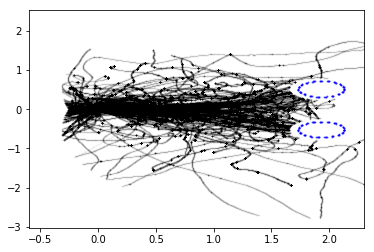

In [413]:

ANGLE = np.round(angle_used*180/math.pi).astype(int)
print('angle between posts:', str(ANGLE))

now= datetime.now()
act_date = now.strftime('%Y-%m-%d')

#trajectories
color = 'black'  # speeds #
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'

'''if type(color) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)'''


#posts (approx size)
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
#plt.scatter(dot_x,dot_y, c='red', s=2900)
#plt.scatter(dot_x,-dot_y, c='blue', s=2900)

#limits of x and y axis
#plt.xlim(-0.6,2.3)
#plt.ylim(-2.3,2.3)
#appropriate size of posts in grey lines
plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+dot_x, np.array(ploY)[i]*0.2+dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.2+dot_x, np.array(ploY)[i]*0.2-dot_y, c='blue', s=1, alpha=0.5)
    
#act_date
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+'_all'+ '.png'
#filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+tstart+ '.png'

speeds[np.where(speeds>4)[0]] = 0
#fig.set_dpi(100)

plt.savefig(filename, dpi=(250))

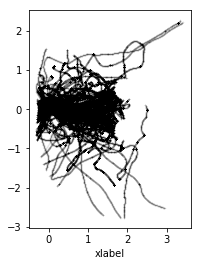

In [430]:


def forceAspect(ax,aspect=1):
    im = ax.get_images()
    extent =  im[0].get_extent()
    ax.set_aspect(abs((extent[5]-extent[1])/(extent[5]-extent[2]))/aspect)

#data = np.random.rand(0,2)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(data)
ax.set_xlabel('xlabel')
ax.set_aspect(1)
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


In [170]:
speeds = np.array(d_v2)[:,0]

In [89]:
#
speeds[np.where(speeds>4)[0]] = 0
speeds[np.where(speeds<0)[0]] = 0


In [90]:
len(speeds)

40802

(array([    0.,     0.,     0.,     0.,     0., 40802.,     0.,     0.,
            0.,     0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <a list of 10 Patch objects>)

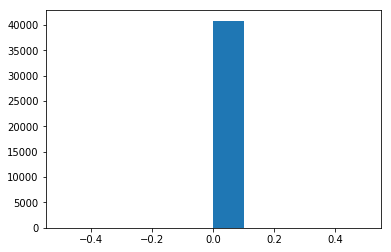

In [91]:
plt.hist(speeds)

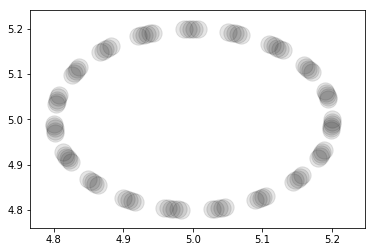

In [68]:
#dot plotting

plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+5, np.array(ploY)[i]*0.2+5, c='black', s=300, alpha=0.1)


In [69]:

df = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0b4dc1ba-58fe-4452-9f75-630dd7cd07a8/results.csv')
df2 = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0cac2ffa-751c-47e2-a60c-a4394f0c3694/results.csv')

df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df2.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df=df.append(df2)

#df, df2

In [70]:
df4 = df[df['nStimuli'] == 4]
df4.head()

,x,y,z,dir,cntr,t,nStimuli
140543,0.953217,-1.785719,-0.07,5.1419,0,720.004008,4
140544,0.000859,-0.001949,-0.07,5.1273,0,720.010600,4
140545,0.000859,-0.001949,-0.07,5.1273,0,720.015738,4
140546,0.000859,-0.001949,-0.07,5.1013,0,720.020855,4
140547,0.000859,-0.001949,-0.07,5.1013,0,720.025957,4


# plotting speed

In [86]:
#taking unrotated x,y values from df3
#if df['nStimuli'][j]== stim:
#print(df3['y'][i])  
#i=10000 

#need of implementation speed in relation to post-distance or starting point distance. otherwise two different locusts 
#plotted on top of each other don't make sense. they need some synchronization which is post-distance?? 
#bifurcation point distance?
window = 150
d_v = []
for i in range(window,(len(df3))): #len(df3)
    d=((((df3['x'][i]-df3['x'][i-window])**2 + (df3['y'][i]-df3['y'][i-window])**2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )

#plt.scatter(np.array(rot)[:,0], np.array(rot)[:,1], c='black', s=1, alpha=0.01)
#plt.scatter(df4['x'], df4['y'], c='black', s=1, alpha=0.01)
    #speed relative to location on x
    d_v.extend([(d*100,df3['x'][i])]) # *100 to get cm/s
    #speed to time
    #d_v.extend([(d*100,df3['t'][i])]) # *100 to get cm/s


In [87]:
#    rot.extend([(rotation(x,y,theta))])
d_v2 =[]
for i in range(window,(len(df3))): #len(df3)
    e=((((rot[i][0]-rot[i-window][0])**2 +       (rot[i][1]-rot[i-window][1]) **2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )
    d_v2.extend([(e*100,rot[i][0])])


(0, 4)

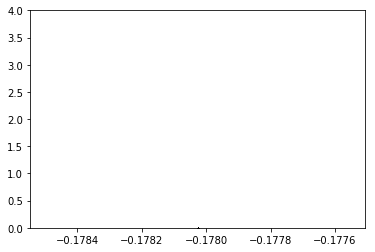

In [85]:
#color can get a list of colors to use for certain ID of the fly /locust

plt.scatter(np.array(d_v2)[50:8000,1], np.array(d_v2)[50:8000,0], c='black', s=0.1, alpha=1)
plt.ylim([0,4])

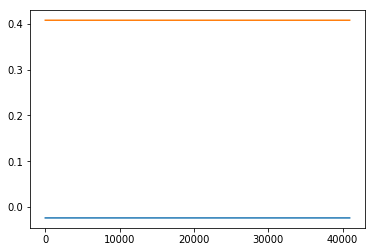

In [74]:
plt.plot(df3['x'][:])
plt.plot(df3['y'][:])
# plt.xlim([8700,11200])

In [79]:
xx = df3['x']
yy = df3['y']
distxxyy = np.sqrt(np.diff(xx)**2+np.diff(yy)**2)
speed = distxxyy/np.diff(tt)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

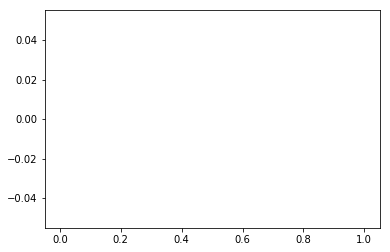

In [80]:
dt = 1/100.0
threshold = np.quantile(distxxyy,0.99)
plt.hist(distxxyy[distxxyy<threshold]/dt)

In [81]:
np.quantile(distxxyy,[0.95,0.99,1])

array([0., 0., 0.])

(array([1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 4.095e+04]),
 array([-719.99910998, -647.69426319, -575.38941641, -503.08456962,
        -430.77972283, -358.47487604, -286.17002926, -213.86518247,
        -141.56033568,  -69.2554889 ,    3.04935789]),
 <a list of 10 Patch objects>)

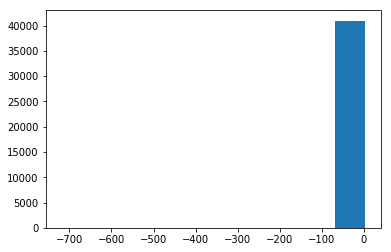

In [82]:
tt  = df3['t']
plt.hist(np.diff(tt))

In [83]:
np.quantile(np.diff(tt),[0.95,0.99,1])

array([0.04771793, 0.05925059, 3.04935789])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

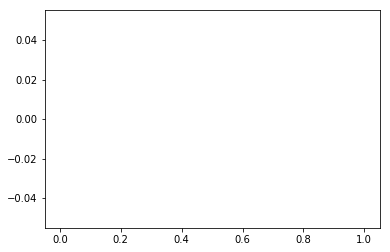

In [84]:
threshold = np.quantile(speed,0.99)
plt.hist(speed[speed<threshold])